## Load libraries

In [205]:
# tensorflow backend
from os import environ
environ['KERAS_BACKEND'] = 'tensorflow'
# vae stuff
from chemvae.vae_utils import VAEUtils
from chemvae import mol_utils as mu
# import scientific py
import numpy as np
import pandas as pd
# rdkit stuff
from rdkit.Chem import AllChem as Chem
from rdkit.Chem import PandasTools
from rdkit import DataStructs
# plotting stuff
import matplotlib.pyplot as plt
import matplotlib as mpl
from IPython.display import SVG, display
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
import pandas as pd
from sklearn.cluster import KMeans
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
IPythonConsole.ipython_useSVG=False
from rdkit.Chem.PandasTools import FrameToGridImage
from rdkit.Chem.rdMolDescriptors import *
from rdkit.Chem.Draw import MolToImage
import IPython
import seaborn

In [2]:
import tensorflow as tf
import sys
print(tf.__version__)
print(sys.version)

1.10.0
3.6.13 | packaged by conda-forge | (default, Feb 19 2021, 05:36:01) 
[GCC 9.3.0]


# Load Model

In [3]:
vae = VAEUtils(directory='models/zinc_properties/')

From /home/kas/anaconda3/envs/chemvae/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:1210: calling reduce_prod (from tensorflow.python.ops.math_ops) with keep_dims is deprecated and will be removed in a future version.
Instructions for updating:
keep_dims is deprecated, use keepdims instead
/home/kas/anaconda3/envs/chemvae/lib/python3.6/site-packages/keras/models.py:245: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '
From /home/kas/anaconda3/envs/chemvae/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:1192: calling reduce_sum (from tensorflow.python.ops.math_ops) with keep_dims is deprecated and will be removed in a future version.
Instructions for updating:
keep_dims is deprecated, use keepdims instead
From /home/kas/anaconda3/envs/chemvae/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:1156: calling reduce_max

Using standarized functions? True
Standarization: estimating mu and std values ...done!


# Using the VAE


## Decode/Encode 

Might not be perfect (it's probabilistic), try it several times.

smiles <i class="fa fa-arrow-right" aria-hidden="true"></i> x <i class="fa fa-arrow-right" aria-hidden="true"></i> z <i class="fa fa-arrow-right" aria-hidden="true"></i> x_r <i class="fa fa-arrow-right" aria-hidden="true"></i> smiles_r

In [4]:
#smiles_1 = mu.canon_smiles('CSCC(=O)NNC(=O)c1c(C)oc(C)c1C')
smiles_1 = mu.canon_smiles('Cc1ccc(C(=O)Nc2ccc(CN3CCN(C)CC3)c(C(F)(F)F)c2)cc1C#Cc1cnc2cccnn12')
X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
z_1 = vae.encode(X_1)
X_r= vae.decode(z_1)

print('{:20s} : {}'.format('Input',smiles_1))
print('{:20s} : {}'.format('Reconstruction',vae.hot_to_smiles(X_r,strip=True)[0]))

print('{:20s} : {} with norm {:.3f}'.format('Z representation',z_1.shape, np.linalg.norm(z_1)))

Input                : Cc1ccc(C(=O)Nc2ccc(CN3CCN(C)CC3)c(C(F)(F)F)c2)cc1C#Cc1cnc2cccnn12
Reconstruction       : Cc1ccc(C(=O)Nc2ccc(CN3CCN(C)CC3)c(C(F)(F)F)c2)C2[C@H]2c2ccccc2)c1
Z representation     : (1, 196) with norm 17.159


## Property Predictor

In [5]:
print('Properties (qed,SAS,logP):')
y_1 = vae.predict_prop_Z(z_1)[0]
print(y_1)

Properties (qed,SAS,logP):
[0.5513052 2.7541976 4.8091726]


## Decode several attempts
VAE are probabilistic

### Add noise to the latent variable and attempt to decode and feed through RDKIT, determine how many are valid molecules

In [6]:
from rdkit.Chem import AllChem as Chem
def smiles_to_mol(smiles):
    try:
        mol = Chem.MolFromSmiles(smiles)
        return mol
    except:
        pass
    return None
def balanced_parentheses(input_string):
    s = []
    balanced = True
    index = 0
    while index < len(input_string) and balanced:
        token = input_string[index]
        if token == "(":
            s.append(token)
        elif token == ")":
            if len(s) == 0:
                balanced = False
            else:
                s.pop()

        index += 1

    return balanced and len(s) == 0


def matched_ring(s):
    return s.count('1') % 2 == 0 and s.count('2') % 2 == 0


def fast_verify(s):
    return matched_ring(s) and balanced_parentheses(s)

In [7]:
noise=3.0
Z = np.tile(z_1, (25, 1))
Z = vae.perturb_z(Z, noise_norm=noise)
X = vae.decode(Z)
smiles = vae.hot_to_smiles(X, strip=True)
df = pd.DataFrame({'smiles': smiles})
sort_df = pd.DataFrame(df[['smiles']].groupby(
            by='smiles').size().rename('count').reset_index())
df = df.merge(sort_df, on='smiles')
df.drop_duplicates(subset='smiles', inplace=True)
df = df[df['smiles'].apply(fast_verify)]
#if len(df) > 0:
    #df['mol'] = df['smiles'].apply(mu.smiles_to_mol)
    #df = df[pd.notnull(df['mol'])]
   # df['distance'] = vae.smiles_distance_z(df['smiles'], z_1)
   # df['frequency'] = df['count'] / float(sum(df['count']))
    #df = df[['smiles', 'distance', 'count', 'frequency', 'mol']]
    #df.sort_values(by='distance', inplace=True)
    #df.reset_index(drop=True, inplace=True)
#df = vae.prep_mol_df(smiles, z_1)
#print('Searching molecules randomly sampled from {:.2f} std (z-distance) from the point'.format(noise))
#df = vae.z_to_smiles( z_1,decode_attempts=100,noise_norm=0.0) #this is the line
#print('Found {:d} unique mols, out of {:d}'.format(len(set(df['smiles'])),sum(df['count'])))
#print(df.info())
#print('SMILES\n',df.smiles)
#display(PandasTools.FrameToGridImage(df,column='mol', legendsCol='smiles',molsPerRow=5))
df.head()

,smiles,count
6,C(c1cc(C(=O)Nc2ccc(CN3CN(=C)CC3)c(C(F)(F)F)c2)...,1
10,Cc1ccc(C(=O)Nc2ccc(CN3CCN(C)CC4)c(C(F)(F)F)c2)...,1
12,Cc1ccc(C(=O)Nc2ccc(CN3C(N(C)CC3)c(C(F)(F)F)c2)...,1
13,Cc1ccc(C(=O)Nc2ccc(CN3C(N(C)CC4)c(C(F)(F)F)c2)...,1
17,Cc1ccc(C(=O)Nc2ccc(CN3CCN(C)CC4)c(C(F)(F)F)c2)...,1


## PCA of latent space

Sample random points from the training set along with properties

In [8]:
Z, data, smiles = vae.ls_sampler_w_prop(size=50000,return_smiles=True)
prop_opt = 'qed'
prop_df = pd.DataFrame(data).reset_index()
prop_df['smiles']=smiles
prop_df.head()

,index,logP,qed,SAS,smiles
0,188234,-0.63950,0.806719,4.150783,c1cnc(N2CC[NH+](C[C@H]3CCCO3)CC2)nc1
1,165470,1.44020,0.596167,2.867829,O=C(Cn1nc(-c2ccco2)ccc1=O)N=c1[nH]c2ccccc2[nH]1
2,64503,0.47030,0.519096,3.960367,COC(=O)[C@H]1O[C@@H](Oc2ccc3c(c2)OC[C@H](c2ccc...
3,109625,4.76664,0.672454,3.286340,Cc1csc([C@@H](C)NC(=O)N[C@H](C)c2oc3ccc(F)cc3c...
4,151723,4.26212,0.398859,1.926766,CC(=O)c1ccc(OC(=O)c2ccc(C)c(NC(=O)c3ccco3)c2)cc1


Perform a PCA projection and color the points based on a property

In [9]:
prop_df.head()

,index,logP,qed,SAS,smiles
0,188234,-0.63950,0.806719,4.150783,c1cnc(N2CC[NH+](C[C@H]3CCCO3)CC2)nc1
1,165470,1.44020,0.596167,2.867829,O=C(Cn1nc(-c2ccco2)ccc1=O)N=c1[nH]c2ccccc2[nH]1
2,64503,0.47030,0.519096,3.960367,COC(=O)[C@H]1O[C@@H](Oc2ccc3c(c2)OC[C@H](c2ccc...
3,109625,4.76664,0.672454,3.286340,Cc1csc([C@@H](C)NC(=O)N[C@H](C)c2oc3ccc(F)cc3c...
4,151723,4.26212,0.398859,1.926766,CC(=O)c1ccc(OC(=O)c2ccc(C)c(NC(=O)c3ccco3)c2)cc1


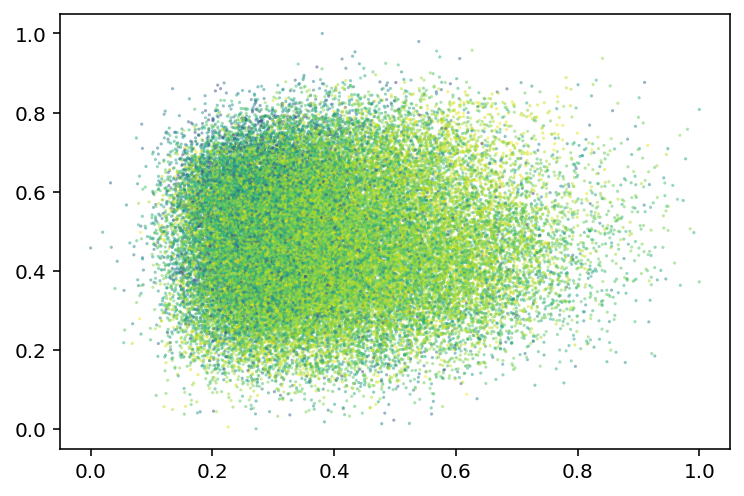

In [10]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

# do pca and normalize
Z_pca = PCA(n_components=2).fit_transform(Z)
Z_pca = MinMaxScaler().fit_transform(Z_pca)

df = pd.DataFrame(np.transpose((Z_pca[:,0],Z_pca[:,1])))
df.columns = ['x','y']
df[prop_opt]=prop_df[prop_opt]

plt.scatter(x=df['x'], y=df['y'], c=df[prop_opt],
            cmap= 'viridis', marker='.',
            s=10,alpha=0.5, edgecolors='none')
plt.show()

compare with t-SNE, will take some time

# Ingestion of GDB-17 Molecules, ABL1 Kinase Inhibitors, and SRC Kinase Inhibitors

In [11]:
Z.shape

(50000, 196)

In [12]:
with open('GDB17.50000000LL','r') as file:
    gdb_smiles = np.array([x.strip('\n') for x in file.readlines()])

In [13]:
with open('SRC-observations.smi','r') as file:
    src_smiles = file.readlines()

In [187]:
with open('ABL1-observations.smi','r') as file:
    abl1_smiles = file.readlines()

In [15]:
with open('data/EGFR.smi','r') as file:
    egfr_smiles = file.readlines()

In [16]:
with open('data/CSF1R.smi','r') as file:
    csf1r_smiles = file.readlines()

In [17]:
with open('data/FLT3.smi','r') as file:
    flt3_smiles = file.readlines()

In [18]:
with open('data/KDR.smi','r') as file:
    kdr_smiles = file.readlines()

In [19]:
with open('data/LCK.smi','r') as file:
    lck_smiles = file.readlines()

In [20]:
with open('data/MAPK10.smi','r') as file:
    mapk10_smiles = file.readlines()

In [21]:
with open('data/MAPK14.smi','r') as file:
    mapk14_smiles = file.readlines()

In [22]:
with open('data/MET.smi','r') as file:
    met_smiles = file.readlines()

In [23]:
len(gdb_smiles)

11487778

In [24]:
indeces = np.random.random_integers(0,1148787,114878)
gdb_smiles_sample = gdb_smiles[indeces]
gdb_smiles_sample.shape

/home/kas/anaconda3/envs/chemvae/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: This function is deprecated. Please call randint(0, 1148787 + 1) instead
  """Entry point for launching an IPython kernel.


(114878,)

# Preprocessing of Molecules

In [25]:
indeces

array([ 614769,  577090,  210005, ...,   47894, 1067471,  174400])

In [189]:
abl1_smiles = [x.split(' ')[0] for x in abl1_smiles[1:]]

In [27]:
src_smiles = [x.split(' ')[0] for x in src_smiles][1:]

In [192]:
abl = pd.DataFrame()
abl['smiles'] = abl1_smiles
PandasTools.AddMoleculeColumnToFrame(abl, smilesCol='smiles')
PandasTools.SaveXlsxFromFrame(abl, "KnownMol_ABL1.xlsx", molCol='ROMol')

# Encoding GDB-17, ABL1, and SRC into Latent Space with VAE

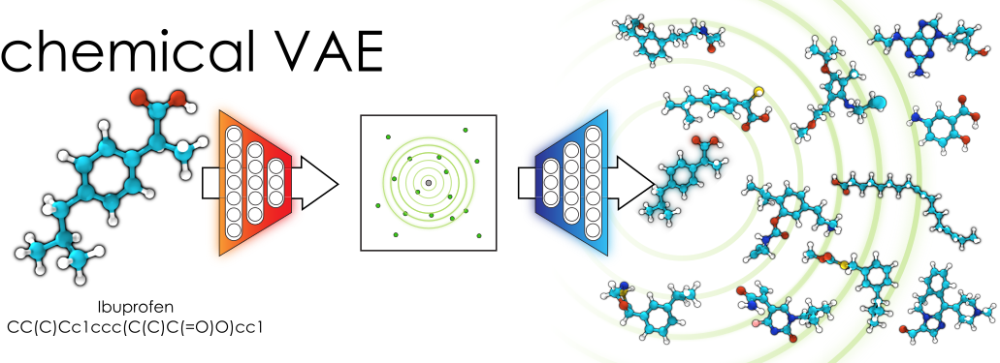

In [28]:
def encode_pandas_apply(smiles_1):
    try:
        smiles_1 = mu.canon_smiles(smiles_1)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        return vae.encode(X_1)
    except:
        return 'N/A'

In [29]:

#df = pd.DataFrame(gdb_smiles)
#temp = df[0].apply(lambda x :encode_pandas_apply(x))
#type(temp)

In [30]:
#temp[0].min(), temp[0].max()

In [31]:
df_s = pd.DataFrame(src_smiles)
temp_s = df_s[0].apply(lambda x :encode_pandas_apply(x))
temp_s[0].min(), temp_s[0].max()

ERROR: Check chars file. Bad SMILES: COc1cc(C2=C(c3cn(COCC[Si](C)(C)C)c4ccccc34)CNC2=O)cc(OC)c1OC                                                            


(-3.8282589068734088, 3.2922207758711437)

In [32]:
df_a = pd.DataFrame(abl1_smiles)
temp_a = df_a[0].apply(lambda x :encode_pandas_apply(x))
temp_a[0].min(), temp_a[0].max()

(-2.898131470123389, 2.72385731613358)

In [33]:
len(gdb_smiles)

11487778

## Encoding GDB Molecules

In [34]:
encoded_gdb_smiles_raw = []
counter = 0
for i in gdb_smiles_sample:
    if counter %100  ==0:
        print(counter)
    counter +=1
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        encoded_gdb_smiles_raw.append(vae.encode(X_1))
    except:
        print(i)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300
18400
18

## Encoding ABL1 Molecules

In [35]:
en_abl1_smiles = []
encoded_abl1_smiles_raw = []
for i in abl1_smiles:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        encoded_abl1_smiles_raw.append(vae.encode(X_1))
        en_abl1_smiles.append(i)
    except:
        print(i)

CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(OP(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(C(F)(F)P(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(C(F)(F)P(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O


## Encoding SRC Molecules

In [36]:
master_smiles_index = []
ms_index = 0
encoded_src_smiles_raw = []
en_src_smiles= []
for i in src_smiles:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        encoded_src_smiles_raw.append(vae.encode(X_1))
        en_src_smiles.append(i)
    except:
        print(i)
        master_smiles_index.append(ms_index)
    ms_index += 1

COc1cc2c(cc1O)CCN[C@]21CS[C@H]2c3c(OC(C)=O)c(C)c4c(c3[C@@H](COC1=O)N1[C@@H](O)[C@@H]3Cc5cc(C)c(OC)c(O)c5[C@H]([C@H]21)N3C)OCO4
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(P(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](CCC(=O)O)NC(=O)[C@@H](Cc1ccc(OP(=O)(O)O)cc1)c1cccc(O)c1)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](CCC(=O)O)NC(=O)[C@@H](Cc1ccc(OP(=O)(O)O)cc1)c1cccc(O)c1)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](Cc1ccc(OP(=O)(O)O)cc1)c1cccc(O)c1)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](Cc1ccc(OP(=O)(O)O)cc1)c1cccc(O)c1)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@@H]1NC(=O)[C@H](CS)NC(=O)[C@H](Cc2ccc(O)cc2)NC(=O)[C@H](Cc2ccc(O)cc2)NC(=O)[C@H](CCCCN)NC(=O)[C@H](Cc2ccc(O)cc2)NC1=O
CC[C@@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1cc

## Encoding CSF1R Molecules

In [37]:
en_csf1r_smiles = []
encoded_csf1r_smiles_raw = []
for i in csf1r_smiles:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        encoded_csf1r_smiles_raw.append(vae.encode(X_1))
        en_csf1r_smiles.append(i)
    except:
        print(i)

In [461]:
len(encoded_csf1r_smiles_raw)

662

## Encoding EGFR Molecules

In [38]:
en_egfr_smiles = []
encoded_egfr_smiles_raw = []
for i in egfr_smiles:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        encoded_egfr_smiles_raw.append(vae.encode(X_1))
        en_egfr_smiles.append(i)
    except:
        print(i)

CC(=O)O[C@@]12CO[C@@H]1C[C@H](O)[C@@]1(C)C(=O)[C@H](O)C3=C(C)[C@@H](OC(=O)[C@H](O)[C@@H](NC(=O)OC(C)(C)C)c4ccccc4)C[C@@](O)([C@@H](OC(=O)c4ccccc4)[C@@H]12)C3(C)C



In [460]:
len(encoded_egfr_smiles_raw)

3971

## Encoding FLT3 Molecules

In [39]:
en_flt3_smiles = []
encoded_flt3_smiles_raw = []
for i in flt3_smiles:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        encoded_flt3_smiles_raw.append(vae.encode(X_1))
        en_flt3_smiles.append(i)
    except:
        print(i)

In [459]:
len(encoded_flt3_smiles_raw)

1058

## Encoding KDR Molecules

In [40]:
en_kdr_smiles = []
encoded_kdr_smiles_raw = []
for i in kdr_smiles:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        encoded_kdr_smiles_raw.append(vae.encode(X_1))
        en_kdr_smiles.append(i)
    except:
        print(i)

ERROR: Check chars file. Bad SMILES: COc1cc(C2=C(c3cn(COCC[Si](C)(C)C)c4ccccc34)CNC2=O)cc(OC)c1OC                                                            
COc1cc(C2=C(c3cn(COCC[Si](C)(C)C)c4ccccc34)CNC2=O)cc(OC)c1OC

COc1cc2c(Nc3ccc(Cl)cc3F)ncnc2cc1OCCOCCNC(=O)[C@H](CCCCNC(=O)CCCC[C@@H]1SC[C@H]2NC(=O)N[C@@H]21)NC(=O)c1c(F)c(F)c(N=[N+]=[N-])c(F)c1F

COc1cc2c(Nc3ccc(Cl)cc3F)ncnc2cc1OCCOCCNC(=O)[C@H](CCCCNC(=O)CCCC[C@@H]1SC[C@@H]2NC(=O)N[C@H]12)NC(=O)c1c(F)c(F)c(N=[N+]=[N-])c(F)c1F

COc1cc2c(Nc3ccc(Cl)cc3F)ncnc2cc1OCCOCCNC(=O)[C@H](CCCCNC(=O)CCCC[C@@H]1SC[C@H]2NC(=O)N[C@H]21)NC(=O)c1c(F)c(F)c(N=[N+]=[N-])c(F)c1F

COc1cc2c(Nc3ccc(Cl)cc3F)ncnc2cc1OCCOCCNC(=O)[C@H](CCCCNC(=O)CCCC[C@@H]1SC[C@@H]2NC(=O)N[C@@H]12)NC(=O)c1c(F)c(F)c(N=[N+]=[N-])c(F)c1F



In [458]:
len(encoded_kdr_smiles_raw)

4525

## Encoding LCK Molecules

In [41]:
en_lck_smiles = []
encoded_lck_smiles_raw = []
for i in lck_smiles:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        encoded_lck_smiles_raw.append(vae.encode(X_1))
        en_lck_smiles.append(i)
    except:
        print(i)

CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(OP(=O)(O)O)cc1)N/C=C/c1ccc(O)c(O)c1)C(=O)N[C@@H](CCC(=O)O)C(=O)O

CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(OP(=O)(O)O)cc1)NOC(=O)Cc1cc(=O)oc2cc(O)ccc12)C(=O)N[C@@H](CCC(=O)O)C(=O)O

CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(OP(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O

CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(OP(=O)(O)O)cc1)NC(C)=O)C(=O)N1CCC[C@@H]1C(=O)NC

Nc1ncnc2c1ncn2CC(=O)N(CCNC(=O)CCCNC(=O)[C@H](Cc1ccc(C(=O)c2ccccc2)cc1)NC(=O)CCCNC(=O)CCCC[C@@H]1SC[C@@H]2NC(=O)N[C@H]12)CC(=O)NCC(=O)O



In [457]:
len(encoded_lck_smiles_raw)

1554

## Encoding MAPK10 Molecules

In [42]:
en_mapk10_smiles = []
encoded_mapk10_smiles_raw = []
for i in mapk10_smiles:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        encoded_mapk10_smiles_raw.append(vae.encode(X_1))
        en_mapk10_smiles.append(i)
    except:
        print(i)

In [456]:
len(encoded_mapk10_smiles_raw)

859

## Encoding MAPK14 Molecules

In [43]:
en_mapk14_smiles = []
encoded_mapk14_smiles_raw = []
for i in mapk14_smiles:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        encoded_mapk14_smiles_raw.append(vae.encode(X_1))
        en_mapk14_smiles.append(i)
    except:
        print(i)

In [455]:
len(encoded_mapk14_smiles_raw)

3659

## Encoding MET Molecules

In [44]:
en_met_smiles = []
encoded_met_smiles_raw = []
for i in met_smiles:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        encoded_met_smiles_raw.append(vae.encode(X_1))
        en_met_smiles.append(i)
    except:
        print(i)

ERROR: Check chars file. Bad SMILES: CC(C)(C)[Si](C)(C)O[C@H]1CC[C@H](n2cc(-c3ccc4cnn(Cc5ccc6ncccc6c5)c4c3)cn2)CC1                                           
CC(C)(C)[Si](C)(C)O[C@@H]1CC[C@@H](n2cc(-c3ccc4cnn(Cc5ccc6ncccc6c5)c4c3)cn2)CC1



In [454]:
len(encoded_met_smiles_raw)

2081

# Function for RDKit Attributes

In [45]:
def get_attributes(dataframe):
    num_rings = []
    aspher = []
    eccent = []
    weight = []
    csp3 = []
    hallkier = []
    inertshape = []
    laputeASA = []
    alicarbo = []
    alihetero = []
    alirings = []
    amidebonds = []
    arocarbo = []
    arohetero = []
    arorings = []
    num_stereocenter = []
    bridgehead = []
    hba = []
    hbd = []
    rotatable = []
    for index, row in dataframe.iterrows():
        temp_ring = CalcNumRings(row['mol'])
        #temp_asph = CalcAsphericity(row['mol'])
        #temp_eccent = CalcEccentricity(row['mol'])
        temp_weight = CalcExactMolWt(row['mol'])
        temp_csp3 = CalcFractionCSP3(row['mol'])
        temp_hallkier = CalcHallKierAlpha(row['mol'])
        #temp_inertshape = CalcInertialShapeFactor(row['mol'])
        temp_lapute = CalcLabuteASA(row['mol'])
        temp_alicarbo = CalcNumAliphaticCarbocycles(row['mol'])
        temp_alihetero = CalcNumAliphaticHeterocycles(row['mol'])
        temp_alirings = CalcNumAliphaticRings(row['mol'])
        temp_amidebonds = CalcNumAmideBonds(row['mol'])
        temp_arocarbo = CalcNumAromaticCarbocycles(row['mol'])
        temp_arohetero = CalcNumAromaticHeterocycles(row['mol'])
        temp_arorings = CalcNumAromaticRings(row['mol'])
        temp_stereocenter = CalcNumAtomStereoCenters(row['mol'])
        temp_bridgehead = CalcNumBridgeheadAtoms(row['mol'])
        temp_hba = CalcNumHBA(row['mol'])
        temp_hbd = CalcNumHBD(row['mol'])
        temp_rotatable = CalcNumRotatableBonds(row['mol'])

        num_rings.append(temp_ring)
        weight.append(temp_weight)
        csp3.append(temp_csp3)
        hallkier.append(temp_hallkier)
        laputeASA.append(temp_lapute)
        alicarbo.append(temp_alicarbo)
        alihetero.append(temp_alihetero)
        alirings.append(temp_alirings)
        amidebonds.append(temp_amidebonds)
        arocarbo.append(temp_arocarbo)
        arohetero.append(temp_arohetero)
        arorings.append(temp_arorings)
        num_stereocenter.append(temp_stereocenter)
        bridgehead.append(temp_bridgehead)
        hba.append(temp_hba)
        hbd.append(temp_hbd)
        rotatable.append(temp_rotatable)

    dataframe['rings'] = num_rings
    dataframe['weight'] = weight
    dataframe['csp3'] = csp3
    dataframe['hallkier'] = hallkier
    dataframe['laputeASA'] = laputeASA
    dataframe['alicarbo'] = alicarbo
    dataframe['alihetero'] = alihetero
    dataframe['alirings'] = alirings
    dataframe['amidebonds'] = amidebonds
    dataframe['arocarbo'] = arocarbo
    dataframe['arohetero'] = arohetero
    dataframe['arorings'] = arorings
    dataframe['stereocenter'] = num_stereocenter
    dataframe['bridgehead'] = bridgehead
    dataframe['hba'] = hba
    dataframe['hbd'] = hbd
    dataframe['rotatable'] = rotatable
    
    return dataframe

In [46]:
#gdb_df = pd.DataFrame(encoded_gdb_smiles_raw)
encoded_abl1_smiles_raw = np.array(encoded_abl1_smiles_raw)
encoded_src_smiles_raw = np.array(encoded_src_smiles_raw)
encoded_csf1r_smiles_raw = np.array(encoded_csf1r_smiles_raw)
encoded_egfr_smiles_raw = np.array(encoded_egfr_smiles_raw)
encoded_flt3_smiles_raw = np.array(encoded_flt3_smiles_raw)
encoded_kdr_smiles_raw = np.array(encoded_kdr_smiles_raw)
encoded_lck_smiles_raw = np.array(encoded_lck_smiles_raw)
encoded_mapk10_smiles_raw = np.array(encoded_mapk10_smiles_raw)
encoded_mapk14_smiles_raw = np.array(encoded_mapk14_smiles_raw)
encoded_met_smiles_raw = np.array(encoded_met_smiles_raw)

encoded_abl1_smiles_raw = encoded_abl1_smiles_raw.reshape((encoded_abl1_smiles_raw.shape[0], 196))
encoded_src_smiles_raw = encoded_src_smiles_raw.reshape((encoded_src_smiles_raw.shape[0], 196))
encoded_csf1r_smiles_raw = encoded_csf1r_smiles_raw.reshape((encoded_csf1r_smiles_raw.shape[0], 196))
encoded_egfr_smiles_raw = encoded_egfr_smiles_raw.reshape((encoded_egfr_smiles_raw.shape[0], 196))
encoded_flt3_smiles_raw = encoded_flt3_smiles_raw.reshape((encoded_flt3_smiles_raw.shape[0], 196))
encoded_kdr_smiles_raw = encoded_kdr_smiles_raw.reshape((encoded_kdr_smiles_raw.shape[0], 196))
encoded_lck_smiles_raw = encoded_lck_smiles_raw.reshape((encoded_lck_smiles_raw.shape[0], 196))
encoded_mapk10_smiles_raw = encoded_mapk10_smiles_raw.reshape((encoded_mapk10_smiles_raw.shape[0], 196))
encoded_mapk14_smiles_raw = encoded_mapk14_smiles_raw.reshape((encoded_mapk14_smiles_raw.shape[0], 196))
encoded_met_smiles_raw = encoded_met_smiles_raw.reshape((encoded_met_smiles_raw.shape[0], 196))


abl1_df = pd.DataFrame(encoded_abl1_smiles_raw)
src_df = pd.DataFrame(encoded_src_smiles_raw)
csf1r_df = pd.DataFrame(encoded_csf1r_smiles_raw)
egfr_df = pd.DataFrame(encoded_egfr_smiles_raw)
flt3_df = pd.DataFrame(encoded_flt3_smiles_raw)
kdr_df = pd.DataFrame(encoded_kdr_smiles_raw)
lck_df = pd.DataFrame(encoded_lck_smiles_raw)
mapk10_df = pd.DataFrame(encoded_mapk10_smiles_raw)
mapk14_df = pd.DataFrame(encoded_mapk14_smiles_raw)
met_df = pd.DataFrame(encoded_met_smiles_raw)

frames = [abl1_df,csf1r_df,egfr_df,flt3_df,kdr_df,lck_df,mapk10_df,mapk14_df,met_df]
totality_df = pd.concat(frames,ignore_index=True)
display(totality_df)

,0,1,2,3,4,5,6,7,8,9,...,186,187,188,189,190,191,192,193,194,195
0,1.665042,-0.104827,-0.300950,0.175434,-0.093449,-0.984155,-0.212531,-1.271550,-0.501611,1.040248,...,1.206171,-0.792408,0.646320,0.590224,0.338711,0.390050,0.475636,0.443631,0.533784,-0.311341
1,-0.483685,0.405742,-0.027043,-1.333383,-0.031954,-1.821628,0.275361,-1.240043,1.051909,-0.096225,...,0.482370,0.389165,0.344219,0.538565,-0.513325,0.025405,-0.278937,0.437943,1.216993,-1.454782
2,-0.791119,-1.187448,0.102953,-0.820079,0.900540,-0.135560,-0.004650,-0.958357,0.757843,0.257848,...,0.087881,-0.849537,-1.622831,0.637362,-0.170314,1.100069,-0.356466,-0.539382,-0.085694,-2.228292
3,-0.791119,-1.187448,0.102953,-0.820079,0.900540,-0.135560,-0.004650,-0.958357,0.757843,0.257848,...,0.087881,-0.849537,-1.622831,0.637362,-0.170314,1.100069,-0.356466,-0.539382,-0.085694,-2.228292
4,-0.643950,-0.352324,-0.722197,0.012529,0.782830,-1.057470,0.064636,-0.205656,-1.024865,1.827795,...,-0.084781,0.126874,-0.720295,0.215514,-0.602243,-1.144885,-1.070073,0.260201,1.428247,-0.943968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20247,-0.523233,0.624184,-1.195946,-1.797912,1.455308,-2.374752,1.554453,0.577315,0.510602,0.137113,...,1.726842,-0.439082,-0.591058,0.853823,-0.331444,0.900106,1.502837,-1.315170,1.785257,-1.218411
20248,-0.053659,-0.329400,-0.371173,-0.695339,-0.032980,-1.381563,-0.788461,-2.606749,0.283326,0.993839,...,0.335191,-2.607691,-0.690168,1.621186,-1.729222,1.246672,0.295745,-0.757762,1.390708,0.486520
20249,-0.905575,-1.419698,1.971115,-0.545808,0.819289,-1.513278,-0.724696,-0.620860,-0.276950,-0.380429,...,0.954407,-0.816173,0.783445,0.891004,0.201033,-1.254857,-1.438353,-0.374444,-1.238867,-0.958148
20250,-0.420511,0.141016,-0.361848,-0.825495,0.340854,-0.594317,0.784933,1.162388,-1.284547,2.308047,...,1.065516,-0.319512,1.105309,-0.488606,-0.525223,-0.203531,0.916187,1.069433,1.575715,0.086057


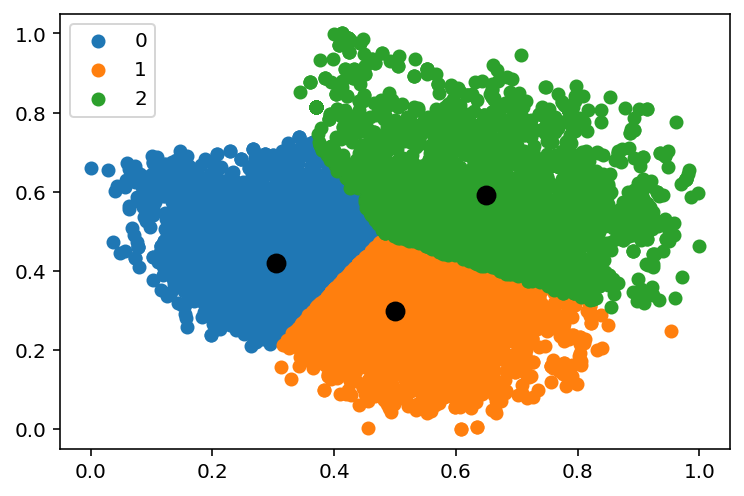

In [47]:
from sklearn.cluster import KMeans

from sklearn.decomposition import PCA
Z_pca = PCA(n_components=2).fit_transform(totality_df)
Z_pca = MinMaxScaler().fit_transform(Z_pca)

kmeans = KMeans(n_clusters=3, n_init=100)
y = kmeans.fit_predict(Z_pca)

centroids = kmeans.cluster_centers_
labels = np.unique(y)

for i in labels:
    plt.scatter(Z_pca[y == i, 0], Z_pca[y == i, 1], label=i)
plt.scatter(centroids[:,0], centroids[:,1], s=80, color='k')
plt.legend()
plt.savefig('KMeans.png',dpi=500)
plt.show()

# Means and Standard Deviations of Latent Space

In [48]:
encoded_gdb_smiles_raw = np.array(encoded_gdb_smiles_raw).reshape(len(encoded_gdb_smiles_raw), 196)
encoded_abl1_smiles_raw = np.array(encoded_abl1_smiles_raw).reshape(len(encoded_abl1_smiles_raw), 196)
encoded_src_smiles_raw = np.array(encoded_src_smiles_raw).reshape(len(encoded_src_smiles_raw), 196)
encoded_csf1r_smiles_raw = np.array(encoded_csf1r_smiles_raw).reshape(len(encoded_csf1r_smiles_raw), 196)
encoded_egfr_smiles_raw = np.array(encoded_egfr_smiles_raw).reshape(len(encoded_egfr_smiles_raw), 196)
encoded_flt3_smiles_raw = np.array(encoded_flt3_smiles_raw).reshape(len(encoded_flt3_smiles_raw), 196)
encoded_kdr_smiles_raw = np.array(encoded_kdr_smiles_raw).reshape(len(encoded_kdr_smiles_raw), 196)
encoded_lck_smiles_raw = np.array(encoded_lck_smiles_raw).reshape(len(encoded_lck_smiles_raw), 196)
encoded_mapk10_smiles_raw = np.array(encoded_mapk10_smiles_raw).reshape(len(encoded_mapk10_smiles_raw), 196)
encoded_mapk14_smiles_raw = np.array(encoded_mapk14_smiles_raw).reshape(len(encoded_mapk14_smiles_raw), 196)
encoded_met_smiles_raw = np.array(encoded_met_smiles_raw).reshape(len(encoded_met_smiles_raw), 196)

In [49]:
gdb_df = pd.DataFrame(encoded_gdb_smiles_raw)
abl1_df = pd.DataFrame(encoded_abl1_smiles_raw)
src_df = pd.DataFrame(encoded_src_smiles_raw)
csf1r_df = pd.DataFrame(encoded_csf1r_smiles_raw)
egfr_df = pd.DataFrame(encoded_egfr_smiles_raw)
flt3_df = pd.DataFrame(encoded_flt3_smiles_raw)
kdr_df = pd.DataFrame(encoded_kdr_smiles_raw)
lck_df = pd.DataFrame(encoded_lck_smiles_raw)
mapk10_df = pd.DataFrame(encoded_mapk10_smiles_raw)
mapk14_df = pd.DataFrame(encoded_mapk14_smiles_raw)
met_df = pd.DataFrame(encoded_met_smiles_raw)

## Means

In [50]:
gdb_mean = gdb_df.mean(axis = 0)
abl1_mean = abl1_df.mean(axis = 0)
src_mean = src_df.mean(axis = 0)
csf1r_mean = csf1r_df.mean(axis = 0)
egfr_mean = egfr_df.mean(axis = 0)
flt3_mean = flt3_df.mean(axis = 0)
kdr_mean = kdr_df.mean(axis = 0)
lck_mean = lck_df.mean(axis = 0)
mapk10_mean = mapk10_df.mean(axis = 0)
mapk14_mean = mapk14_df.mean(axis = 0)
met_mean = met_df.mean(axis = 0)

In [51]:
latent_space_mean_df = pd.concat(
    [gdb_mean,abl1_mean,src_mean,csf1r_mean,egfr_mean,flt3_mean,kdr_mean,lck_mean,mapk10_mean,mapk14_mean,met_mean], 
    axis=1,
    ignore_index=True)
header = ['GDB','ABL1','SRC','CSF1R','EGFR','FLT3','KDR','LCK','MAPK10','MAPK14','MET']
latent_space_mean_df.columns=header
display(latent_space_mean_df)

,GDB,ABL1,SRC,CSF1R,EGFR,FLT3,KDR,LCK,MAPK10,MAPK14,MET
0,0.298298,0.278894,0.132238,0.201062,0.071122,0.062497,0.254810,0.155333,0.093952,-0.004121,0.227425
1,-0.312507,-0.644804,-0.741100,-0.485592,-0.534358,-0.399339,-0.535800,-0.661419,-0.416853,-0.529404,-0.768961
2,0.104236,-0.491172,-0.445605,-0.459091,-0.499693,-0.384114,-0.447673,-0.629106,-0.261600,-0.582558,-0.343074
3,0.347848,-0.418703,-0.533230,-0.264549,-0.592376,-0.513629,-0.568824,-0.554439,-0.565141,-0.415784,-0.695447
4,0.610373,0.534569,0.550979,0.319416,0.562348,0.650139,0.637988,0.490787,0.701192,0.334666,0.985718
...,...,...,...,...,...,...,...,...,...,...,...
191,0.921143,-0.191561,-0.088169,-0.190386,0.087546,0.053998,0.168236,0.073697,0.160180,0.061580,-0.120818
192,0.875877,0.150644,0.168069,-0.029120,0.034958,-0.122641,0.054638,0.047472,-0.014669,0.055061,0.157466
193,-0.191377,0.104468,0.042927,0.028132,-0.173825,0.031384,0.037305,-0.074751,0.031880,0.112003,-0.139380
194,-0.250245,1.214531,1.245120,1.087075,1.192836,1.069295,1.248629,1.331068,1.066244,1.436973,1.250687


## Standard Deviations

In [52]:
gdb_std = gdb_df.std(axis = 0)
abl1_std = abl1_df.std(axis = 0)
src_std = src_df.std(axis = 0)
csf1r_std = csf1r_df.std(axis = 0)
egfr_std = egfr_df.std(axis = 0)
flt3_std = flt3_df.std(axis = 0)
kdr_std = kdr_df.std(axis = 0)
lck_std = lck_df.std(axis = 0)
mapk10_std = mapk10_df.std(axis = 0)
mapk14_std = mapk14_df.std(axis = 0)
met_std = met_df.std(axis = 0)

In [53]:
latent_space_std_df = pd.concat(
    [gdb_std, abl1_std,src_std,csf1r_std,egfr_std,flt3_std,kdr_std,lck_std,mapk10_std,mapk14_std,met_std], 
    axis=1,
    ignore_index=True)
header = ['GDB','ABL1','SRC','CSF1R','EGFR','FLT3','KDR','LCK','MAPK10','MAPK14','MET']
latent_space_std_df.columns=header
display(latent_space_std_df)

,GDB,ABL1,SRC,CSF1R,EGFR,FLT3,KDR,LCK,MAPK10,MAPK14,MET
0,0.757959,1.097397,1.202647,1.096578,1.156017,1.122819,1.126715,1.059638,1.122843,1.079601,1.142523
1,0.813920,1.217511,1.154613,0.972103,1.194099,1.108559,1.077746,1.123821,1.024393,1.145392,1.274383
2,0.705327,1.071814,1.037295,0.937039,1.005348,0.975365,0.973920,1.072550,1.003107,1.059260,1.037805
3,0.806054,1.255456,1.179194,1.332528,1.138801,1.155922,1.083364,1.155641,1.081248,1.049099,1.206205
4,0.829724,1.024628,1.108974,1.119068,1.023747,1.007026,1.051385,0.995204,1.022848,1.044669,1.069936
...,...,...,...,...,...,...,...,...,...,...,...
191,0.928461,1.168209,1.160422,1.014209,1.171665,1.015538,1.132979,1.173364,1.089335,1.138160,1.124546
192,0.759945,1.001524,1.003683,1.037628,0.956328,1.017375,0.934229,1.024191,1.001531,0.983613,1.060663
193,0.834151,1.222076,1.259949,1.074240,1.121170,1.056084,1.054516,1.222828,1.024847,1.069623,1.061484
194,0.507818,0.893535,1.079018,0.721231,0.972265,0.800406,0.932075,0.962564,0.806457,0.833907,1.044148


# Centroids of Each Kinase Inhibitor within the Latent Space

In [54]:
gdb_centroid = np.average(encoded_gdb_smiles_raw, axis=0).reshape(1, len(encoded_gdb_smiles_raw[1]))
abl1_centroid = np.average(encoded_abl1_smiles_raw, axis=0).reshape(1, len(encoded_abl1_smiles_raw[1]))
src_centroid = np.average(encoded_src_smiles_raw, axis=0).reshape(1, len(encoded_src_smiles_raw[1]))
csf1r_centroid = np.average(encoded_csf1r_smiles_raw, axis=0).reshape(1, len(encoded_csf1r_smiles_raw[1]))
egfr_centroid = np.average(encoded_egfr_smiles_raw, axis=0).reshape(1, len(encoded_egfr_smiles_raw[1]))
flt3_centroid = np.average(encoded_flt3_smiles_raw, axis=0).reshape(1, len(encoded_flt3_smiles_raw[1]))
kdr_centroid = np.average(encoded_kdr_smiles_raw, axis=0).reshape(1, len(encoded_kdr_smiles_raw[1]))
lck_centroid = np.average(encoded_lck_smiles_raw, axis=0).reshape(1, len(encoded_lck_smiles_raw[1]))
mapk10_centroid = np.average(encoded_mapk10_smiles_raw, axis=0).reshape(1, len(encoded_mapk10_smiles_raw[1]))
mapk14_centroid = np.average(encoded_mapk14_smiles_raw, axis=0).reshape(1, len(encoded_mapk14_smiles_raw[1]))
met_centroid = np.average(encoded_met_smiles_raw, axis=0).reshape(1, len(encoded_met_smiles_raw[1]))

In [55]:
centroid_array = np.concatenate((gdb_centroid,abl1_centroid,src_centroid,csf1r_centroid,egfr_centroid,flt3_centroid,kdr_centroid,lck_centroid,mapk10_centroid,mapk14_centroid,met_centroid),axis=0)
centroid_array
centroid_df = pd.DataFrame(centroid_array).T

header = ['GDB','ABL1','SRC','CSF1R','EGFR','FLT3','KDR','LCK','MAPK10','MAPK14','MET']
centroid_df.columns=header
display(centroid_df)

,GDB,ABL1,SRC,CSF1R,EGFR,FLT3,KDR,LCK,MAPK10,MAPK14,MET
0,0.298298,0.278894,0.132238,0.201062,0.071122,0.062497,0.254810,0.155333,0.093952,-0.004121,0.227425
1,-0.312507,-0.644804,-0.741100,-0.485592,-0.534358,-0.399339,-0.535800,-0.661419,-0.416853,-0.529404,-0.768961
2,0.104236,-0.491172,-0.445605,-0.459091,-0.499693,-0.384114,-0.447673,-0.629106,-0.261600,-0.582558,-0.343074
3,0.347848,-0.418703,-0.533230,-0.264549,-0.592376,-0.513629,-0.568824,-0.554439,-0.565141,-0.415784,-0.695447
4,0.610373,0.534569,0.550979,0.319416,0.562348,0.650139,0.637988,0.490787,0.701192,0.334666,0.985718
...,...,...,...,...,...,...,...,...,...,...,...
191,0.921143,-0.191561,-0.088169,-0.190386,0.087546,0.053998,0.168236,0.073697,0.160180,0.061580,-0.120818
192,0.875877,0.150644,0.168069,-0.029120,0.034958,-0.122641,0.054638,0.047472,-0.014669,0.055061,0.157466
193,-0.191377,0.104468,0.042927,0.028132,-0.173825,0.031384,0.037305,-0.074751,0.031880,0.112003,-0.139380
194,-0.250245,1.214531,1.245120,1.087075,1.192836,1.069295,1.248629,1.331068,1.066244,1.436973,1.250687


# Preparing Molecules for PCA

In [56]:
encoded_gdb_smiles = np.array(encoded_gdb_smiles_raw)
encoded_gdb_smiles = encoded_gdb_smiles.reshape((encoded_gdb_smiles.shape[0],196))

In [57]:
selectors = np.random.randint(0,encoded_gdb_smiles.shape[0],5000)
encoded_gdb_smiles = encoded_gdb_smiles[selectors]

In [58]:
encoded_abl1_smiles = np.array(encoded_abl1_smiles_raw)
encoded_abl1_smiles = encoded_abl1_smiles.reshape((encoded_abl1_smiles.shape[0],196))

In [59]:
encoded_csf1r_smiles = np.array(encoded_csf1r_smiles_raw)
encoded_csf1r_smiles = encoded_csf1r_smiles.reshape((encoded_csf1r_smiles.shape[0],196))

In [60]:
encoded_egfr_smiles = np.array(encoded_egfr_smiles_raw)
encoded_egfr_smiles = encoded_egfr_smiles.reshape((encoded_egfr_smiles.shape[0],196))

In [61]:
encoded_src_smiles = np.array(encoded_src_smiles_raw)
encoded_src_smiles = encoded_src_smiles.reshape((encoded_src_smiles.shape[0],196))

In [62]:
encoded_flt3_smiles = np.array(encoded_flt3_smiles_raw)
encoded_flt3_smiles = encoded_flt3_smiles.reshape((encoded_flt3_smiles.shape[0],196))

In [63]:
encoded_kdr_smiles = np.array(encoded_kdr_smiles_raw)
encoded_kdr_smiles = encoded_kdr_smiles.reshape((encoded_kdr_smiles.shape[0],196))

In [64]:
encoded_lck_smiles = np.array(encoded_lck_smiles_raw)
encoded_lck_smiles = encoded_lck_smiles.reshape((encoded_lck_smiles.shape[0],196))

In [65]:
encoded_mapk10_smiles = np.array(encoded_mapk10_smiles_raw)
encoded_mapk10_smiles = encoded_mapk10_smiles.reshape((encoded_mapk10_smiles.shape[0],196))

In [66]:
encoded_mapk14_smiles = np.array(encoded_mapk14_smiles_raw)
encoded_mapk14_smiles = encoded_mapk14_smiles.reshape((encoded_mapk14_smiles.shape[0],196))

In [67]:
encoded_met_smiles = np.array(encoded_met_smiles_raw)
encoded_met_smiles = encoded_met_smiles.reshape((encoded_met_smiles.shape[0],196))

In [68]:
Z_combined = np.concatenate([encoded_src_smiles,encoded_abl1_smiles,encoded_gdb_smiles])

In [69]:
Z_combined_all = np.concatenate([encoded_src_smiles,encoded_abl1_smiles,encoded_gdb_smiles,encoded_csf1r_smiles,encoded_egfr_smiles,encoded_flt3_smiles,encoded_kdr_smiles,encoded_lck_smiles,encoded_mapk10_smiles,encoded_mapk14_smiles,encoded_met_smiles])

In [70]:
Z_combined_ki = np.concatenate([encoded_src_smiles,encoded_abl1_smiles,encoded_csf1r_smiles,encoded_egfr_smiles,encoded_flt3_smiles,encoded_kdr_smiles,encoded_lck_smiles,encoded_mapk10_smiles,encoded_mapk14_smiles,encoded_met_smiles])

In [71]:
Z_combined.shape

(10305, 196)

In [72]:
Z_combined_all.shape

(28674, 196)

In [73]:
prop_list = []
print('Properties (qed,SAS,logP):')
y_1 = [vae.predict_prop_Z(x.reshape(1,196)) for x in encoded_src_smiles]
y_1 = np.array(y_1)

Properties (qed,SAS,logP):


In [74]:
y_1 = pd.DataFrame(y_1.reshape(y_1.shape[0],3))

# PCA of 100k GDB-17 Molecules, 1883 ABL1 Molecules, 3477 SRC Molecules

## Green Data Points are GDB-17, Blue are ABL1, and Red are SRC

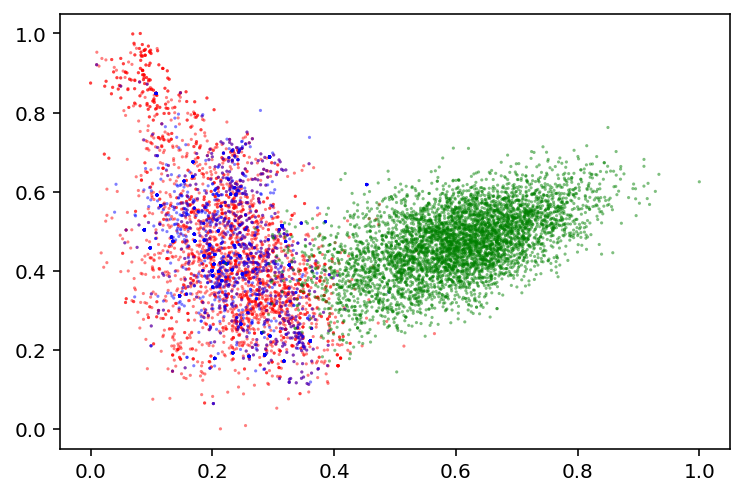

In [75]:
# do pca and normalize
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
src_colors = ['red']*encoded_src_smiles.shape[0]
abl1_colors = ['blue']*encoded_abl1_smiles.shape[0]
gdb_colors = ['green']*encoded_gdb_smiles.shape[0]
colors = src_colors+abl1_colors+gdb_colors
Z_pca = PCA(n_components=2).fit_transform(Z_combined)
Z_pca = MinMaxScaler().fit_transform(Z_pca)

df = pd.DataFrame(np.transpose((Z_pca[:,0],Z_pca[:,1])))
df.columns = ['x','y']
#df[prop_opt]=prop_df[prop_opt]

plt.scatter(x=df['x'], y=df['y'], c=colors,
            cmap= 'viridis', marker='.',
            s=10,alpha=0.5, edgecolors='none')
plt.savefig('PCA_IMG.png',dpi=500)
plt.show()

# PCA Analysis of 10 Kinase Inhibitor Families and GDB Small Molecules

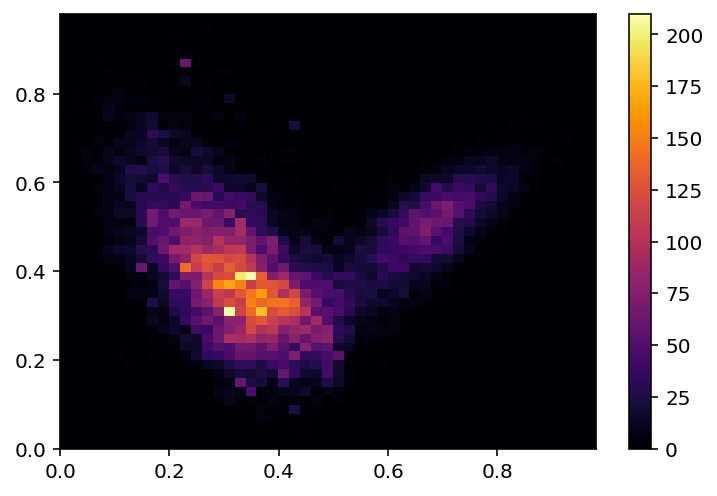

In [226]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
src_colors = ['red']*encoded_src_smiles.shape[0]
abl1_colors = ['blue']*encoded_abl1_smiles.shape[0]
gdb_colors = ['green']*encoded_gdb_smiles.shape[0]
csf1r_colors= ['orange']*encoded_csf1r_smiles.shape[0]
egfr_colors = ['goldenrod']*encoded_egfr_smiles.shape[0]
flt3_colors = ['magenta']*encoded_flt3_smiles.shape[0]
kdr_colors = ['brown']*encoded_kdr_smiles.shape[0]
lck_colors = ['paleturquoise']*encoded_lck_smiles.shape[0]
mapk10_colors = ['maroon']*encoded_mapk10_smiles.shape[0]
mapk14_colors = ['gray']*encoded_mapk14_smiles.shape[0]
met_colors = ['honeydew']*encoded_met_smiles.shape[0]

colors = src_colors+abl1_colors+gdb_colors+csf1r_colors+egfr_colors+flt3_colors+kdr_colors+lck_colors+mapk10_colors+mapk14_colors+met_colors
Z_pca_all = PCA(n_components=2).fit_transform(Z_combined_all)
Z_pca_all = MinMaxScaler().fit_transform(Z_pca_all)

all_df = pd.DataFrame(np.transpose((Z_pca_all[:,0],Z_pca_all[:,1])))
all_df.columns = ['x','y']
#df[prop_opt]=prop_df[prop_opt]

#plt.scatter(x=all_df['x'], y=all_df['y'], c=colors,
#            cmap= 'viridis', marker='.',
#            s=10,alpha=0.5, edgecolors='none')
#plt.savefig('PCA_IMG_all.png',dpi=500)
#plt.hist2d(all_df['x'] , all_df['y'] , bins=[np.arange(0,1,.02),np.arange(0,1,.02)], cmap='coolwarm')
counts, xedges, yedges, im = plt.hist2d(all_df['x'] , all_df['y'] , bins=[np.arange(0,1,.02),np.arange(0,1,.02)], cmap='inferno')
plt.colorbar(im)
plt.savefig('PCA_Heat_GDB.png',dpi=500)
plt.show()

# PCA of just ABL1 and SRC Kinase Inhibitors

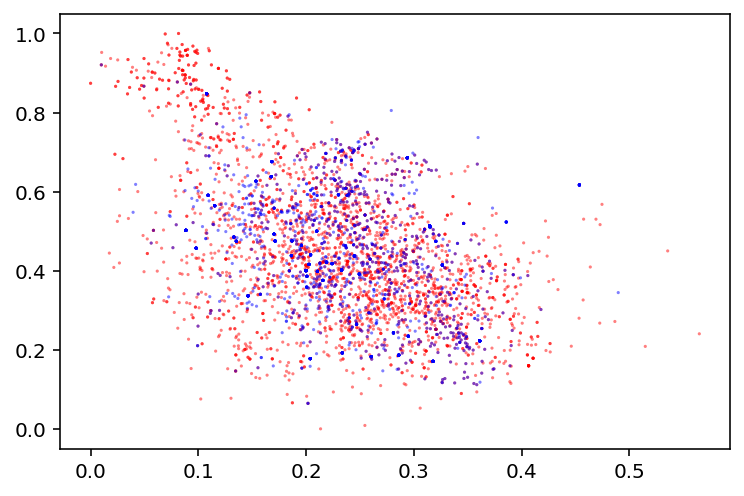

In [77]:
# do pca and normalize
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
src_colors = ['red']*encoded_src_smiles.shape[0]
abl1_colors = ['blue']*encoded_abl1_smiles.shape[0]
gdb_colors = ['green']*encoded_gdb_smiles.shape[0]
colors = src_colors+abl1_colors#+gdb_colors
Z_pca = PCA(n_components=2).fit_transform(Z_combined)
Z_pca = MinMaxScaler().fit_transform(Z_pca)

df = pd.DataFrame(np.transpose((Z_pca[:encoded_src_smiles.shape[0]+encoded_abl1_smiles.shape[0],0],Z_pca[:encoded_src_smiles.shape[0]+encoded_abl1_smiles.shape[0],1])))
df.columns = ['x','y']
#df[prop_opt]=prop_df[prop_opt]

plt.scatter(x=df['x'], y=df['y'], c=colors,
            cmap= 'viridis', marker='.',
            s=10,alpha=0.5, edgecolors='none')
plt.savefig('PCA_IMG2.png',dpi=500)
plt.show()

# PCA Analysis of 10 Kinase Inhibitor Families

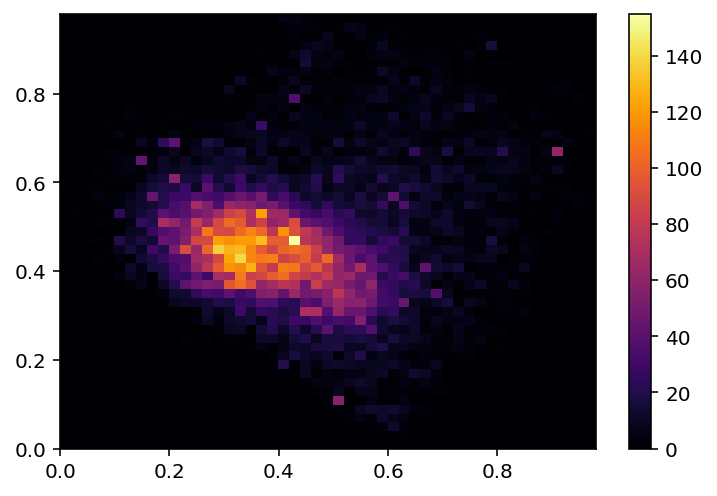

In [228]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
src_colors = ['red']*encoded_src_smiles.shape[0]
abl1_colors = ['blue']*encoded_abl1_smiles.shape[0]
gdb_colors = ['green']*encoded_gdb_smiles.shape[0]
csf1r_colors= ['orange']*encoded_csf1r_smiles.shape[0]
egfr_colors = ['goldenrod']*encoded_egfr_smiles.shape[0]
flt3_colors = ['magenta']*encoded_flt3_smiles.shape[0]
kdr_colors = ['brown']*encoded_kdr_smiles.shape[0]
lck_colors = ['paleturquoise']*encoded_lck_smiles.shape[0]
mapk10_colors = ['maroon']*encoded_mapk10_smiles.shape[0]
mapk14_colors = ['gray']*encoded_mapk14_smiles.shape[0]
met_colors = ['honeydew']*encoded_met_smiles.shape[0]

colors = src_colors+abl1_colors+csf1r_colors+egfr_colors+flt3_colors+kdr_colors+lck_colors+mapk10_colors+mapk14_colors+met_colors
Z_pca_ki = PCA(n_components=2).fit_transform(Z_combined_ki)
Z_pca_ki = MinMaxScaler().fit_transform(Z_pca_ki)

kin_df = pd.DataFrame(np.transpose((
    Z_pca_ki[:encoded_src_smiles.shape[0]+encoded_abl1_smiles.shape[0]+encoded_csf1r_smiles.shape[0]+encoded_egfr_smiles.shape[0]+encoded_flt3_smiles.shape[0]+encoded_kdr_smiles.shape[0]+encoded_lck_smiles.shape[0]+encoded_mapk10_smiles.shape[0]+encoded_mapk14_smiles.shape[0]+encoded_met_smiles.shape[0],0],
    Z_pca_ki[:encoded_src_smiles.shape[0]+encoded_abl1_smiles.shape[0]+encoded_csf1r_smiles.shape[0]+encoded_egfr_smiles.shape[0]+encoded_flt3_smiles.shape[0]+encoded_kdr_smiles.shape[0]+encoded_lck_smiles.shape[0]+encoded_mapk10_smiles.shape[0]+encoded_mapk14_smiles.shape[0]+encoded_met_smiles.shape[0],1])))

kin_df.columns = ['x','y']
#df[prop_opt]=prop_df[prop_opt]
#ax = seaborn.heatmap(temp_kin)
#plt.imshow(X=kin_df['x'],
#            cmap= 'hot', interpolation='nearest')
#plt.scatter(x=kin_df['x'], y=kin_df['y'], c=colors,
#            cmap= 'viridis', marker='.',
 #           s=10,alpha=0.5, edgecolors='none')
#
#plt.hist2d(kin_df['x'] , kin_df['y'] , bins=[np.arange(0,1,.02),np.arange(0,1,.02)])
counts, xedges, yedges, im = plt.hist2d(kin_df['x'] , kin_df['y'] , bins=[np.arange(0,1,.02),np.arange(0,1,.02)], cmap='inferno')
plt.colorbar(im)
plt.savefig('PCA_Heat_Kinase.png',dpi=500)
plt.show()

In [79]:
plt.savefig(fname='High_res_latent_space_ki.png',dpi=500)

<Figure size 432x288 with 0 Axes>

# Latent Space Multiclass Classification Model

In [80]:
#gdb_df_e = pd.DataFrame(encoded_gdb_smiles_raw)
abl1_df_e = pd.DataFrame(encoded_abl1_smiles_raw)
src_df_e = pd.DataFrame(encoded_src_smiles_raw)
csf1r_df_e = pd.DataFrame(encoded_csf1r_smiles_raw)
egfr_df_e = pd.DataFrame(encoded_egfr_smiles_raw)
flt3_df_e = pd.DataFrame(encoded_flt3_smiles_raw)
kdr_df_e = pd.DataFrame(encoded_kdr_smiles_raw)
lck_df_e = pd.DataFrame(encoded_lck_smiles_raw)
mapk10_df_e = pd.DataFrame(encoded_mapk10_smiles_raw)
mapk14_df_e = pd.DataFrame(encoded_mapk14_smiles_raw)
met_df_e = pd.DataFrame(encoded_met_smiles_raw)

In [81]:
#gdb_df_e['Class']=1
abl1_df_e['Class']=0
src_df_e['Class']=1
csf1r_df_e['Class']=2
egfr_df_e['Class']=3
flt3_df_e['Class']=4
kdr_df_e['Class']=5
lck_df_e['Class']=6
mapk10_df_e['Class']=7
mapk14_df_e['Class']=8
met_df_e['Class']=9

In [82]:
# removed gdb_df_e
frames = [abl1_df_e,src_df_e,csf1r_df_e,egfr_df_e,flt3_df_e,kdr_df_e,lck_df_e,mapk10_df_e,mapk14_df_e,met_df_e]
combined_ls_df = pd.concat(frames,ignore_index=True)
display(combined_ls_df)

,0,1,2,3,4,5,6,7,8,9,...,187,188,189,190,191,192,193,194,195,Class
0,1.665042,-0.104827,-0.300950,0.175434,-0.093449,-0.984155,-0.212531,-1.271550,-0.501611,1.040248,...,-0.792408,0.646320,0.590224,0.338711,0.390050,0.475636,0.443631,0.533784,-0.311341,0
1,-0.483685,0.405742,-0.027043,-1.333383,-0.031954,-1.821628,0.275361,-1.240043,1.051909,-0.096225,...,0.389165,0.344219,0.538565,-0.513325,0.025405,-0.278937,0.437943,1.216993,-1.454782,0
2,-0.791119,-1.187448,0.102953,-0.820079,0.900540,-0.135560,-0.004650,-0.958357,0.757843,0.257848,...,-0.849537,-1.622831,0.637362,-0.170314,1.100069,-0.356466,-0.539382,-0.085694,-2.228292,0
3,-0.791119,-1.187448,0.102953,-0.820079,0.900540,-0.135560,-0.004650,-0.958357,0.757843,0.257848,...,-0.849537,-1.622831,0.637362,-0.170314,1.100069,-0.356466,-0.539382,-0.085694,-2.228292,0
4,-0.643950,-0.352324,-0.722197,0.012529,0.782830,-1.057470,0.064636,-0.205656,-1.024865,1.827795,...,0.126874,-0.720295,0.215514,-0.602243,-1.144885,-1.070073,0.260201,1.428247,-0.943968,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23669,-0.523233,0.624184,-1.195946,-1.797912,1.455308,-2.374752,1.554453,0.577315,0.510602,0.137113,...,-0.439082,-0.591058,0.853823,-0.331444,0.900106,1.502837,-1.315170,1.785257,-1.218411,9
23670,-0.053659,-0.329400,-0.371173,-0.695339,-0.032980,-1.381563,-0.788461,-2.606749,0.283326,0.993839,...,-2.607691,-0.690168,1.621186,-1.729222,1.246672,0.295745,-0.757762,1.390708,0.486520,9
23671,-0.905575,-1.419698,1.971115,-0.545808,0.819289,-1.513278,-0.724696,-0.620860,-0.276950,-0.380429,...,-0.816173,0.783445,0.891004,0.201033,-1.254857,-1.438353,-0.374444,-1.238867,-0.958148,9
23672,-0.420511,0.141016,-0.361848,-0.825495,0.340854,-0.594317,0.784933,1.162388,-1.284547,2.308047,...,-0.319512,1.105309,-0.488606,-0.525223,-0.203531,0.916187,1.069433,1.575715,0.086057,9


In [83]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import auc


In [84]:
combined_ls_df = combined_ls_df.sample(frac=1)

In [85]:
combined_training_df = combined_ls_df.drop(columns='Class')
y = combined_ls_df.Class

In [86]:
X_train, X_test, y_train, y_test = train_test_split(combined_training_df, y, test_size=0.2)

In [87]:
forest = RandomForestClassifier()

In [88]:
print(cross_val_score(forest,X_train,y_train,cv=6,scoring='f1_micro'))

[0.54260374 0.53753564 0.54672157 0.55006337 0.52027883 0.52186312]


In [89]:
forest.fit(X_train, y_train)

RandomForestClassifier()

In [90]:
test_pred = forest.predict(X_test)

In [91]:
print(classification_report(y_test,test_pred))

              precision    recall  f1-score   support

           0       0.50      0.53      0.51       390
           1       0.56      0.51      0.53       669
           2       0.46      0.24      0.32       132
           3       0.60      0.69      0.64       763
           4       0.36      0.16      0.22       234
           5       0.42      0.59      0.49       888
           6       0.44      0.30      0.36       289
           7       0.73      0.30      0.43       178
           8       0.66      0.73      0.69       763
           9       0.76      0.55      0.63       429

    accuracy                           0.55      4735
   macro avg       0.55      0.46      0.48      4735
weighted avg       0.56      0.55      0.54      4735



In [92]:
#fpr, tpr, threshold = roc_curve(y_test, test_pred)
#roc_auc = auc(fpr, tpr)

# method I: plt
#import matplotlib.pyplot as plt
#plt.title('Receiver Operating Characteristic')
#plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
#plt.legend(loc = 'lower right')
#plt.plot([0, 1], [0, 1],'r--')
#plt.xlim([0, 1])
#plt.ylim([0, 1])
#plt.ylabel('True Positive Rate')
#plt.xlabel('False Positive Rate')
#plt.show()

## Binary Latent Space Random Forest

In [483]:
gdb_df_e = pd.DataFrame(encoded_gdb_smiles_raw)
abl1_df_e = pd.DataFrame(encoded_abl1_smiles_raw)
src_df_e = pd.DataFrame(encoded_src_smiles_raw)
csf1r_df_e = pd.DataFrame(encoded_csf1r_smiles_raw)
egfr_df_e = pd.DataFrame(encoded_egfr_smiles_raw)
flt3_df_e = pd.DataFrame(encoded_flt3_smiles_raw)
kdr_df_e = pd.DataFrame(encoded_kdr_smiles_raw)
lck_df_e = pd.DataFrame(encoded_lck_smiles_raw)
mapk10_df_e = pd.DataFrame(encoded_mapk10_smiles_raw)
mapk14_df_e = pd.DataFrame(encoded_mapk14_smiles_raw)
met_df_e = pd.DataFrame(encoded_met_smiles_raw)

In [484]:
gdb_df_e['Class']=0
abl1_df_e['Class']=0
src_df_e['Class']=1
csf1r_df_e['Class']=0
egfr_df_e['Class']=0
flt3_df_e['Class']=0
kdr_df_e['Class']=0
lck_df_e['Class']=0
mapk10_df_e['Class']=0
mapk14_df_e['Class']=0
met_df_e['Class']=0

In [485]:
frames = [gdb_df_e,abl1_df_e,src_df_e,csf1r_df_e,egfr_df_e,flt3_df_e,kdr_df_e,lck_df_e,mapk10_df_e,mapk14_df_e,met_df_e]
combined_ls_b_df = pd.concat(frames,ignore_index=True)
display(combined_ls_b_df)

,0,1,2,3,4,5,6,7,8,9,...,187,188,189,190,191,192,193,194,195,Class
0,0.275154,-1.172863,-1.306636,-0.606586,0.078650,0.779589,-0.505918,-0.344500,1.845808,-0.425689,...,-1.075227,-0.672488,0.340069,0.432410,1.224373,1.562704,0.185263,0.211325,-0.751788,0
1,1.598163,0.002741,-0.229063,-0.230606,-0.402240,0.240768,-0.981175,-1.934663,0.764445,0.330128,...,-0.408616,-1.015528,0.045725,0.704160,0.678575,1.640245,0.951338,0.891208,0.430585,0
2,0.390743,0.694848,-0.888860,-1.017574,0.707350,-0.287289,0.174189,-0.024946,0.047399,0.335812,...,-1.639647,-0.914469,0.025887,1.399326,1.815364,1.318347,-1.605153,0.299065,-0.226421,0
3,1.163302,-1.095199,1.557171,1.031568,1.145792,0.414216,0.654911,0.566579,1.611919,-0.028107,...,-1.885597,0.839176,0.850544,1.834255,1.468179,-0.191446,0.917204,-0.256737,1.131775,0
4,0.842094,-0.222454,0.003799,1.532352,1.168852,0.492942,-0.712138,-0.844010,1.014740,0.590994,...,-2.039582,-0.374376,0.570477,0.297869,0.620892,0.571798,0.773065,-0.566929,-0.657597,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138547,-0.523233,0.624184,-1.195946,-1.797912,1.455308,-2.374752,1.554453,0.577315,0.510602,0.137113,...,-0.439082,-0.591058,0.853823,-0.331444,0.900106,1.502837,-1.315170,1.785257,-1.218411,0
138548,-0.053659,-0.329400,-0.371173,-0.695339,-0.032980,-1.381563,-0.788461,-2.606749,0.283326,0.993839,...,-2.607691,-0.690168,1.621186,-1.729222,1.246672,0.295745,-0.757762,1.390708,0.486520,0
138549,-0.905575,-1.419698,1.971115,-0.545808,0.819289,-1.513278,-0.724696,-0.620860,-0.276950,-0.380429,...,-0.816173,0.783445,0.891004,0.201033,-1.254857,-1.438353,-0.374444,-1.238867,-0.958148,0
138550,-0.420511,0.141016,-0.361848,-0.825495,0.340854,-0.594317,0.784933,1.162388,-1.284547,2.308047,...,-0.319512,1.105309,-0.488606,-0.525223,-0.203531,0.916187,1.069433,1.575715,0.086057,0


In [486]:
combined_ls_b_df = combined_ls_b_df.sample(frac=1)

In [487]:
combined_training_b_df = combined_ls_b_df.drop(columns='Class')
y_b = combined_ls_b_df.Class

In [488]:
X_train, X_test, y_train, y_test = train_test_split(combined_training_b_df, y_b, test_size=0.2)

In [489]:
forest_b = RandomForestClassifier()
print(cross_val_score(forest_b,X_train,y_train,cv=6,scoring='f1_micro'))

[0.97607448 0.97677817 0.97623687 0.97672278 0.97569426 0.97666865]


In [490]:
forest_b.fit(X_train, y_train)

RandomForestClassifier()

In [491]:
test_pred = forest_b.predict(X_test)

In [492]:
print(classification_report(y_test,test_pred))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     27032
           1       0.51      0.33      0.40       679

    accuracy                           0.98     27711
   macro avg       0.75      0.66      0.69     27711
weighted avg       0.97      0.98      0.97     27711



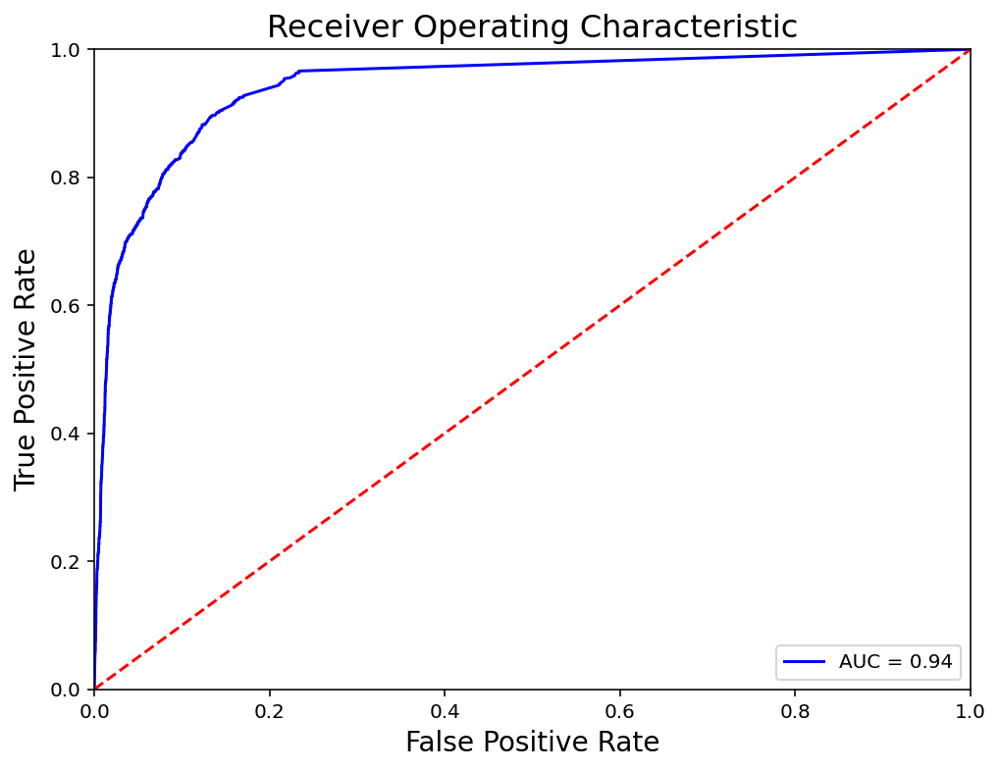

In [495]:
probs = forest_b.predict_proba(X_test)
preds = probs[:,1]

preds = probs[:,1]
fpr, tpr, threshold = roc_curve(y_test, preds)
roc_auc = auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(8,6))
plt.title('Receiver Operating Characteristic', fontsize = 16)
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)
plt.savefig('Updated_ROC_Latent.png', dpi=500)
plt.show()

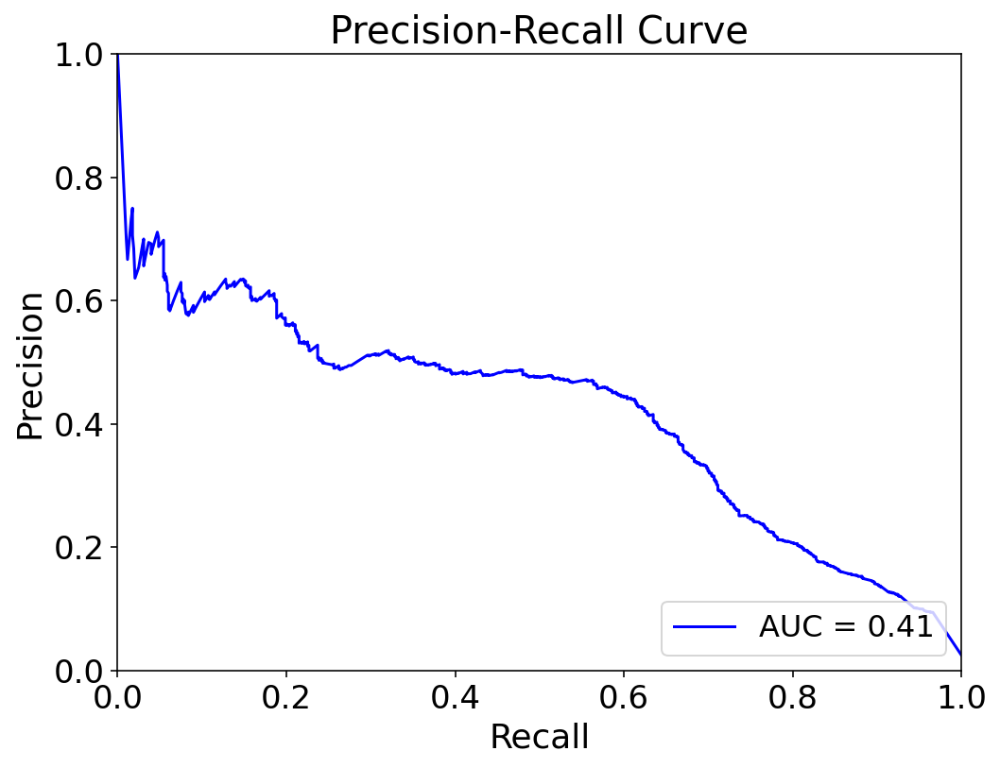

In [496]:
from sklearn.metrics import precision_recall_curve

preds = probs[:,1]
prec, recall, threshold = precision_recall_curve(y_test, preds)
prec_auc = auc(recall, prec)

# method I: plt
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(8,6))
plt.title('Precision-Recall Curve', fontsize = 20)
plt.plot(recall, prec, 'b', label = 'AUC = %0.2f' % prec_auc)
plt.legend(loc = 'lower right', fontsize=16)
#plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.ylabel('Precision', fontsize=18)
plt.xlabel('Recall', fontsize=18)
plt.savefig('Precision_Latent.png', dpi=500)
plt.show()

# Getting Chemical Attributes for Each Family

In [93]:
def get_mol(dataframe):
    temp_mol = []
    temp_smile = []
    for i in dataframe['smiles']:
        try:
            mol = Chem.MolFromSmiles(i)
            temp_mol.append(mol)
            temp_smile.append(i)
        except:
            print(i)
            
    temp_df = pd.DataFrame()
    temp_df['smiles'] = temp_smile
    temp_df['mol'] = temp_mol
    return temp_df

In [432]:
abl1_df = pd.DataFrame()
abl1_df['smiles'] = en_abl1_smiles

src_df = pd.DataFrame()
src_df['smiles'] = en_src_smiles
csf1r_df = pd.DataFrame()
csf1r_df['smiles'] = en_csf1r_smiles
egfr_df = pd.DataFrame()
egfr_df['smiles'] = en_egfr_smiles
flt3_df = pd.DataFrame()
flt3_df['smiles'] = en_flt3_smiles
kdr_df = pd.DataFrame()
kdr_df['smiles'] = en_kdr_smiles
lck_df = pd.DataFrame()
lck_df['smiles'] = en_lck_smiles
mapk10_df = pd.DataFrame()
mapk10_df['smiles'] = en_mapk10_smiles
mapk14_df = pd.DataFrame()
mapk14_df['smiles'] = en_mapk14_smiles
met_df = pd.DataFrame()
met_df['smiles'] = en_met_smiles


,smiles,mol
0,CCN(CC)CCOc1ccc(Nc2ncc3cc(-c4ccsc4)c(=O)n(C)c3...,
1,CCN(CC)CCOc1ccc(Nc2ncc3cc(-c4c(Cl)cccc4Cl)c(=O...,
2,CCN(CC)CCOc1ccc(Nc2ncc3cc(-c4ccccc4)c(=O)n(CC)...,
3,CCN(CC)CCOc1ccc(Nc2ncc3cc(-c4c(Cl)cccc4Cl)c(=O...,
4,Nc1ncc2cc(-c3c(Cl)cccc3Cl)c(=O)n(CCCO)c2n1,
...,...,...
3417,COc1cc2c(Nc3ccc(Cl)cc3Cl)c(C#N)cnc2cc1C#CCCN1C...,
3418,CCOc1cc2c(Nc3cc(OC)c(Cl)cc3Cl)c(C#N)cnc2cc1C#C...,
3419,COc1cc2c(Nc3cc(OC)c(OC)c(OC)c3)c(C#N)cnc2cc1C#...,
3420,COc1cc(Nc2c(C#N)cnc3cc(C#CCCN4CCN(C)CC4)ccc23)...,

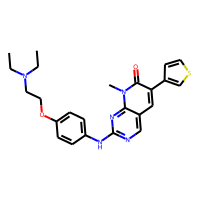
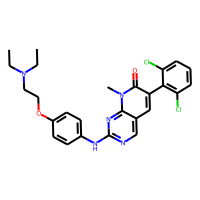
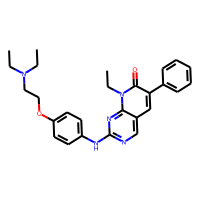
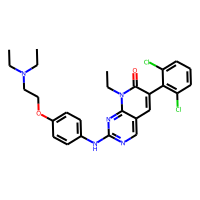
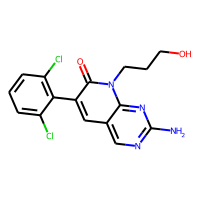
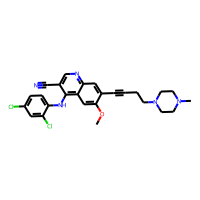
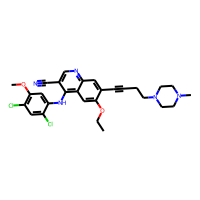
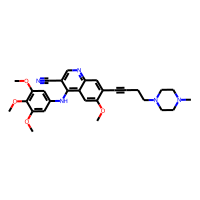
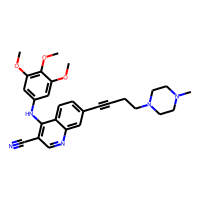
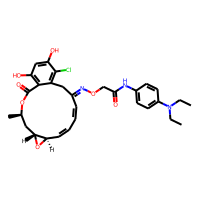

In [433]:
src_df = get_mol(src_df)
display(src_df)

,smiles,mol,rings,weight,csp3,hallkier,laputeASA,alicarbo,alihetero,alirings,amidebonds,arocarbo,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable
0,c1ccc(Nc2ncnc3n[nH]c(Nc4ccccc4)c23)cc1,,4,302.127994,0.000000,-3.41,132.163538,0,0,0,0,2,2,4,0,0,5,3,4
1,O=C(Nc1nnc(SCc2ccccc2)s1)c1ccc(F)cc1,,3,345.040582,0.062500,-2.25,140.323618,0,0,0,1,2,1,3,0,0,5,1,5
2,COC(=O)/N=c1\[nH]c2ccc(C(=O)c3ccccc3)cc2[nH]1,,3,295.095691,0.062500,-3.15,125.025709,0,0,0,1,2,1,3,0,0,3,2,2
3,COC(=O)/N=c1\[nH]c2ccc(C(=O)c3ccccc3)cc2[nH]1,,3,295.095691,0.062500,-3.15,125.025709,0,0,0,1,2,1,3,0,0,3,2,2
4,O=C(Nc1ncc(Cc2ccc(Cl)cc2)s1)c1cccs1,,3,334.000133,0.066667,-1.69,134.790501,0,0,0,1,1,2,3,0,0,4,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23669,O=C(Nc1ccc(Oc2ccnc3ccsc23)cc1)N[C@@H]1C[C@@H]1...,,5,401.119798,0.130435,-3.38,171.915996,1,0,1,2,2,2,4,2,0,4,2,5
23670,N#Cc1ccc2[nH]c(-c3ccncc3)c(-c3ccc(Cl)cc3)c2n1\n,,4,330.067224,0.000000,-3.16,142.936500,0,0,0,0,1,3,4,0,0,3,1,2
23671,NS(=O)(=O)c1ccc(Nc2nc(N3CCOCC3)nc3[nH]cnc23)cc1\n,,4,375.111358,0.266667,-2.76,149.016111,0,1,1,0,1,2,3,0,0,8,3,4
23672,CCN1CCN(c2cnc3cc(C(F)(F)F)cc(NCc4ccc(F)cc4)c3c...,,4,432.193710,0.347826,-2.87,178.035187,0,1,1,0,2,1,3,0,0,4,1,5

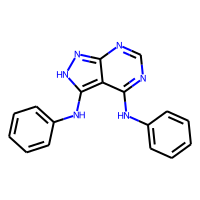
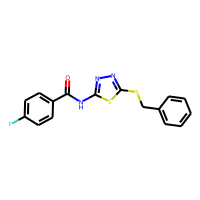
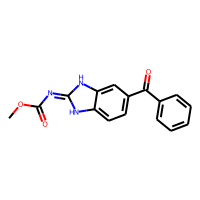
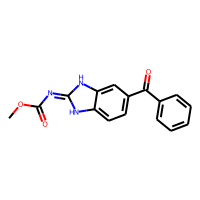
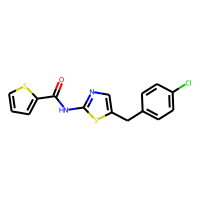
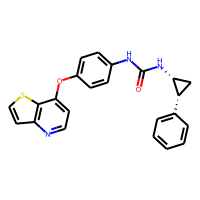
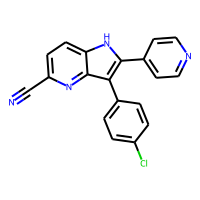
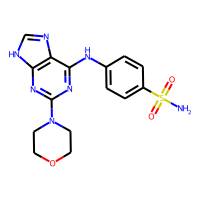
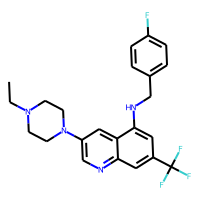
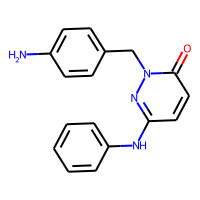

In [434]:
frames = [abl1_df,src_df,csf1r_df,egfr_df,flt3_df,kdr_df,lck_df,mapk10_df,mapk14_df,met_df]
combined_ls_df = pd.concat(frames,ignore_index=True)

combined_ls_df = get_mol(combined_ls_df)
combined_ls_df = get_attributes(combined_ls_df)
display(combined_ls_df)

In [435]:
abl1_df = get_mol(abl1_df)
src_df = get_mol(src_df)
csf1r_df = get_mol(csf1r_df)
egfr_df = get_mol(egfr_df)
flt3_df = get_mol(flt3_df)
kdr_df = get_mol(kdr_df)
lck_df = get_mol(lck_df)
mapk10_df = get_mol(mapk10_df)
mapk14_df = get_mol(mapk14_df)
met_df = get_mol(met_df)

abl1_df = get_attributes(abl1_df)
src_df = get_attributes(src_df)
csf1r_df = get_attributes(csf1r_df)
egfr_df = get_attributes(egfr_df)
flt3_df = get_attributes(flt3_df)
kdr_df = get_attributes(kdr_df)
lck_df = get_attributes(lck_df)
mapk10_df = get_attributes(mapk10_df)
mapk14_df = get_attributes(mapk14_df)
met_df = get_attributes(met_df)

In [436]:
def get_values(dataframe, encoded_df):
    y_1 = [vae.predict_prop_Z(x.reshape(1,196)) for x in encoded_df]
    y_1 = np.array(y_1)
    y_1 = pd.DataFrame(y_1.reshape(y_1.shape[0],3))
    
    dataframe = pd.concat([dataframe, y_1], axis=1)
    dataframe = dataframe.loc[:,~dataframe.columns.duplicated()]
    dataframe = dataframe.rename(columns={0:'qed',1:'SAS',2:'logP'})
    dataframe = dataframe.dropna()
    
    return dataframe

In [437]:
abl1_df = get_values(abl1_df,encoded_abl1_smiles_raw)
src_df = get_values(src_df,encoded_src_smiles_raw)
csf1r_df = get_values(csf1r_df,encoded_csf1r_smiles_raw)
egfr_df = get_values(egfr_df,encoded_egfr_smiles_raw)
flt3_df = get_values(flt3_df,encoded_flt3_smiles_raw)
kdr_df = get_values(kdr_df,encoded_kdr_smiles_raw)
lck_df = get_values(lck_df,encoded_lck_smiles_raw)
mapk10_df = get_values(mapk10_df,encoded_mapk10_smiles_raw)
mapk14_df = get_values(mapk14_df,encoded_mapk14_smiles_raw)
met_df = get_values(met_df,encoded_met_smiles_raw)

,smiles,mol,rings,weight,csp3,hallkier,laputeASA,alicarbo,alihetero,alirings,...,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable,qed,SAS,logP
0,c1ccc(Nc2ncnc3n[nH]c(Nc4ccccc4)c23)cc1,,4,302.127994,0.000000,-3.41,132.163538,0,0,0,...,2,4,0,0,5,3,4,0.580019,2.182841,3.455185
1,O=C(Nc1nnc(SCc2ccccc2)s1)c1ccc(F)cc1,,3,345.040582,0.062500,-2.25,140.323618,0,0,0,...,1,3,0,0,5,1,5,0.669666,2.072351,3.940630
2,COC(=O)/N=c1\[nH]c2ccc(C(=O)c3ccccc3)cc2[nH]1,,3,295.095691,0.062500,-3.15,125.025709,0,0,0,...,1,3,0,0,3,2,2,0.620621,2.464449,1.983672
3,COC(=O)/N=c1\[nH]c2ccc(C(=O)c3ccccc3)cc2[nH]1,,3,295.095691,0.062500,-3.15,125.025709,0,0,0,...,1,3,0,0,3,2,2,0.620621,2.464449,1.983672
4,O=C(Nc1ncc(Cc2ccc(Cl)cc2)s1)c1cccs1,,3,334.000133,0.066667,-1.69,134.790501,0,0,0,...,2,3,0,0,4,1,4,0.665786,2.085265,4.494634
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23669,O=C(Nc1ccc(Oc2ccnc3ccsc23)cc1)N[C@@H]1C[C@@H]1...,,5,401.119798,0.130435,-3.38,171.915996,1,0,1,...,2,4,2,0,4,2,5,0.560035,2.956578,5.150802
23670,N#Cc1ccc2[nH]c(-c3ccncc3)c(-c3ccc(Cl)cc3)c2n1\n,,4,330.067224,0.000000,-3.16,142.936500,0,0,0,...,3,4,0,0,3,1,2,0.523397,2.453209,4.608487
23671,NS(=O)(=O)c1ccc(Nc2nc(N3CCOCC3)nc3[nH]cnc23)cc1\n,,4,375.111358,0.266667,-2.76,149.016111,0,1,1,...,2,3,0,0,8,3,4,0.675410,2.456383,0.463079
23672,CCN1CCN(c2cnc3cc(C(F)(F)F)cc(NCc4ccc(F)cc4)c3c...,,4,432.193710,0.347826,-2.87,178.035187,0,1,1,...,1,3,0,0,4,1,5,0.552295,2.306331,5.233391

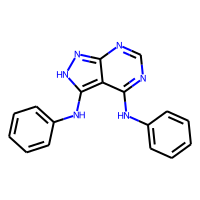
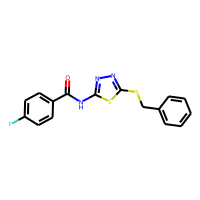
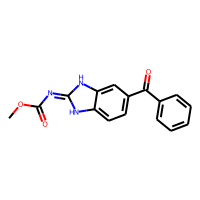
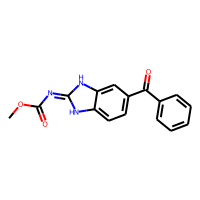
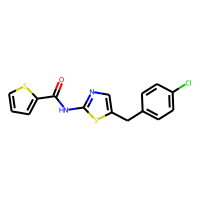
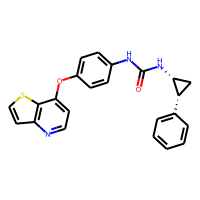
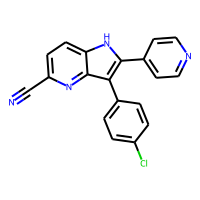
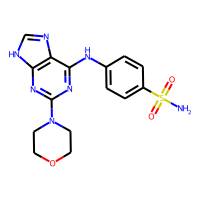
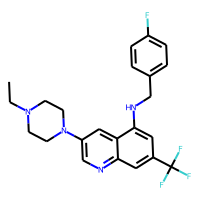
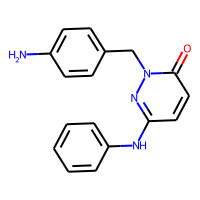

In [438]:
frames = [abl1_df,src_df,csf1r_df,egfr_df,flt3_df,kdr_df,lck_df,mapk10_df,mapk14_df,met_df]
combined_ls1_df = pd.concat(frames,ignore_index=True)
display(combined_ls1_df)

In [439]:
combined_ls1_df.to_csv('SRC_included.csv', index=False)

## Random Forest for Chemical Attributes

In [440]:
abl1_df['Class']=0
src_df['Class']=1
csf1r_df['Class']=2
egfr_df['Class']=3
flt3_df['Class']=4
kdr_df['Class']=5
lck_df['Class']=6
mapk10_df['Class']=7
mapk14_df['Class']=8
met_df['Class']=9

abl1_df_t = abl1_df.drop(columns=['smiles', 'mol'])
src_df_t = src_df.drop(columns=['smiles', 'mol'])
csf1r_df_t = csf1r_df.drop(columns=['smiles', 'mol'])
egfr_df_t = egfr_df.drop(columns=['smiles', 'mol'])
flt3_df_t = flt3_df.drop(columns=['smiles', 'mol'])
kdr_df_t = kdr_df.drop(columns=['smiles', 'mol'])
lck_df_t = lck_df.drop(columns=['smiles', 'mol'])
mapk10_df_t = mapk10_df.drop(columns=['smiles', 'mol'])
mapk14_df_t = mapk14_df.drop(columns=['smiles', 'mol'])
met_df_t = met_df.drop(columns=['smiles', 'mol'])

In [441]:
frames = [abl1_df_t,src_df_t,csf1r_df_t,egfr_df_t,flt3_df_t,kdr_df_t,lck_df_t,mapk10_df_t,mapk14_df_t,met_df_t]
combined_ls_df_attr = pd.concat(frames,ignore_index=True)
display(combined_ls_df_attr)

,rings,weight,csp3,hallkier,laputeASA,alicarbo,alihetero,alirings,amidebonds,arocarbo,...,arorings,stereocenter,bridgehead,hba,hbd,rotatable,qed,SAS,logP,Class
0,4,302.127994,0.000000,-3.41,132.163538,0,0,0,0,2,...,4,0,0,5,3,4,0.580019,2.182841,3.455185,0
1,3,345.040582,0.062500,-2.25,140.323618,0,0,0,1,2,...,3,0,0,5,1,5,0.669666,2.072351,3.940630,0
2,3,295.095691,0.062500,-3.15,125.025709,0,0,0,1,2,...,3,0,0,3,2,2,0.620621,2.464449,1.983672,0
3,3,295.095691,0.062500,-3.15,125.025709,0,0,0,1,2,...,3,0,0,3,2,2,0.620621,2.464449,1.983672,0
4,3,334.000133,0.066667,-1.69,134.790501,0,0,0,1,1,...,3,0,0,4,1,4,0.665786,2.085265,4.494634,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23669,5,401.119798,0.130435,-3.38,171.915996,1,0,1,2,2,...,4,2,0,4,2,5,0.560035,2.956578,5.150802,9
23670,4,330.067224,0.000000,-3.16,142.936500,0,0,0,0,1,...,4,0,0,3,1,2,0.523397,2.453209,4.608487,9
23671,4,375.111358,0.266667,-2.76,149.016111,0,1,1,0,1,...,3,0,0,8,3,4,0.675410,2.456383,0.463079,9
23672,4,432.193710,0.347826,-2.87,178.035187,0,1,1,0,2,...,3,0,0,4,1,5,0.552295,2.306331,5.233391,9


In [442]:
combined_ls_df_attr = combined_ls_df_attr.sample(frac=1)
combined_training_df_attr = combined_ls_df_attr.drop(columns='Class')
y = combined_ls_df_attr.Class

In [443]:
x_train_a, x_test_a, y_train_a, y_test_a = train_test_split(combined_training_df_attr, y, test_size=0.2)

In [444]:
forest_attr = RandomForestClassifier()

In [445]:
print(cross_val_score(forest_attr,x_train_a,y_train_a,cv=6,scoring='f1_micro'))

[0.63256256 0.62876148 0.61957555 0.61787072 0.62959442 0.62357414]


In [446]:
forest_attr.fit(x_train_a, y_train_a)

RandomForestClassifier()

In [447]:
test_pred = forest_attr.predict(x_test_a)
print(classification_report(y_test_a,test_pred))

              precision    recall  f1-score   support

           0       0.51      0.58      0.55       409
           1       0.57      0.56      0.56       660
           2       0.69      0.54      0.61       142
           3       0.69      0.74      0.71       795
           4       0.55      0.46      0.50       194
           5       0.58      0.59      0.58       916
           6       0.47      0.41      0.44       313
           7       0.77      0.55      0.64       163
           8       0.75      0.80      0.78       722
           9       0.74      0.72      0.73       421

    accuracy                           0.63      4735
   macro avg       0.63      0.59      0.61      4735
weighted avg       0.63      0.63      0.63      4735



In [463]:
probs = forest_attr.predict_proba(x_test_a)
preds = probs[:,1]

In [464]:
probs = forest_attr.predict_proba(x_test_a)
preds = probs[:,1]

preds = probs[:,1]
fpr, tpr, threshold = roc_curve(y_test_a, preds)
roc_auc = auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(8,6))
plt.title('Receiver Operating Characteristic', fontsize = 16)
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)
#plt.savefig('Updated_ROC.png', dpi=500)
plt.show()

ValueError: multiclass format is not supported

In [465]:
from sklearn.metrics import precision_recall_curve

preds = probs[:,1]
prec, recall, threshold = precision_recall_curve(y_test_a, preds)
prec_auc = auc(recall, prec)

# method I: plt
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(8,6))
plt.title('Precision-Recall Curve', fontsize = 20)
plt.plot(recall, prec, 'b', label = 'AUC = %0.2f' % prec_auc)
plt.legend(loc = 'lower right', fontsize=16)
#plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.ylabel('Precision', fontsize=18)
plt.xlabel('Recall', fontsize=18)
#plt.savefig('Precision.png', dpi=500)
plt.show()


ValueError: multiclass format is not supported

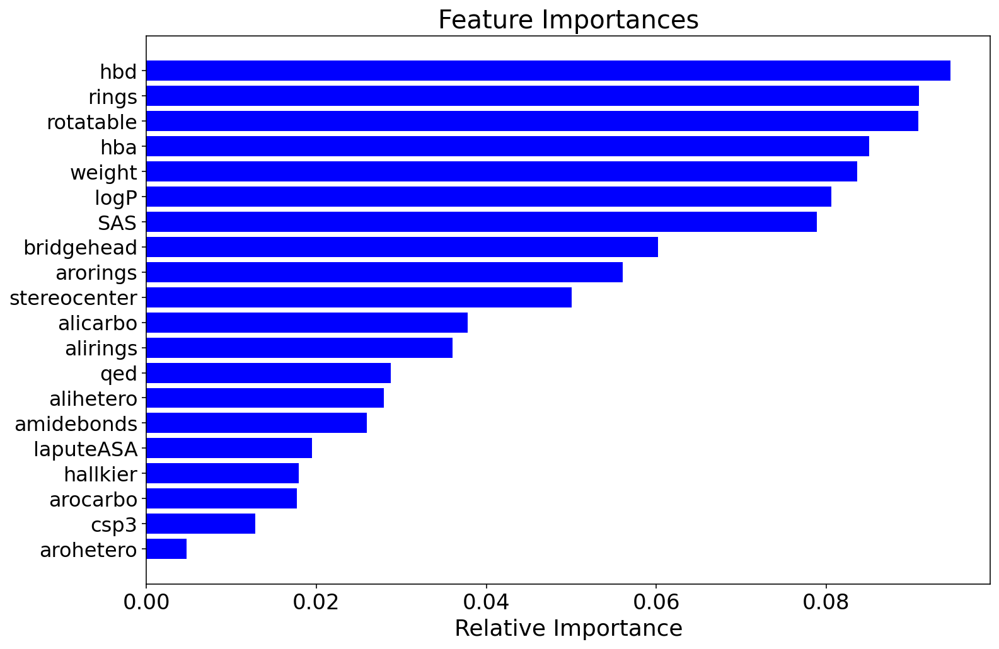

In [466]:
importances = forest_attr.feature_importances_
indices = np.argsort(importances)
features = final_training_df_2.columns
fig = plt.figure(figsize=(12,8))
plt.title('Feature Importances', fontsize=20)
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices], fontsize=16)
plt.xticks(fontsize=17)
plt.xlabel('Relative Importance', fontsize=18)
#plt.savefig('forest_feature_importances.png',dpi=500)
plt.show()

# Binary Classification

In [110]:
abl1_df['Class']=0
src_df['Class']=1
csf1r_df['Class']=0
egfr_df['Class']=0
flt3_df['Class']=0
kdr_df['Class']=0
lck_df['Class']=0
mapk10_df['Class']=0
mapk14_df['Class']=0
met_df['Class']=0

abl1_df_t = abl1_df.drop(columns=['smiles', 'mol'])
src_df_t = src_df.drop(columns=['smiles', 'mol'])
csf1r_df_t = csf1r_df.drop(columns=['smiles', 'mol'])
egfr_df_t = egfr_df.drop(columns=['smiles', 'mol'])
flt3_df_t = flt3_df.drop(columns=['smiles', 'mol'])
kdr_df_t = kdr_df.drop(columns=['smiles', 'mol'])
lck_df_t = lck_df.drop(columns=['smiles', 'mol'])
mapk10_df_t = mapk10_df.drop(columns=['smiles', 'mol'])
mapk14_df_t = mapk14_df.drop(columns=['smiles', 'mol'])
met_df_t = met_df.drop(columns=['smiles', 'mol'])

In [111]:
frames = [abl1_df_t,src_df_t,csf1r_df_t,egfr_df_t,flt3_df_t,kdr_df_t,lck_df_t,mapk10_df_t,mapk14_df_t,met_df_t]
binary_df_attr = pd.concat(frames,ignore_index=True)
display(binary_df_attr)

,rings,weight,csp3,hallkier,laputeASA,alicarbo,alihetero,alirings,amidebonds,arocarbo,...,stereocenter,bridgehead,hba,hbd,rotatable,class,qed,SAS,logP,Class
0,4,302.127994,0.000000,-3.41,132.163538,0,0,0,0,2,...,0,0,5,3,4,0.0,0.580019,2.182841,3.455185,0
1,3,345.040582,0.062500,-2.25,140.323618,0,0,0,1,2,...,0,0,5,1,5,0.0,0.669666,2.072351,3.940630,0
2,3,295.095691,0.062500,-3.15,125.025709,0,0,0,1,2,...,0,0,3,2,2,0.0,0.620621,2.464449,1.983672,0
3,3,295.095691,0.062500,-3.15,125.025709,0,0,0,1,2,...,0,0,3,2,2,0.0,0.620621,2.464449,1.983672,0
4,3,334.000133,0.066667,-1.69,134.790501,0,0,0,1,1,...,0,0,4,1,4,0.0,0.665786,2.085265,4.494634,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23669,5,401.119798,0.130435,-3.38,171.915996,1,0,1,2,2,...,2,0,4,2,5,9.0,0.560035,2.956578,5.150802,0
23670,4,330.067224,0.000000,-3.16,142.936500,0,0,0,0,1,...,0,0,3,1,2,9.0,0.523397,2.453209,4.608487,0
23671,4,375.111358,0.266667,-2.76,149.016111,0,1,1,0,1,...,0,0,8,3,4,9.0,0.675410,2.456383,0.463079,0
23672,4,432.193710,0.347826,-2.87,178.035187,0,1,1,0,2,...,0,0,4,1,5,9.0,0.552295,2.306331,5.233391,0


In [112]:
binary_df_attr = binary_df_attr.sample(frac=1)
y_b = binary_df_attr.Class
binary_df_attr = binary_df_attr.drop(columns='Class')


x_train_b, x_test_b, y_train_b, y_test_b = train_test_split(binary_df_attr, y_b, test_size=0.2)

In [113]:
forest_binary = RandomForestClassifier()

In [114]:
forest_binary.fit(x_train_b, y_train_b)

RandomForestClassifier()

In [115]:
test_pred = forest_binary.predict(x_test_b)
print(classification_report(y_test_b,test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4018
           1       1.00      1.00      1.00       717

    accuracy                           1.00      4735
   macro avg       1.00      1.00      1.00      4735
weighted avg       1.00      1.00      1.00      4735



# Totality Perturbation

In [116]:
#gdb_df = pd.DataFrame(encoded_gdb_smiles_raw)
abl1_df = pd.DataFrame(encoded_abl1_smiles_raw)
src_df = pd.DataFrame(encoded_src_smiles_raw)
csf1r_df = pd.DataFrame(encoded_csf1r_smiles_raw)
egfr_df = pd.DataFrame(encoded_egfr_smiles_raw)
flt3_df = pd.DataFrame(encoded_flt3_smiles_raw)
kdr_df = pd.DataFrame(encoded_kdr_smiles_raw)
lck_df = pd.DataFrame(encoded_lck_smiles_raw)
mapk10_df = pd.DataFrame(encoded_mapk10_smiles_raw)
mapk14_df = pd.DataFrame(encoded_mapk14_smiles_raw)
met_df = pd.DataFrame(encoded_met_smiles_raw)

abl1_df['Class']=0
src_df['Class']=1
csf1r_df['Class']=2
egfr_df['Class']=3
flt3_df['Class']=4
kdr_df['Class']=5
lck_df['Class']=6
mapk10_df['Class']=7
mapk14_df['Class']=8
met_df['Class']=9

frames = [abl1_df[:100],csf1r_df[:100],egfr_df[:100],flt3_df[:100],kdr_df[:100],lck_df[:100],mapk10_df[:100],mapk14_df[:100],met_df[:100]]
totality_df = pd.concat(frames,ignore_index=True)
display(totality_df)

,0,1,2,3,4,5,6,7,8,9,...,187,188,189,190,191,192,193,194,195,Class
0,1.665042,-0.104827,-0.300950,0.175434,-0.093449,-0.984155,-0.212531,-1.271550,-0.501611,1.040248,...,-0.792408,0.646320,0.590224,0.338711,0.390050,0.475636,0.443631,0.533784,-0.311341,0
1,-0.483685,0.405742,-0.027043,-1.333383,-0.031954,-1.821628,0.275361,-1.240043,1.051909,-0.096225,...,0.389165,0.344219,0.538565,-0.513325,0.025405,-0.278937,0.437943,1.216993,-1.454782,0
2,-0.791119,-1.187448,0.102953,-0.820079,0.900540,-0.135560,-0.004650,-0.958357,0.757843,0.257848,...,-0.849537,-1.622831,0.637362,-0.170314,1.100069,-0.356466,-0.539382,-0.085694,-2.228292,0
3,-0.791119,-1.187448,0.102953,-0.820079,0.900540,-0.135560,-0.004650,-0.958357,0.757843,0.257848,...,-0.849537,-1.622831,0.637362,-0.170314,1.100069,-0.356466,-0.539382,-0.085694,-2.228292,0
4,-0.643950,-0.352324,-0.722197,0.012529,0.782830,-1.057470,0.064636,-0.205656,-1.024865,1.827795,...,0.126874,-0.720295,0.215514,-0.602243,-1.144885,-1.070073,0.260201,1.428247,-0.943968,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,-1.189392,-1.647725,-0.748637,-0.018517,1.640233,-1.104154,0.102929,0.029361,0.627339,-1.295795,...,-0.367906,-0.065918,-0.223417,-0.812516,-0.535458,-1.860473,0.038731,1.627502,0.332531,9
896,2.782569,-0.646980,0.715280,-1.685093,1.097272,-0.774555,-1.021621,-4.110761,0.212103,3.039829,...,-1.398335,1.647443,0.803666,-0.371128,-0.329613,0.308477,-1.683017,1.333523,-0.009210,9
897,1.250483,-3.559987,-1.755575,0.175504,1.241310,-0.066704,0.559214,-1.198463,2.116051,0.552236,...,-0.643171,-0.550541,0.007612,-0.331749,-0.219926,-0.645294,-0.089762,3.001836,-0.523918,9
898,0.721679,-0.364530,-1.139641,0.039829,1.416250,1.359025,1.187321,-1.996659,1.013418,0.633709,...,0.151860,1.679604,1.734257,0.785082,-0.163984,1.506174,2.242302,1.700832,0.194624,9


## Important Variables Here

In [117]:
y_total = totality_df['Class']
totality_df = totality_df.drop(columns=['Class'])
total_latent = totality_df.to_numpy()


In [118]:
noise = 3.0
scalar = 0.8
decode = True
decode_attempts = 500
trial = 10

if(decode == True):
    path = "_" + str(trial) + "_" + str(scalar) + "_" + str(noise) + "_" + str(decode) + '_' + str(decode_attempts) + '.xlsx'
else:
    path = "_" + str(trial) + "_" + str(scalar) + "_" + str(noise) + "_" + str(decode) + '.xlsx'

In [119]:
subset_total_latent = total_latent

subset_total_latent = subset_total_latent.reshape(len(subset_total_latent), 196)

dataframe = pd.DataFrame(subset_total_latent)
dataframe['Class'] = y_total

kmeans = KMeans(n_clusters=3, n_init=100)
y = kmeans.fit_predict(dataframe)

dataframe["Cluster"] = y

c1 = []
c2 = []
c3 = []

for index, row in dataframe.iterrows():
    if(row['Cluster'] == 0.0):
        c1.append(row)
    elif(row['Cluster'] == 1.0):
        c2.append(row)
    elif(row['Cluster'] == 2.0):
        c3.append(row)
    else:
        print('Fail')

cluster_1 = pd.DataFrame(c1)
cluster_2 = pd.DataFrame(c2)
cluster_3 = pd.DataFrame(c3)

cluster_1 = cluster_1.drop(columns=['Cluster'])
cluster_2 = cluster_2.drop(columns=['Cluster'])
cluster_3 = cluster_3.drop(columns=['Cluster'])

m_1_y = cluster_1['Class']
m_2_y = cluster_2['Class']
m_3_y = cluster_3['Class']
m_1_y = m_1_y.to_numpy()
m_2_y = m_2_y.to_numpy()
m_3_y = m_3_y.to_numpy()

cluster_1 = cluster_1.drop(columns=['Class'])
cluster_2 = cluster_2.drop(columns=['Class'])
cluster_3 = cluster_3.drop(columns=['Class'])
cluster_1 = np.asarray(cluster_1)
cluster_2 = np.asarray(cluster_2)
cluster_3 = np.asarray(cluster_3)


modified_cluster_1_3 = []
modified_cluster_2_3 = []
modified_cluster_3_3 = []

average_1 = np.average(cluster_1, axis=0).reshape(1, len(cluster_1[1]))
average_2 = np.average(cluster_2, axis=0).reshape(1, len(cluster_2[1]))
average_3 = np.average(cluster_3, axis=0).reshape(1, len(cluster_3[1]))

for i in cluster_1:
    m_1 = scalar*(i - average_1)
    modified_cluster_1_3.append(m_1)
    
for i in cluster_2:
    m_1 = scalar*(i - average_2)
    modified_cluster_2_3.append(m_1)
    
for i in cluster_3:
    m_1 = scalar*(i - average_3)
    modified_cluster_3_3.append(m_1)    
    


smiles_1 = []
smiles_2 = []
smiles_3 = []

m_df_1_3 = pd.DataFrame()
m_df_2_3 = pd.DataFrame()
m_df_3_3 = pd.DataFrame()


kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0
kinase_array_1_3 = []
kinase_array_2_3 = []
kinase_array_3_3 = []

m_1 = 0
m_2 = 0
m_3 = 0

for i in modified_cluster_1_3:
    try:
        m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
        prev_kinase_inhibition_score = kinase_inhibition_score
        #m = vae.perturb_z(i, noise_norm=noise)
        if(m.shape[0] != 0):
            #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
            kinase_array_1_3.append(kinase_inhibition_score)
            #y_1[temp_1] = i
            m['Class'] = m_1_y[m_1]
            m_df_1_3 = pd.concat([m, m_df_1_3])
    except:
        print("Failure_1: ")
    m_1 += 1


kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_2_3:
    try:
        m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
        prev_kinase_inhibition_score = kinase_inhibition_score
        #m = vae.perturb_z(i, noise_norm=noise)
        if(m.shape[0] != 0):
            #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
            kinase_array_2_3.append(kinase_inhibition_score)
            #y_2[temp_2] = i
            m['Class'] = m_2_y[m_2]
            m_df_2_3 = pd.concat([m, m_df_2_3])
    except:
        print("Failure_2: ")
    m_2 += 1

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_3_3:
    try:
        m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
        prev_kinase_inhibition_score = kinase_inhibition_score
        #m = vae.perturb_z(i, noise_norm=noise)
        if(m.shape[0] != 0):
            #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
            kinase_array_3_3.append(kinase_inhibition_score)
            #y_2[temp_2] = i
            m['Class'] = m_3_y[m_3]
            m_df_3_3 = pd.concat([m, m_df_3_3])
    except:
        print("Failure_3: " )
    m_3 += 1


RDKit ERROR: [21:17:40] SMILES Parse Error: unclosed ring for input: 'CCC1ccc(=O)c1C(=O)n(=C)C(=O)c12c(cc2)c1C#C3'
RDKit ERROR: [21:17:40] non-ring atom 7 marked aromatic
RDKit ERROR: [21:17:40] SMILES Parse Error: unclosed ring for input: 'CCC1ccc(N)c1COC(=O)N(C)c(=O)c3nc(cn1)c1COC'
RDKit ERROR: [21:17:40] Can't kekulize mol.  Unkekulized atoms: 3 4 5
RDKit ERROR: 
RDKit ERROR: [21:17:40] Can't kekulize mol.  Unkekulized atoms: 3 5 7 8
RDKit ERROR: 
RDKit ERROR: [21:17:40] Explicit valence for atom # 16 C, 6, is greater than permitted
RDKit ERROR: [21:17:40] SMILES Parse Error: syntax error while parsing: CCC@nsc(N)n1(C(=O)NN(C)C(=O)cc3c(cnc1)COC)C
RDKit ERROR: [21:17:40] SMILES Parse Error: Failed parsing SMILES 'CCC@nsc(N)n1(C(=O)NN(C)C(=O)cc3c(cnc1)COC)C' for input: 'CCC@nsc(N)n1(C(=O)NN(C)C(=O)cc3c(cnc1)COC)C'
RDKit ERROR: [21:17:40] Can't kekulize mol.  Unkekulized atoms: 3 5 7 8 9 16
RDKit ERROR: 
RDKit ERROR: [21:17:40] Can't kekulize mol.  Unkekulized atoms: 3 5 7 8
RDKit ERRO

In [120]:
display(m_df_1_3)
print(pd.unique(m_df_1_3['Class']))

,smiles,distance,count,frequency,mol,Class
0,COc1cc2c(=O)cc(CNS(=O)NC(=C/c3ccc(I)cc3C)ccc2)...,21.082551,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
0,F (=O)cc(CNC(=O)N3C(=O3CCCC4)n3C)cnH]3,17.988385,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
0,COc1cc2c(=O)cc(CNC(=O)c3=C(-c4ccc(C)cc4)C(=O)c...,17.635634,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
0,COc1cccc(=O)cc(CNC(=O)c3cc(-c4cccc(Cl)c4)cc4cc...,18.200692,1,0.052632,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
1,COc1cccc(=O)cc(CNC(=O)c3cc(-c4cccc(Cl)c4)nc4cc...,18.472064,14,0.736842,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
...,...,...,...,...,...,...
10,Clc1cccc(CO)c(CC(=O)N(C)C(=O)c3cccnc3)cc1Cl,21.741961,1,0.066667,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0
11,Clc1cccc(=O)cc(C(=O)N(C)C(=O)c3cccnc3)cc1Cl,21.967500,1,0.066667,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0
12,Clc1cccc(CO)c(C(=O)NN(C)C(=O)c3cncnc3)cc1Cl,22.396980,2,0.133333,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0
0,CCCn1cc(N)n1C(C(=O)N(C)C(=O)c1cc(cnc1)COC)C,15.623391,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0


[9. 8. 7. 6. 5. 4. 3. 2.]


In [121]:
display(m_df_2_3)
print(pd.unique(m_df_2_3['Class']))

,smiles,distance,count,frequency,mol,Class
0,COc1ccc2c(=O)cc(CNC(=O)c3c(C)n(C)n(-c4ccccc4)c...,7.185386,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
1,COc1ccc2c(=O)cc(C(C(=O)c3c(C)n(C)n(-c4ccccc4)c...,17.945787,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
0,COc1cnc2ccc([C@H](C)c3nnc4c(F)cc(C)ccc(C)[nH]c...,8.847314,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
1,COc1cnc2ccc([C@H](C)c3nnc4c(F)cc(-c4cn(C)cn4)c...,18.538322,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
0,C[C@H]1c(=C)cc([C@H](C)c3nnc3c(C)cc(-c4cc(C)on...,23.018910,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
...,...,...,...,...,...,...
16,c1ccc(Oc2ncnc3c(OC)c(-c4ccccc4)c23)cc1,16.142680,1,0.008403,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0
17,c1ccc(Nc2ncnc3c(OC)c(-c4ccccc4)s23)cc1,16.292764,1,0.008403,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0
18,c1ccc(Nc2ncnc3c(OC)c(Nc4ccccc4)c23)cc1,16.342885,20,0.168067,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0
19,c1ccc(Nc2ncnc3c(OC)c(Nc4ccccc4)c32)cc1,16.342885,3,0.025210,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0


[9. 8. 7. 6. 5. 4. 3. 2. 0.]


In [122]:
display(m_df_3_3)
print(pd.unique(m_df_3_3['Class']))

,smiles,distance,count,frequency,mol,Class
0,COc1cc(/C(C)(/C/NC(=O)OC2(C(=O)c3ccccc32)C)C=O...,14.759205,1,0.333333,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
1,COc1cc(NC(C)(/C)NC(=O)C2C(C(=O)c3ccccc3O)C2C=O)c1,15.504738,1,0.333333,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
2,Clc1cc(/C(C(/O)CNC(=O)O)C(C(=O)c3ccccc32)C2C=O...,16.806296,1,0.333333,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0
0,COC(=O)COc1C[C@H](C)ccc(C)c(-n2n(=O)c2COC)c1CO,19.055890,1,0.333333,"<img data-content=""rdkit/molecule"" src=""data:i...",8.0
1,COC(=O)COc1C[C@H](C)ccn(C)c(-n2n(O)cc2COC)cc1F,19.459780,1,0.333333,"<img data-content=""rdkit/molecule"" src=""data:i...",8.0
2,C(C(=O)C(=C)[C@H](C)ccc(C)c(-n2n(=O)c2COC)cc1O...,20.104719,1,0.333333,"<img data-content=""rdkit/molecule"" src=""data:i...",8.0
0,COc1cc(N/C)C(/C/C(cco2)S[S@]2(C=O)Nc2cccc(C)c2)c1,15.318908,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",6.0
0,COc1ncc2c(=C1/C(OC(=O)Nc3ccc(C(F)(F)F)cc3)C(=O...,9.542176,1,0.333333,"<img data-content=""rdkit/molecule"" src=""data:i...",6.0
1,COc1ncc2c(C)c1C(OC(=S)Nc3ccc(C(F)(F)F)cc3)C(=O...,18.871723,1,0.333333,"<img data-content=""rdkit/molecule"" src=""data:i...",6.0
2,Clc1ncc2c(=C)cc(OC(=S)Nc3ccc(C(F)(F)F)c32)C(=O...,23.910463,1,0.333333,"<img data-content=""rdkit/molecule"" src=""data:i...",6.0


[9. 8. 6. 5. 3. 0.]


In [123]:
frames = [m_df_1_3, m_df_2_3, m_df_3_3]
orig_perturb = pd.concat(frames,ignore_index=True)

In [124]:
temp_1 = 0
temp_2 = 0
temp_3 = 0

y_1 = np.zeros(shape=(len(modified_cluster_1_3)*decode_attempts, 3))
y_2 = np.zeros(shape=(len(modified_cluster_2_3)*decode_attempts, 3))
y_3 = np.zeros(shape=(len(modified_cluster_3_3)*decode_attempts, 3))

for index, row in m_df_1_3.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_1[temp_1] = temp_y
    temp_1+= 1

y_1_3 = pd.DataFrame(y_1, columns=['qed', 'logP', 'SAS'])
y_1_3 = y_1_3[(y_1_3.T != 0).any()]

m_df_1_3['qed'] = y_1_3['qed']
m_df_1_3['logP'] = y_1_3['logP']
m_df_1_3['SAS'] = y_1_3['SAS']

for index, row in m_df_2_3.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_2[temp_2] = temp_y
    temp_2+= 1
    
y_2_3 = pd.DataFrame(y_2, columns=['qed', 'logP', 'SAS'])
y_2_3 = y_2_3[(y_2_3.T != 0).any()]

m_df_2_3['qed'] = y_2_3['qed']
m_df_2_3['logP'] = y_2_3['logP']
m_df_2_3['SAS'] = y_2_3['SAS']

for index, row in m_df_3_3.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_3[temp_3] = temp_y
    temp_3+= 1
    
y_3_3 = pd.DataFrame(y_3, columns=['qed', 'logP', 'SAS'])
y_3_3 = y_3_3[(y_3_3.T != 0).any()]

m_df_3_3['qed'] = y_3_3['qed']
m_df_3_3['logP'] = y_3_3['logP']
m_df_3_3['SAS'] = y_3_3['SAS']

new_c_1_3 = m_df_1_3.copy()
new_c_2_3 = m_df_2_3.copy()
new_c_3_3 = m_df_3_3.copy()

new_c_1_3 = new_c_1_3.reset_index(drop=True)
new_c_2_3 = new_c_2_3.reset_index(drop=True)
new_c_3_3 = new_c_3_3.reset_index(drop=True)

for index, row in new_c_1_3.iterrows():

    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_1_3 = new_c_1_3.drop(index)
    
for index, row in new_c_2_3.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_2_3 = new_c_2_3.drop(index)

for index, row in new_c_3_3.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_3_3 = new_c_3_3.drop(index)

new_c_1_3 = new_c_1_3.drop_duplicates(subset=['smiles'])
new_c_2_3 = new_c_2_3.drop_duplicates(subset=['smiles'])
new_c_3_3 = new_c_3_3.drop_duplicates(subset=['smiles'])


print('Cluster 1: ')
display(new_c_1_3)
print('Cluster 2: ')
display(new_c_2_3)
print('Cluster 3: ')
display(new_c_3_3)

temp_c_1_3 = new_c_1_3.copy()
temp_smile_1_3 = []
for index, row in temp_c_1_3.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_smile_1_3.append(temp_s_c)
temp_c_1_3['smiles'] = temp_smile_1_3

temp_c_2_3 = new_c_2_3.copy()
temp_smile_2_3 = []
for index, row in temp_c_2_3.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_smile_2_3.append(temp_s_c)
temp_c_2_3['smiles'] = temp_smile_2_3

temp_c_3_3 = new_c_3_3.copy()
temp_smile_3_3 = []
for index, row in temp_c_3_3.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_smile_3_3.append(temp_s_c)
temp_c_3_3['smiles'] = temp_smile_3_3


Cluster 1: 


,smiles,distance,count,frequency,mol,Class,qed,logP,SAS
0,COc1cc2c(=O)cc(CNS(=O)NC(=C/c3ccc(I)cc3C)ccc2)...,21.082551,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.612171,3.875798,4.582223
2,COc1cc2c(=O)cc(CNC(=O)c3=C(-c4ccc(C)cc4)C(=O)c...,17.635634,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.612171,3.875798,4.582223
3,COc1cccc(=O)cc(CNC(=O)c3cc(-c4cccc(Cl)c4)cc4cc...,18.200692,1,0.052632,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.612171,3.875798,4.582223
4,COc1cccc(=O)cc(CNC(=O)c3cc(-c4cccc(Cl)c4)nc4cc...,18.472064,14,0.736842,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.554280,3.053303,-0.019115
5,COc1cccc(=O)cc(CNC(=O)c3cc(-c4cccc(Cl)c4)nc4cc...,18.634593,1,0.052632,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.781891,2.540404,2.055665
...,...,...,...,...,...,...,...,...,...
755,CO/C(=O)c1cn(-c2ccc3c(c2)C(C3)c2c(cn1)C)COCC2,16.374273,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.781891,2.540404,2.055665
756,CONC(=O)c1cn(-c2ccc3c(c2)C(C3)cc2c(c1)C)COCC2,18.394070,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.558562,2.922913,5.649308
757,CO/C(=O)c1cn(-c2ccc3c(c2)C(C3)cc2c(c1)C)COCC2,18.460981,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.550288,2.908305,5.350785
767,C[C@H](C(=O)c1cn(C)cccc3c(c2)CCC3)c2cncnc2cc1COC2,18.383779,1,0.333333,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.612171,3.875798,4.582223


Cluster 2: 


,smiles,distance,count,frequency,mol,Class,qed,logP,SAS
0,COc1ccc2c(=O)cc(CNC(=O)c3c(C)n(C)n(-c4ccccc4)c...,7.185386,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.503188,2.237568,3.473693
1,COc1ccc2c(=O)cc(C(C(=O)c3c(C)n(C)n(-c4ccccc4)c...,17.945787,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.550710,2.774953,3.516465
2,COc1cnc2ccc([C@H](C)c3nnc4c(F)cc(C)ccc(C)[nH]c...,8.847314,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.503188,2.237568,3.473693
3,COc1cnc2ccc([C@H](C)c3nnc4c(F)cc(-c4cn(C)cn4)c...,18.538322,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.550710,2.774953,3.516465
4,C[C@H]1c(=C)cc([C@H](C)c3nnc3c(C)cc(-c4cc(C)on...,23.018910,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.503188,2.237568,3.473693
...,...,...,...,...,...,...,...,...,...
2165,c1ccc(Oc2ncnc3c(OC)c(-c4ccccc4)c23)cc1,16.142680,1,0.008403,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0,0.673135,3.731979,-1.079133
2166,c1ccc(Nc2ncnc3c(OC)c(-c4ccccc4)s23)cc1,16.292764,1,0.008403,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0,0.723977,3.488194,-0.327376
2167,c1ccc(Nc2ncnc3c(OC)c(Nc4ccccc4)c23)cc1,16.342885,20,0.168067,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0,0.722578,3.608462,0.348415
2168,c1ccc(Nc2ncnc3c(OC)c(Nc4ccccc4)c32)cc1,16.342885,3,0.025210,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0,0.700685,3.487358,0.062602


Cluster 3: 


,smiles,distance,count,frequency,mol,Class,qed,logP,SAS
17,Clc1cc(/C(C(C)C)c2=C(C(C(O)O)c3ccco3)c3ccccc32)c1,15.998682,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.831379,3.308517,2.111665
18,COc1cc(NC(=C/O)C2=C(S(C(=O)O)c3ccco3)c3ccccc32)c1,16.328975,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.821127,3.095480,1.387747
20,Clc1cc(/NC(C(F)C2=C\C(C(=O)C3)cno3C\c3cccc3c2)...,17.817506,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.821127,3.095480,1.387747
23,COc1cc(NC(C)(O)C2=C/C(C(=O)O-c3cocc3)c3ccccc32)c1,12.707124,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.831379,3.308517,2.111665
24,COc1cc(/C(C)(F)C2=C/C(C(=O)O-c3ccoc3)c3ccccc32)c1,13.032322,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.821127,3.095480,1.387747
25,COc1cc(/C(C)(O)O-c2sc(C(=O)O-c3ccoc3)c3ccccc32)c1,13.250067,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.821116,3.373337,2.252876
26,Clc1cc(C(=C(/O)C2=C)C(C(=O)Oc3ccccc3)c3ccccc32)c1,16.030566,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.790532,4.079214,1.302083
27,Clc1cc(N/C)C(F)C(=C2C(C(=O)Oc3ccccc3)c3ccccc32)c1,17.260321,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.817610,3.824795,1.350330
28,Clc1cc(NC(=C(O)C2=C)S(C(=O)Oc3cccoC3)c3ccccc32)c1,17.540756,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.735367,4.118600,2.689946
41,Clc1cc(N/C)/C(C)C2=C(C(=O)/c3=C\c3c3cccc32)c1,15.461373,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.831379,3.308517,2.111665


In [125]:
master_smiles = pd.DataFrame(en_mapk14_smiles, columns=['smiles'])
temp_master_smiles = pd.DataFrame()
temp_master_list = []
for index, row in master_smiles.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_master_list.append(temp_s_c)
#print(temp_master_list)
temp_master_smiles['smiles'] = temp_master_list

new_c_1_3 = new_c_1_3.assign(result=temp_c_1_3['smiles'].isin(temp_master_smiles['smiles']).astype(int))
new_c_2_3 = new_c_2_3.assign(result=temp_c_2_3['smiles'].isin(temp_master_smiles['smiles']).astype(int))
new_c_3_3 = new_c_3_3.assign(result=temp_c_3_3['smiles'].isin(temp_master_smiles['smiles']).astype(int))

for index, row in new_c_1_3.iterrows():
    if row['result'] == 1:
        new_c_1_3.drop(index, inplace=True)
for index, row in new_c_2_3.iterrows():
    if row['result'] == 1:
        new_c_2_3.drop(index, inplace=True)
for index, row in new_c_3_3.iterrows():
    if row['result'] == 1:
        new_c_3_3.drop(index, inplace=True)
        
print('Cluster 1 Uniques: ')
display(new_c_1_3)
print('Cluster 2 Uniques: ')
display(new_c_2_3)
print('Cluster 3 Uniques: ')
display(new_c_3_3)

Cluster 1 Uniques: 


,smiles,distance,count,frequency,mol,Class,qed,logP,SAS,result
0,COc1cc2c(=O)cc(CNS(=O)NC(=C/c3ccc(I)cc3C)ccc2)...,21.082551,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.612171,3.875798,4.582223,0
2,COc1cc2c(=O)cc(CNC(=O)c3=C(-c4ccc(C)cc4)C(=O)c...,17.635634,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.612171,3.875798,4.582223,0
3,COc1cccc(=O)cc(CNC(=O)c3cc(-c4cccc(Cl)c4)cc4cc...,18.200692,1,0.052632,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.612171,3.875798,4.582223,0
4,COc1cccc(=O)cc(CNC(=O)c3cc(-c4cccc(Cl)c4)nc4cc...,18.472064,14,0.736842,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.554280,3.053303,-0.019115,0
5,COc1cccc(=O)cc(CNC(=O)c3cc(-c4cccc(Cl)c4)nc4cc...,18.634593,1,0.052632,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.781891,2.540404,2.055665,0
...,...,...,...,...,...,...,...,...,...,...
755,CO/C(=O)c1cn(-c2ccc3c(c2)C(C3)c2c(cn1)C)COCC2,16.374273,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.781891,2.540404,2.055665,0
756,CONC(=O)c1cn(-c2ccc3c(c2)C(C3)cc2c(c1)C)COCC2,18.394070,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.558562,2.922913,5.649308,0
757,CO/C(=O)c1cn(-c2ccc3c(c2)C(C3)cc2c(c1)C)COCC2,18.460981,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.550288,2.908305,5.350785,0
767,C[C@H](C(=O)c1cn(C)cccc3c(c2)CCC3)c2cncnc2cc1COC2,18.383779,1,0.333333,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.612171,3.875798,4.582223,0


Cluster 2 Uniques: 


,smiles,distance,count,frequency,mol,Class,qed,logP,SAS,result
0,COc1ccc2c(=O)cc(CNC(=O)c3c(C)n(C)n(-c4ccccc4)c...,7.185386,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.503188,2.237568,3.473693,0
1,COc1ccc2c(=O)cc(C(C(=O)c3c(C)n(C)n(-c4ccccc4)c...,17.945787,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.550710,2.774953,3.516465,0
2,COc1cnc2ccc([C@H](C)c3nnc4c(F)cc(C)ccc(C)[nH]c...,8.847314,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.503188,2.237568,3.473693,0
3,COc1cnc2ccc([C@H](C)c3nnc4c(F)cc(-c4cn(C)cn4)c...,18.538322,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.550710,2.774953,3.516465,0
4,C[C@H]1c(=C)cc([C@H](C)c3nnc3c(C)cc(-c4cc(C)on...,23.018910,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.503188,2.237568,3.473693,0
...,...,...,...,...,...,...,...,...,...,...
2165,c1ccc(Oc2ncnc3c(OC)c(-c4ccccc4)c23)cc1,16.142680,1,0.008403,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0,0.673135,3.731979,-1.079133,0
2166,c1ccc(Nc2ncnc3c(OC)c(-c4ccccc4)s23)cc1,16.292764,1,0.008403,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0,0.723977,3.488194,-0.327376,0
2167,c1ccc(Nc2ncnc3c(OC)c(Nc4ccccc4)c23)cc1,16.342885,20,0.168067,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0,0.722578,3.608462,0.348415,0
2168,c1ccc(Nc2ncnc3c(OC)c(Nc4ccccc4)c32)cc1,16.342885,3,0.025210,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0,0.700685,3.487358,0.062602,0


Cluster 3 Uniques: 


,smiles,distance,count,frequency,mol,Class,qed,logP,SAS,result
17,Clc1cc(/C(C(C)C)c2=C(C(C(O)O)c3ccco3)c3ccccc32)c1,15.998682,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.831379,3.308517,2.111665,0
18,COc1cc(NC(=C/O)C2=C(S(C(=O)O)c3ccco3)c3ccccc32)c1,16.328975,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.821127,3.095480,1.387747,0
20,Clc1cc(/NC(C(F)C2=C\C(C(=O)C3)cno3C\c3cccc3c2)...,17.817506,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.821127,3.095480,1.387747,0
23,COc1cc(NC(C)(O)C2=C/C(C(=O)O-c3cocc3)c3ccccc32)c1,12.707124,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.831379,3.308517,2.111665,0
24,COc1cc(/C(C)(F)C2=C/C(C(=O)O-c3ccoc3)c3ccccc32)c1,13.032322,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.821127,3.095480,1.387747,0
25,COc1cc(/C(C)(O)O-c2sc(C(=O)O-c3ccoc3)c3ccccc32)c1,13.250067,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.821116,3.373337,2.252876,0
26,Clc1cc(C(=C(/O)C2=C)C(C(=O)Oc3ccccc3)c3ccccc32)c1,16.030566,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.790532,4.079214,1.302083,0
27,Clc1cc(N/C)C(F)C(=C2C(C(=O)Oc3ccccc3)c3ccccc32)c1,17.260321,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.817610,3.824795,1.350330,0
28,Clc1cc(NC(=C(O)C2=C)S(C(=O)Oc3cccoC3)c3ccccc32)c1,17.540756,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.735367,4.118600,2.689946,0
41,Clc1cc(N/C)/C(C)C2=C(C(=O)/c3=C\c3c3cccc32)c1,15.461373,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.831379,3.308517,2.111665,0


In [126]:
new_c_1_3 = get_attributes(new_c_1_3)
new_c_2_3 = get_attributes(new_c_2_3)
new_c_3_3 = get_attributes(new_c_3_3)

In [127]:
frames = [new_c_1_3, new_c_2_3, new_c_3_3]
combined_df = pd.concat(frames,ignore_index=True)
display(combined_df)

,smiles,distance,count,frequency,mol,Class,qed,logP,SAS,result,...,alirings,amidebonds,arocarbo,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable
0,COc1cc2c(=O)cc(CNS(=O)NC(=C/c3ccc(I)cc3C)ccc2)...,21.082551,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.612171,3.875798,4.582223,0,...,3,0,1,0,1,1,2,4,2,2
1,COc1cc2c(=O)cc(CNC(=O)c3=C(-c4ccc(C)cc4)C(=O)c...,17.635634,1,1.000000,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.612171,3.875798,4.582223,0,...,2,1,2,0,2,0,2,5,1,2
2,COc1cccc(=O)cc(CNC(=O)c3cc(-c4cccc(Cl)c4)cc4cc...,18.200692,1,0.052632,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.612171,3.875798,4.582223,0,...,1,1,3,0,3,0,0,3,1,5
3,COc1cccc(=O)cc(CNC(=O)c3cc(-c4cccc(Cl)c4)nc4cc...,18.472064,14,0.736842,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.554280,3.053303,-0.019115,0,...,1,1,2,1,3,0,0,4,1,5
4,COc1cccc(=O)cc(CNC(=O)c3cc(-c4cccc(Cl)c4)nc4cc...,18.634593,1,0.052632,"<img data-content=""rdkit/molecule"" src=""data:i...",9.0,0.781891,2.540404,2.055665,0,...,1,1,2,1,3,0,0,4,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1325,Clc1cc(C(=C(/O)C2=C)C(C(=O)Oc3ccccc3)c3ccccc32)c1,16.030566,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.790532,4.079214,1.302083,0,...,2,0,2,0,2,1,0,3,1,3
1326,Clc1cc(N/C)C(F)C(=C2C(C(=O)Oc3ccccc3)c3ccccc32)c1,17.260321,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.817610,3.824795,1.350330,0,...,2,0,2,0,2,2,0,3,1,3
1327,Clc1cc(NC(=C(O)C2=C)S(C(=O)Oc3cccoC3)c3ccccc32)c1,17.540756,1,0.166667,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.735367,4.118600,2.689946,0,...,3,0,1,0,1,1,0,5,3,3
1328,Clc1cc(N/C)/C(C)C2=C(C(=O)/c3=C\c3c3cccc32)c1,15.461373,1,0.500000,"<img data-content=""rdkit/molecule"" src=""data:i...",5.0,0.831379,3.308517,2.111665,0,...,1,0,3,0,3,1,0,2,1,1


In [166]:
c_1_3_back = new_c_1_3.copy()
c_2_3_back = new_c_2_3.copy()
c_3_3_back = new_c_3_3.copy()

new_c_1_3_rf = c_1_3_back.drop(columns=['smiles', 'mol', 'distance', 'count', 'frequency', 'result', 'Class'])
new_c_2_3_rf = c_2_3_back.drop(columns=['smiles', 'mol', 'distance', 'count', 'frequency', 'result', 'Class'])
new_c_3_3_rf = c_3_3_back.drop(columns=['smiles', 'mol', 'distance', 'count', 'frequency', 'result', 'Class'])

#new_c_1_3_rf = change_order(new_c_1_3_rf)
#new_c_2_3_rf = change_order(new_c_2_3_rf)
#new_c_3_3_rf = change_order(new_c_3_3_rf)

display(new_c_3_3_rf)

#print(new_c_3_3_rf.columns)

probs_1 = forest_b.predict_proba(new_c_1_3_rf)
probs_2 = forest_b.predict_proba(new_c_2_3_rf)
probs_3 = forest_b.predict_proba(new_c_3_3_rf)

preds_1 = probs_1[:,1]
preds_2 = probs_2[:,1]
preds_3 = probs_3[:,1]

c_1_3_back['kinase inhibition likeliness'] = preds_1
c_2_3_back['kinase inhibition likeliness'] = preds_2
c_3_3_back['kinase inhibition likeliness'] = preds_3

c_1_3_back = c_1_3_back.sort_values(by=['kinase inhibition likeliness'], ascending=False)
c_2_3_back = c_2_3_back.sort_values(by=['kinase inhibition likeliness'], ascending=False)
c_3_3_back = c_3_3_back.sort_values(by=['kinase inhibition likeliness'], ascending=False)

,qed,logP,SAS,rings,weight,csp3,hallkier,laputeASA,alicarbo,alihetero,alirings,amidebonds,arocarbo,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable
17,0.831379,3.308517,2.111665,4,368.117922,0.272727,-2.07,157.473394,2,0,2,0,1,1,2,2,0,3,2,6
18,0.821127,3.095480,1.387747,4,383.082744,0.050000,-3.32,157.666724,2,0,2,0,1,1,2,1,0,5,4,6
20,0.821127,3.095480,1.387747,5,419.117388,0.333333,-2.48,172.566645,1,4,5,0,0,0,0,3,2,5,1,5
23,0.831379,3.308517,2.111665,4,365.126323,0.190476,-3.25,155.949427,2,0,2,0,1,1,2,2,0,6,2,6
24,0.821127,3.095480,1.387747,4,352.111087,0.190476,-3.08,149.770866,2,0,2,0,1,1,2,2,0,4,0,5
25,0.821116,3.373337,2.252876,4,384.066759,0.150000,-3.03,158.435746,1,0,1,0,1,2,3,1,0,7,1,6
26,0.790532,4.079214,1.302083,4,362.070972,0.045455,-3.04,155.740411,2,0,2,0,2,0,2,1,0,3,1,3
27,0.817610,3.824795,1.350330,4,381.093185,0.136364,-2.85,161.351178,2,0,2,0,2,0,2,2,0,3,1,3
28,0.735367,4.118600,2.689946,4,401.048857,0.050000,-2.83,163.512609,1,2,3,0,1,0,1,1,0,5,3,3
41,0.831379,3.308517,2.111665,4,295.076392,0.166667,-2.06,126.947478,1,0,1,0,3,0,3,1,0,2,1,1


In [167]:
c_1_3 = c_1_3_back.copy()
c_2_3 = c_2_3_back.copy()
c_3_3 = c_3_3_back.copy()

for index, row in c_1_3.iterrows():
    if (row['kinase inhibition likeliness'] < 0.75) == True:
        c_1_3 = c_1_3.drop(labels=index)
for index, row in c_2_3.iterrows():
    if (row['kinase inhibition likeliness'] < 0.75) == True:
        c_2_3 = c_2_3.drop(labels=index)
for index, row in c_3_3.iterrows():
    if (row['kinase inhibition likeliness'] < 0.75) == True:
        c_3_3 = c_3_3.drop(labels=index)
        
display(c_2_3)

,smiles,distance,count,frequency,mol,Class,qed,logP,SAS,result,...,amidebonds,arocarbo,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable,kinase inhibition likeliness
2151,c1ccc(Nc2ncnc3c[nH]c(Nc4ccccc4)c23)cc1,6.237886,1,0.008403,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0,0.546194,2.845933,5.171134,0,...,0,2,2,4,0,0,4,3,4,0.864786
1831,Cc1nc(Nc2ccc(C(=O)Oc3c(C)cccc3Cl)s2)cc(N2CCOC(...,8.011197,1,0.005464,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.732326,3.908848,1.245639,0,...,0,1,2,3,0,0,9,1,5,0.861843
578,Cc1nc(Nc2ncc(C(=O)Oc3c(C)cccc3Cl)s2)cc(N2CC(C#...,22.669812,1,0.040000,"<img data-content=""rdkit/molecule"" src=""data:i...",6.0,0.723729,3.680207,-0.380568,0,...,0,1,2,3,0,0,8,1,5,0.855366
1160,Cn1ncc2c1=C(Nc3cccc(Br)c3)ncnc1c2C1,10.204726,1,0.043478,"<img data-content=""rdkit/molecule"" src=""data:i...",3.0,0.546194,2.845933,5.171134,0,...,0,1,1,2,0,0,5,1,2,0.852900
1834,Cc1nc(Nc2ncc(C(=O)Nc3c(C)cccc3Cl)s2)cc(N2CCN(C...,19.148787,1,0.005464,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.604401,2.952698,2.735638,0,...,1,1,2,3,0,0,9,2,7,0.848377
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1722,COc1cc2ncc(C(N)=O)c(Nc3cccc(Cl)c3Cl)c2cc1OC1C(...,7.834670,1,0.027778,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.560285,2.933528,3.752666,0,...,1,2,1,3,2,0,5,2,6,0.750457
1725,COc1cc2ncc(S(=O)O)c(Nc3cccc(Cl)c3Cl)c2cc1C1C(C)C1,8.537399,1,0.027778,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.615627,3.447115,3.337193,0,...,0,2,1,3,3,0,4,2,5,0.750414
450,CC(=O)c1ccccc1Oc1nc(Nc2ccc(N3CCOCC3)c(F)c2)ncc1Cl,6.793872,7,0.070707,"<img data-content=""rdkit/molecule"" src=""data:i...",7.0,0.631552,3.766906,3.649330,0,...,0,2,1,3,0,0,7,1,6,0.750210
574,Cc1nc(-c2ncc(C(=O)Nc3c(C)cccc3Cl)s2)cc(N2CC(CO...,21.441004,1,0.040000,"<img data-content=""rdkit/molecule"" src=""data:i...",6.0,0.723977,3.488194,-0.327376,0,...,1,1,2,3,2,0,7,1,6,0.750139


In [168]:
frames = [c_1_3, c_2_3, c_3_3]
combined_new_df = pd.concat(frames,ignore_index=True)
combined_new_df = combined_new_df.sort_values(by=['kinase inhibition likeliness'], ascending=False)
display(combined_new_df)

,smiles,distance,count,frequency,mol,Class,qed,logP,SAS,result,...,amidebonds,arocarbo,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable,kinase inhibition likeliness
0,C[C@H](Oc1nccc(-n2cnc3ccccc32)n1)[C@H]1CONC(=O)N1,8.536239,2,0.037736,"<img data-content=""rdkit/molecule"" src=""data:i...",6.0,0.589978,4.178928,5.602353,0,...,2,1,2,3,2,0,7,2,4,0.885738
1,C[C@H](Nc1nccc(-n2cnc3ccccc32)n1)[C@H]1CONC(=O)N1,8.276994,7,0.132075,"<img data-content=""rdkit/molecule"" src=""data:i...",6.0,0.550288,2.908305,5.350785,0,...,2,1,2,3,2,0,7,3,4,0.885335
2,C[C@H](Nc1nccc(-n2cnc3ccccc23)n1)[C@H]1CONC(=O)N1,8.276994,28,0.528302,"<img data-content=""rdkit/molecule"" src=""data:i...",6.0,0.555512,2.931414,5.595889,0,...,2,1,2,3,2,0,7,3,4,0.877827
33,c1ccc(Nc2ncnc3c[nH]c(Nc4ccccc4)c23)cc1,6.237886,1,0.008403,"<img data-content=""rdkit/molecule"" src=""data:i...",0.0,0.546194,2.845933,5.171134,0,...,0,2,2,4,0,0,4,3,4,0.864786
34,Cc1nc(Nc2ccc(C(=O)Oc3c(C)cccc3Cl)s2)cc(N2CCOC(...,8.011197,1,0.005464,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.732326,3.908848,1.245639,0,...,0,1,2,3,0,0,9,1,5,0.861843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299,COc1cc2ncc(S(=O)O)c(Nc3cccc(Cl)c3Cl)c2cc1C1C(C)C1,8.537399,1,0.027778,"<img data-content=""rdkit/molecule"" src=""data:i...",2.0,0.615627,3.447115,3.337193,0,...,0,2,1,3,3,0,4,2,5,0.750414
32,Cc1ccc(C(=O)Nc2cccc(C(F)(F)O)c2C)cc1-c1ccc2oc(...,13.510223,1,0.017241,"<img data-content=""rdkit/molecule"" src=""data:i...",6.0,0.567921,2.577765,2.063070,0,...,1,3,0,3,0,0,5,3,4,0.750402
300,CC(=O)c1ccccc1Oc1nc(Nc2ccc(N3CCOCC3)c(F)c2)ncc1Cl,6.793872,7,0.070707,"<img data-content=""rdkit/molecule"" src=""data:i...",7.0,0.631552,3.766906,3.649330,0,...,0,2,1,3,0,0,7,1,6,0.750210
301,Cc1nc(-c2ncc(C(=O)Nc3c(C)cccc3Cl)s2)cc(N2CC(CO...,21.441004,1,0.040000,"<img data-content=""rdkit/molecule"" src=""data:i...",6.0,0.723977,3.488194,-0.327376,0,...,1,1,2,3,2,0,7,1,6,0.750139


In [169]:
from rdkit import DataStructs
from rdkit.Chem import RDKFingerprint

def findMostLike(mol, mol_list, k=1):
    fp_ref = Chem.RDKFingerprint(mol)
    fingerprints = [Chem.RDKFingerprint(m) for m in mol_list]
    sim = [DataStructs.TanimotoSimilarity(fp_ref,fp) for fp in fingerprints]
    index = np.argsort(sim)[-k:]
    return [sim[i] for i in index], index

In [500]:
mol_file = pd.read_csv('mol_file.csv', header=None)

In [503]:
mol_file.columns

Int64Index([0], dtype='int64')

In [504]:
mol_list = []
for index, row in mol_file.iterrows():
    temp = Chem.MolFromSmiles(row[0])
    mol_list.append(temp)

In [506]:
mol_file['mol'] = mol_list

In [176]:
src_df

,smiles,mol,rings,weight,csp3,hallkier,laputeASA,alicarbo,alihetero,alirings,...,arorings,stereocenter,bridgehead,hba,hbd,rotatable,class,qed,SAS,logP
0,CCN(CC)CCOc1ccc(Nc2ncc3cc(-c4ccsc4)c(=O)n(C)c3...,"<img data-content=""rdkit/molecule"" src=""data:i...",4,449.188546,0.291667,-3.23,190.875893,0,0,0,...,4,0,0,8,1,9,1.0,0.516759,2.323577,4.798687
1,CCN(CC)CCOc1ccc(Nc2ncc3cc(-c4c(Cl)cccc4Cl)c(=O...,"<img data-content=""rdkit/molecule"" src=""data:i...",4,511.154180,0.269231,-3.13,213.842062,0,0,0,...,4,0,0,7,1,9,1.0,0.521292,2.423416,5.544922
2,CCN(CC)CCOc1ccc(Nc2ncc3cc(-c4ccccc4)c(=O)n(CC)...,"<img data-content=""rdkit/molecule"" src=""data:i...",4,457.247775,0.296296,-3.71,199.600472,0,0,0,...,4,0,0,7,1,10,1.0,0.513888,2.249220,5.037180
3,CCN(CC)CCOc1ccc(Nc2ncc3cc(-c4c(Cl)cccc4Cl)c(=O...,"<img data-content=""rdkit/molecule"" src=""data:i...",4,525.169831,0.296296,-3.13,220.207004,0,0,0,...,4,0,0,7,1,10,1.0,0.529720,2.482859,5.741198
4,Nc1ncc2cc(-c3c(Cl)cccc3Cl)c(=O)n(CCCO)c2n1,"<img data-content=""rdkit/molecule"" src=""data:i...",3,364.049381,0.187500,-2.15,147.036083,0,0,0,...,3,0,0,6,2,4,1.0,0.715189,2.403636,2.666616
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3417,COc1cc2c(Nc3ccc(Cl)cc3Cl)c(C#N)cnc2cc1C#CCCN1C...,"<img data-content=""rdkit/molecule"" src=""data:i...",4,493.143616,0.307692,-3.00,209.579754,0,1,1,...,3,0,0,6,1,5,1.0,0.610155,2.790408,5.082660
3418,CCOc1cc2c(Nc3cc(OC)c(Cl)cc3Cl)c(C#N)cnc2cc1C#C...,"<img data-content=""rdkit/molecule"" src=""data:i...",4,537.169831,0.357143,-3.20,227.423184,0,1,1,...,3,0,0,7,1,7,1.0,0.573268,2.890750,5.399323
3419,COc1cc2c(Nc3cc(OC)c(OC)c(OC)c3)c(C#N)cnc2cc1C#...,"<img data-content=""rdkit/molecule"" src=""data:i...",4,515.253255,0.379310,-4.18,223.408684,0,1,1,...,3,0,0,9,1,8,1.0,0.603665,2.781985,3.856673
3420,COc1cc(Nc2c(C#N)cnc3cc(C#CCCN4CCN(C)CC4)ccc23)...,"<img data-content=""rdkit/molecule"" src=""data:i...",4,485.242690,0.357143,-3.98,211.930196,0,1,1,...,3,0,0,8,1,7,1.0,0.678955,2.832388,3.995043


,original,sim,index
131,131,[0.5],[2956]
129,129,[0.4778959149412423],[2562]
136,136,[0.44560439560439563],[1447]
141,141,[0.43516972732331666],[2956]
92,92,[0.4335154826958106],[2697]
...,...,...,...
75,75,[0.2134756504336224],[3013]
195,195,[0.20600414078674947],[1920]
25,25,[0.2058226134055518],[2253]
78,78,[0.2047244094488189],[1413]


,0,mol
131,COC(N(C)NC(=O)C1=C(C)NC)(C)c1C(C)F,
129,COC(N(C)NC(=O)C1=C(C)C)C(C)c1=C(F)NC(C)C(F)F,
136,COc1c(C)C(=O)NC(=C(C)C(=O)F)c1=C(F)F,
141,COC1C(C)C(=O)NC(=C(C)OC(=C)/C(F)F)c1OC,
92,ClCOC(C)C(=O)NC1=C(C)C(C)=C(C(F)F)cn1,
...,...,...
75,ClC=C(C)C(=O)C(=NC(C)NC(=O)C(F)(F)C)C,
195,COCOC(C)C(=O)[C@H](C)NC(C)C/OC(F)F,
25,ClC(C(C)C(=O)C(C)=NC(=C(C)C(C)F)F)F,
78,ClC=C(C)C(=O)NC(=C(O)OC(=C)/O)C(F)F,

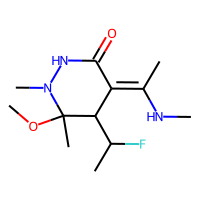
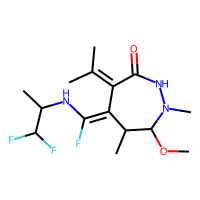
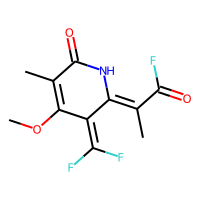
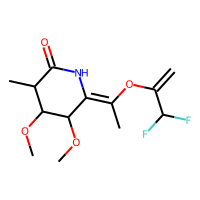
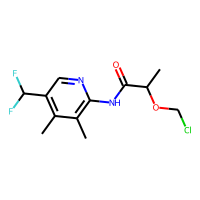
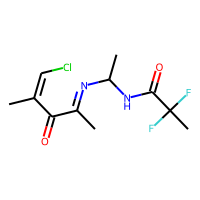
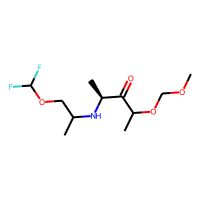
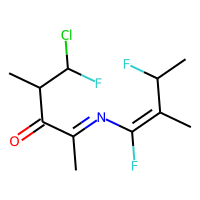
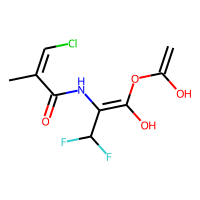
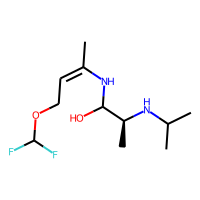

In [508]:
copy_combined_new_df = mol_file.copy()

copy_combined_new_df = copy_combined_new_df.reset_index(drop=True)

copy_mol_list_1 = []
src_mol_list = []

for index, row in copy_combined_new_df.iterrows():
    mol = row['mol']
    copy_mol_list_1.append(mol)
    
for index, row in src_df.iterrows():
    mol = row['mol']
    src_mol_list.append(mol)

index_list = []
sim_list = []
i_list = []

for i in range(len(copy_mol_list_1)):
    try:
        sim, ind = findMostLike(copy_mol_list_1[i], src_mol_list)
        i_list.append(i)
        sim_list.append(sim)
        index_list.append(ind)
    except:
        print(i)

sim_df = pd.DataFrame()
sim_df['original'] = i_list
sim_df['sim'] = sim_list
sim_df['index'] = index_list

sim_df = sim_df.sort_values(by=['sim'], ascending=False)

top_100_final_df = pd.DataFrame()
or_list = []
sim_list = []
mol_list_ind = []

display(sim_df)

for index, row in sim_df.iterrows():
    orig = row['original']
    top_index = row['index']
    #print(top_index), print(type(top_index))
    sim = row['sim']
    or_list.append(copy_mol_list_1[orig])
    sim_list.append(sim)
    for ind, ro in src_df.iterrows():
        if ind == top_index[0]:
            mol_list_ind.append(ro['smiles'])
    for ind, ro in copy_combined_new_df.iterrows():
        if ind == orig:
            top_100_final_df = top_100_final_df.append([ro])

#top_100_final_df.insert(0, 'known mol', or_list)
#top_100_final_df.insert(1, 'similarity', sim_list)
top_100_final_df

,known mol,similarity,0,mol
131,CO[C@@H]1[C@H](N(C)C(=O)c2ccccc2)C[C@H]2O[C@]1...,[0.5],COC(N(C)NC(=O)C1=C(C)NC)(C)c1C(C)F,
129,CN1CCN(c2ccc(Nc3ncc4c(n3)N3CCC(=O)N3C(c3cc(O)c...,[0.4778959149412423],COC(N(C)NC(=O)C1=C(C)C)C(C)c1=C(F)NC(C)C(F)F,
136,CO[C@H]1[C@@H](N(C)C(=O)CNC(=O)OC(C)(C)C)C[C@@...,[0.44560439560439563],COc1c(C)C(=O)NC(=C(C)C(=O)F)c1=C(F)F,
141,CO[C@@H]1[C@H](N(C)C(=O)c2ccccc2)C[C@H]2O[C@]1...,[0.43516972732331666],COC1C(C)C(=O)NC(=C(C)OC(=C)/C(F)F)c1OC,
92,Cc1cc(Nc2cc(C)c(C#N)c(N[C@@H](C)CCCC(C)(C)O)n2...,[0.4335154826958106],ClCOC(C)C(=O)NC1=C(C)C(C)=C(C(F)F)cn1,
...,...,...,...,...
75,COc1cc(-c2nn([C@@H]3CC[C@@H](N4CCN(C)CC4)CC3)c...,[0.2134756504336224],ClC=C(C)C(=O)C(=NC(C)NC(=O)C(F)(F)C)C,
195,COC(=O)C(=O)C(=O)c1ccc(C[C@@H](NC(C)=O)C(=O)N[...,[0.20600414078674947],COCOC(C)C(=O)[C@H](C)NC(C)C/OC(F)F,
25,CCOC(=O)C[C@@H]1C[C@H](n2cc(-c3ccccc3)c3c(N)nc...,[0.2058226134055518],ClC(C(C)C(=O)C(C)=NC(=C(C)C(C)F)F)F,
78,COc1cccc(-c2cn(-c3cccc(C(=O)NCCC[P@](=O)(O)CP(...,[0.2047244094488189],ClC=C(C)C(=O)NC(=C(O)OC(=C)/O)C(F)F,

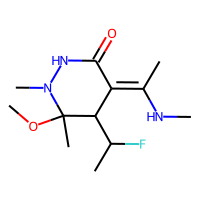
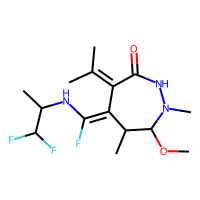
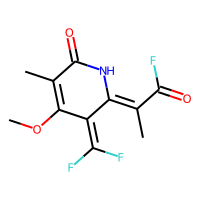
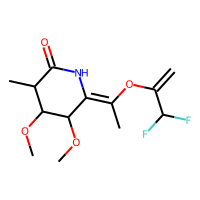
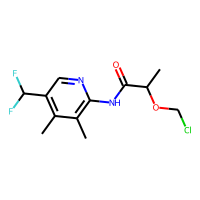
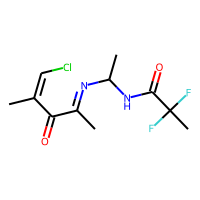
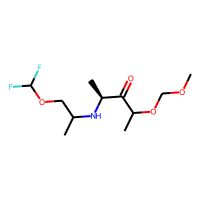
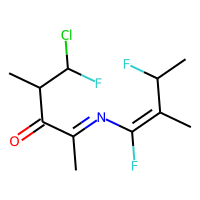
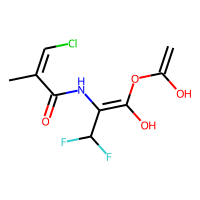
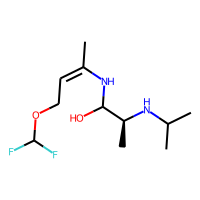

In [509]:
top_100_final_df.insert(0, 'known mol', mol_list_ind)
top_100_final_df.insert(1, 'similarity', sim_list)
top_100_final_df

In [510]:
top_100_final_df = top_100_final_df.reset_index(drop=True)

,known mol,similarity,smiles,mol
0,CO[C@@H]1[C@H](N(C)C(=O)c2ccccc2)C[C@H]2O[C@]1...,[0.5],COC(N(C)NC(=O)C1=C(C)NC)(C)c1C(C)F,
1,CN1CCN(c2ccc(Nc3ncc4c(n3)N3CCC(=O)N3C(c3cc(O)c...,[0.4778959149412423],COC(N(C)NC(=O)C1=C(C)C)C(C)c1=C(F)NC(C)C(F)F,
2,CO[C@H]1[C@@H](N(C)C(=O)CNC(=O)OC(C)(C)C)C[C@@...,[0.44560439560439563],COc1c(C)C(=O)NC(=C(C)C(=O)F)c1=C(F)F,
3,CO[C@@H]1[C@H](N(C)C(=O)c2ccccc2)C[C@H]2O[C@]1...,[0.43516972732331666],COC1C(C)C(=O)NC(=C(C)OC(=C)/C(F)F)c1OC,
4,Cc1cc(Nc2cc(C)c(C#N)c(N[C@@H](C)CCCC(C)(C)O)n2...,[0.4335154826958106],ClCOC(C)C(=O)NC1=C(C)C(C)=C(C(F)F)cn1,
...,...,...,...,...
95,C[C@H]1C=CC(c2nn(C3=CCCC(C(=O)NCCC[P@](=O)(O)C...,[0.3180987202925046],COC1c(C)C(=O)NC(=C(C)C(=O)/C)cc(F)cc1,
96,CO[C@H]1[C@@H](N(C)C(=O)CNC(=O)OC(C)(C)C)C[C@@...,[0.3160322952710496],ClC1C(C)C(=O)[C@H](C)NC(C(F)N/C(F)F)o1,
97,CC(=O)N[C@@H](Cc1ccc(C(F)(F)P(=O)(O)O)cc1)C(=O...,[0.3157543391188251],COCOC(C)C(=O)NC(=C(C)NC1=C)C(F)occcc1,
98,COc1cc(-c2nn([C@@H]3CC[C@H](N4CCN(C)CC4)CC3)c3...,[0.31518257527226134],COCOC(C)C(=O)NC1=C(C)NC(C(C)N=C(F)F)C1,

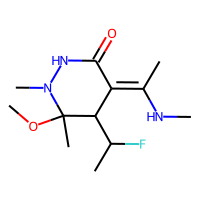
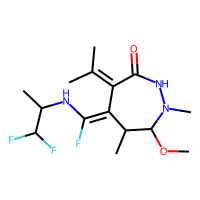
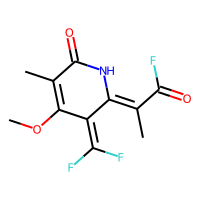
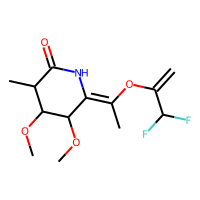
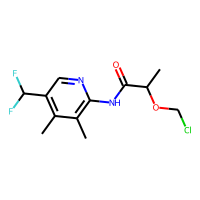
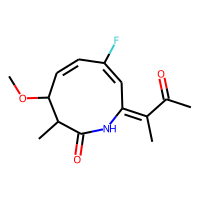
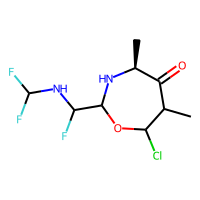
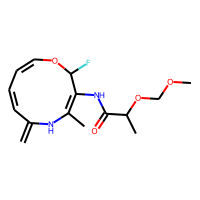
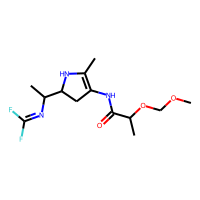
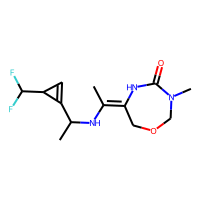

In [515]:
top_100_1 = top_100_final_df.head(100)
top_100_1 = top_100_1.rename(columns = {0: 'smiles'})
#PandasTools.AddMoleculeColumnToFrame(top_100_1, smilesCol='known mol')
display(top_100_1)

In [516]:
#top_100_1.to_csv('Top_100_Mol.csv', index=False)
#top_100_1 = pd.read_csv('KnownMol_Smiles.csv', header=0)
PandasTools.AddMoleculeColumnToFrame(top_100_1, smilesCol='known mol')
PandasTools.SaveXlsxFromFrame(top_100_1, "BO_Images_Known.xlsx", molCol='ROMol')

In [184]:
top_100_1.drop('mol', axis=1, inplace=True)

/home/kas/anaconda3/envs/chemvae/lib/python3.6/site-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [186]:
PandasTools.AddMoleculeColumnToFrame(top_100_1, smilesCol='smiles')
PandasTools.SaveXlsxFromFrame(top_100_1, "KnownMol_Generated.xlsx", molCol='ROMol')

In [451]:
unbias = pd.read_csv('Unbiased_final.csv', header=0)
bias=pd.read_csv('Biased_final.csv', header=0)

In [452]:
unbias.drop('mol', axis=1, inplace=True)
bias.drop('mol', axis=1, inplace=True)

In [450]:
PandasTools.AddMoleculeColumnToFrame(unbias, smilesCol='created')
PandasTools.SaveXlsxFromFrame(unbias, "Generated_Unbias.xlsx", molCol='ROMol')

PandasTools.AddMoleculeColumnToFrame(bias, smilesCol='created')
PandasTools.SaveXlsxFromFrame(bias, "Generated_Bias.xlsx", molCol='ROMol')

In [453]:
PandasTools.AddMoleculeColumnToFrame(unbias, smilesCol='known')
PandasTools.SaveXlsxFromFrame(unbias, "Known_Unbias.xlsx", molCol='ROMol')

PandasTools.AddMoleculeColumnToFrame(bias, smilesCol='known')
PandasTools.SaveXlsxFromFrame(bias, "Known_Bias.xlsx", molCol='ROMol')

In [198]:
for index, row in top_100_1.iterrows():
    for ind, ro in src_df.iterrows():
        if(row['known mol'] == ro['mol']):
            print(index)

# Statistics

In [277]:
def undo_classes(df):
    for index, row in df.iterrows():
        if row['Class'] == 0.0:
            row['Class'] = 'ABL1'
        elif row['Class'] == 2.0:
            row['Class'] = 'CSF1R'
        elif row['Class'] == 3.0:
            row['Class'] = 'EGFR'
        elif row['Class'] == 4.0:
            row['Class'] = 'FLT3'
        elif row['Class'] == 5.0:
            row['Class'] = 'KDR'
        elif row['Class'] == 6.0:
            row['Class'] = 'LCK'
        elif row['Class'] == 7.0:
            row['Class'] = 'MAPK10'
        elif row['Class'] == 8.0:
            row['Class'] = 'MAPK14'
        elif row['Class'] == 9.0:
            row['Class'] = 'MET'
        return df

In [278]:
#abl1_df['Class']=0
#src_df['Class']=1
#csf1r_df['Class']=2
#egfr_df['Class']=3
#flt3_df['Class']=4
#kdr_df['Class']=5
#lck_df['Class']=6
#mapk10_df['Class']=7
#mapk14_df['Class']=8
#met_df['Class']=9

In [336]:
top_100_1 = undo_classes(top_100_1)
combined_new_df = undo_classes(combined_new_df)
combined_df = undo_classes(combined_df)
orig_perturb = undo_classes(orig_perturb)

First


,known mol,similarity,smiles,distance,count,frequency,mol,Class,qed,logP,...,arocarbo,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable,kinase inhibition likeliness,ROMol
0,,[1.0],Clc1cccc(Nc2ncnc3n[nH]c(Nc4cccc(Cl)c4)c23)c1,5.438142,164,0.694915,,0.0,0.768132,3.608437,...,2,2,4,0,0,5,3,4,0.771417,
1,,[1.0],Clc1cccc(Nc2ncnc3n[nH]c(Nc4cccc(Cl)c4)c32)c1,5.438142,3,0.012712,,0.0,0.638163,3.995589,...,2,2,4,0,0,5,3,4,0.812750,
2,,[0.9336332958380202],c1ccc(Nc2ncnc3n[nH]c(-c4ccccc4)c23)cc1,6.008591,11,0.088710,,0.0,0.638163,3.995589,...,2,2,4,0,0,4,2,3,0.800634,
3,,[0.9336332958380202],c1ccc(Nc2ncnc3n[nH]c(-c4ccccc4)c32)cc1,6.008591,1,0.008065,,0.0,0.520676,2.336694,...,2,2,4,0,0,4,2,3,0.831417,
4,,[0.9266837169650469],Cc1nc(Nc2ncc(C(=O)Nc3c(C)cccc3Cl)s2)cc(N2CCNC(...,7.005438,11,0.075862,,6.0,0.593231,3.250153,...,1,2,3,0,0,8,3,5,0.755833,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,,[0.5530005608524958],COc1cc(Nc2ncc(C)c(-c3ccc4c(n3)NC(=O)C(C)(C)C4)...,7.692990,1,1.000000,,4.0,0.768132,3.608437,...,1,2,3,0,0,8,2,6,0.757734,
96,,[0.5519828510182208],CS(=O)(=O)Nc1ccc(-c2ccnc(Nc3ccc(-n4cncn4)cc3)n...,5.594094,1,0.002740,,7.0,0.638163,3.995589,...,2,2,4,0,0,8,2,6,0.777897,
97,,[0.5503030303030303],Cc1nc(Nc2ccc(C(=O)Oc3c(C)cccc3Cl)s2)cc(N2CCNC(...,7.773149,1,0.006757,,2.0,0.584673,2.312750,...,1,2,3,0,0,8,2,5,0.770333,
98,,[0.5495923913043478],Cc1nc(Nc2ccc(C(=O)Oc3c(C)cccc3Cl)s2)cc(N2CCNC(...,8.154326,1,0.006757,,2.0,0.707467,3.934130,...,1,2,3,2,0,8,2,5,0.799571,

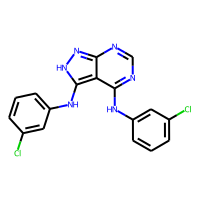
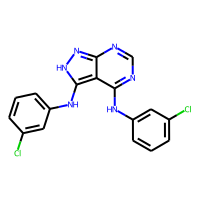
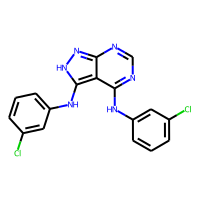
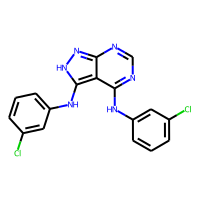
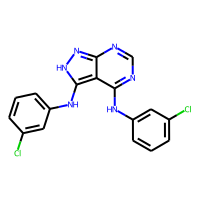
...
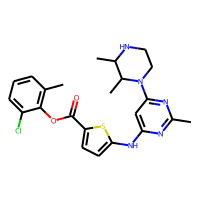
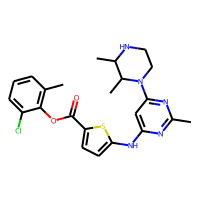
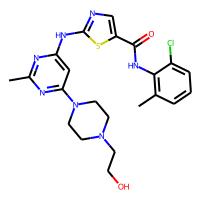
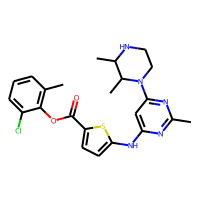
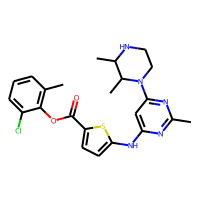

In [337]:
top_100_1

In [338]:
top_100_stats = top_100_1['Class'].value_counts() # top 100
combined_new_stats = combined_new_df['Class'].value_counts() # unique molecules with kinase higher than 0.75
combined_stats = combined_df['Class'].value_counts() # total unique molecules
orig_stats = orig_perturb['Class'].value_counts() #original perturbation

classes = ['ABL1', 'CSF1R', 'EGFR', 'FLT3', 'KDR', 'LCK', 'MAPK10', 'MAPK14', 'MET']

In [274]:
top_classes = ['ABL1', 'CSF1R', 'FLT3', 'KDR', 'LCK', 'MAPK10', 'MAPK14', 'MET']

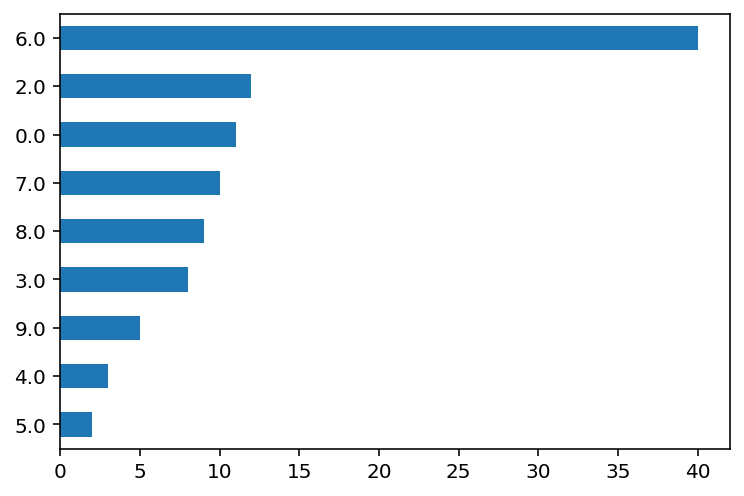

In [339]:
top_100_stats.sort_values().plot(kind = 'barh')
plt.savefig(fname='Top_Stats.png',dpi=500)

In [340]:
top_100_stats, len(top_100_1)

(6.0    40
 2.0    12
 0.0    11
 7.0    10
 8.0     9
 3.0     8
 9.0     5
 4.0     3
 5.0     2
 Name: Class, dtype: int64,
 100)

In [341]:
top_100_stats/len(top_100_1)

6.0    0.40
2.0    0.12
0.0    0.11
7.0    0.10
8.0    0.09
3.0    0.08
9.0    0.05
4.0    0.03
5.0    0.02
Name: Class, dtype: float64

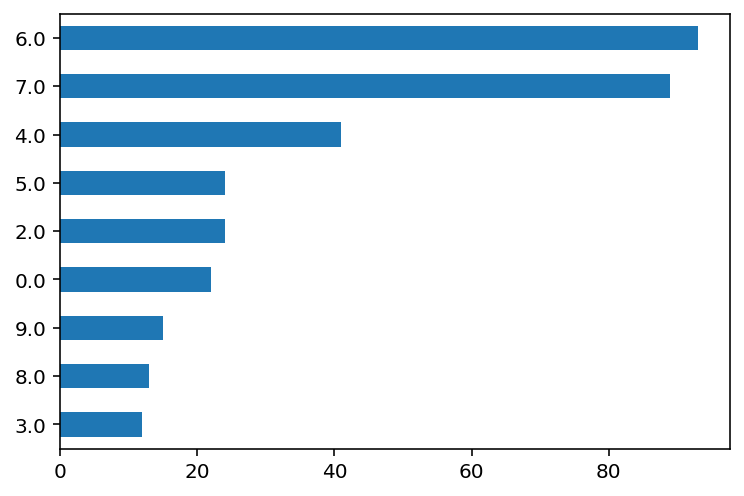

In [307]:
combined_new_stats.sort_values().plot(kind = 'barh')
plt.savefig(fname='Over_0.75_Stats.png',dpi=500)

In [298]:
combined_new_stats, len(combined_new_df)

(6.0    93
 7.0    89
 4.0    41
 2.0    24
 5.0    24
 0.0    22
 9.0    15
 8.0    13
 3.0    12
 Name: Class, dtype: int64,
 333)

In [301]:
combined_new_stats/len(combined_new_df)

6.0    0.279279
7.0    0.267267
4.0    0.123123
2.0    0.072072
5.0    0.072072
0.0    0.066066
9.0    0.045045
8.0    0.039039
3.0    0.036036
Name: Class, dtype: float64

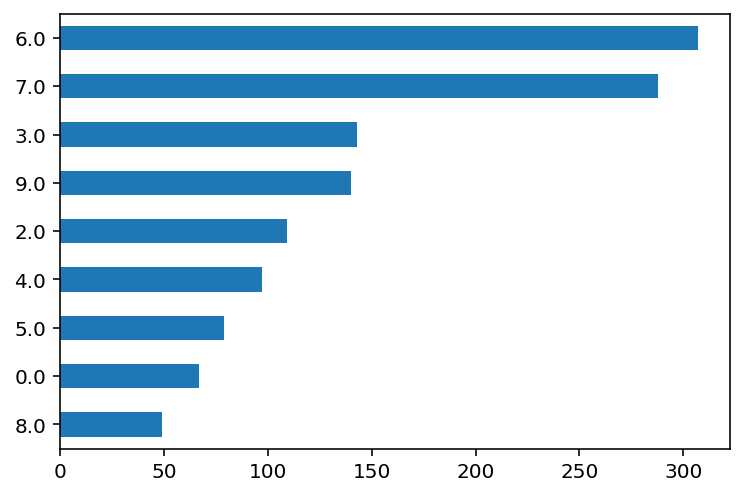

In [308]:
combined_stats.sort_values().plot(kind = 'barh')
plt.savefig(fname='Total_Unique_Stats.png',dpi=500)

In [299]:
combined_stats, len(combined_df)

(6.0    307
 7.0    288
 3.0    143
 9.0    140
 2.0    109
 4.0     97
 5.0     79
 0.0     67
 8.0     49
 Name: Class, dtype: int64,
 1279)

In [302]:
combined_stats/len(combined_df)

6.0    0.240031
7.0    0.225176
3.0    0.111806
9.0    0.109461
2.0    0.085223
4.0    0.075841
5.0    0.061767
0.0    0.052385
8.0    0.038311
Name: Class, dtype: float64

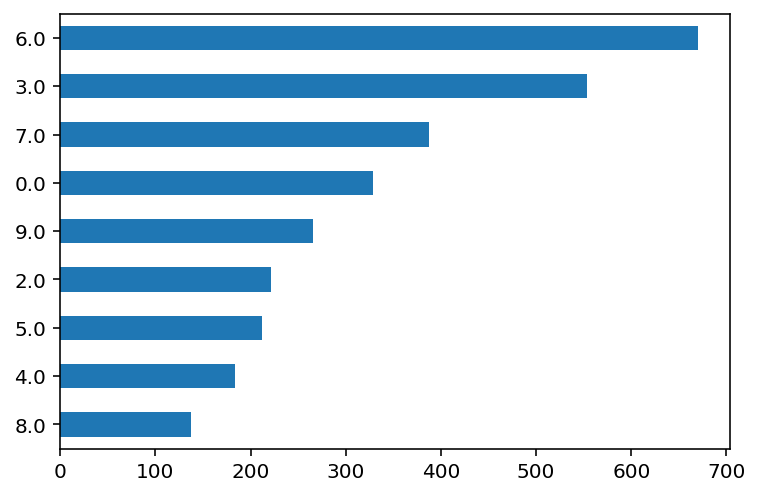

In [309]:
orig_stats.sort_values().plot(kind = 'barh')
plt.savefig(fname='Total_Stats.png',dpi=500)

In [296]:
orig_stats, len(orig_perturb)

(6.0    670
 3.0    554
 7.0    388
 0.0    329
 9.0    266
 2.0    222
 5.0    212
 4.0    184
 8.0    137
 Name: Class, dtype: int64,
 2962)

In [303]:
orig_stats/len(orig_perturb)

6.0    0.226199
3.0    0.187036
7.0    0.130993
0.0    0.111074
9.0    0.089804
2.0    0.074949
5.0    0.071573
4.0    0.062120
8.0    0.046253
Name: Class, dtype: float64

# Ignore This Perturbation

# Pertubation

In [112]:
from sklearn.cluster import KMeans
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
IPythonConsole.ipython_useSVG=False
from rdkit.Chem.PandasTools import FrameToGridImage
from rdkit.Chem.rdMolDescriptors import *

In [113]:
noise = 3.0
scalar = 0.8
decode = True
decode_attempts = 500
trial = 10

if(decode == True):
    path = "_" + str(trial) + "_" + str(scalar) + "_" + str(noise) + "_" + str(decode) + '_' + str(decode_attempts) + '.xlsx'
else:
    path = "_" + str(trial) + "_" + str(scalar) + "_" + str(noise) + "_" + str(decode) + '.xlsx'

In [ ]:
subset_encoded_mapk14_smiles = encoded_mapk14_smiles

subset_encoded_mapk14_smiles = subset_encoded_mapk14_smiles.reshape(len(subset_encoded_mapk14_smiles), 196)

dataframe = pd.DataFrame(subset_encoded_mapk14_smiles)

kmeans = KMeans(n_clusters=3, n_init=100)
y = kmeans.fit_predict(dataframe)

dataframe["Cluster"] = y

c1 = []
c2 = []
c3 = []

for index, row in dataframe.iterrows():
    if(row['Cluster'] == 0.0):
        c1.append(row)
    elif(row['Cluster'] == 1.0):
        c2.append(row)
    elif(row['Cluster'] == 2.0):
        c3.append(row)
    else:
        print('Fail')

cluster_1 = pd.DataFrame(c1)
cluster_2 = pd.DataFrame(c2)
cluster_3 = pd.DataFrame(c3)

cluster_1 = cluster_1.drop(columns=['Cluster'])
cluster_2 = cluster_2.drop(columns=['Cluster'])
cluster_3 = cluster_3.drop(columns=['Cluster'])
cluster_1 = np.asarray(cluster_1)
cluster_2 = np.asarray(cluster_2)
cluster_3 = np.asarray(cluster_3)


modified_cluster_1_3 = []
modified_cluster_2_3 = []
modified_cluster_3_3 = []

average_1 = np.average(cluster_1, axis=0).reshape(1, len(cluster_1[1]))
average_2 = np.average(cluster_2, axis=0).reshape(1, len(cluster_2[1]))
average_3 = np.average(cluster_3, axis=0).reshape(1, len(cluster_3[1]))

for i in cluster_1:
    m_1 = scalar*(i - average_1)
    modified_cluster_1_3.append(m_1)
    
for i in cluster_2:
    m_1 = scalar*(i - average_2)
    modified_cluster_2_3.append(m_1)
    
for i in cluster_3:
    m_1 = scalar*(i - average_3)
    modified_cluster_3_3.append(m_1)    
    
    
smiles_1 = []
smiles_2 = []
smiles_3 = []

m_df_1_3 = pd.DataFrame()
m_df_2_3 = pd.DataFrame()
m_df_3_3 = pd.DataFrame()


kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0
kinase_array_1_3 = []
kinase_array_2_3 = []
kinase_array_3_3 = []

for i in modified_cluster_1_3:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_1_3.append(kinase_inhibition_score)
        #y_1[temp_1] = i
        m_df_1_3 = pd.concat([m, m_df_1_3])
        

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_2_3:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_2_3.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_2_3 = pd.concat([m, m_df_2_3])

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_3_3:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_3_3.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_3_3 = pd.concat([m, m_df_3_3])


In [ ]:
temp_1 = 0
temp_2 = 0
temp_3 = 0

y_1 = np.zeros(shape=(len(modified_cluster_1_3)*decode_attempts, 3))
y_2 = np.zeros(shape=(len(modified_cluster_2_3)*decode_attempts, 3))
y_3 = np.zeros(shape=(len(modified_cluster_3_3)*decode_attempts, 3))

for index, row in m_df_1_3.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_1[temp_1] = temp_y
    temp_1+= 1

y_1_3 = pd.DataFrame(y_1, columns=['qed', 'logP', 'SAS'])
y_1_3 = y_1_3[(y_1_3.T != 0).any()]

m_df_1_3['qed'] = y_1_3['qed']
m_df_1_3['logP'] = y_1_3['logP']
m_df_1_3['SAS'] = y_1_3['SAS']

for index, row in m_df_2_3.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_2[temp_2] = temp_y
    temp_2+= 1
    
y_2_3 = pd.DataFrame(y_2, columns=['qed', 'logP', 'SAS'])
y_2_3 = y_2_3[(y_2_3.T != 0).any()]

m_df_2_3['qed'] = y_2_3['qed']
m_df_2_3['logP'] = y_2_3['logP']
m_df_2_3['SAS'] = y_2_3['SAS']

for index, row in m_df_3_3.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_3[temp_3] = temp_y
    temp_3+= 1
    
y_3_3 = pd.DataFrame(y_3, columns=['qed', 'logP', 'SAS'])
y_3_3 = y_3_3[(y_3_3.T != 0).any()]

m_df_3_3['qed'] = y_3_3['qed']
m_df_3_3['logP'] = y_3_3['logP']
m_df_3_3['SAS'] = y_3_3['SAS']

new_c_1_3 = m_df_1_3.copy()
new_c_2_3 = m_df_2_3.copy()
new_c_3_3 = m_df_3_3.copy()

#new_c_1_3 = new_c_1_3.reset_index(drop=True)
#new_c_2_3 = new_c_2_3.reset_index(drop=True)
#new_c_3_3 = new_c_3_3.reset_index(drop=True)

for index, row in new_c_1_3.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_1_3 = new_c_1_3.drop(index)
    
for index, row in new_c_2_3.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_2_3 = new_c_2_3.drop(index)

for index, row in new_c_3_3.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_3_3 = new_c_3_3.drop(index)

new_c_1_3 = new_c_1_3.drop_duplicates(subset=['smiles'])
new_c_2_3 = new_c_2_3.drop_duplicates(subset=['smiles'])
new_c_3_3 = new_c_3_3.drop_duplicates(subset=['smiles'])


print('Cluster 1: ')
display(new_c_1_3)
print('Cluster 2: ')
display(new_c_2_3)
print('Cluster 3: ')
display(new_c_3_3)

temp_c_1_3 = new_c_1_3.copy()
temp_smile_1_3 = []
for index, row in temp_c_1_3.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_smile_1_3.append(temp_s_c)
temp_c_1_3['smiles'] = temp_smile_1_3

temp_c_2_3 = new_c_2_3.copy()
temp_smile_2_3 = []
for index, row in temp_c_2_3.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_smile_2_3.append(temp_s_c)
temp_c_2_3['smiles'] = temp_smile_2_3

temp_c_3_3 = new_c_3_3.copy()
temp_smile_3_3 = []
for index, row in temp_c_3_3.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_smile_3_3.append(temp_s_c)
temp_c_3_3['smiles'] = temp_smile_3_3



In [ ]:
master_smiles = pd.DataFrame(en_mapk14_smiles, columns=['smiles'])
temp_master_smiles = pd.DataFrame()
temp_master_list = []
for index, row in master_smiles.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_master_list.append(temp_s_c)
#print(temp_master_list)
temp_master_smiles['smiles'] = temp_master_list

new_c_1_3 = new_c_1_3.assign(result=temp_c_1_3['smiles'].isin(temp_master_smiles['smiles']).astype(int))
new_c_2_3 = new_c_2_3.assign(result=temp_c_2_3['smiles'].isin(temp_master_smiles['smiles']).astype(int))
new_c_3_3 = new_c_3_3.assign(result=temp_c_3_3['smiles'].isin(temp_master_smiles['smiles']).astype(int))

for index, row in new_c_1_3.iterrows():
    if row['result'] == 1:
        new_c_1_3.drop(index, inplace=True)
for index, row in new_c_2_3.iterrows():
    if row['result'] == 1:
        new_c_2_3.drop(index, inplace=True)
for index, row in new_c_3_3.iterrows():
    if row['result'] == 1:
        new_c_3_3.drop(index, inplace=True)
        
print('Cluster 1 Uniques: ')
display(new_c_1_3)
print('Cluster 2 Uniques: ')
display(new_c_2_3)
print('Cluster 3 Uniques: ')
display(new_c_3_3)

In [272]:
new_c_1_3 = get_attributes(new_c_1_3)
new_c_2_3 = get_attributes(new_c_2_3)
new_c_3_3 = get_attributes(new_c_3_3)

new_c_1_3 = new_c_1_3.drop(columns=['kinase inhibition likeliness'])
new_c_2_3 = new_c_2_3.drop(columns=['kinase inhibition likeliness'])
new_c_3_3 = new_c_3_3.drop(columns=['kinase inhibition likeliness'])

In [273]:
def change_order(df):
    cols = list(df.columns.values)
    cols.pop(cols.index('qed')) 
    cols.pop(cols.index('logP'))
    cols.pop(cols.index('SAS'))
    df = df[cols+['qed','SAS', 'logP']]
    return df


In [274]:
c_1_3_back = new_c_1_3.copy()
c_2_3_back = new_c_2_3.copy()
c_3_3_back = new_c_3_3.copy()

new_c_1_3_rf = c_1_3_back.drop(columns=['smiles', 'mol', 'distance', 'count', 'frequency', 'result'])
new_c_2_3_rf = c_2_3_back.drop(columns=['smiles', 'mol', 'distance', 'count', 'frequency', 'result'])
new_c_3_3_rf = c_3_3_back.drop(columns=['smiles', 'mol', 'distance', 'count', 'frequency', 'result'])

#new_c_1_3_rf = change_order(new_c_1_3_rf)
#new_c_2_3_rf = change_order(new_c_2_3_rf)
#new_c_3_3_rf = change_order(new_c_3_3_rf)

display(new_c_3_3_rf)

#print(new_c_3_3_rf.columns)

probs_1 = forest_b.predict_proba(new_c_1_3_rf)
probs_2 = forest_b.predict_proba(new_c_2_3_rf)
probs_3 = forest_b.predict_proba(new_c_3_3_rf)

preds_1 = probs_1[:,1]
preds_2 = probs_2[:,1]
preds_3 = probs_3[:,1]

new_c_1_3_rf['kinase inhibition likeliness'] = preds_1
new_c_2_3_rf['kinase inhibition likeliness'] = preds_2
new_c_3_3_rf['kinase inhibition likeliness'] = preds_3

new_c_1_3_rf = new_c_1_3_rf.sort_values(by=['kinase inhibition likeliness'], ascending=False)
new_c_2_3_rf = new_c_2_3_rf.sort_values(by=['kinase inhibition likeliness'], ascending=False)
new_c_3_3_rf = new_c_3_3_rf.sort_values(by=['kinase inhibition likeliness'], ascending=False)

,qed,logP,SAS,rings,weight,csp3,hallkier,laputeASA,alicarbo,alihetero,alirings,amidebonds,arocarbo,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable
3189,0.643106,2.792830,2.667862,4,541.268905,0.290323,-4.66,233.889379,0,1,1,5,3,0,3,2,0,4,4,8
5533,0.643106,2.792830,2.667862,4,357.135151,0.047619,-3.32,155.918424,0,0,0,0,2,2,4,0,0,5,2,5
1864,0.536285,2.723334,3.561903,4,525.273990,0.258065,-4.59,229.038254,0,1,1,4,3,0,3,1,0,4,4,8
1143,0.583629,2.785473,2.703213,4,561.214282,0.300000,-4.08,238.242616,0,3,3,1,1,0,1,3,2,8,2,6
1081,0.643106,2.792830,2.667862,4,439.146283,0.166667,-3.22,183.216337,0,0,0,0,2,2,4,2,0,5,2,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3561,0.536285,2.723334,3.561903,4,379.133220,0.142857,-3.61,161.049351,0,2,2,1,2,0,2,0,0,5,1,3
3923,0.581812,2.722892,2.789780,5,408.171689,0.391304,-2.21,175.611963,0,2,2,0,1,2,3,1,0,4,1,4
4277,0.792958,2.544927,2.273105,4,403.141911,0.380952,-2.60,166.983940,1,2,3,2,1,0,1,0,0,4,1,4
5256,0.579361,2.985789,2.926103,4,361.153875,0.150000,-3.61,156.405829,0,1,1,1,2,1,3,0,0,6,1,4


Index(['qed', 'logP', 'SAS', 'rings', 'weight', 'csp3', 'hallkier',
       'laputeASA', 'alicarbo', 'alihetero', 'alirings', 'amidebonds',
       'arocarbo', 'arohetero', 'arorings', 'stereocenter', 'bridgehead',
       'hba', 'hbd', 'rotatable'],
      dtype='object')


In [275]:
display(new_c_1_3_rf)

,qed,logP,SAS,rings,weight,csp3,hallkier,laputeASA,alicarbo,alihetero,...,amidebonds,arocarbo,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable,kinase inhibition likeliness
3319,0.580307,3.110559,4.336488,4,294.067224,0.062500,-2.46,125.749995,0,1,...,0,1,2,3,1,0,3,1,2,0.936750
167,0.562232,3.029897,5.233546,4,318.184447,0.250000,-2.59,141.768162,0,1,...,0,2,1,3,0,0,2,2,3,0.912324
3317,0.562232,3.029897,5.233546,4,298.062139,0.133333,-2.40,125.188201,0,1,...,0,1,2,3,1,0,4,1,3,0.905750
3635,0.563533,3.061819,5.083805,4,481.211390,0.142857,-4.72,209.527782,0,0,...,2,2,2,4,0,0,6,2,8,0.905174
3942,0.562232,3.029897,5.233546,4,306.100442,0.055556,-3.21,131.055675,0,0,...,0,2,2,4,0,0,4,2,3,0.902667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,0.562232,3.029897,5.233546,4,275.051320,0.133333,-1.87,112.179692,2,2,...,1,0,0,0,1,2,1,1,1,0.324231
4467,0.795237,4.773947,3.146462,4,270.030839,0.000000,-2.40,112.406382,1,0,...,0,0,3,3,0,0,5,0,2,0.280861
5413,0.563533,3.061819,5.083805,5,281.093104,0.538462,-1.33,113.923057,1,4,...,1,0,0,0,2,4,4,1,2,0.280000
4471,0.682201,4.599006,2.832025,4,270.030839,0.000000,-2.40,112.406382,1,0,...,0,0,3,3,0,0,5,0,2,0.260028


,smiles,mol,rings,weight,csp3,hallkier,laputeASA,alicarbo,alihetero,alirings,...,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable,qed,SAS,logP
0,c1ccc(Nc2ncnc3n[nH]c(Nc4ccccc4)c23)cc1,,4,302.127994,0.000000,-3.41,132.163538,0,0,0,...,2,4,0,0,5,3,4,0.580019,2.182841,3.455185
1,O=C(Nc1nnc(SCc2ccccc2)s1)c1ccc(F)cc1,,3,345.040582,0.062500,-2.25,140.323618,0,0,0,...,1,3,0,0,5,1,5,0.669666,2.072351,3.940630
2,COC(=O)/N=c1\[nH]c2ccc(C(=O)c3ccccc3)cc2[nH]1,,3,295.095691,0.062500,-3.15,125.025709,0,0,0,...,1,3,0,0,3,2,2,0.620621,2.464449,1.983672
3,COC(=O)/N=c1\[nH]c2ccc(C(=O)c3ccccc3)cc2[nH]1,,3,295.095691,0.062500,-3.15,125.025709,0,0,0,...,1,3,0,0,3,2,2,0.620621,2.464449,1.983672
4,O=C(Nc1ncc(Cc2ccc(Cl)cc2)s1)c1cccs1,,3,334.000133,0.066667,-1.69,134.790501,0,0,0,...,2,3,0,0,4,1,4,0.665786,2.085265,4.494634
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1878,CNC(=O)c1cc(Oc2ccc(NC(=O)Nc3cc(C(C)(C)C)nn3-c3...,,4,498.237939,0.214286,-4.66,215.435280,0,0,0,...,2,4,0,0,6,3,6,0.498544,2.276690,5.176546
1879,Cc1ccc(-n2nc(C(C)(C)C)cc2NC(=O)Nc2ccc(C)c(Nc3n...,,5,532.269908,0.193548,-5.05,233.291661,0,0,0,...,3,5,0,0,7,3,6,0.519861,2.487682,5.939137
1880,Cc1ccc(NC(=O)Nc2ccc(Cl)c(C(F)(F)F)c2)cc1Nc1ncc...,,4,498.118272,0.083333,-4.18,202.967437,0,0,0,...,2,4,0,0,5,3,5,0.542233,2.436539,5.974671
1881,O=C(Nc1ccc(OCCN2CCOCC2)cc1)Nc1ccc(Cl)c(C(F)(F)...,,3,443.122354,0.350000,-2.49,176.450246,0,1,1,...,0,2,0,0,4,2,6,0.621440,1.996526,4.281375

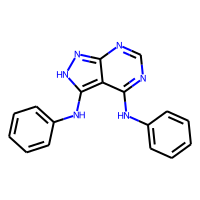
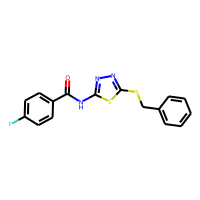
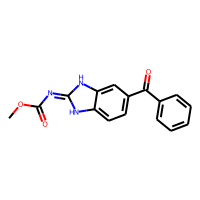
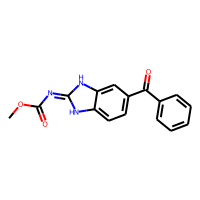
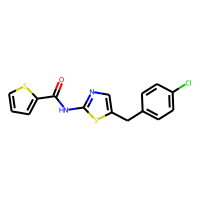
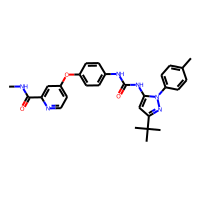
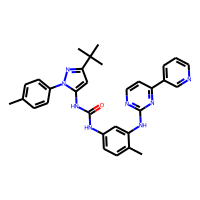
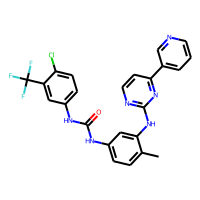
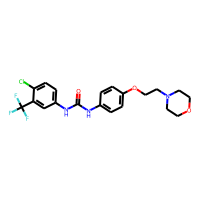
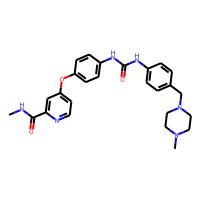

In [351]:
abl1_df

# Histograms for Attributes across Classes

In [352]:
def hist_attr(attr):
    fig, ax = plt.subplots(2, 5, figsize=(20, 20))
    n = 10
    colors = ['teal', 'firebrick','gold','darkorange','forestgreen','turquoise','deepskyblue','grey','darkviolet','magenta']
    df_list = [abl1_df, src_df,csf1r_df,egfr_df,flt3_df,kdr_df,lck_df,mapk10_df,mapk14_df,met_df]
    title_list = ['abl1_df', 'src_df','csf1r_df','egfr_df','flt3_df','kdr_df','lck_df','mapk10_df','mapk14_df','met_df']
    ax= ax.ravel()
    for i in range(n):
        ax[i].hist(df_list[i][attr], color=colors[i])
        ax[i].set_title(title_list[i][:-3] + ' ' +attr)
    
    png = attr.capitalize()
    plt.savefig('graphs/'+png+'.png',dpi=500)

## QED

In [ ]:
hist_attr('qed')

## SAS

In [ ]:
hist_attr('SAS')

## LogP

In [ ]:
hist_attr('logP')

## Rings

In [ ]:
hist_attr('rings')

## Weights

In [ ]:
hist_attr('weight')

## CSP3

In [ ]:
hist_attr('csp3')

## HallKier

In [ ]:
hist_attr('hallkier')

## LaputeASA

In [ ]:
hist_attr('laputeASA')

## AliCarbo

In [ ]:
hist_attr('alicarbo')

## AliHetero

In [ ]:
hist_attr('alihetero')

## AliRings

In [ ]:
hist_attr('alirings')

## AmideBonds

In [ ]:
hist_attr('amidebonds')

## AroCarbo

In [ ]:
hist_attr('arocarbo')

## AroHetero

In [ ]:
hist_attr('arohetero')

## AroRings

In [ ]:
hist_attr('arorings')

## Stereocenter

In [ ]:
hist_attr('stereocenter')

## Bridgehead

In [ ]:
hist_attr('bridgehead')

## HBA

In [ ]:
hist_attr('hba')

## HBD

In [ ]:
hist_attr('hbd')

## Rotatable

In [ ]:
hist_attr('rotatable')

# Histograms of All Attributes for Each Family

## ABL1 Histogram

In [ ]:
abl1_df['rings'].hist(figsize=(25,25))

## SRC Histogram

In [ ]:
src_df.hist(figsize=(25,25), color='firebrick')

## CSF1R Histogram

In [ ]:
csf1r_df.hist(figsize=(25,25), color='gold')

## EGFR Histogram

In [ ]:
egfr_df.hist(figsize=(25,25), color='darkorange')

## FLT3 Histogram

In [ ]:
flt3_df.hist(figsize=(25,25), color='forestgreen')

## KDR Histogram

In [ ]:
kdr_df.hist(figsize=(25,25), color='turquoise')

## LCK Histogram

In [ ]:
lck_df.hist(figsize=(25,25), color='deepskyblue')

## MAPK10 Histogram

In [ ]:
mapk10_df.hist(figsize=(25,25), color='grey')

## MAPK14 Histogram

In [ ]:
mapk14_df.hist(figsize=(25,25), color='darkviolet')

## MET Histogram

In [ ]:
met_df.hist(figsize=(25,25), color='magenta')

# Preparing Molecules For Supervised Learning

In [40]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

In [41]:
forest = RandomForestClassifier()

In [42]:
labels = np.zeros(Z_combined.shape[0])
labels[:encoded_src_smiles.shape[0]] = 1
labels[encoded_src_smiles.shape[0]:encoded_abl1_smiles.shape[0]] = 1
labels[encoded_abl1_smiles.shape[0]:encoded_gdb_smiles.shape[0]] = 0

In [43]:
selectors = np.random.randint(0,Z_combined.shape[0],int(Z_combined.shape[0]/10))
non_selectors = []
for i in range(Z_combined.shape[0]):
    if i not in selectors:
        non_selectors.append(i)
z_train = Z_combined[non_selectors]
labels_train = labels[non_selectors]
z_test = Z_combined[selectors]
labels_test = labels[selectors]

In [44]:
cross_val_score(forest,z_train,labels_train,cv=3,scoring='f1')

array([0.29883206, 0.29037037, 0.34244604])

# Training SRC Kinase Inhibition Classifier

In [45]:
forest.fit(z_train,labels_train)

RandomForestClassifier()

In [46]:
test_pred = forest.predict(z_test)

In [47]:
probs = forest.predict_proba(z_test)
preds = probs[:,1]

In [48]:
from sklearn.metrics import classification_report,roc_curve,auc

In [49]:
classification_report(labels_test,test_pred)

'              precision    recall  f1-score   support\n\n         0.0       0.90      0.96      0.93       867\n         1.0       0.68      0.45      0.54       163\n\n    accuracy                           0.88      1030\n   macro avg       0.79      0.71      0.74      1030\nweighted avg       0.87      0.88      0.87      1030\n'

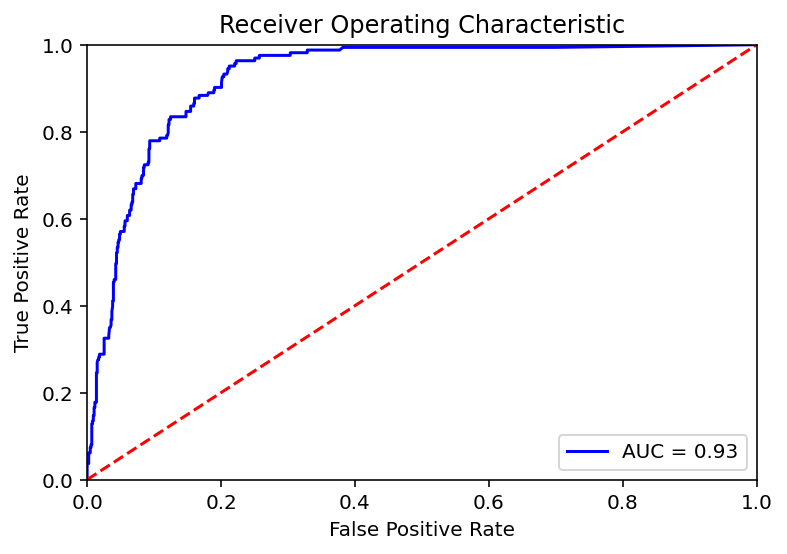

In [50]:
preds = probs[:,1]
fpr, tpr, threshold = roc_curve(labels_test, preds)
roc_auc = auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

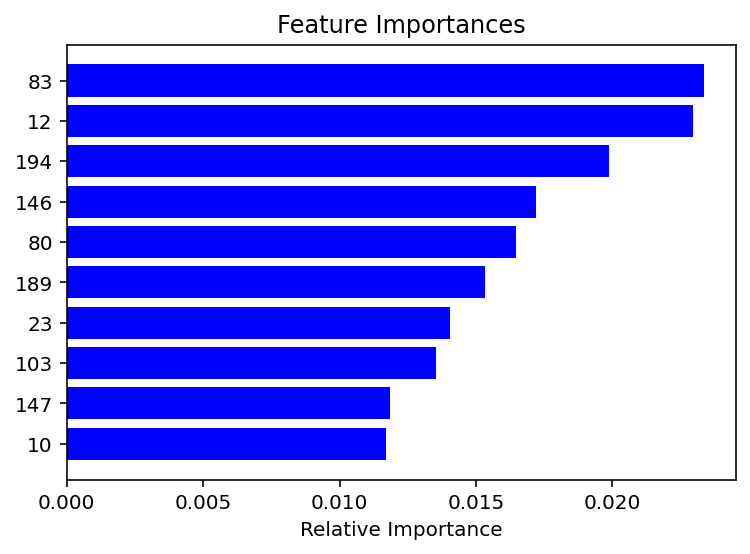

In [51]:
importances = forest.feature_importances_
indices = np.argsort(importances)[-10:]
features = [str(x) for x in range(196)]
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.savefig('forest_feature_importances.png',dpi=500)
plt.show()

In [52]:
Z_combined.shape

(10305, 196)

# Creating Reward Functions

## Reward Function With Kinase Inhibition likelihood and Druglikeliness Estimation

In [53]:
def predict_prop(value):
    value = value.reshape(1,196)
    vals = vae.predict_prop_Z(value)[0]
    return vals

In [54]:
def kinase_inhibition_likelihood(value):
    value = value.reshape(1,196)
    df = vae.z_to_smiles(value,decode_attempts=100,noise_norm=3.0)
    multiplier = 0
    if df.shape[0]>0:
        for i in df.smiles:
            if len(i) > 10:
                multiplier = 1
                break

    kinase_inhibition_score = forest.predict_proba(value)[0][1]
    final_score = multiplier*kinase_inhibition_score
    return final_score

In [55]:
def property_score_prediction_with_druglikeliness_non_BO(value):
    value = value.reshape(1,196)
    vals = vae.predict_prop_Z(value)[0]
    print(vals)
    qed = vals[0]
    SAS = vals[1]
    logP = vals[2]
    kinase_inhibition_score = forest.predict_proba(value)[0][1]
    final_score = kinase_inhibition_score*(1+(.3*qed+.3*SAS+.3*(5-logP)))
    return final_score

In [56]:
def property_score_prediction_with_similarity(**kwargs):
    try:
        value = []
        for i in range(196):
            value.append(kwargs['dimension'+str(i)])
        value = np.array(value).reshape(1,196)
        df = vae.z_to_smiles(value,decode_attempts=100,noise_norm=3.0)
        multiplier = 0
        fps=[]
        print(df.smiles)
        if df.shape[0]>0:
            for i in df.smiles:
                if len(i) > 10:
                    multiplier = 1
                    fps.append(Chem.RDKFingerprint(Chem.MolFromSmiles(i)))
        if multiplier==0:
            return 0
        src_sims = []
        for fp in fps:
            for j in src_mol_fingerprints:
                src_sims.append(DataStructs.FingerprintSimilarity(fp,j))
        average_sim = sum(src_sims)/len(src_sims)
        #kinase_inhibition_score = forest.predict_proba(value)[0][1]
        final_score = multiplier*average_sim #+ (.1*(1+(.3*qed+.3*SAS+.3*(5-logP))))
#         df = pd.read_csv('bo_features_values.csv')
#         value_for_df = value.flatten().tolist()
#         value_for_df.append(final_score)
#         df  = pd.concat([df,pd.DataFrame(value_for_df)])
#         df.to_csv('bo_features_values.csv')
        return final_score
    except:
        print(traceback.format_exc())
        return 0

In [57]:
import traceback
# create fucntion that will return the highest kinase score from list of smile strings 
    # add of the rdkit feature stuff
    # predict prob takes in a dataframe 
    # sort by highest kinase likliness 
    # print smile string to csv with probabilty score
def smile_score(dataframe):
    num_rings = []
    aspher = []
    eccent = []
    weight = []
    csp3 = []
    hallkier = []
    inertshape = []
    laputeASA = []
    alicarbo = []
    alihetero = []
    alirings = []
    amidebonds = []
    arocarbo = []
    arohetero = []
    arorings = []
    num_stereocenter = []
    bridgehead = []
    hba = []
    hbd = []
    rotatable = []
    for index, row in dataframe.iterrows():
        temp_ring = CalcNumRings(row['mol'])
        #temp_asph = CalcAsphericity(row['mol'])
        #temp_eccent = CalcEccentricity(row['mol'])
        temp_weight = CalcExactMolWt(row['mol'])
        temp_csp3 = CalcFractionCSP3(row['mol'])
        temp_hallkier = CalcHallKierAlpha(row['mol'])
        #temp_inertshape = CalcInertialShapeFactor(row['mol'])
        temp_lapute = CalcLabuteASA(row['mol'])
        temp_alicarbo = CalcNumAliphaticCarbocycles(row['mol'])
        temp_alihetero = CalcNumAliphaticHeterocycles(row['mol'])
        temp_alirings = CalcNumAliphaticRings(row['mol'])
        temp_amidebonds = CalcNumAmideBonds(row['mol'])
        temp_arocarbo = CalcNumAromaticCarbocycles(row['mol'])
        temp_arohetero = CalcNumAromaticHeterocycles(row['mol'])
        temp_arorings = CalcNumAromaticRings(row['mol'])
        temp_stereocenter = CalcNumAtomStereoCenters(row['mol'])
        temp_bridgehead = CalcNumBridgeheadAtoms(row['mol'])
        temp_hba = CalcNumHBA(row['mol'])
        temp_hbd = CalcNumHBD(row['mol'])
        temp_rotatable = CalcNumRotatableBonds(row['mol'])

        num_rings.append(temp_ring)
        weight.append(temp_weight)
        csp3.append(temp_csp3)
        hallkier.append(temp_hallkier)
        laputeASA.append(temp_lapute)
        alicarbo.append(temp_alicarbo)
        alihetero.append(temp_alihetero)
        alirings.append(temp_alirings)
        amidebonds.append(temp_amidebonds)
        arocarbo.append(temp_arocarbo)
        arohetero.append(temp_arohetero)
        arorings.append(temp_arorings)
        num_stereocenter.append(temp_stereocenter)
        bridgehead.append(temp_bridgehead)
        hba.append(temp_hba)
        hbd.append(temp_hbd)
        rotatable.append(temp_rotatable)

    dataframe['rings'] = num_rings
    dataframe['weight'] = weight
    dataframe['csp3'] = csp3
    dataframe['hallkier'] = hallkier
    dataframe['laputeASA'] = laputeASA
    dataframe['alicarbo'] = alicarbo
    dataframe['alihetero'] = alihetero
    dataframe['alirings'] = alirings
    dataframe['amidebonds'] = amidebonds
    dataframe['arocarbo'] = arocarbo
    dataframe['arohetero'] = arohetero
    dataframe['arorings'] = arorings
    dataframe['stereocenter'] = num_stereocenter
    dataframe['bridgehead'] = bridgehead
    dataframe['hba'] = hba
    dataframe['hbd'] = hbd
    dataframe['rotatable'] = rotatable
    
    temp_df = dataframe.copy()
    temp_df = temp_df.drop(columns=['smiles', 'mol', 'distance', 'count', 'frequency'])
    probs_1 = forest.predict_proba(temp_df)
    preds_1 = probs_1[:,1]
    dataframe['kinase inhibition likeliness'] = preds_1
    dataframe = dataframe.sort_values(by=['kinase inhibition likeliness'], ascending=False)
    #print(dataframe)
    # write dataframe to csv, but be able to append to the csv
    #temp_data = dataframe.copy()
    #temp_data = temp_data.drop(columns=['rings', 'weight','csp3','hallkier','laputeASA', 'alicarbo', 'alihetero', 'alirings','amidebonds', 'arocarbo','arohetero','arorings', 'stereocenter', 'bridgehead',
    #                                   'hba','hbd', 'rotatable' ])
    dataframe.to_csv('bayesian.csv', mode='a', index=False, header=False)
    headers = list(dataframe.columns)
    textfile = open("headers.csv", "w")
    for element in headers:
        textfile.write(element + ",")
    textfile.close()
    
    max_score = dataframe['kinase inhibition likeliness'][0]
    return max_score
    
def property_score_prediction_with_druglikeliness_and_similarity(**kwargs):
    try:
        value = []
        for i in range(196):
            value.append(kwargs['dimension'+str(i)])
        
        temp_count = 0
        value = np.array(value).reshape(1,196)
        df = vae.z_to_smiles(value,decode_attempts=100,noise_norm=3.0)
        multiplier = 0
        fps=[]
        #print(df.smiles)
        if df.shape[0]>0:
            for i in df.smiles:
                if len(i) > 10:
                    multiplier = 1
        if multiplier==0:
            return 0
        
        y_1 = np.zeros(shape=(len(df)*100, 3))
        for index, row in df.iterrows():
            x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
            z_1 = vae.encode(x_1)
            temp_y = vae.predict_prop_Z(z_1)
            y_1[temp_count] = temp_y
            temp_count+= 1
    
        y_1_1 = pd.DataFrame(y_1, columns=['qed', 'logP', 'SAS'])
        y_1_1 = y_1_1[(y_1_1.T != 0).any()]

        df['qed'] = y_1_1['qed']
        df['logP'] = y_1_1['logP']
        df['SAS'] = y_1_1['SAS']

        print(df)
        #call fucntion described above
        #kinase_inhibition_score = forest.predict_proba(value)[0][1] # be in function above
        final_score = smile_score(df)

        return final_score
    except:
        print(traceback.format_exc())
        return 0

In [58]:
def property_score_prediction_with_druglikeliness(**kwargs):
    try:
        value = []
        for i in range(196):
            value.append(kwargs['dimension'+str(i)])
        value = np.array(value).reshape(1,196)
        vals = vae.predict_prop_Z(value)[0]
        qed = vals[0]
        SAS = vals[1]
        logP = vals[2]
        df = vae.z_to_smiles(value,decode_attempts=100,noise_norm=3.0)
        multiplier = 0
        if df.shape[0]>0:
            for i in df.smiles:
                if len(i) > 10:
                    multiplier = 1
                    break
        
        kinase_inhibition_score = forest.predict_proba(value)[0][1]
        final_score = multiplier*kinase_inhibition_score #+ (.1*(1+(.3*qed+.3*SAS+.3*(5-logP))))
#         df = pd.read_csv('bo_features_values.csv')
#         value_for_df = value.flatten().tolist()
#         value_for_df.append(final_score)
#         df  = pd.concat([df,pd.DataFrame(value_for_df)])
#         df.to_csv('bo_features_values.csv')
        return final_score
    except:
        return 0

In [59]:
#temp = pd.read_csv('named_substances.csv')

#mol_df = temp['Smiles'].apply(mu.smiles_to_mol)
#mol_df[0]

In [60]:
smiles_1 = mu.canon_smiles('CSCC(=O)NNC(=O)c1c(C)oc(C)c1C')
print(smiles_1)
X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
z_1 = vae.encode(X_1)
noise=3.0
print('Searching molecules randomly sampled from {:.2f} std (z-distance) from the point'.format(noise))
df = vae.z_to_smiles( z_1,decode_attempts=50,noise_norm=noise)

CSCC(=O)NNC(=O)c1c(C)oc(C)c1C
Searching molecules randomly sampled from 3.00 std (z-distance) from the point


RDKit ERROR: [21:22:55] non-ring atom 8 marked aromatic
RDKit ERROR: [21:22:55] Explicit valence for atom # 2 C, 5, is greater than permitted
RDKit ERROR: [21:22:55] non-ring atom 8 marked aromatic


In [61]:
#property_score_prediction_with_druglikeliness_and_similarity(z_1)

# K-Means 

## Global Variables

In [128]:
from sklearn.cluster import KMeans
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
IPythonConsole.ipython_useSVG=False
from rdkit.Chem.PandasTools import FrameToGridImage
from rdkit.Chem.rdMolDescriptors import *

In [129]:
## Initial Post Processing: Creating GDB + SRC Inhibitor DataFrame and Creating ABL1 + SRC Inhibitor DataFrame
## Predicting logP, SAS, qed values for molecules

In [130]:
master_smiles = pd.DataFrame(src_smiles, columns=['smiles'])

for i in master_smiles_index:
    master_smiles.drop(master_smiles.index[i], inplace=True)
src_smiles_new = master_smiles.copy()
master_smiles = master_smiles.drop_duplicates(subset=['smiles'])
master_smiles['mol'] = master_smiles['smiles'].apply(mu.smiles_to_mol)

src_smiles_new['mol'] = src_smiles_new['smiles'].apply(mu.smiles_to_mol)

In [131]:
gdb_smiles_master = pd.DataFrame(gdb_smiles_sample, columns = ['smiles'])
gdb_smiles_master['mol'] = gdb_smiles_master['smiles'].apply(mu.smiles_to_mol)
gdb_smiles_master
gdb_src_smiles_master = pd.concat([gdb_smiles_master, master_smiles], ignore_index=True)
# gdb_src_smiles_master = pd.DataFrame(src_smiles)

In [132]:
abl1_master = pd.DataFrame(abl1_smiles, columns = ['smiles'])
abl1_master['mol'] = abl1_master['smiles'].apply(mu.smiles_to_mol)
abl1_master
abl1_src_smiles_master = pd.concat([abl1_master, master_smiles], ignore_index=True)

In [133]:
abl1_src_smiles_master

,smiles,mol
0,c1ccc(Nc2ncnc3n[nH]c(Nc4ccccc4)c23)cc1,"<img data-content=""rdkit/molecule"" src=""data:i..."
1,O=C(Nc1nnc(SCc2ccccc2)s1)c1ccc(F)cc1,"<img data-content=""rdkit/molecule"" src=""data:i..."
2,COC(=O)/N=c1\[nH]c2ccc(C(=O)c3ccccc3)cc2[nH]1,"<img data-content=""rdkit/molecule"" src=""data:i..."
3,COC(=O)/N=c1\[nH]c2ccc(C(=O)c3ccccc3)cc2[nH]1,"<img data-content=""rdkit/molecule"" src=""data:i..."
4,O=C(Nc1ncc(Cc2ccc(Cl)cc2)s1)c1cccs1,"<img data-content=""rdkit/molecule"" src=""data:i..."
...,...,...
4427,C[C@@H]1C[C@H]2O[C@@H]2/C=C\C=C\C(=N/OCC(=O)Nc...,"<img data-content=""rdkit/molecule"" src=""data:i..."
4428,C[C@@H]1C[C@H]2O[C@@H]2/C=C\C=C\C(=N/OCC(=O)Nc...,"<img data-content=""rdkit/molecule"" src=""data:i..."
4429,C[C@@H]1C[C@H]2O[C@@H]2/C=C\C=C\C(=N/OCC(=O)NC...,"<img data-content=""rdkit/molecule"" src=""data:i..."
4430,COc1ccc(NC(=O)CO/N=C2\C=C\C=C/[C@H]3O[C@@H]3C[...,"<img data-content=""rdkit/molecule"" src=""data:i..."


In [134]:
gdb_src_smiles_master

,smiles,mol
0,CC1=C2CC(=CCC2OCC1=O)C1CCO1,"<img data-content=""rdkit/molecule"" src=""data:i..."
1,CC1C2CCCC1(CC#N)C1CCC(N)CC21,"<img data-content=""rdkit/molecule"" src=""data:i..."
2,CC12C=CC3CC(=CCC(CC=C1)=NO)C23,"<img data-content=""rdkit/molecule"" src=""data:i..."
3,BrC1=NSC=C(C2OCCC3=C2N=CN3)C1=O,"<img data-content=""rdkit/molecule"" src=""data:i..."
4,CC1CC1C1OC(=N)N2C=CN=C12,"<img data-content=""rdkit/molecule"" src=""data:i..."
...,...,...
117419,C[C@@H]1C[C@H]2O[C@@H]2/C=C\C=C\C(=N/OCC(=O)Nc...,"<img data-content=""rdkit/molecule"" src=""data:i..."
117420,C[C@@H]1C[C@H]2O[C@@H]2/C=C\C=C\C(=N/OCC(=O)Nc...,"<img data-content=""rdkit/molecule"" src=""data:i..."
117421,C[C@@H]1C[C@H]2O[C@@H]2/C=C\C=C\C(=N/OCC(=O)NC...,"<img data-content=""rdkit/molecule"" src=""data:i..."
117422,COc1ccc(NC(=O)CO/N=C2\C=C\C=C/[C@H]3O[C@@H]3C[...,"<img data-content=""rdkit/molecule"" src=""data:i..."


In [135]:
smiles_gdb_src = []
smiles_gdb_src = gdb_src_smiles_master['smiles']
smiles_gdb_src
smiles_src_gdb_encoded = []
actual_encoded_smiles = []
for i in smiles_gdb_src:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1, canonize_smiles=True)
        smiles_src_gdb_encoded.append(vae.encode(X_1))
        actual_encoded_smiles.append(i)
    except:
        print(i)

CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(P(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](CCC(=O)O)NC(=O)[C@@H](Cc1ccc(OP(=O)(O)O)cc1)c1cccc(O)c1)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](Cc1ccc(OP(=O)(O)O)cc1)c1cccc(O)c1)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(OP(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](Cc1ccc(OP(=O)(O)O)cc1)c1ccccc1)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(OP(=O)(O)O)cc1)c1ccccc1)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](Cc1ccc(OP(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](CC(=O)O)Cc1

In [136]:
gdb_src_final = pd.DataFrame(actual_encoded_smiles, columns=['smiles'])
gdb_src_final

,smiles
0,CC1=C2CC(=CCC2OCC1=O)C1CCO1
1,CC1C2CCCC1(CC#N)C1CCC(N)CC21
2,CC12C=CC3CC(=CCC(CC=C1)=NO)C23
3,BrC1=NSC=C(C2OCCC3=C2N=CN3)C1=O
4,CC1CC1C1OC(=N)N2C=CN=C12
...,...
117389,C[C@@H]1C[C@H]2O[C@@H]2/C=C\C=C\C(=N/OCC(=O)Nc...
117390,C[C@@H]1C[C@H]2O[C@@H]2/C=C\C=C\C(=N/OCC(=O)Nc...
117391,C[C@@H]1C[C@H]2O[C@@H]2/C=C\C=C\C(=N/OCC(=O)NC...
117392,COc1ccc(NC(=O)CO/N=C2\C=C\C=C/[C@H]3O[C@@H]3C[...


In [137]:
prop_list = []
y_1 = [vae.predict_prop_Z(x.reshape(1,196)) for x in smiles_src_gdb_encoded]
y_1 = np.array(y_1)
y_1 = pd.DataFrame(y_1.reshape(y_1.shape[0],3))

In [138]:
display(y_1)

,0,1,2
0,0.802357,3.778409,2.286138
1,0.828799,3.650241,3.247540
2,0.791074,4.701229,2.746021
3,0.772655,3.388954,1.663592
4,0.735674,3.514179,1.284638
...,...,...,...
117389,0.511489,3.791003,4.661412
117390,0.526431,3.919221,4.050849
117391,0.515300,3.977526,4.823153
117392,0.518924,4.109422,4.748710


In [139]:
gdb_src_final = pd.concat([gdb_src_final, y_1], axis=1)
gdb_src_final = gdb_src_final.loc[:,~gdb_src_final.columns.duplicated()]
gdb_src_final = gdb_src_final.rename(columns={0:'qed',1:'SAS',2:'logP'})
gdb_src_final['mol'] = gdb_src_final['smiles'].apply(mu.smiles_to_mol)

In [140]:
abl1_src_smiles=[]
abl1_src_smiles = abl1_src_smiles_master['smiles']
encoded_abl1_src = []
encoded_smiles = []
for i in abl1_src_smiles:
    try:
        smiles_1 = mu.canon_smiles(i)
        X_1 = vae.smiles_to_hot(smiles_1, canonize_smiles=True)
        encoded_abl1_src.append(vae.encode(X_1))
        encoded_smiles.append(i)
    except:
        print(i)   

CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(OP(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(C(F)(F)P(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(C(F)(F)P(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(P(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](CCC(=O)O)NC(=O)[C@@H](Cc1ccc(OP(=O)(O)O)cc1)c1cccc(O)c1)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](Cc1ccc(OP(=O)(O)O)cc1)c1cccc(O)c1)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc1ccc(OP(=O)(O)O)cc1)NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)O
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](Cc1

In [141]:
abl1_src_smiles_final = pd.DataFrame(encoded_smiles, columns=['smiles'])

In [142]:
prop_list = []
y_1 = [vae.predict_prop_Z(x.reshape(1,196)) for x in encoded_abl1_src]
y_1 = np.array(y_1)
y_1 = pd.DataFrame(y_1.reshape(y_1.shape[0],3))

In [143]:
abl1_src_smiles_final = pd.concat([abl1_src_smiles_final, y_1], axis=1)

In [144]:
abl1_src_smiles_final = abl1_src_smiles_final.loc[:,~abl1_src_smiles_final.columns.duplicated()]
abl1_src_smiles_final = abl1_src_smiles_final.rename(columns={0:'qed',1:'SAS',2:'logP'})
abl1_src_smiles_final['mol'] = abl1_src_smiles_final['smiles'].apply(mu.smiles_to_mol)

In [145]:
src_smiles_final = pd.DataFrame(src_smiles_new, columns=['smiles'])

prop_list = []
y_1 = [vae.predict_prop_Z(x.reshape(1,196)) for x in encoded_src_smiles]
y_1 = np.array(y_1)
y_1 = pd.DataFrame(y_1.reshape(y_1.shape[0],3))

src_smiles_final = pd.concat([src_smiles_final, y_1], axis=1)

src_smiles_final = src_smiles_final.loc[:,~src_smiles_final.columns.duplicated()]
src_smiles_final = src_smiles_final.rename(columns={0:'qed',1:'SAS',2:'logP'})
src_smiles_final['mol'] = src_smiles_final['smiles'].apply(mu.smiles_to_mol)

src_smiles_final = src_smiles_final.dropna()

# Feature Adding

,smiles,qed,SAS,logP,mol,src
0,CC1=C2CC(=CCC2OCC1=O)C1CCO1,0.802357,3.778409,2.286138,,0
1,CC1C2CCCC1(CC#N)C1CCC(N)CC21,0.828799,3.650241,3.247540,,0
2,CC12C=CC3CC(=CCC(CC=C1)=NO)C23,0.791074,4.701229,2.746021,,0
3,BrC1=NSC=C(C2OCCC3=C2N=CN3)C1=O,0.772655,3.388954,1.663592,,0
4,CC1CC1C1OC(=N)N2C=CN=C12,0.735674,3.514179,1.284638,,0
...,...,...,...,...,...,...
125155,CN1CCN(CCCNc2ncc3cc(-c4c(Cl)cccc4Cl)c(NC(=O)Nc...,0.610155,2.790408,5.082660,,1
125156,CN1CCN(CCCNc2ncc3cc(-c4c(Cl)cccc4Cl)c(NC(=O)Nc...,0.573268,2.890750,5.399323,,1
125157,CN1CCN(CCCNc2ncc3cc(-c4c(Cl)cccc4Cl)c(NC(=O)Nc...,0.603665,2.781985,3.856673,,1
125158,Cc1ccc(C(=O)Nc2ccc(CN3CCN(C)CC3)c(C(F)(F)F)c2)...,0.678955,2.832388,3.995043,,1

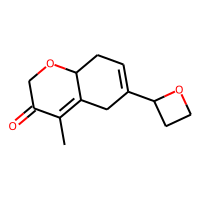
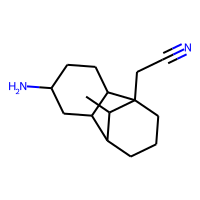
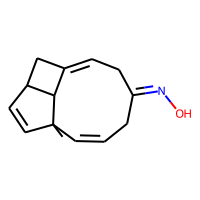
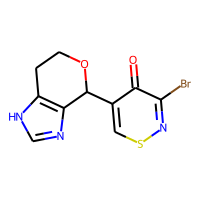
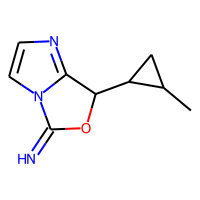
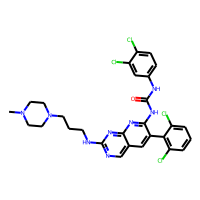
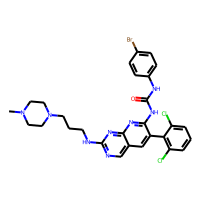
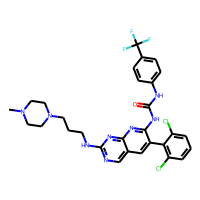
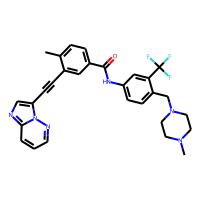
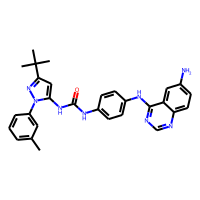

In [408]:
abl1_src = True

if(abl1_src == True):
    abl1_src_smiles_final['src'] = 1
else:
    abl1_src_smiles_final['src'] = 0
    
src_smiles_final['src'] = 1
gdb_src_final['src'] = 0

gdb_src_temp = gdb_src_final.copy()
gdb_src_temp = gdb_src_final[:50000]
final_training_df = gdb_src_final.copy()

final_training_df = final_training_df.append(abl1_src_smiles_final)
final_training_df = final_training_df.append(src_smiles_final)

final_training_df = final_training_df.reset_index(drop=True)

final_training_df

,smiles,qed,SAS,logP,mol,src,rings,weight,csp3,hallkier,...,alirings,amidebonds,arocarbo,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable
0,CC1=C2CC(=CCC2OCC1=O)C1CCO1,0.802357,3.778409,2.286138,,0,3,220.109944,0.615385,-0.93,...,3,0,0,0,0,2,0,3,0,1
1,CC1C2CCCC1(CC#N)C1CCC(N)CC21,0.828799,3.650241,3.247540,,0,3,232.193949,0.933333,-0.55,...,3,0,0,0,0,6,2,2,1,1
2,CC12C=CC3CC(=CCC(CC=C1)=NO)C23,0.791074,4.701229,2.746021,,0,3,215.131014,0.500000,-1.31,...,3,0,0,0,0,3,0,2,1,0
3,BrC1=NSC=C(C2OCCC3=C2N=CN3)C1=O,0.772655,3.388954,1.663592,,0,3,312.952060,0.300000,-1.05,...,1,0,0,2,2,1,0,5,1,1
4,CC1CC1C1OC(=N)N2C=CN=C12,0.735674,3.514179,1.284638,,0,3,177.090212,0.555556,-1.32,...,2,0,0,1,1,3,0,4,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125155,CN1CCN(CCCNc2ncc3cc(-c4c(Cl)cccc4Cl)c(NC(=O)Nc...,0.610155,2.790408,5.082660,,1,5,632.114018,0.285714,-2.92,...,1,2,2,2,4,0,0,7,3,8
125156,CN1CCN(CCCNc2ncc3cc(-c4c(Cl)cccc4Cl)c(NC(=O)Nc...,0.573268,2.890750,5.399323,,1,5,642.102475,0.285714,-3.02,...,1,2,2,2,4,0,0,7,3,8
125157,CN1CCN(CCCNc2ncc3cc(-c4c(Cl)cccc4Cl)c(NC(=O)Nc...,0.603665,2.781985,3.856673,,1,5,632.179348,0.310345,-3.71,...,1,2,2,2,4,0,0,7,3,8
125158,Cc1ccc(C(=O)Nc2ccc(CN3CCN(C)CC3)c(C(F)(F)F)c2)...,0.678955,2.832388,3.995043,,1,5,532.219844,0.275862,-4.20,...,1,1,2,2,4,0,0,6,1,4

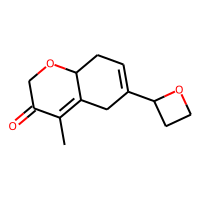
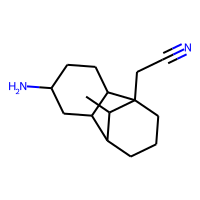
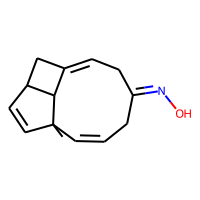
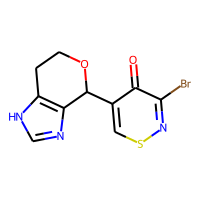
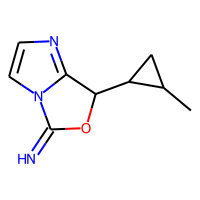
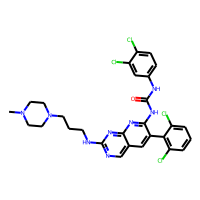
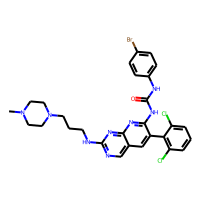
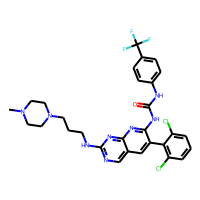
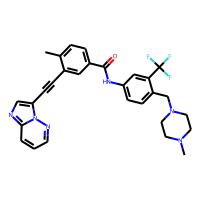
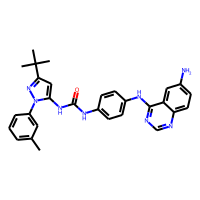

In [409]:
num_rings = []
aspher = []
eccent = []
weight = []
csp3 = []
hallkier = []
inertshape = []
laputeASA = []
alicarbo = []
alihetero = []
alirings = []
amidebonds = []
arocarbo = []
arohetero = []
arorings = []
num_stereocenter = []
bridgehead = []
hba = []
hbd = []
rotatable = []
for index, row in final_training_df.iterrows():
    temp_ring = CalcNumRings(row['mol'])
    #temp_asph = CalcAsphericity(row['mol'])
    #temp_eccent = CalcEccentricity(row['mol'])
    temp_weight = CalcExactMolWt(row['mol'])
    temp_csp3 = CalcFractionCSP3(row['mol'])
    temp_hallkier = CalcHallKierAlpha(row['mol'])
    #temp_inertshape = CalcInertialShapeFactor(row['mol'])
    temp_lapute = CalcLabuteASA(row['mol'])
    temp_alicarbo = CalcNumAliphaticCarbocycles(row['mol'])
    temp_alihetero = CalcNumAliphaticHeterocycles(row['mol'])
    temp_alirings = CalcNumAliphaticRings(row['mol'])
    temp_amidebonds = CalcNumAmideBonds(row['mol'])
    temp_arocarbo = CalcNumAromaticCarbocycles(row['mol'])
    temp_arohetero = CalcNumAromaticHeterocycles(row['mol'])
    temp_arorings = CalcNumAromaticRings(row['mol'])
    temp_stereocenter = CalcNumAtomStereoCenters(row['mol'])
    temp_bridgehead = CalcNumBridgeheadAtoms(row['mol'])
    temp_hba = CalcNumHBA(row['mol'])
    temp_hbd = CalcNumHBD(row['mol'])
    temp_rotatable = CalcNumRotatableBonds(row['mol'])
    
    num_rings.append(temp_ring)
    weight.append(temp_weight)
    csp3.append(temp_csp3)
    hallkier.append(temp_hallkier)
    laputeASA.append(temp_lapute)
    alicarbo.append(temp_alicarbo)
    alihetero.append(temp_alihetero)
    alirings.append(temp_alirings)
    amidebonds.append(temp_amidebonds)
    arocarbo.append(temp_arocarbo)
    arohetero.append(temp_arohetero)
    arorings.append(temp_arorings)
    num_stereocenter.append(temp_stereocenter)
    bridgehead.append(temp_bridgehead)
    hba.append(temp_hba)
    hbd.append(temp_hbd)
    rotatable.append(temp_rotatable)
    
final_training_df['rings'] = num_rings
final_training_df['weight'] = weight
final_training_df['csp3'] = csp3
final_training_df['hallkier'] = hallkier
final_training_df['laputeASA'] = laputeASA
final_training_df['alicarbo'] = alicarbo
final_training_df['alihetero'] = alihetero
final_training_df['alirings'] = alirings
final_training_df['amidebonds'] = amidebonds
final_training_df['arocarbo'] = arocarbo
final_training_df['arohetero'] = arohetero
final_training_df['arorings'] = arorings
final_training_df['stereocenter'] = num_stereocenter
final_training_df['bridgehead'] = bridgehead
final_training_df['hba'] = hba
final_training_df['hbd'] = hbd
final_training_df['rotatable'] = rotatable

final_training_df

# Random Forest

In [410]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

In [411]:
forest_b = RandomForestClassifier()

In [412]:
##IGNORE: THIS IS FOR THE ONE HOT ENCODING OF SMILE STRINGS##
#one_hot_enc_smiles = []
#non_one_hot_enc = []
#for index,row in final_training_df.iterrows():
    #print(row)
    #try:
       # canon_smi = Chem.CanonSmiles(smi)
       # encode_X = vae.smiles_to_hot(smi)
       # one_hot_enc_smiles.append(encode_X)
   # except:
        #print(smi)
        #non_one_hot_enc.append(smi)

In [413]:
#print(one_hot_enc_smiles[0])
#print(one_hot_enc_smiles[0].shape)

In [414]:
#indexNames = final_training_df[final_training_df['smiles']=='COc1cc(C2=C(c3cn(COCC[Si](C)(C)C)c4ccccc34)CNC2=O)cc(OC)c1OC'].index
#final_training_df = final_training_df.drop(indexNames, inplace=False)
#display(final_training_df)
#one_hot_df = pd.DataFrame(one_hot_enc_smiles, columns=['encoded'])
#display(one_hot_df)
#final_training_df = pd.concat([one_hot_df, final_training_df], axis=1)
#display(final_training_df)

In [415]:
final_training_df = final_training_df.dropna()
final_training_df = final_training_df.drop(columns=['smiles', 'mol'])
#encoded_exp = final_training_df['encoded'].str.split(",", expand=True)
#display(encoded_exp)
display(final_training_df)

,qed,SAS,logP,src,rings,weight,csp3,hallkier,laputeASA,alicarbo,...,alirings,amidebonds,arocarbo,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable
0,0.802357,3.778409,2.286138,0,3,220.109944,0.615385,-0.93,95.110469,1,...,3,0,0,0,0,2,0,3,0,1
1,0.828799,3.650241,3.247540,0,3,232.193949,0.933333,-0.55,104.563418,3,...,3,0,0,0,0,6,2,2,1,1
2,0.791074,4.701229,2.746021,0,3,215.131014,0.500000,-1.31,96.040791,3,...,3,0,0,0,0,3,0,2,1,0
3,0.772655,3.388954,1.663592,0,3,312.952060,0.300000,-1.05,109.160505,0,...,1,0,0,2,2,1,0,5,1,1
4,0.735674,3.514179,1.284638,0,3,177.090212,0.555556,-1.32,76.047070,1,...,2,0,0,1,1,3,0,4,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125155,0.610155,2.790408,5.082660,1,5,632.114018,0.285714,-2.92,257.708689,0,...,1,2,2,2,4,0,0,7,3,8
125156,0.573268,2.890750,5.399323,1,5,642.102475,0.285714,-3.02,250.969704,0,...,1,2,2,2,4,0,0,7,3,8
125157,0.603665,2.781985,3.856673,1,5,632.179348,0.310345,-3.71,255.963705,0,...,1,2,2,2,4,0,0,7,3,8
125158,0.678955,2.832388,3.995043,1,5,532.219844,0.275862,-4.20,223.806917,0,...,1,1,2,2,4,0,0,6,1,4


In [416]:
final_training_df_2 = final_training_df.drop(columns='src')
y = final_training_df.src

In [417]:
final_training_df_2.sample(frac=1)

,qed,SAS,logP,rings,weight,csp3,hallkier,laputeASA,alicarbo,alihetero,alirings,amidebonds,arocarbo,arohetero,arorings,stereocenter,bridgehead,hba,hbd,rotatable
124695,0.583568,2.934293,5.191699,4,474.996613,0.150000,-2.15,180.392554,0,0,0,0,2,2,4,1,0,5,1,6
57581,0.697222,3.909827,1.342644,5,219.035400,0.454545,-1.00,90.900358,1,3,4,0,0,1,1,2,0,4,0,0
84959,0.774602,3.433272,1.090245,3,201.126597,0.583333,-1.27,89.910823,0,2,2,0,0,1,1,2,0,3,0,0
34463,0.809463,3.896068,1.355230,4,234.100442,0.583333,-1.65,98.523314,3,0,3,0,0,1,1,2,2,5,1,2
14048,0.792962,4.502514,3.022290,3,199.136100,0.571429,-1.00,91.845858,1,2,3,0,0,0,0,5,0,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23837,0.820012,3.727579,2.244931,3,249.082350,0.615385,-1.03,104.393307,2,0,2,0,0,1,1,3,0,4,0,1
103502,0.815538,4.361917,2.213463,4,215.131014,0.571429,-0.86,96.264744,2,2,4,0,0,0,0,2,2,2,0,0
82444,0.769440,4.175934,1.622168,4,208.084792,0.600000,-1.52,86.158703,1,2,3,0,0,1,1,0,2,4,1,1
24946,0.848009,3.924220,2.409716,2,229.146664,0.666667,-1.25,103.546613,1,1,2,0,0,0,0,4,0,2,1,0


In [418]:
final_training_df.to_csv('RandomForestData.csv', index=False)

In [419]:
print(final_training_df_2.columns)

Index(['qed', 'SAS', 'logP', 'rings', 'weight', 'csp3', 'hallkier',
       'laputeASA', 'alicarbo', 'alihetero', 'alirings', 'amidebonds',
       'arocarbo', 'arohetero', 'arorings', 'stereocenter', 'bridgehead',
       'hba', 'hbd', 'rotatable'],
      dtype='object')


In [420]:
X_train, X_test, y_train, y_test = train_test_split(final_training_df_2, y, test_size=0.2)

In [421]:
cross_val_score(forest_b,X_train,y_train,cv=3,scoring='f1')

array([0.76632148, 0.77033065, 0.76175335])

In [422]:
forest_b.fit(X_train, y_train)

RandomForestClassifier()

In [423]:
test_pred = forest_b.predict(X_test)

In [424]:
probs = forest_b.predict_proba(X_test)
preds = probs[:,1]

In [425]:
from sklearn.metrics import classification_report,roc_curve,auc

In [426]:
print(classification_report(y_test,test_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98     23499
           1       0.71      0.81      0.76      1533

    accuracy                           0.97     25032
   macro avg       0.85      0.90      0.87     25032
weighted avg       0.97      0.97      0.97     25032



In [427]:
report = classification_report(y_test,test_pred, output_dict=True)
report_df = pd.DataFrame(report).transpose()
report_df

,precision,recall,f1-score,support
0,0.987759,0.978680,0.983199,23499.0000
1,0.713551,0.814090,0.760512,1533.0000
accuracy,0.968600,0.968600,0.968600,0.9686
macro avg,0.850655,0.896385,0.871855,25032.0000
weighted avg,0.970966,0.968600,0.969561,25032.0000


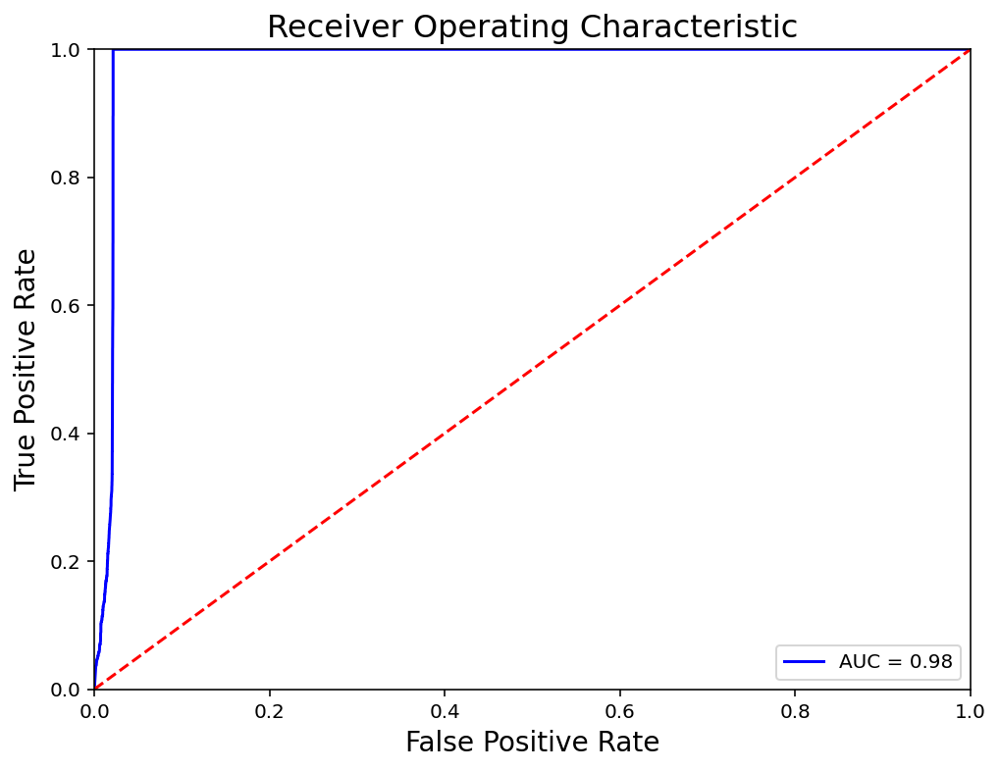

In [428]:
preds = probs[:,1]
fpr, tpr, threshold = roc_curve(y_test, preds)
roc_auc = auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(8,6))
plt.title('Receiver Operating Characteristic', fontsize = 16)
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)
plt.savefig('Updated_ROC.png', dpi=500)
plt.show()


In [429]:
tree_1 = forest_b.estimators_[5]
#plt.figure(figsize=(25,15))
#tree.plot_tree(tree_1, filled=True, rounded=True, max_depth=4);
tree.export_graphviz(tree_1, out_file='tree.dot', filled=True, rounded=True, max_depth=3, feature_names=final_training_df_2.columns);

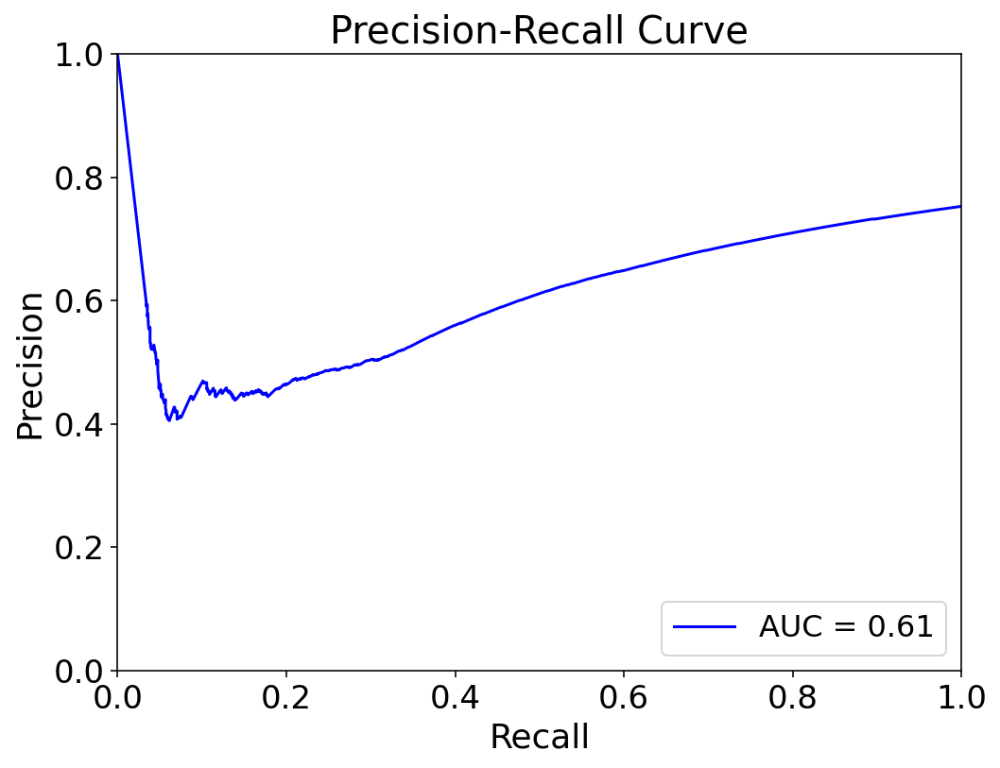

In [430]:
from sklearn.metrics import precision_recall_curve

preds = probs[:,1]
prec, recall, threshold = precision_recall_curve(y_test, preds)
prec_auc = auc(recall, prec)

# method I: plt
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(8,6))
plt.title('Precision-Recall Curve', fontsize = 20)
plt.plot(recall, prec, 'b', label = 'AUC = %0.2f' % prec_auc)
plt.legend(loc = 'lower right', fontsize=16)
#plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.ylabel('Precision', fontsize=18)
plt.xlabel('Recall', fontsize=18)
plt.savefig('Precision.png', dpi=500)
plt.show()


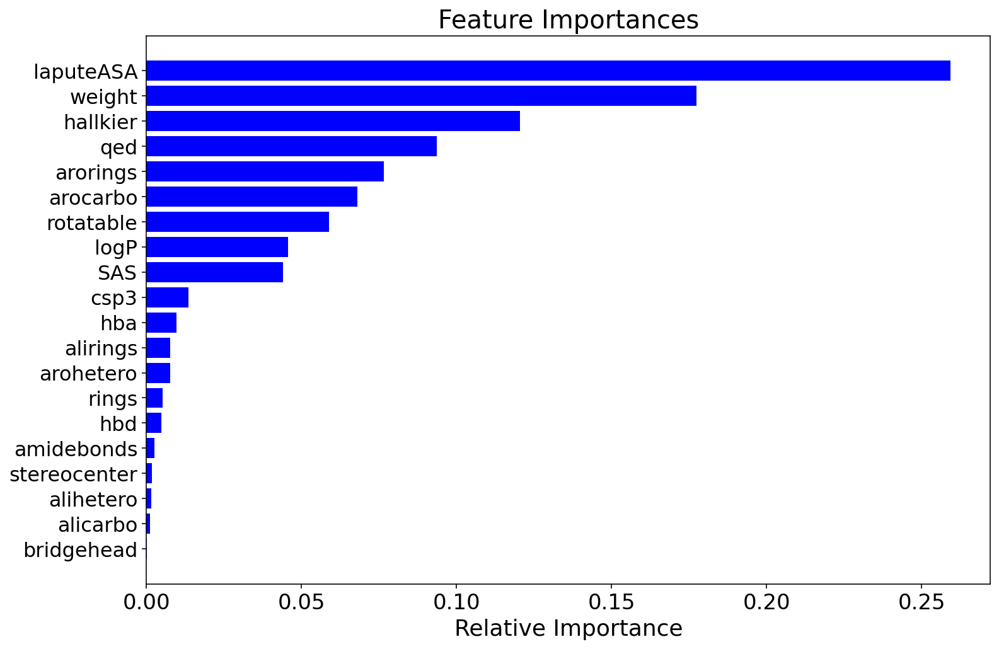

In [431]:
importances = forest_b.feature_importances_
indices = np.argsort(importances)
features = final_training_df_2.columns
fig = plt.figure(figsize=(12,8))
plt.title('Feature Importances', fontsize=20)
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices], fontsize=16)
plt.xticks(fontsize=17)
plt.xlabel('Relative Importance', fontsize=18)
plt.savefig('forest_feature_importances.png',dpi=500)
plt.show()

In [251]:
preds = probs[:,1]

p

KeyError: 1

In [ ]:
noise = 3.0
scalar = 0.8
decode = True
decode_attempts = 500
trial = 10

if(decode == True):
    path = "_" + str(trial) + "_" + str(scalar) + "_" + str(noise) + "_" + str(decode) + '_' + str(decode_attempts) + '.xlsx'
else:
    path = "_" + str(trial) + "_" + str(scalar) + "_" + str(noise) + "_" + str(decode) + '.xlsx'

## 2-Clusters

In [ ]:
subset_encoded_src_smiles = encoded_src_smiles

subset_encoded_src_smiles = subset_encoded_src_smiles.reshape(len(subset_encoded_src_smiles), 196)

dataframe = pd.DataFrame(subset_encoded_src_smiles)

kmeans = KMeans(n_clusters=2, n_init=100)
y = kmeans.fit_predict(dataframe)

dataframe["Cluster"] = y

c1_2 = []
c2_2 = []

for index, row in dataframe.iterrows():
    if(row['Cluster'] == 0.0):
        c1_2.append(row)
    elif(row['Cluster'] == 1.0):
        c2_2.append(row)
    else:
        print('Fail')

cluster_1_2 = pd.DataFrame(c1_2)
cluster_2_2 = pd.DataFrame(c2_2)

cluster_1_2 = cluster_1_2.drop(columns=['Cluster'])
cluster_2_2 = cluster_2_2.drop(columns=['Cluster'])

In [ ]:
cluster_1_2 = np.asarray(cluster_1_2)
cluster_2_2 = np.asarray(cluster_2_2)


modified_cluster_1_2 = []
modified_cluster_2_2 = []

average_1_2 = np.average(cluster_1_2, axis=0).reshape(1, len(cluster_1_2[1]))
average_2_2 = np.average(cluster_2_2, axis=0).reshape(1, len(cluster_2_2[1]))

for i in cluster_1_2:
    m_1 = scalar*(i - average_1_2)
    modified_cluster_1_2.append(m_1)
    
for i in cluster_2_2:
    m_1 = scalar*(i - average_2_2)
    modified_cluster_2_2.append(m_1)
    
smiles_1_2 = []
smiles_2_2 = []

m_df_1_2 = pd.DataFrame()
m_df_2_2 = pd.DataFrame()


kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0
kinase_array_1_2 = []
kinase_array_2_2 = []

for i in modified_cluster_1_2:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_1_2.append(kinase_inhibition_score)
        #y_1[temp_1] = i
        m_df_1_2 = pd.concat([m, m_df_1_2])
        

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_2_2:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_2_2.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_2_2 = pd.concat([m, m_df_2_2])
        
        
'''   
temp_c11_2 = (y_1 == 0).sum(1)
y_11_2 = y_1[temp_c11_2 == 0, :]
temp_c21_2 = (y_2 == 0).sum(1)
y_21_2 = y_2[temp_c21_2 == 0, :]

prop_mol_df_1_2 = pd.DataFrame(y_11_2.reshape(y_11_2.shape[0],3))
prop_mol_df_1_2.columns = ['qed', 'SAS', 'logP']
prop_mol_df_2_2 = pd.DataFrame(y_21_2.reshape(y_21_2.shape[0],3))
prop_mol_df_2_2.columns = ['qed', 'SAS', 'logP']

pert_mol_df_1_2 = pd.DataFrame({'smiles':smiles_1_2})
pert_mol_df_2_2 = pd.DataFrame({'smiles':smiles_2_2})

final_pert_mol_df_1_2 = pert_mol_df_1_2.merge(prop_mol_df_1_2, left_index=True, right_index=True)
final_pert_mol_df_2_2 = pert_mol_df_2_2.merge(prop_mol_df_2_2, left_index=True, right_index=True)
'''

In [ ]:
temp_1=0
temp_2=0
y_1 = np.zeros(shape=(len(modified_cluster_1_2)*decode_attempts, 3))
y_2 = np.zeros(shape=(len(modified_cluster_2_2)*decode_attempts, 3))

for index, row in m_df_1_2.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_1[temp_1] = temp_y
    temp_1+= 1

y_3 = pd.DataFrame(y_1, columns=['qed', 'logP', 'SAS'])
y_3 = y_3[(y_3.T != 0).any()]

m_df_1_2['qed'] = y_3['qed']
m_df_1_2['logP'] = y_3['logP']
m_df_1_2['SAS'] = y_3['SAS']

for index, row in m_df_2_2.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_2[temp_2] = temp_y
    temp_2+= 1
    
y_4 = pd.DataFrame(y_2, columns=['qed', 'logP', 'SAS'])
y_4 = y_4[(y_4.T != 0).any()]

m_df_2_2['qed'] = y_4['qed']
m_df_2_2['logP'] = y_4['logP']
m_df_2_2['SAS'] = y_4['SAS']

In [ ]:
print('Original Cluster 1: ')
display(m_df_1_2)
print('Original Cluster 2: ')
display(m_df_2_2)

In [ ]:
#FrameToGridImage(m_df_1_2, column='mol', legendsCol='smiles', maxMols = 1000)
#FrameToGridImage(m_df_2_2, column='mol', legendsCol='smiles', maxMols = 100)

In [ ]:
new_c_1_2 = m_df_1_2.copy()
new_c_2_2 = m_df_2_2.copy()

new_c_1_2 = new_c_1_2.reset_index(drop=True)
new_c_2_2 = new_c_2_2.reset_index(drop=True)

formula_1 = []
formula_2 = []

for index, row in new_c_1_2.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_1_2 = new_c_1_2.drop(index)
        
for index, row in new_c_1_2.iterrows():
    temp_form = CalcMolFormula(row['mol'])
    formula_1.append(temp_form)

    
for index, row in new_c_2_2.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_2_2 = new_c_2_2.drop(index)
        
for index, row in new_c_2_2.iterrows():
    temp_form = CalcMolFormula(row['mol'])
    formula_2.append(temp_form)

new_c_1_2['formula'] = formula_1
new_c_2_2['formula'] = formula_2

In [ ]:
print('Cluster 1 with Duplicates: ')
display(new_c_1_2)
print('Cluster 2 with Duplicates: ')
display(new_c_2_2)

In [ ]:
new_c_1_2 = new_c_1_2.drop_duplicates(subset=['smiles'])
new_c_2_2 = new_c_2_2.drop_duplicates(subset=['smiles'])

print('Cluster 1: ')
display(new_c_1_2)
print('Cluster 2: ')
display(new_c_2_2)

In [ ]:
new_c_1_2 = new_c_1_2.assign(result=new_c_1_2['smiles'].isin(master_smiles['smiles']).astype(int))
new_c_2_2 = new_c_2_2.assign(result=new_c_2_2['smiles'].isin(master_smiles['smiles']).astype(int))
for index, row in new_c_1_2.iterrows():
    if row['result'] == 1:
        new_c_1_2.drop(index, inplace=True)
for index, row in new_c_2_2.iterrows():
    if row['result'] == 1:
        new_c_2_2.drop(index, inplace=True)

In [ ]:
print('Cluster 1 Uniques: ')
display(new_c_1_2)
print('Cluster 2 Uniques: ')
display(new_c_2_2)

In [ ]:
print('Cluster 1: ')
print(len(m_df_1_2) - len(new_c_1_2))
print('Cluster 2: ')
print(len(m_df_2_2) - len(new_c_2_2))

print('''###################################''')
print('Total: ' + str(len(new_c_1_2)+len(new_c_2_2)))

In [ ]:
#FrameToGridImage(new_c_1_2, column='mol', legendsCol='smiles', maxMols = 1000)
FrameToGridImage(new_c_2_2, column='mol', legendsCol='smiles', maxMols = 100)

In [ ]:
num_rings = []
aspher = []
eccent = []
weight = []
csp3 = []
hallkier = []
inertshape = []
laputeASA = []
alicarbo = []
alihetero = []
alirings = []
amidebonds = []
arocarbo = []
arohetero = []
arorings = []
num_stereocenter = []
bridgehead = []
hba = []
hbd = []
rotatable = []
for index, row in new_c_1_2.iterrows():
    temp_ring = CalcNumRings(row['mol'])
    #temp_asph = CalcAsphericity(row['mol'])
    #temp_eccent = CalcEccentricity(row['mol'])
    temp_weight = CalcExactMolWt(row['mol'])
    temp_csp3 = CalcFractionCSP3(row['mol'])
    temp_hallkier = CalcHallKierAlpha(row['mol'])
    #temp_inertshape = CalcInertialShapeFactor(row['mol'])
    temp_lapute = CalcLabuteASA(row['mol'])
    temp_alicarbo = CalcNumAliphaticCarbocycles(row['mol'])
    temp_alihetero = CalcNumAliphaticHeterocycles(row['mol'])
    temp_alirings = CalcNumAliphaticRings(row['mol'])
    temp_amidebonds = CalcNumAmideBonds(row['mol'])
    temp_arocarbo = CalcNumAromaticCarbocycles(row['mol'])
    temp_arohetero = CalcNumAromaticHeterocycles(row['mol'])
    temp_arorings = CalcNumAromaticRings(row['mol'])
    temp_stereocenter = CalcNumAtomStereoCenters(row['mol'])
    temp_bridgehead = CalcNumBridgeheadAtoms(row['mol'])
    temp_hba = CalcNumHBA(row['mol'])
    temp_hbd = CalcNumHBD(row['mol'])
    temp_rotatable = CalcNumRotatableBonds(row['mol'])
    
    num_rings.append(temp_ring)
    weight.append(temp_weight)
    csp3.append(temp_csp3)
    hallkier.append(temp_hallkier)
    laputeASA.append(temp_lapute)
    alicarbo.append(temp_alicarbo)
    alihetero.append(temp_alihetero)
    alirings.append(temp_alirings)
    amidebonds.append(temp_amidebonds)
    arocarbo.append(temp_arocarbo)
    arohetero.append(temp_arohetero)
    arorings.append(temp_arorings)
    num_stereocenter.append(temp_stereocenter)
    bridgehead.append(temp_bridgehead)
    hba.append(temp_hba)
    hbd.append(temp_hbd)
    rotatable.append(temp_rotatable)
    
new_c_1_2['rings'] = num_rings
new_c_1_2['weight'] = weight
new_c_1_2['csp3'] = csp3
new_c_1_2['hallkier'] = hallkier
new_c_1_2['laputeASA'] = laputeASA
new_c_1_2['alicarbo'] = alicarbo
new_c_1_2['alihetero'] = alihetero
new_c_1_2['alirings'] = alirings
new_c_1_2['amidebonds'] = amidebonds
new_c_1_2['arocarbo'] = arocarbo
new_c_1_2['arohetero'] = arohetero
new_c_1_2['arorings'] = arorings
new_c_1_2['stereocenter'] = num_stereocenter
new_c_1_2['bridgehead'] = bridgehead
new_c_1_2['hba'] = hba
new_c_1_2['hbd'] = hbd
new_c_1_2['rotatable'] = rotatable

display(new_c_1_2)

In [ ]:
num_rings = []
aspher = []
eccent = []
weight = []
csp3 = []
hallkier = []
inertshape = []
laputeASA = []
alicarbo = []
alihetero = []
alirings = []
amidebonds = []
arocarbo = []
arohetero = []
arorings = []
num_stereocenter = []
bridgehead = []
hba = []
hbd = []
rotatable = []
for index, row in new_c_2_2.iterrows():
    temp_ring = CalcNumRings(row['mol'])
    #temp_asph = CalcAsphericity(row['mol'])
    #temp_eccent = CalcEccentricity(row['mol'])
    temp_weight = CalcExactMolWt(row['mol'])
    temp_csp3 = CalcFractionCSP3(row['mol'])
    temp_hallkier = CalcHallKierAlpha(row['mol'])
    #temp_inertshape = CalcInertialShapeFactor(row['mol'])
    temp_lapute = CalcLabuteASA(row['mol'])
    temp_alicarbo = CalcNumAliphaticCarbocycles(row['mol'])
    temp_alihetero = CalcNumAliphaticHeterocycles(row['mol'])
    temp_alirings = CalcNumAliphaticRings(row['mol'])
    temp_amidebonds = CalcNumAmideBonds(row['mol'])
    temp_arocarbo = CalcNumAromaticCarbocycles(row['mol'])
    temp_arohetero = CalcNumAromaticHeterocycles(row['mol'])
    temp_arorings = CalcNumAromaticRings(row['mol'])
    temp_stereocenter = CalcNumAtomStereoCenters(row['mol'])
    temp_bridgehead = CalcNumBridgeheadAtoms(row['mol'])
    temp_hba = CalcNumHBA(row['mol'])
    temp_hbd = CalcNumHBD(row['mol'])
    temp_rotatable = CalcNumRotatableBonds(row['mol'])
    
    num_rings.append(temp_ring)
    weight.append(temp_weight)
    csp3.append(temp_csp3)
    hallkier.append(temp_hallkier)
    laputeASA.append(temp_lapute)
    alicarbo.append(temp_alicarbo)
    alihetero.append(temp_alihetero)
    alirings.append(temp_alirings)
    amidebonds.append(temp_amidebonds)
    arocarbo.append(temp_arocarbo)
    arohetero.append(temp_arohetero)
    arorings.append(temp_arorings)
    num_stereocenter.append(temp_stereocenter)
    bridgehead.append(temp_bridgehead)
    hba.append(temp_hba)
    hbd.append(temp_hbd)
    rotatable.append(temp_rotatable)
    
new_c_2_2['rings'] = num_rings
new_c_2_2['weight'] = weight
new_c_2_2['csp3'] = csp3
new_c_2_2['hallkier'] = hallkier
new_c_2_2['laputeASA'] = laputeASA
new_c_2_2['alicarbo'] = alicarbo
new_c_2_2['alihetero'] = alihetero
new_c_2_2['alirings'] = alirings
new_c_2_2['amidebonds'] = amidebonds
new_c_2_2['arocarbo'] = arocarbo
new_c_2_2['arohetero'] = arohetero
new_c_2_2['arorings'] = arorings
new_c_2_2['stereocenter'] = num_stereocenter
new_c_2_2['bridgehead'] = bridgehead
new_c_2_2['hba'] = hba
new_c_2_2['hbd'] = hbd
new_c_2_2['rotatable'] = rotatable

display(new_c_2_2)

In [ ]:
new_c_1_2_rf = new_c_1_2.drop(columns=['smiles', 'mol', 'formula', 'distance', 'count', 'frequency', 'result'])
new_c_2_2_rf = new_c_2_2.drop(columns=['smiles', 'mol', 'formula', 'distance', 'count', 'frequency', 'result'])

In [ ]:
probs_1 = forest.predict_proba(new_c_1_2_rf)
probs_2 = forest.predict_proba(new_c_2_2_rf)
preds_1 = probs_1[:,1]
preds_2 = probs_2[:,1]
#display(preds_1)
#display(preds_2)

In [ ]:
new_c_1_2['kinase inhibition likeliness'] = preds_1
new_c_2_2['kinase inhibition likeliness'] = preds_2

In [ ]:
print('Cluster 1 Including Kinase Inhibition Likeliness:')
display(new_c_1_2)
print('Cluster 2 Including Kinase Inhibition Likeliness:')
display(new_c_2_2)

In [ ]:
new_c_1_2 = new_c_1_2.sort_values(by=['kinase inhibition likeliness'], ascending=False)
new_c_2_2 = new_c_2_2.sort_values(by=['kinase inhibition likeliness'], ascending=False)

In [ ]:
display(new_c_1_2)
display(new_c_2_2)

In [ ]:
c_1_2_copy = new_c_1_2.copy()
c_2_2_copy = new_c_2_2.copy()

c_1_2_copy = c_1_2_copy.reset_index(drop=True)
c_2_2_copy = c_2_2_copy.reset_index(drop=True)

c_2_2_copy = c_2_2_copy.head(75)

#mol_dataframe = c_2_2_copy['mol']
#c_2_2_copy.drop(columns=['mol'])

In [ ]:
from rdkit import RDLogger
RDLogger.DisableLog('rdApp.*')

if(len(c_1_2_copy) > 0):
    c_1_2_copy.to_csv('2_Cluster_Top_100_1.csv', index=False)

if(len(c_2_2_copy) > 0):
    c_2_2_copy.to_csv('2_Cluster_Top_100_2.csv', index=False)
    #mol_dataframe.to_csv('2_Cluster_Top_100_2_mol.csv', index=False)

In [ ]:
top_100_c_1 = pd.read_csv('2_Cluster_Top_100_1.csv')
top_100_c_2 = pd.read_csv('2_Cluster_Top_100_2.csv')
display(top_100_c_1)
display(top_100_c_2)

In [ ]:
PandasTools.AddMoleculeColumnToFrame(top_100_c_1, smilesCol='smiles')
PandasTools.AddMoleculeColumnToFrame(top_100_c_2, smilesCol='smiles')

In [ ]:
display(top_100_c_1)
display(top_100_c_2)

In [ ]:
PandasTools.SaveXlsxFromFrame(top_100_c_1, "Top_100_Cluster_1.xlsx", molCol='ROMol')

In [ ]:
PandasTools.SaveXlsxFromFrame(top_100_c_2, "Top_100_Cluster_2.xlsx", molCol='ROMol')

In [ ]:


if(len(m_df_1_2) > 0):
    m_df_1_2.to_excel('KMeans_2_Clusters_2_Cluster_1' + path, index=False)
    
if(len(m_df_2_2) > 0):
    m_df_2_2.to_excel('KMeans_2_Clusters_2_Cluster_2' + path, index=False)

## 3-Clusters

In [ ]:
subset_encoded_src_smiles = encoded_src_smiles

subset_encoded_src_smiles = subset_encoded_src_smiles.reshape(len(subset_encoded_src_smiles), 196)

dataframe = pd.DataFrame(subset_encoded_src_smiles)

kmeans = KMeans(n_clusters=3, n_init=100)
y = kmeans.fit_predict(dataframe)

dataframe["Cluster"] = y

c1 = []
c2 = []
c3 = []

for index, row in dataframe.iterrows():
    if(row['Cluster'] == 0.0):
        c1.append(row)
    elif(row['Cluster'] == 1.0):
        c2.append(row)
    elif(row['Cluster'] == 2.0):
        c3.append(row)
    else:
        print('Fail')

cluster_1 = pd.DataFrame(c1)
cluster_2 = pd.DataFrame(c2)
cluster_3 = pd.DataFrame(c3)

cluster_1 = cluster_1.drop(columns=['Cluster'])
cluster_2 = cluster_2.drop(columns=['Cluster'])
cluster_3 = cluster_3.drop(columns=['Cluster'])

In [ ]:
cluster_1 = np.asarray(cluster_1)
cluster_2 = np.asarray(cluster_2)
cluster_3 = np.asarray(cluster_3)


modified_cluster_1_3 = []
modified_cluster_2_3 = []
modified_cluster_3_3 = []

average_1 = np.average(cluster_1, axis=0).reshape(1, len(cluster_1[1]))
average_2 = np.average(cluster_2, axis=0).reshape(1, len(cluster_2[1]))
average_3 = np.average(cluster_3, axis=0).reshape(1, len(cluster_3[1]))

for i in cluster_1:
    m_1 = scalar*(i - average_1)
    modified_cluster_1_3.append(m_1)
    
for i in cluster_2:
    m_1 = scalar*(i - average_2)
    modified_cluster_2_3.append(m_1)
    
for i in cluster_3:
    m_1 = scalar*(i - average_3)
    modified_cluster_3_3.append(m_1)    
    
    
smiles_1 = []
smiles_2 = []
smiles_3 = []

m_df_1_3 = pd.DataFrame()
m_df_2_3 = pd.DataFrame()
m_df_3_3 = pd.DataFrame()


kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0
kinase_array_1_3 = []
kinase_array_2_3 = []
kinase_array_3_3 = []

for i in modified_cluster_1_3:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_1_3.append(kinase_inhibition_score)
        #y_1[temp_1] = i
        m_df_1_3 = pd.concat([m, m_df_1_3])
        

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_2_3:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_2_3.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_2_3 = pd.concat([m, m_df_2_3])

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_3_3:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_3_3.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_3_3 = pd.concat([m, m_df_3_3])
        
'''
temp_c11 = (y_1 == 0).sum(1)
y_11 = y_1[temp_c11 == 0, :]
temp_c21 = (y_2 == 0).sum(1)
y_21 = y_2[temp_c21 == 0, :]
temp_c31 = (y_3 == 0).sum(1)
y_31 = y_3[temp_c31 == 0, :]

prop_mol_df_1 = pd.DataFrame(y_11.reshape(y_11.shape[0],3))
prop_mol_df_1.columns = ['qed', 'SAS', 'logP']
prop_mol_df_2 = pd.DataFrame(y_21.reshape(y_21.shape[0],3))
prop_mol_df_2.columns = ['qed', 'SAS', 'logP']
prop_mol_df_3 = pd.DataFrame(y_31.reshape(y_31.shape[0],3))
prop_mol_df_3.columns = ['qed', 'SAS', 'logP']

pert_mol_df_1 = pd.DataFrame({'smiles':smiles_1})
pert_mol_df_2 = pd.DataFrame({'smiles':smiles_2})
pert_mol_df_3 = pd.DataFrame({'smiles':smiles_3})

final_pert_mol_df_1 = pert_mol_df_1.merge(prop_mol_df_1, left_index=True, right_index=True)
final_pert_mol_df_2 = pert_mol_df_2.merge(prop_mol_df_2, left_index=True, right_index=True)
final_pert_mol_df_3 = pert_mol_df_3.merge(prop_mol_df_3, left_index=True, right_index=True)

print('Cluster 1: ')
display(final_pert_mol_df_1)
print('Cluster 2: ')
display(final_pert_mol_df_2)
print('Cluster 3: ')
display(final_pert_mol_df_3)
'''

In [ ]:
temp_1 = 0
temp_2 = 0
temp_3 = 0

y_1 = np.zeros(shape=(len(modified_cluster_1_3)*decode_attempts, 3))
y_2 = np.zeros(shape=(len(modified_cluster_2_3)*decode_attempts, 3))
y_3 = np.zeros(shape=(len(modified_cluster_3_3)*decode_attempts, 3))

for index, row in m_df_1_3.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_1[temp_1] = temp_y
    temp_1+= 1

y_1_3 = pd.DataFrame(y_1, columns=['qed', 'logP', 'SAS'])
y_1_3 = y_1_3[(y_1_3.T != 0).any()]

m_df_1_3['qed'] = y_1_3['qed']
m_df_1_3['logP'] = y_1_3['logP']
m_df_1_3['SAS'] = y_1_3['SAS']

for index, row in m_df_2_3.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_2[temp_2] = temp_y
    temp_2+= 1
    
y_2_3 = pd.DataFrame(y_2, columns=['qed', 'logP', 'SAS'])
y_2_3 = y_2_3[(y_2_3.T != 0).any()]

m_df_2_3['qed'] = y_2_3['qed']
m_df_2_3['logP'] = y_2_3['logP']
m_df_2_3['SAS'] = y_2_3['SAS']

for index, row in m_df_3_3.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_3[temp_3] = temp_y
    temp_3+= 1
    
y_3_3 = pd.DataFrame(y_3, columns=['qed', 'logP', 'SAS'])
y_3_3 = y_3_3[(y_3_3.T != 0).any()]

m_df_3_3['qed'] = y_3_3['qed']
m_df_3_3['logP'] = y_3_3['logP']
m_df_3_3['SAS'] = y_3_3['SAS']

In [ ]:
print('Original Cluster 1: ')
display(m_df_1_3)
print('Orignal Cluster 2: ')
display(m_df_2_3)
print('Original Cluster 3: ')
display(m_df_3_3)

In [ ]:
#FrameToGridImage(m_df_1_3, column='mol', legendsCol='smiles', maxMols = 50000)
#FrameToGridImage(m_df_2_3, column='mol', legendsCol='smiles', maxMols = 50000)
#FrameToGridImage(m_df_3_3, column='mol', legendsCol='smiles', maxMols = 50000)

In [ ]:
new_c_1_3 = m_df_1_3.copy()
new_c_2_3 = m_df_2_3.copy()
new_c_3_3 = m_df_3_3.copy()

new_c_1_3 = new_c_1_3.reset_index(drop=True)
new_c_2_3 = new_c_2_3.reset_index(drop=True)
new_c_3_3 = new_c_3_3.reset_index(drop=True)

for index, row in new_c_1_3.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_1_3 = new_c_1_3.drop(index)
    
for index, row in new_c_2_3.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_2_3 = new_c_2_3.drop(index)

for index, row in new_c_3_3.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_3_3 = new_c_3_3.drop(index)


In [ ]:
print('Cluster 1 with Duplicates: ')
display(new_c_1_3)
print('Cluster 2 with Duplicates: ')
display(new_c_2_3)
print('Cluster 3 with Duplicates: ')
display(new_c_3_3)

In [ ]:
new_c_1_3 = new_c_1_3.drop_duplicates(subset=['smiles'])
new_c_2_3 = new_c_2_3.drop_duplicates(subset=['smiles'])
new_c_3_3 = new_c_3_3.drop_duplicates(subset=['smiles'])


print('Cluster 1: ')
display(new_c_1_3)
print('Cluster 2: ')
display(new_c_2_3)
print('Cluster 3: ')
display(new_c_3_3)

In [ ]:
temp_c_1_3 = new_c_1_3.copy()
temp_smile_1_3 = []
for index, row in temp_c_1_3.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_smile_1_3.append(temp_s_c)
temp_c_1_3['smiles'] = temp_smile_1_3

temp_c_2_3 = new_c_2_3.copy()
temp_smile_2_3 = []
for index, row in temp_c_2_3.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_smile_2_3.append(temp_s_c)
temp_c_2_3['smiles'] = temp_smile_2_3

temp_c_3_3 = new_c_3_3.copy()
temp_smile_3_3 = []
for index, row in temp_c_3_3.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_smile_3_3.append(temp_s_c)
temp_c_3_3['smiles'] = temp_smile_3_3

temp_master_smiles = master_smiles.copy()
temp_master_list = []
for index, row in master_smiles.iterrows():
    temp_s = row['smiles']
    temp_s_c = mu.canon_smiles(temp_s)
    temp_master_list.append(temp_s_c)
temp_master_smiles['smiles'] = temp_master_list


In [ ]:
new_c_1_3 = new_c_1_3.assign(result=temp_c_1_3['smiles'].isin(temp_master_smiles['smiles']).astype(int))
new_c_2_3 = new_c_2_3.assign(result=temp_c_2_3['smiles'].isin(temp_master_smiles['smiles']).astype(int))
new_c_3_3 = new_c_3_3.assign(result=temp_c_3_3['smiles'].isin(temp_master_smiles['smiles']).astype(int))

for index, row in new_c_1_3.iterrows():
    if row['result'] == 1:
        new_c_1_3.drop(index, inplace=True)
for index, row in new_c_2_3.iterrows():
    if row['result'] == 1:
        new_c_2_3.drop(index, inplace=True)
for index, row in new_c_3_3.iterrows():
    if row['result'] == 1:
        new_c_3_3.drop(index, inplace=True)
        
print('Cluster 1 Uniques: ')
display(new_c_1_3)
print('Cluster 2 Uniques: ')
display(new_c_2_3)
print('Cluster 3 Uniques: ')
display(new_c_3_3)

# Cluster 3 Feature Adding and Random Forest

In [ ]:
num_rings = []
aspher = []
eccent = []
weight = []
csp3 = []
hallkier = []
inertshape = []
laputeASA = []
alicarbo = []
alihetero = []
alirings = []
amidebonds = []
arocarbo = []
arohetero = []
arorings = []
num_stereocenter = []
bridgehead = []
hba = []
hbd = []
rotatable = []
for index, row in new_c_1_3.iterrows():
    temp_ring = CalcNumRings(row['mol'])
    #temp_asph = CalcAsphericity(row['mol'])
    #temp_eccent = CalcEccentricity(row['mol'])
    temp_weight = CalcExactMolWt(row['mol'])
    temp_csp3 = CalcFractionCSP3(row['mol'])
    temp_hallkier = CalcHallKierAlpha(row['mol'])
    #temp_inertshape = CalcInertialShapeFactor(row['mol'])
    temp_lapute = CalcLabuteASA(row['mol'])
    temp_alicarbo = CalcNumAliphaticCarbocycles(row['mol'])
    temp_alihetero = CalcNumAliphaticHeterocycles(row['mol'])
    temp_alirings = CalcNumAliphaticRings(row['mol'])
    temp_amidebonds = CalcNumAmideBonds(row['mol'])
    temp_arocarbo = CalcNumAromaticCarbocycles(row['mol'])
    temp_arohetero = CalcNumAromaticHeterocycles(row['mol'])
    temp_arorings = CalcNumAromaticRings(row['mol'])
    temp_stereocenter = CalcNumAtomStereoCenters(row['mol'])
    temp_bridgehead = CalcNumBridgeheadAtoms(row['mol'])
    temp_hba = CalcNumHBA(row['mol'])
    temp_hbd = CalcNumHBD(row['mol'])
    temp_rotatable = CalcNumRotatableBonds(row['mol'])
    
    num_rings.append(temp_ring)
    weight.append(temp_weight)
    csp3.append(temp_csp3)
    hallkier.append(temp_hallkier)
    laputeASA.append(temp_lapute)
    alicarbo.append(temp_alicarbo)
    alihetero.append(temp_alihetero)
    alirings.append(temp_alirings)
    amidebonds.append(temp_amidebonds)
    arocarbo.append(temp_arocarbo)
    arohetero.append(temp_arohetero)
    arorings.append(temp_arorings)
    num_stereocenter.append(temp_stereocenter)
    bridgehead.append(temp_bridgehead)
    hba.append(temp_hba)
    hbd.append(temp_hbd)
    rotatable.append(temp_rotatable)
    
new_c_1_3['rings'] = num_rings
new_c_1_3['weight'] = weight
new_c_1_3['csp3'] = csp3
new_c_1_3['hallkier'] = hallkier
new_c_1_3['laputeASA'] = laputeASA
new_c_1_3['alicarbo'] = alicarbo
new_c_1_3['alihetero'] = alihetero
new_c_1_3['alirings'] = alirings
new_c_1_3['amidebonds'] = amidebonds
new_c_1_3['arocarbo'] = arocarbo
new_c_1_3['arohetero'] = arohetero
new_c_1_3['arorings'] = arorings
new_c_1_3['stereocenter'] = num_stereocenter
new_c_1_3['bridgehead'] = bridgehead
new_c_1_3['hba'] = hba
new_c_1_3['hbd'] = hbd
new_c_1_3['rotatable'] = rotatable

display(new_c_1_3)

In [ ]:
num_rings = []
aspher = []
eccent = []
weight = []
csp3 = []
hallkier = []
inertshape = []
laputeASA = []
alicarbo = []
alihetero = []
alirings = []
amidebonds = []
arocarbo = []
arohetero = []
arorings = []
num_stereocenter = []
bridgehead = []
hba = []
hbd = []
rotatable = []
for index, row in new_c_2_3.iterrows():
    temp_ring = CalcNumRings(row['mol'])
    #temp_asph = CalcAsphericity(row['mol'])
    #temp_eccent = CalcEccentricity(row['mol'])
    temp_weight = CalcExactMolWt(row['mol'])
    temp_csp3 = CalcFractionCSP3(row['mol'])
    temp_hallkier = CalcHallKierAlpha(row['mol'])
    #temp_inertshape = CalcInertialShapeFactor(row['mol'])
    temp_lapute = CalcLabuteASA(row['mol'])
    temp_alicarbo = CalcNumAliphaticCarbocycles(row['mol'])
    temp_alihetero = CalcNumAliphaticHeterocycles(row['mol'])
    temp_alirings = CalcNumAliphaticRings(row['mol'])
    temp_amidebonds = CalcNumAmideBonds(row['mol'])
    temp_arocarbo = CalcNumAromaticCarbocycles(row['mol'])
    temp_arohetero = CalcNumAromaticHeterocycles(row['mol'])
    temp_arorings = CalcNumAromaticRings(row['mol'])
    temp_stereocenter = CalcNumAtomStereoCenters(row['mol'])
    temp_bridgehead = CalcNumBridgeheadAtoms(row['mol'])
    temp_hba = CalcNumHBA(row['mol'])
    temp_hbd = CalcNumHBD(row['mol'])
    temp_rotatable = CalcNumRotatableBonds(row['mol'])
    
    num_rings.append(temp_ring)
    weight.append(temp_weight)
    csp3.append(temp_csp3)
    hallkier.append(temp_hallkier)
    laputeASA.append(temp_lapute)
    alicarbo.append(temp_alicarbo)
    alihetero.append(temp_alihetero)
    alirings.append(temp_alirings)
    amidebonds.append(temp_amidebonds)
    arocarbo.append(temp_arocarbo)
    arohetero.append(temp_arohetero)
    arorings.append(temp_arorings)
    num_stereocenter.append(temp_stereocenter)
    bridgehead.append(temp_bridgehead)
    hba.append(temp_hba)
    hbd.append(temp_hbd)
    rotatable.append(temp_rotatable)
    
new_c_2_3['rings'] = num_rings
new_c_2_3['weight'] = weight
new_c_2_3['csp3'] = csp3
new_c_2_3['hallkier'] = hallkier
new_c_2_3['laputeASA'] = laputeASA
new_c_2_3['alicarbo'] = alicarbo
new_c_2_3['alihetero'] = alihetero
new_c_2_3['alirings'] = alirings
new_c_2_3['amidebonds'] = amidebonds
new_c_2_3['arocarbo'] = arocarbo
new_c_2_3['arohetero'] = arohetero
new_c_2_3['arorings'] = arorings
new_c_2_3['stereocenter'] = num_stereocenter
new_c_2_3['bridgehead'] = bridgehead
new_c_2_3['hba'] = hba
new_c_2_3['hbd'] = hbd
new_c_2_3['rotatable'] = rotatable

display(new_c_2_3)

In [ ]:
num_rings = []
aspher = []
eccent = []
weight = []
csp3 = []
hallkier = []
inertshape = []
laputeASA = []
alicarbo = []
alihetero = []
alirings = []
amidebonds = []
arocarbo = []
arohetero = []
arorings = []
num_stereocenter = []
bridgehead = []
hba = []
hbd = []
rotatable = []
for index, row in new_c_3_3.iterrows():
    temp_ring = CalcNumRings(row['mol'])
    #temp_asph = CalcAsphericity(row['mol'])
    #temp_eccent = CalcEccentricity(row['mol'])
    temp_weight = CalcExactMolWt(row['mol'])
    temp_csp3 = CalcFractionCSP3(row['mol'])
    temp_hallkier = CalcHallKierAlpha(row['mol'])
    #temp_inertshape = CalcInertialShapeFactor(row['mol'])
    temp_lapute = CalcLabuteASA(row['mol'])
    temp_alicarbo = CalcNumAliphaticCarbocycles(row['mol'])
    temp_alihetero = CalcNumAliphaticHeterocycles(row['mol'])
    temp_alirings = CalcNumAliphaticRings(row['mol'])
    temp_amidebonds = CalcNumAmideBonds(row['mol'])
    temp_arocarbo = CalcNumAromaticCarbocycles(row['mol'])
    temp_arohetero = CalcNumAromaticHeterocycles(row['mol'])
    temp_arorings = CalcNumAromaticRings(row['mol'])
    temp_stereocenter = CalcNumAtomStereoCenters(row['mol'])
    temp_bridgehead = CalcNumBridgeheadAtoms(row['mol'])
    temp_hba = CalcNumHBA(row['mol'])
    temp_hbd = CalcNumHBD(row['mol'])
    temp_rotatable = CalcNumRotatableBonds(row['mol'])
    
    num_rings.append(temp_ring)
    weight.append(temp_weight)
    csp3.append(temp_csp3)
    hallkier.append(temp_hallkier)
    laputeASA.append(temp_lapute)
    alicarbo.append(temp_alicarbo)
    alihetero.append(temp_alihetero)
    alirings.append(temp_alirings)
    amidebonds.append(temp_amidebonds)
    arocarbo.append(temp_arocarbo)
    arohetero.append(temp_arohetero)
    arorings.append(temp_arorings)
    num_stereocenter.append(temp_stereocenter)
    bridgehead.append(temp_bridgehead)
    hba.append(temp_hba)
    hbd.append(temp_hbd)
    rotatable.append(temp_rotatable)
    
new_c_3_3['rings'] = num_rings
new_c_3_3['weight'] = weight
new_c_3_3['csp3'] = csp3
new_c_3_3['hallkier'] = hallkier
new_c_3_3['laputeASA'] = laputeASA
new_c_3_3['alicarbo'] = alicarbo
new_c_3_3['alihetero'] = alihetero
new_c_3_3['alirings'] = alirings
new_c_3_3['amidebonds'] = amidebonds
new_c_3_3['arocarbo'] = arocarbo
new_c_3_3['arohetero'] = arohetero
new_c_3_3['arorings'] = arorings
new_c_3_3['stereocenter'] = num_stereocenter
new_c_3_3['bridgehead'] = bridgehead
new_c_3_3['hba'] = hba
new_c_3_3['hbd'] = hbd
new_c_3_3['rotatable'] = rotatable

display(new_c_3_3)

In [ ]:
c_1_3_back = new_c_1_3.copy()
c_2_3_back = new_c_2_3.copy()
c_3_3_back = new_c_3_3.copy()

In [ ]:
new_c_1_3_rf = c_1_3_back.drop(columns=['smiles', 'mol', 'distance', 'count', 'frequency', 'result'])
new_c_2_3_rf = c_2_3_back.drop(columns=['smiles', 'mol', 'distance', 'count', 'frequency', 'result'])
new_c_3_3_rf = c_3_3_back.drop(columns=['smiles', 'mol', 'distance', 'count', 'frequency', 'result'])

In [ ]:
probs_1 = forest.predict_proba(new_c_1_3_rf)
probs_2 = forest.predict_proba(new_c_2_3_rf)
probs_3 = forest.predict_proba(new_c_3_3_rf)

preds_1 = probs_1[:,1]
preds_2 = probs_2[:,1]
preds_3 = probs_3[:,1]

#display(preds_1)
#display(preds_2)

In [ ]:
new_c_1_3['kinase inhibition likeliness'] = preds_1
new_c_2_3['kinase inhibition likeliness'] = preds_2
new_c_3_3['kinase inhibition likeliness'] = preds_3

new_c_1_3 = new_c_1_3.sort_values(by=['kinase inhibition likeliness'], ascending=False)
new_c_2_3 = new_c_2_3.sort_values(by=['kinase inhibition likeliness'], ascending=False)
new_c_3_3 = new_c_3_3.sort_values(by=['kinase inhibition likeliness'], ascending=False)

display(new_c_2_3)

In [ ]:
from rdkit import DataStructs
from rdkit.Chem import RDKFingerprint

def findMostLike(mol, mol_list, k=100):
    fp_ref = Chem.RDKFingerprint(mol)
    fingerprints = [Chem.RDKFingerprint(m) for m in mol_list]
    sim = [DataStructs.TanimotoSimilarity(fp_ref,fp) for fp in fingerprints]
    index = np.argsort(sim)[:k]
    return index

In [ ]:

copy_c_1_3 = new_c_1_3.copy()
copy_c_2_3 = new_c_2_3.copy()
copy_c_3_3 = new_c_3_3.copy()

copy_c_1_3 = copy_c_1_3.reset_index(drop=True)
copy_c_2_3 = copy_c_2_3.reset_index(drop=True)
copy_c_3_3 = copy_c_3_3.reset_index(drop=True)

copy_mol_list_1_3 = []
copy_mol_list_2_3 = []
copy_mol_list_3_3 = []

for index, row in copy_c_1_3.iterrows():
    mol = row['mol']
    copy_mol_list_1_3.append(mol)
    
for index, row in copy_c_2_3.iterrows():
    mol = row['mol']
    copy_mol_list_2_3.append(mol)

for index, row in copy_c_3_3.iterrows():
    mol = row['mol']
    copy_mol_list_3_3.append(mol)

In [ ]:
index_list_1 = []
index_list_3 = []

index_list_1.append(0)
mol_1 = copy_mol_list_1_3[0]

for i in range(99):
    temp_index = copy_mol_list_1_3.index(mol_1)
    temp_list = copy_mol_list_1_3.copy()
    del temp_list[temp_index]
    dif = findMostLike(mol_1, temp_list)
    #print(dif)
    diverse_index = min(dif)
    if diverse_index not in index_list_1:
        #print(diverse_index)
        diverse = copy_mol_list_1_3[diverse_index]
        index_list_1.append(diverse_index)
        mol_1 = diverse
    else:
        #print("else: " + str(diverse_index))
        copy_index = np.where(dif == diverse_index)
        temp_dif = np.delete(dif, copy_index[0][0])
        diverse_in = min(temp_dif)
        while(diverse_in in index_list_1):
            copy_index = np.where(temp_dif == diverse_in)
            temp_dif = np.delete(temp_dif, copy_index[0][0])
            diverse_in = min(temp_dif)
        diverse_else = copy_mol_list_1_3[diverse_in]
        index_list_1.append(diverse_in)
        mol_1 = diverse_else

In [ ]:
index_list_2 = []
index_list_2.append(0)
mol_2 = copy_mol_list_2_3[0]

for i in range(99):
    temp_index = copy_mol_list_2_3.index(mol_2)
    temp_list = copy_mol_list_2_3.copy()
    del temp_list[temp_index]
    dif = findMostLike(mol_2, temp_list)
    #print(dif)
    diverse_index = min(dif)
    if diverse_index not in index_list_2:
        #print(diverse_index)
        diverse = copy_mol_list_2_3[diverse_index]
        index_list_2.append(diverse_index)
        mol_2 = diverse
    else:
        #print("else: " + str(diverse_index))
        copy_index = np.where(dif == diverse_index)
        temp_dif = np.delete(dif, copy_index[0][0])
        diverse_in = min(temp_dif)
        while(diverse_in in index_list_2):
            copy_index = np.where(temp_dif == diverse_in)
            temp_dif = np.delete(temp_dif, copy_index[0][0])
            diverse_in = min(temp_dif)
        diverse_else = copy_mol_list_2_3[diverse_in]
        index_list_2.append(diverse_in)
        mol_2 = diverse_else

In [ ]:
print(len(index_list_1)), print(len(index_list_2))

In [ ]:
top_100_1_3 = pd.DataFrame(columns=copy_c_1_3.columns)
top_100_2_3 = pd.DataFrame(columns=copy_c_2_3.columns)

for index, row in copy_c_1_3.iterrows():
    if(index in index_list_1):
        top_100_1_3 = top_100_1_3.append(row)

for index, row in copy_c_2_3.iterrows():
    if(index in index_list_2):
        top_100_2_3 = top_100_2_3.append(row)

In [ ]:
PandasTools.AddMoleculeColumnToFrame(top_100_1_3, smilesCol='smiles')
PandasTools.AddMoleculeColumnToFrame(top_100_2_3, smilesCol='smiles')

In [ ]:
display(top_100_2_3)

In [ ]:
pip install XlsxWriter

In [ ]:
from rdkit.Chem import PandasTools

PandasTools.SaveXlsxFromFrame(top_100_1_3, "Top_100_Cluster_1.xlsx", molCol='ROMol')
PandasTools.SaveXlsxFromFrame(top_100_2_3, "Top_100_Cluster_2.xlsx", molCol='ROMol')

In [ ]:
print('Cluster 1: ')
print(len(m_df_1_3) - len(new_c_1_3))
print('Cluster 2: ')
print(len(m_df_2_3) - len(new_c_2_3))
print('Cluster 3: ')
print(len(m_df_3_3) - len(new_c_3_3))

print('''###################################''')
print('Total: ' + str(len(new_c_1_3)+len(new_c_2_3)+len(new_c_3_3)))

In [ ]:
#FrameToGridImage(new_c_1_3, column='mol', legendsCol='smiles', maxMols = 50000)
FrameToGridImage(new_c_2_3, column='mol', legendsCol='smiles', maxMols = 100)
#FrameToGridImage(new_c_3_3, column='mol', legendsCol='smiles', maxMols = 50000)

In [ ]:
if(len(new_c_1_3) > 0):
    new_c_1_3.to_csv('KMeans/3_Clusters/3_Cluster_1' + path, index=False)

if(len(new_c_2_3) > 0):
    new_c_2_3.to_csv('KMeans/3_Clusters/3_Cluster_2' + path, index=False)

if(len(new_c_3_3) > 0):
    new_c_3_3.to_csv('KMeans/3_Clusters/3_Cluster_3' + path, index=False)

## 4 Clusters

In [ ]:
subset_encoded_src_smiles = encoded_src_smiles

subset_encoded_src_smiles = subset_encoded_src_smiles.reshape(len(subset_encoded_src_smiles), 196)

dataframe = pd.DataFrame(subset_encoded_src_smiles)

kmeans = KMeans(n_clusters=4, n_init=100)
y = kmeans.fit_predict(dataframe)

dataframe["Cluster"] = y

c1 = []
c2 = []
c3 = []
c4 = []

for index, row in dataframe.iterrows():
    if(row['Cluster'] == 0.0):
        c1.append(row)
    elif(row['Cluster'] == 1.0):
        c2.append(row)
    elif(row['Cluster'] == 2.0):
        c3.append(row)
    elif(row['Cluster'] == 3.0):
        c4.append(row)
    else:
        print('Fail')

cluster_1_4 = pd.DataFrame(c1)
cluster_2_4 = pd.DataFrame(c2)
cluster_3_4 = pd.DataFrame(c3)
cluster_4_4 = pd.DataFrame(c4)

cluster_1_4 = cluster_1_4.drop(columns=['Cluster'])
cluster_2_4 = cluster_2_4.drop(columns=['Cluster'])
cluster_3_4 = cluster_3_4.drop(columns=['Cluster'])
cluster_4_4 = cluster_4_4.drop(columns=['Cluster'])

In [ ]:
cluster_1_4 = np.asarray(cluster_1_4)
cluster_2_4 = np.asarray(cluster_2_4)
cluster_3_4 = np.asarray(cluster_3_4)
cluster_4_4 = np.asarray(cluster_4_4)


modified_cluster_1_4 = []
modified_cluster_2_4 = []
modified_cluster_3_4 = []
modified_cluster_4_4 = []

average_1_4 = np.average(cluster_1_4, axis=0).reshape(1, len(cluster_1_4[1]))
average_2_4 = np.average(cluster_2_4, axis=0).reshape(1, len(cluster_2_4[1]))
average_3_4 = np.average(cluster_3_4, axis=0).reshape(1, len(cluster_3_4[1]))
average_4_4 = np.average(cluster_4_4, axis=0).reshape(1, len(cluster_4_4[1]))

for i in cluster_1_4:
    m_1 = scalar*(i - average_1_4)
    modified_cluster_1_4.append(m_1)
    
for i in cluster_2_4:
    m_1 = scalar*(i - average_2_4)
    modified_cluster_2_4.append(m_1)
    
for i in cluster_3_4:
    m_1 = scalar*(i - average_3_4)
    modified_cluster_3_4.append(m_1)
    
for i in cluster_4_4:
    m_1 = scalar*(i - average_4_4)
    modified_cluster_4_4.append(m_1)
    
smiles_1_4 = []
smiles_2_4 = []
smiles_3_4 = []
smiles_4_4 = []

m_df_1_4 = pd.DataFrame()
m_df_2_4 = pd.DataFrame()
m_df_3_4 = pd.DataFrame()
m_df_4_4 = pd.DataFrame()

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0
kinase_array_1_4 = []
kinase_array_2_4 = []
kinase_array_3_4 = []
kinase_array_4_4 = []

for i in modified_cluster_1_4:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_1_4.append(kinase_inhibition_score)
        #y_1[temp_1] = i
        m_df_1_4 = pd.concat([m, m_df_1_4])
        

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_2_4:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_2_4.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_2_4 = pd.concat([m, m_df_2_4])

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_3_4:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_3_4.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_3_4 = pd.concat([m, m_df_3_4])

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_4_4:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_4_4.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_4_4 = pd.concat([m, m_df_4_4])

        
'''        
temp_c11_4 = (y_1 == 0).sum(1)
y_11_4 = y_1[temp_c11_4 == 0, :]
temp_c21_4 = (y_2 == 0).sum(1)
y_21_4 = y_2[temp_c21_4 == 0, :]
temp_c31_4 = (y_3 == 0).sum(1)
y_31_4 = y_3[temp_c31_4 == 0, :]
temp_c41_4 = (y_4 == 0).sum(1)
y_41_4 = y_4[temp_c41_4 == 0, :]

prop_mol_df_1_4 = pd.DataFrame(y_11_4.reshape(y_11_4.shape[0],3))
prop_mol_df_1_4.columns = ['qed', 'SAS', 'logP']
prop_mol_df_2_4 = pd.DataFrame(y_21_4.reshape(y_21_4.shape[0],3))
prop_mol_df_2_4.columns = ['qed', 'SAS', 'logP']
prop_mol_df_3_4 = pd.DataFrame(y_31_4.reshape(y_31_4.shape[0],3))
prop_mol_df_3_4.columns = ['qed', 'SAS', 'logP']
prop_mol_df_4_4 = pd.DataFrame(y_41_4.reshape(y_41_4.shape[0],3))
prop_mol_df_4_4.columns = ['qed', 'SAS', 'logP']

pert_mol_df_1_4 = pd.DataFrame({'smiles':smiles_1_4})
pert_mol_df_2_4 = pd.DataFrame({'smiles':smiles_2_4})
pert_mol_df_3_4 = pd.DataFrame({'smiles':smiles_3_4})
pert_mol_df_4_4 = pd.DataFrame({'smiles':smiles_4_4})

final_pert_mol_df_1_4 = pert_mol_df_1_4.merge(prop_mol_df_1_4, left_index=True, right_index=True)
final_pert_mol_df_2_4 = pert_mol_df_2_4.merge(prop_mol_df_2_4, left_index=True, right_index=True)
final_pert_mol_df_3_4 = pert_mol_df_3_4.merge(prop_mol_df_3_4, left_index=True, right_index=True)
final_pert_mol_df_4_4 = pert_mol_df_4_4.merge(prop_mol_df_4_4, left_index=True, right_index=True)
'''

In [ ]:
temp_1 = 0
temp_2 = 0
temp_3 = 0
temp_4 = 0

y_1 = np.zeros(shape=(len(modified_cluster_1_4)*decode_attempts, 3))
y_2 = np.zeros(shape=(len(modified_cluster_2_4)*decode_attempts, 3))
y_3 = np.zeros(shape=(len(modified_cluster_3_4)*decode_attempts, 3))
y_4 = np.zeros(shape=(len(modified_cluster_4_4)*decode_attempts, 3))

for index, row in m_df_1_4.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_1[temp_1] = temp_y
    temp_1+= 1

y_1_4 = pd.DataFrame(y_1, columns=['qed', 'logP', 'SAS'])
y_1_4 = y_1_4[(y_1_4.T != 0).any()]

m_df_1_4['qed'] = y_1_4['qed']
m_df_1_4['logP'] = y_1_4['logP']
m_df_1_4['SAS'] = y_1_4['SAS']

for index, row in m_df_2_4.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_2[temp_2] = temp_y
    temp_2+= 1
    
y_2_4 = pd.DataFrame(y_2, columns=['qed', 'logP', 'SAS'])
y_2_4 = y_2_4[(y_2_4.T != 0).any()]

m_df_2_4['qed'] = y_2_4['qed']
m_df_2_4['logP'] = y_2_4['logP']
m_df_2_4['SAS'] = y_2_4['SAS']

for index, row in m_df_3_4.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_3[temp_3] = temp_y
    temp_3+= 1
    
y_3_4 = pd.DataFrame(y_3, columns=['qed', 'logP', 'SAS'])
y_3_4 = y_3_4[(y_3_4.T != 0).any()]

m_df_3_4['qed'] = y_3_4['qed']
m_df_3_4['logP'] = y_3_4['logP']
m_df_3_4['SAS'] = y_3_4['SAS']

for index, row in m_df_4_4.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_4[temp_4] = temp_y
    temp_4+= 1
    
y_4_4 = pd.DataFrame(y_4, columns=['qed', 'logP', 'SAS'])
y_4_4 = y_4_4[(y_4_4.T != 0).any()]

m_df_4_4['qed'] = y_4_4['qed']
m_df_4_4['logP'] = y_4_4['logP']
m_df_4_4['SAS'] = y_4_4['SAS']

In [ ]:
print('Original Cluster 1: ')
display(m_df_1_4)
print('Original Cluster 2: ')
display(m_df_2_4)
print('Original Cluster 3: ')
display(m_df_3_4)
print('Original Cluster 4: ')
display(m_df_4_4)

In [ ]:
new_c_1_4 = m_df_1_4.copy()
new_c_2_4 = m_df_2_4.copy()
new_c_3_4 = m_df_3_4.copy()
new_c_4_4 = m_df_4_4.copy()

new_c_1_4 = new_c_1_4.reset_index(drop=True)
new_c_2_4 = new_c_2_4.reset_index(drop=True)
new_c_3_4 = new_c_3_4.reset_index(drop=True)
new_c_4_4 = new_c_4_4.reset_index(drop=True)

for index, row in new_c_1_4.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_1_4 = new_c_1_4.drop(index)
    
for index, row in new_c_2_4.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_2_4 = new_c_2_4.drop(index)

for index, row in new_c_3_4.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_3_4 = new_c_3_4.drop(index)
        
for index, row in new_c_4_4.iterrows():
    temp_var = CalcNumRings(row['mol'])
    if(temp_var < 4):
        new_c_4_4 = new_c_4_4.drop(index)

In [ ]:
print('Cluster 1 with Duplicates: ')
display(new_c_1_4)
print('Cluster 2 with Duplicates: ')
display(new_c_2_4)
print('Cluster 3 with Duplicates: ')
display(new_c_3_4)
print('Cluster 4 with Duplicates: ')
display(new_c_4_4)

In [ ]:
new_c_1_4 = new_c_1_4.drop_duplicates(subset=['smiles'])
new_c_2_4 = new_c_2_4.drop_duplicates(subset=['smiles'])
new_c_3_4 = new_c_3_4.drop_duplicates(subset=['smiles'])
new_c_4_4 = new_c_4_4.drop_duplicates(subset=['smiles'])


print('Cluster 1: ')
display(new_c_1_4)
print('Cluster 2: ')
display(new_c_2_4)
print('Cluster 3: ')
display(new_c_3_4)
print('Cluster 4: ')
display(new_c_4_4)

In [ ]:
new_c_1_4 = new_c_1_4.assign(result=new_c_1_4['smiles'].isin(master_smiles['smiles']).astype(int))
new_c_2_4 = new_c_2_4.assign(result=new_c_2_4['smiles'].isin(master_smiles['smiles']).astype(int))
new_c_3_4 = new_c_3_4.assign(result=new_c_3_4['smiles'].isin(master_smiles['smiles']).astype(int))
new_c_4_4 = new_c_4_4.assign(result=new_c_4_4['smiles'].isin(master_smiles['smiles']).astype(int))

for index, row in new_c_1_4.iterrows():
    if row['result'] == 1:
        new_c_1_4.drop(index, inplace=True)
for index, row in new_c_2_4.iterrows():
    if row['result'] == 1:
        new_c_2_4.drop(index, inplace=True)
for index, row in new_c_3_4.iterrows():
    if row['result'] == 1:
        new_c_3_4.drop(index, inplace=True)
for index, row in new_c_4_4.iterrows():
    if row['result'] == 1:
        new_c_4_4.drop(index, inplace=True)
        
print('Cluster 1 Uniques: ')
display(new_c_1_4)
print('Cluster 2 Uniques: ')
display(new_c_2_4)
print('Cluster 3 Uniques: ')
display(new_c_3_4)
print('Cluster 4 Uniques: ')
display(new_c_4_4)

In [ ]:
print('Cluster 1: ')
print(len(m_df_1_4) - len(new_c_1_4))
print('Cluster 2: ')
print(len(m_df_2_4) - len(new_c_2_4))
print('Cluster 3: ')
print(len(m_df_3_4) - len(new_c_3_4))
print('Cluster 4: ')
print(len(m_df_4_4) - len(new_c_4_4))

print('''###################################''')
print('Total: ' + str(len(new_c_1_4)+len(new_c_2_4)+len(new_c_3_4)+len(new_c_4_4)))

In [ ]:
FrameToGridImage(new_c_1_4, column='mol', legendsCol='smiles', maxMols = 100)
#FrameToGridImage(new_c_2_4, column='mol', legendsCol='smiles', maxMols = 100)
#FrameToGridImage(new_c_3_4, column='mol', legendsCol='smiles', maxMols = 100)
#FrameToGridImage(new_c_4_4, column='mol', legendsCol='smiles', maxMols = 100)

In [ ]:
if(len(m_df_1_4) > 0):
    m_df_1_4.to_csv('KMeans/4_Clusters/4_Cluster_1' + path, index=False)

if(len(m_df_2_4) > 0):
    m_df_2_4.to_csv('KMeans/4_Clusters/4_Cluster_2' + path, index=False)

if(len(m_df_3_4) > 0):
    m_df_3_4.to_csv('KMeans/4_Clusters/4_Cluster_3' + path, index=False)

if(len(m_df_4_4) > 0):
    m_df_4_4.to_csv('KMeans/4_Clusters/4_Cluster_4' + path, index=False)

## 5 Clusters

In [ ]:
subset_encoded_src_smiles = encoded_src_smiles

subset_encoded_src_smiles = subset_encoded_src_smiles.reshape(len(subset_encoded_src_smiles), 196)

dataframe = pd.DataFrame(subset_encoded_src_smiles)

kmeans = KMeans(n_clusters=5, n_init=100)
y = kmeans.fit_predict(dataframe)

dataframe["Cluster"] = y

c1 = []
c2 = []
c3 = []
c4 = []
c5 = []

for index, row in dataframe.iterrows():
    if(row['Cluster'] == 0.0):
        c1.append(row)
    elif(row['Cluster'] == 1.0):
        c2.append(row)
    elif(row['Cluster'] == 2.0):
        c3.append(row)
    elif(row['Cluster'] == 3.0):
        c4.append(row)
    elif(row['Cluster'] == 4.0):
        c5.append(row)
    else:
        print('Fail')

cluster_1_5 = pd.DataFrame(c1)
cluster_2_5 = pd.DataFrame(c2)
cluster_3_5 = pd.DataFrame(c3)
cluster_4_5 = pd.DataFrame(c4)
cluster_5_5 = pd.DataFrame(c5)

cluster_1_5 = cluster_1_5.drop(columns=['Cluster'])
cluster_2_5 = cluster_2_5.drop(columns=['Cluster'])
cluster_3_5 = cluster_3_5.drop(columns=['Cluster'])
cluster_4_5 = cluster_4_5.drop(columns=['Cluster'])
cluster_5_5 = cluster_5_5.drop(columns=['Cluster'])

In [ ]:
cluster_1_5 = np.asarray(cluster_1_5)
cluster_2_5 = np.asarray(cluster_2_5)
cluster_3_5 = np.asarray(cluster_3_5)
cluster_4_5 = np.asarray(cluster_4_5)
cluster_5_5 = np.asarray(cluster_5_5)


modified_cluster_1_5 = []
modified_cluster_2_5 = []
modified_cluster_3_5 = []
modified_cluster_4_5 = []
modified_cluster_5_5 = []

average_1_5 = np.average(cluster_1_5, axis=0).reshape(1, len(cluster_1_5[1]))
average_2_5 = np.average(cluster_2_5, axis=0).reshape(1, len(cluster_2_5[1]))
average_3_5 = np.average(cluster_3_5, axis=0).reshape(1, len(cluster_3_5[1]))
average_4_5 = np.average(cluster_4_5, axis=0).reshape(1, len(cluster_4_5[1]))
average_5_5 = np.average(cluster_5_5, axis=0).reshape(1, len(cluster_5_5[1]))

for i in cluster_1_5:
    m_1 = scalar*(i - average_1_5)
    modified_cluster_1_5.append(m_1)
    
for i in cluster_2_5:
    m_1 = scalar*(i - average_2_5)
    modified_cluster_2_5.append(m_1)
    
for i in cluster_3_5:
    m_1 = scalar*(i - average_3_5)
    modified_cluster_3_5.append(m_1)
    
for i in cluster_4_5:
    m_1 = scalar*(i - average_4_5)
    modified_cluster_4_5.append(m_1)
    
for i in cluster_5_5:
    m_1 = scalar*(i - average_5_5)
    modified_cluster_5_5.append(m_1)
    
smiles_1_5 = []
smiles_2_5 = []
smiles_3_5 = []
smiles_4_5 = []
smiles_5_5 = []

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0
kinase_array_1_5 = []
kinase_array_2_5 = []
kinase_array_3_5 = []
kinase_array_4_5 = []
kinase_array_5_5 = []

m_df_1_5 = pd.DataFrame()
m_df_2_5 = pd.DataFrame()
m_df_3_5 = pd.DataFrame()
m_df_4_5 = pd.DataFrame()
m_df_5_5 = pd.DataFrame()

for i in modified_cluster_1_5:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_1_5.append(kinase_inhibition_score)
        #y_1[temp_1] = i
        m_df_1_5 = pd.concat([m, m_df_1_5])
        

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_2_5:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_2_5.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_2_5 = pd.concat([m, m_df_2_5])

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_3_5:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_3_5.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_3_5 = pd.concat([m, m_df_3_5])

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_4_5:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_4_5.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_4_5 = pd.concat([m, m_df_4_5])

kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0        
        
for i in modified_cluster_4_5:
    m = vae.z_to_smiles(i, decode_attempts=decode_attempts, noise_norm=3.0)
    prev_kinase_inhibition_score = kinase_inhibition_score
    #m = vae.perturb_z(i, noise_norm=noise)
    if(m.shape[0] != 0):
        #kinase_inhibition_score =  forest.predict_proba(i)[0][1]
        kinase_array_4_5.append(kinase_inhibition_score)
        #y_2[temp_2] = i
        m_df_4_5 = pd.concat([m, m_df_4_5])        
        
'''
temp_c11_5 = (y_1 == 0).sum(1)
y_11_5 = y_1[temp_c11_5 == 0, :]
temp_c21_5 = (y_2 == 0).sum(1)
y_21_5 = y_2[temp_c21_5 == 0, :]
temp_c31_5 = (y_3 == 0).sum(1)
y_31_5 = y_3[temp_c31_5 == 0, :]
temp_c41_5 = (y_4 == 0).sum(1)
y_41_5 = y_4[temp_c41_5 == 0, :]
temp_c51_5 = (y_5 == 0).sum(1)
y_51_5 = y_5[temp_c51_5 == 0, :]

prop_mol_df_1_5 = pd.DataFrame(y_11_5.reshape(y_11_5.shape[0],3))
prop_mol_df_1_5.columns = ['qed', 'SAS', 'logP']
prop_mol_df_2_5 = pd.DataFrame(y_21_5.reshape(y_21_5.shape[0],3))
prop_mol_df_2_5.columns = ['qed', 'SAS', 'logP']
prop_mol_df_3_5 = pd.DataFrame(y_31_5.reshape(y_31_5.shape[0],3))
prop_mol_df_3_5.columns = ['qed', 'SAS', 'logP']
prop_mol_df_4_5 = pd.DataFrame(y_41_5.reshape(y_41_5.shape[0],3))
prop_mol_df_4_5.columns = ['qed', 'SAS', 'logP']
prop_mol_df_5_5 = pd.DataFrame(y_51_5.reshape(y_51_5.shape[0],3))
prop_mol_df_5_5.columns = ['qed', 'SAS', 'logP']

pert_mol_df_1_5 = pd.DataFrame({'smiles':smiles_1_5})
pert_mol_df_2_5 = pd.DataFrame({'smiles':smiles_2_5})
pert_mol_df_3_5 = pd.DataFrame({'smiles':smiles_3_5})
pert_mol_df_4_5 = pd.DataFrame({'smiles':smiles_4_5})
pert_mol_df_5_5 = pd.DataFrame({'smiles':smiles_5_5})

final_pert_mol_df_1_5 = pert_mol_df_1_5.merge(prop_mol_df_1_5, left_index=True, right_index=True)
final_pert_mol_df_2_5 = pert_mol_df_2_5.merge(prop_mol_df_2_5, left_index=True, right_index=True)
final_pert_mol_df_3_5 = pert_mol_df_3_5.merge(prop_mol_df_3_5, left_index=True, right_index=True)
final_pert_mol_df_4_5 = pert_mol_df_4_5.merge(prop_mol_df_4_5, left_index=True, right_index=True)
final_pert_mol_df_5_5 = pert_mol_df_5_5.merge(prop_mol_df_5_5, left_index=True, right_index=True)
'''

In [ ]:
temp_1 = 0
temp_2 = 0
temp_3 = 0
temp_4 = 0
temp_5 = 0

y_1 = np.zeros(shape=(len(modified_cluster_1_5)*decode_attempts, 3))
y_2 = np.zeros(shape=(len(modified_cluster_2_5)*decode_attempts, 3))
y_3 = np.zeros(shape=(len(modified_cluster_3_5)*decode_attempts, 3))
y_4 = np.zeros(shape=(len(modified_cluster_4_5)*decode_attempts, 3))
y_5 = np.zeros(shape=(len(modified_cluster_5_5)*decode_attempts, 3))

for index, row in m_df_1_5.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_1[temp_1] = temp_y
    temp_1+= 1

y_1_5 = pd.DataFrame(y_1, columns=['qed', 'logP', 'SAS'])
y_1_5 = y_1_5[(y_1_5.T != 0).any()]

m_df_1_5['qed'] = y_1_5['qed']
m_df_1_5['logP'] = y_1_5['logP']
m_df_1_5['SAS'] = y_1_5['SAS']

for index, row in m_df_2_5.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_2[temp_2] = temp_y
    temp_2+= 1
    
y_2_5 = pd.DataFrame(y_2, columns=['qed', 'logP', 'SAS'])
y_2_5 = y_2_5[(y_2_5.T != 0).any()]

m_df_2_5['qed'] = y_2_5['qed']
m_df_2_5['logP'] = y_2_5['logP']
m_df_2_5['SAS'] = y_2_5['SAS']

for index, row in m_df_3_5.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_3[temp_3] = temp_y
    temp_3+= 1
    
y_3_5= pd.DataFrame(y_3, columns=['qed', 'logP', 'SAS'])
y_3_5 = y_3_5[(y_3_5.T != 0).any()]

m_df_3_5['qed'] = y_3_5['qed']
m_df_3_5['logP'] = y_3_5['logP']
m_df_3_5['SAS'] = y_3_5['SAS']

for index, row in m_df_4_5.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_4[temp_4] = temp_y
    temp_4+= 1
    
y_4_5 = pd.DataFrame(y_4, columns=['qed', 'logP', 'SAS'])
y_4_5 = y_4_5[(y_4_5.T != 0).any()]

m_df_4_5['qed'] = y_4_5['qed']
m_df_4_5['logP'] = y_4_5['logP']
m_df_4_5['SAS'] = y_4_5['SAS']

for index, row in m_df_5_5.iterrows():
    x_1 = vae.smiles_to_hot(row['smiles'],canonize_smiles=True)
    z_1 = vae.encode(x_1)
    temp_y = vae.predict_prop_Z(z_1)
    y_5[temp_5] = temp_y
    temp_5+= 1
    
y_5_5 = pd.DataFrame(y_5, columns=['qed', 'logP', 'SAS'])
y_5_5 = y_5_5[(y_5_5.T != 0).any()]

m_df_5_5['qed'] = y_5_5['qed']
m_df_5_5['logP'] = y_5_5['logP']
m_df_5_5['SAS'] = y_5_5['SAS']

In [ ]:
print('Cluster 1: ')
display(m_df_1_5)
print('Cluster 2: ')
display(m_df_2_5)
print('Cluster 3: ')
display(m_df_3_5)
print('Cluster 4: ')
display(m_df_4_5)
print('Cluster 5: ')
display(m_df_5_5)

In [ ]:
#FrameToGridImage(m_df_1_5, column='Molecule', legendsCol='Smiles', maxMols = 50000)
#FrameToGridImage(m_df_2_5, column='Molecule', legendsCol='Smiles', maxMols = 50000)
#FrameToGridImage(m_df_3_5, column='Molecule', legendsCol='Smiles', maxMols = 50000)
#FrameToGridImage(m_df_4_5, column='Molecule', legendsCol='Smiles', maxMols = 50000)
#FrameToGridImage(m_df_5_5, column='Molecule', legendsCol='Smiles', maxMols = 50000)

In [ ]:
if(len(m_df_1_5) > 0):
    m_df_1_5.to_csv('KMeans/5_Clusters/5_Cluster_1' + path, index=False)

if(len(m_df_2_5) > 0):
    m_df_2_5.to_csv('KMeans/5_Clusters/5_Cluster_2' + path, index=False)

if(len(m_df_3_5) > 0):
    m_df_3_5.to_csv('KMeans/5_Clusters/5_Cluster_3' + path, index=False)

if(len(m_df_4_5) > 0):
    m_df_4_5.to_csv('KMeans/5_Clusters/5_Cluster_4' + path, index=False)
    
if(len(m_df_5_5) > 0):
    m_df_5_5.to_csv('KMeans/5_Clusters/5_Cluster_5' + path, index=False)

## Pertubation

In [ ]:

from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
IPythonConsole.ipython_useSVG=False

modified_src_smiles = []
print(encoded_src_smiles_raw.shape)
average_smiles_raw = np.average(encoded_src_smiles_raw, axis=0)

for i in encoded_src_smiles_raw:
    m_1 = 0.5*(i - average_smiles_raw)
    modified_src_smiles.append(m_1)

encoded_src_smiles = np.array(encoded_src_smiles_raw)
#encoded_src_smiles = encoded_src_smiles.reshape((encoded_src_smiles.shape[0],196))

subset_encoded_src_smiles = modified_src_smiles[1:51]
temp_df = pd.DataFrame(subset_encoded_src_smiles)
print(temp_df.shape)
smiles = []
y_1 = np.zeros(shape=(len(modified_src_smiles), 3))
j=0
kinase_inhibition_score = 0
curr_kinase_inhibition_score = 0
kinase_array = []

for i in modified_src_smiles:
    print(i.shape)
    prev_kinase_inhibition_score = kinase_inhibition_score
    m = vae.perturb_z(i, noise_norm=3.0)
    #m = vae.z_to_smiles(i, decode_attempts=1000, noise_norm=20.0)
    kinase_inhibition_score =  forest.predict_proba(m)[0][1]
    kinase_array.append(kinase_inhibition_score)
    #print("Kinase Inbition Score: ", kinase_inhibition_score)
    if(kinase_inhibition_score > prev_kinase_inhibition_score):
        y_2 = vae.predict_prop_Z(m)
        m = np.tile(i, (1000, 1))
        m_2 = vae.perturb_z(m, noise_norm=20.0)
        m_1 = vae.decode(m_2)
        #print(m_1)
        #smiles = vae.hot_to_smiles(m_1, strip=True)
        smiles += vae.hot_to_smiles(m_1, strip=True)
        print(y_2.shape)
        y_1[j] = y_2
        j+= 1
    

temp = (y_1 == 0).sum(1)
y_3 = y_1[temp == 0, :]
print(y_3)

prop_mol_df = pd.DataFrame(y_3.reshape(y_3.shape[0],3))
prop_mol_df.columns = ['qed', 'SAS', 'logP']

pert_mol_df = pd.DataFrame({'smiles':smiles})
pert_mol_df_count = pd.DataFrame()
pert_mol_df_count = pert_mol_df.pivot_table(index=['smiles'], aggfunc='size')

final_pert_mol_df = pert_mol_df.merge(prop_mol_df, left_index=True, right_index=True)

display(final_pert_mol_df)

In [ ]:
mol_df = final_pert_mol_df['smiles'].apply(mu.smiles_to_mol)
mol_df

## Reward Function with only Kinase Inhibition Likeliness

In [ ]:
def property_score_prediction(**kwargs):
    value = []
    for i in range(196):
        value.append(kwargs['dimension'+str(i)])
    value = np.array(value).reshape(1,196)
    
    kinase_inhibition_score = forest.predict_proba(value)[0][1]
    return kinase_inhibition_score

# Instantiation of Bayesian Optimization and Gaussian Process for Latent Space Search

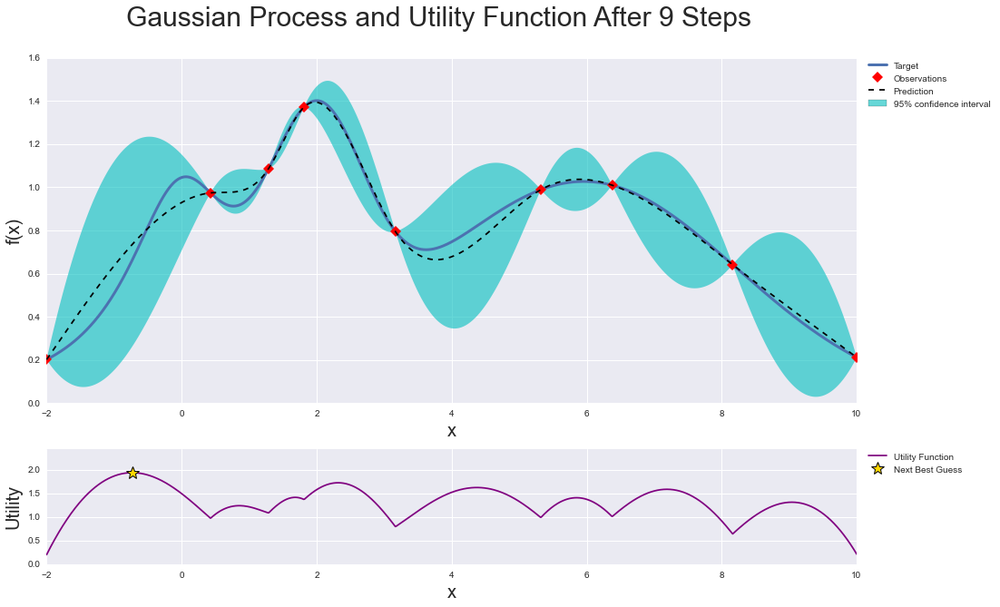

In [49]:
from bayes_opt import BayesianOptimization

In [50]:
pbounds = {}
for i in range(196):
    pbounds['dimension'+str(i)] = (-3.8,3.3) #min/max of gdb, src, abl1 latent space

In [ ]:
pbounds

In [51]:
optimizer_combined = BayesianOptimization(
    f=property_score_prediction_with_druglikeliness_and_similarity,
    pbounds=pbounds,
    random_state=1,
)

# Optimization Step

In [56]:
optimizer_combined.maximize(
    init_points=100,
    n_iter=10
)

|   iter    |  target   | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | dimens... | di

RDKit ERROR: [15:53:36] SMILES Parse Error: syntax error while parsing: CC1=NC(=O)NC(@@@H]1NC(=N(=O)=O)C(=O)=OC(=O)c/C(=C)c3C@@H]4=C@H]c3=O)C@@H]1=O-]1=O
RDKit ERROR: [15:53:36] SMILES Parse Error: Failed parsing SMILES 'CC1=NC(=O)NC(@@@H]1NC(=N(=O)=O)C(=O)=OC(=O)c/C(=C)c3C@@H]4=C@H]c3=O)C@@H]1=O-]1=O' for input: 'CC1=NC(=O)NC(@@@H]1NC(=N(=O)=O)C(=O)=OC(=O)c/C(=C)c3C@@H]4=C@H]c3=O)C@@H]1=O-]1=O'
RDKit ERROR: [15:53:36] SMILES Parse Error: syntax error while parsing: CCOC1C(=O)NC(C[C@H]c(2=N(=O)=O)NC(=O)N/C@@H]3C(=O)=CC(C)@H]2=C@H]3)C1=OC
RDKit ERROR: [15:53:36] SMILES Parse Error: Failed parsing SMILES 'CCOC1C(=O)NC(C[C@H]c(2=N(=O)=O)NC(=O)N/C@@H]3C(=O)=CC(C)@H]2=C@H]3)C1=OC' for input: 'CCOC1C(=O)NC(C[C@H]c(2=N(=O)=O)NC(=O)N/C@@H]3C(=O)=CC(C)@H]2=C@H]3)C1=OC'
RDKit ERROR: [15:53:36] SMILES Parse Error: syntax error while parsing: CC1=NC(=O)NC@@[O-]2C(=C2(NC)=O)C(C(=O)C(=C3/C\C@@H3CC(Cl@H]3=C)c2)n2C)C1=O
RDKit ERROR: [15:53:36] SMILES Parse Error: Failed parsing SMILES 'CC1=NC(=O)NC@@[

|  31       |  0.0      | -2.245    |  0.1237   | -0.7271   |  1.937    | -2.816    | -2.445    |  0.2293   | -2.309    |  2.448    |  0.3063   |  2.673    |  1.627    | -0.4279   |  1.116    | -3.375    |  0.6819   |  3.187    | -2.952    | -0.5939   | -3.668    |  1.086    | -3.662    | -0.5676   | -2.244    |  1.931    |  0.784    |  0.9305   |  0.1042   | -2.022    |  1.991    |  2.449    | -0.6879   |  0.3629   |  0.6325   |  1.366    |  0.3954   |  1.927    |  2.051    |  0.1515   |  2.469    | -2.359    | -0.8633   |  0.6738   | -3.072    |  1.302    | -0.3942   | -1.109    | -0.5919   | -1.19     | -2.099    |  2.703    |  1.875    | -1.429    | -2.6      | -2.972    |  1.847    |  1.184    | -3.266    | -2.972    |  2.688    |  2.375    | -1.727    | -3.076    |  1.943    | -3.614    |  0.7181   | -2.663    |  1.111    | -2.607    | -1.322    | -2.933    | -1.762    | -2.883    | -0.51     |  0.8108   | -0.999    |  2.966    |  1.56     |  0.06506  |  0.201    | -1.524    | -0

RDKit ERROR: [15:53:41] SMILES Parse Error: unclosed ring for input: 'C=C(N1cccc(C)c([NH+]1)N=C(C2=N=NC(=O)CC(F)cc3)NCO)c2'
RDKit ERROR: [15:53:41] SMILES Parse Error: syntax error while parsing: C=C(Nc1ccc(C)c(-](=O)/N=C(C2=N=NC(=O)CC(F)cc3)N=O)c2)ccc(F)ccc1
RDKit ERROR: [15:53:41] SMILES Parse Error: Failed parsing SMILES 'C=C(Nc1ccc(C)c(-](=O)/N=C(C2=N=NC(=O)CC(F)cc3)N=O)c2)ccc(F)ccc1' for input: 'C=C(Nc1ccc(C)c(-](=O)/N=C(C2=N=NC(=O)CC(F)cc3)N=O)c2)ccc(F)ccc1'
RDKit ERROR: [15:53:41] SMILES Parse Error: unclosed ring for input: 'C=C(Nc1cc(Cl)c(O)[n+]1N=C(C2=N=NC(=O)CC(F)cc3)N=O)c2'


|  32       |  0.0      |  0.1413   | -2.186    | -1.204    | -2.593    |  0.9163   | -3.22     | -1.363    | -0.02972  |  0.1017   | -1.19     |  0.7706   | -2.632    |  1.343    |  2.769    |  3.228    |  2.437    | -1.947    | -3.53     |  3.116    |  0.1556   |  0.03194  | -2.76     |  2.679    |  2.999    |  2.303    |  1.119    | -1.06     |  2.78     |  2.267    |  2.149    |  0.3468   | -3.303    | -3.618    | -2.198    | -3.145    |  1.49     |  2.242    |  0.03734  |  0.54     | -0.4407   |  2.84     |  0.551    |  0.6046   |  2.292    | -1.075    | -3.345    |  1.455    |  2.194    | -0.1063   | -0.4797   | -3.1      | -1.576    | -2.47     |  1.507    | -2.661    |  1.061    | -0.6712   | -3.77     |  1.187    |  1.83     | -1.397    | -0.4109   | -3.454    | -2.191    |  1.143    | -2.798    | -2.163    |  1.133    | -3.315    |  1.378    |  0.655    |  0.8297   | -1.518    |  0.02295  | -3.241    | -1.78     | -2.36     | -0.1694   |  0.8307   |  0.5671   | -2.851    | -2

RDKit ERROR: [15:53:47] SMILES Parse Error: syntax error while parsing: C#C@H]1(c12ncn3n(=C@c3cccc(F)cc3)c3nc3ccc34cc1=O)C(=O)c1
RDKit ERROR: [15:53:47] SMILES Parse Error: Failed parsing SMILES 'C#C@H]1(c12ncn3n(=C@c3cccc(F)cc3)c3nc3ccc34cc1=O)C(=O)c1' for input: 'C#C@H]1(c12ncn3n(=C@c3cccc(F)cc3)c3nc3ccc34cc1=O)C(=O)c1'
RDKit ERROR: [15:53:47] SMILES Parse Error: syntax error while parsing: C#C@H]1O-c1n(C)n(=C(c3cccc(F)c23)c3nc4cccc3cc2c1)C1=O
RDKit ERROR: [15:53:47] SMILES Parse Error: Failed parsing SMILES 'C#C@H]1O-c1n(C)n(=C(c3cccc(F)c23)c3nc4cccc3cc2c1)C1=O' for input: 'C#C@H]1O-c1n(C)n(=C(c3cccc(F)c23)c3nc4cccc3cc2c1)C1=O'
RDKit ERROR: [15:53:47] SMILES Parse Error: syntax error while parsing: C#C@H]1O-cnc(c3n(=C(-3cccc(F)cc3)c3nc3ccc2)cc1O)C2CO3
RDKit ERROR: [15:53:47] SMILES Parse Error: Failed parsing SMILES 'C#C@H]1O-cnc(c3n(=C(-3cccc(F)cc3)c3nc3ccc2)cc1O)C2CO3' for input: 'C#C@H]1O-cnc(c3n(=C(-3cccc(F)cc3)c3nc3ccc2)cc1O)C2CO3'


|  33       |  0.0      | -1.602    | -1.085    |  1.603    | -1.457    | -3.347    | -3.473    | -2.842    | -0.4664   | -1.073    |  0.9939   | -3.123    | -2.651    |  3.081    | -0.7862   |  2.704    | -2.136    |  3.176    | -2.902    |  1.737    |  3.162    | -0.3421   | -0.3218   | -2.556    |  0.5235   | -2.076    |  1.289    | -0.4341   | -2.15     | -0.5292   | -3.625    | -3.11     | -3.08     | -1.037    |  1.283    | -3.425    | -3.711    | -2.753    |  2.85     |  2.347    | -0.9421   | -2.655    | -1.281    |  2.837    |  0.7692   | -0.4554   | -0.9432   |  2.566    |  3.112    |  1.729    |  2.117    | -1.62     |  2.871    | -0.5858   | -2.527    |  0.4337   |  1.057    | -0.6949   | -1.149    |  1.201    | -1.956    |  1.073    |  0.2819   | -1.421    |  1.005    | -3.495    |  0.09666  |  0.4288   | -1.761    | -1.27     |  2.327    |  0.5975   |  0.7436   | -3.057    | -2.111    |  1.307    |  1.166    | -0.629    | -3.521    | -3.442    | -3.172    |  2.337    | -2

RDKit ERROR: [15:53:52] Explicit valence for atom # 15 O, 4, is greater than permitted
RDKit ERROR: [15:53:52] SMILES Parse Error: ring closure 1 duplicates bond between atom 26 and atom 27 for input: 'CCN1C(C(C#C1C)ccc(C#N)c(=O)c2n[nH]n2SC(C)O)[C@@H](OC)c1c1'


|  34       |  0.0      | -0.04187  | -2.82     |  0.8135   | -2.146    | -3.114    | -3.644    |  2.299    | -2.787    | -0.9392   | -3.136    | -2.963    | -1.139    | -2.626    |  1.305    | -2.906    |  1.446    |  2.174    | -3.213    | -3.515    | -0.2959   |  0.4654   |  1.056    | -0.4042   |  0.05643  |  0.1022   |  1.268    | -2.691    | -3.646    | -0.1928   |  2.971    | -3.621    |  0.5509   | -0.2934   |  2.591    | -3.632    |  0.8825   |  0.8592   |  2.475    |  0.008596 |  1.104    | -0.8701   |  2.069    |  1.064    | -3.033    | -2.807    | -2.678    | -2.944    | -2.165    | -0.7941   |  0.9624   | -1.41     | -0.1097   |  2.03     |  2.481    |  1.202    |  2.125    | -1.606    |  1.813    |  2.708    | -3.527    | -0.636    | -2.097    | -0.2925   |  0.5841   | -2.316    |  2.408    | -1.983    |  1.267    |  2.251    |  2.82     |  2.986    |  1.029    |  0.6625   |  0.4314   | -0.3556   | -1.241    | -3.653    |  1.516    | -1.005    | -1.817    |  1.72     |  0

RDKit ERROR: [15:53:57] SMILES Parse Error: syntax error while parsing: C[C@@]1(C(N)(=Oc2c(C#N)ncc(C)ccc2)C2)n2C(c2c(Cl)oc3)occ(=C(C@@H]1(F)=O)=OC#N)C2
RDKit ERROR: [15:53:57] SMILES Parse Error: Failed parsing SMILES 'C[C@@]1(C(N)(=Oc2c(C#N)ncc(C)ccc2)C2)n2C(c2c(Cl)oc3)occ(=C(C@@H]1(F)=O)=OC#N)C2' for input: 'C[C@@]1(C(N)(=Oc2c(C#N)ncc(C)ccc2)C2)n2C(c2c(Cl)oc3)occ(=C(C@@H]1(F)=O)=OC#N)C2'
RDKit ERROR: [15:53:57] SMILES Parse Error: syntax error while parsing: C[C@@]1(C(N)(=OC(c(C#N)noc(Br)c(F)C)=O)c(c3c(Cl)oc3)NCNC@H]3C)=C@H]1
RDKit ERROR: [15:53:57] SMILES Parse Error: Failed parsing SMILES 'C[C@@]1(C(N)(=OC(c(C#N)noc(Br)c(F)C)=O)c(c3c(Cl)oc3)NCNC@H]3C)=C@H]1' for input: 'C[C@@]1(C(N)(=OC(c(C#N)noc(Br)c(F)C)=O)c(c3c(Cl)oc3)NCNC@H]3C)=C@H]1'


|  35       |  0.0      |  1.079    |  2.216    | -0.3658   | -3.08     | -3.069    | -2.979    | -0.2861   |  0.6164   | -3.564    | -3.356    |  3.204    | -1.733    | -0.4152   |  0.6775   |  1.276    | -3.023    | -3.021    |  2.676    | -1.499    |  1.339    |  1.238    | -0.4715   | -3.152    |  2.518    |  2.125    | -0.7351   | -0.5631   |  0.0759   | -1.113    | -0.2168   | -0.444    | -1.77     |  2.395    | -3.465    | -1.213    |  1.696    | -0.3529   |  1.783    | -0.3735   |  3.225    |  2.477    | -3.745    | -0.4271   |  2.288    | -1.361    |  1.376    | -0.83     | -3.12     | -1.562    | -1.578    |  0.8473   |  2.781    |  1.196    | -1.506    |  1.05     | -3.203    | -1.134    | -2.451    |  1.121    |  0.9009   | -1.293    | -2.518    | -2.688    | -2.117    | -1.468    |  2.374    | -2.934    | -2.606    | -1.17     |  0.4909   | -3.404    | -2.059    |  2.121    |  0.9065   | -1.305    | -2.989    | -1.493    | -2.064    |  1.245    | -1.666    |  1.008    | -0

RDKit ERROR: [15:54:02] SMILES Parse Error: syntax error while parsing: COC(=O)Nc1nnc(NC@@H+]c2scnc2C#N)cn1-c1cc1C1CN1
RDKit ERROR: [15:54:02] SMILES Parse Error: Failed parsing SMILES 'COC(=O)Nc1nnc(NC@@H+]c2scnc2C#N)cn1-c1cc1C1CN1' for input: 'COC(=O)Nc1nnc(NC@@H+]c2scnc2C#N)cn1-c1cc1C1CN1'
RDKit ERROR: [15:54:02] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 19
RDKit ERROR: 
RDKit ERROR: [15:54:02] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 19
RDKit ERROR: 
RDKit ERROR: [15:54:02] SMILES Parse Error: syntax error while parsing: COC(=O)Nc1nnc(NC@@H+]c2scc(C)CO)cn1-c1scc1CCN2
RDKit ERROR: [15:54:02] SMILES Parse Error: Failed parsing SMILES 'COC(=O)Nc1nnc(NC@@H+]c2scc(C)CO)cn1-c1scc1CCN2' for input: 'COC(=O)Nc1nnc(NC@@H+]c2scc(C)CO)cn1-c1scc1CCN2'
RDKit ERROR: [15:54:02] SMILES Parse Error: syntax error while parsing: COC(=O)Nc1nnc(C@H](O)c2sccc2C#N)cc1c1cc1C1CCN1
RDKit ERROR: [15:54:02] SMILES Parse Error: Failed parsing SMILES 'COC(=O)Nc1nnc(C@H](O)c2sccc2C#N)cc1c1cc1C1CCN1' 

|  36       |  0.0      | -2.341    | -3.095    | -0.07708  | -2.291    |  2.621    | -3.473    |  2.571    |  0.3729   |  2.317    | -3.593    | -1.436    | -0.2421   | -2.259    | -0.7996   | -3.59     |  0.369    |  2.801    | -3.262    |  2.177    |  1.509    | -2.167    | -0.1214   | -1.572    |  0.5721   | -2.286    | -0.7052   |  1.802    | -0.4881   |  0.9822   |  2.482    |  2.861    |  3.192    |  2.473    | -2.071    | -0.901    | -1.139    | -2.719    | -3.3      | -1.7      |  2.306    | -3.523    | -2.27     | -1.34     |  0.8019   |  0.1985   |  1.853    |  1.077    |  2.515    | -0.343    |  0.005032 |  2.147    | -3.76     | -2.078    | -2.227    |  0.187    |  1.295    | -2.007    | -0.2073   |  1.449    |  1.328    | -0.475    |  1.214    |  0.1694   | -3.243    |  2.965    |  3.127    | -2.65     | -0.8334   |  0.5991   |  0.2337   | -1.139    |  2.615    |  1.008    | -3.0      |  0.9539   | -2.252    | -3.189    | -1.244    | -3.448    | -2.759    | -0.5832   |  3

RDKit ERROR: [15:54:07] SMILES Parse Error: syntax error while parsing: CCN(C@(C)C)C@@H]1cc(C(C(=O)NC(=C)C(=O)c2nccc2C)c1CO)C
RDKit ERROR: [15:54:07] SMILES Parse Error: Failed parsing SMILES 'CCN(C@(C)C)C@@H]1cc(C(C(=O)NC(=C)C(=O)c2nccc2C)c1CO)C' for input: 'CCN(C@(C)C)C@@H]1cc(C(C(=O)NC(=C)C(=O)c2nccc2C)c1CO)C'


|  37       |  0.0      |  0.486    |  0.9171   | -1.866    |  2.1      | -2.064    |  0.9809   | -3.174    | -3.666    | -0.4463   |  2.867    | -1.488    | -1.513    | -3.431    |  0.9945   |  1.324    |  2.616    | -0.6962   | -3.022    | -3.533    |  2.453    |  0.831    |  2.7      |  2.452    | -0.4613   |  0.9594   |  1.49     | -0.8023   | -2.707    | -1.783    |  0.09419  | -1.984    |  2.531    |  0.3233   |  1.303    |  2.32     |  2.566    |  2.999    |  0.6553   |  3.293    |  1.813    | -1.877    |  3.233    |  1.891    | -2.003    | -3.574    |  2.965    |  0.1535   |  0.1242   | -3.464    |  0.7372   | -0.2493   |  1.91     | -3.306    |  0.1968   | -0.8984   |  0.1176   | -1.255    |  3.296    | -0.6027   | -1.345    | -2.453    |  2.757    | -3.06     | -0.6736   |  1.072    | -2.789    |  2.814    | -3.382    | -2.251    | -3.252    | -0.8783   |  0.4405   |  1.391    |  2.437    | -1.292    |  1.187    | -3.455    |  2.017    | -1.54     | -2.226    | -1.237    | -2

RDKit ERROR: [15:54:13] SMILES Parse Error: syntax error while parsing: C[C@H]1=C[C@@H]2(C)CN(C)cc(-c3ccc(C(O)NC(=O)(C)s3)s2)cc(=O)(C)C@@H]1
RDKit ERROR: [15:54:13] SMILES Parse Error: Failed parsing SMILES 'C[C@H]1=C[C@@H]2(C)CN(C)cc(-c3ccc(C(O)NC(=O)(C)s3)s2)cc(=O)(C)C@@H]1' for input: 'C[C@H]1=C[C@@H]2(C)CN(C)cc(-c3ccc(C(O)NC(=O)(C)s3)s2)cc(=O)(C)C@@H]1'
RDKit ERROR: [15:54:13] SMILES Parse Error: syntax error while parsing: C[C@H]1=C[C@H](O)CCN(OC2cc(-n3cc(C(=O)NC(=O)c3)o3)s2)c[C@@H+](=O)[C@H]1(O-]1=O-]1
RDKit ERROR: [15:54:13] SMILES Parse Error: Failed parsing SMILES 'C[C@H]1=C[C@H](O)CCN(OC2cc(-n3cc(C(=O)NC(=O)c3)o3)s2)c[C@@H+](=O)[C@H]1(O-]1=O-]1' for input: 'C[C@H]1=C[C@H](O)CCN(OC2cc(-n3cc(C(=O)NC(=O)c3)o3)s2)c[C@@H+](=O)[C@H]1(O-]1=O-]1'
RDKit ERROR: [15:54:13] SMILES Parse Error: syntax error while parsing: C[C@@]1=C[C@@H](O)C(N(C2)c(-c3cc(C(=O)n[n+]c(C)s3)s2)cc(=O)OC@@H]1-]1O-]1-]1=[O-]1-]1)O-]1
RDKit ERROR: [15:54:13] SMILES Parse Error: Failed parsing SMILES 'C[C@@]1=C[C

|  38       |  0.0      | -2.761    |  0.9291   | -2.931    | -3.185    |  1.194    | -0.8801   |  3.272    | -0.008251 |  1.731    |  2.367    |  1.871    | -2.28     |  1.031    | -3.767    |  1.85     | -2.268    |  3.206    |  2.903    |  0.3543   | -2.661    |  1.194    | -0.8361   | -0.4859   | -1.635    |  2.371    | -0.4671   |  1.924    |  1.928    |  0.1549   | -1.058    |  1.078    |  1.034    | -2.508    |  1.625    | -2.627    | -1.499    |  2.378    |  0.2588   | -1.978    |  2.76     |  0.8901   |  0.137    |  3.253    |  2.203    |  1.008    | -3.22     | -1.212    | -0.2346   |  0.5854   |  0.7431   |  1.348    |  2.663    |  0.2348   |  3.16     | -2.996    | -0.4937   | -3.078    |  1.471    |  1.928    | -0.08559  | -0.729    | -3.324    |  0.2088   | -1.991    | -3.215    |  1.409    |  1.478    | -1.165    | -2.49     | -0.1585   | -3.136    |  1.727    | -0.4207   |  3.023    | -3.026    |  1.156    |  1.905    |  1.361    | -0.5237   |  0.07738  |  0.5678   | -3

RDKit ERROR: [15:54:18] SMILES Parse Error: syntax error while parsing: CC(C@]1C(=C(Cl)[Cl)C([O-])C)S(CO[C@@H]3N=C(=SC(=N\O)C)C@H]1=NH]1=O)Oc1
RDKit ERROR: [15:54:18] SMILES Parse Error: Failed parsing SMILES 'CC(C@]1C(=C(Cl)[Cl)C([O-])C)S(CO[C@@H]3N=C(=SC(=N\O)C)C@H]1=NH]1=O)Oc1' for input: 'CC(C@]1C(=C(Cl)[Cl)C([O-])C)S(CO[C@@H]3N=C(=SC(=N\O)C)C@H]1=NH]1=O)Oc1'


|  39       |  0.0      | -1.497    | -2.317    |  1.629    | -2.268    | -1.193    | -3.364    |  1.873    |  2.29     |  3.151    |  2.95     | -0.3417   | -1.696    |  1.129    |  1.345    |  2.365    | -2.335    | -0.9674   |  1.801    | -2.219    | -0.3765   |  1.745    |  0.4931   | -2.387    | -0.3044   |  3.16     | -2.437    | -2.077    | -0.8503   |  1.845    |  2.305    |  1.658    | -0.7991   | -1.936    |  0.3969   |  0.1499   | -1.507    | -2.062    |  0.6671   | -1.234    | -0.6294   | -0.7918   |  0.4954   | -3.323    | -0.5      |  2.848    | -2.749    |  2.459    | -2.39     | -0.3719   | -0.3141   | -2.133    |  0.4357   |  2.143    | -2.076    | -0.2093   | -0.4744   |  1.915    | -0.3532   | -3.459    | -1.678    |  1.324    |  0.03941  |  1.262    |  2.522    | -3.538    | -2.653    | -2.336    |  0.09216  |  1.081    | -1.369    |  2.376    |  2.442    | -2.45     | -0.02403  |  3.226    | -3.391    | -3.208    | -0.8348   |  2.268    | -0.97     | -3.729    |  0

RDKit ERROR: [15:54:23] SMILES Parse Error: ring closure 2 duplicates bond between atom 8 and atom 9 for input: 'COc12Cc32ncc3o12/C(\c1ccccc(=O)NC(C)cc(Cl)o1)-2'
RDKit ERROR: [15:54:23] SMILES Parse Error: syntax error while parsing: COC1cccc2nc(c3c1/C(\c1coccc(=O)NC(C)cc(Cl)o1)=O)OC@@H2
RDKit ERROR: [15:54:23] SMILES Parse Error: Failed parsing SMILES 'COC1cccc2nc(c3c1/C(\c1coccc(=O)NC(C)cc(Cl)o1)=O)OC@@H2' for input: 'COC1cccc2nc(c3c1/C(\c1coccc(=O)NC(C)cc(Cl)o1)=O)OC@@H2'
RDKit ERROR: [15:54:23] SMILES Parse Error: syntax error while parsing: COC12C(c2nc(c3c2o1=C1\cccoc(=O)NC(Cl)c(Cl)o1)=O)NC@@H2
RDKit ERROR: [15:54:23] SMILES Parse Error: Failed parsing SMILES 'COC12C(c2nc(c3c2o1=C1\cccoc(=O)NC(Cl)c(Cl)o1)=O)NC@@H2' for input: 'COC12C(c2nc(c3c2o1=C1\cccoc(=O)NC(Cl)c(Cl)o1)=O)NC@@H2'
RDKit ERROR: [15:54:23] SMILES Parse Error: ring closure 1 duplicates bond between atom 23 and atom 25 for input: 'COC1c2C(c3c(c3C2/C(F)c\C)co(=O)N(C(F)c(Cl)n1)C)n1(C)C1'
RDKit ERROR: [15:54:23] Explici

|  40       |  0.0      |  0.8454   | -1.753    |  2.433    | -2.626    | -0.6365   |  3.081    | -3.188    | -0.9567   | -1.773    | -3.213    |  1.239    |  0.1933   |  3.215    | -2.184    | -3.057    | -0.4637   |  1.349    | -2.358    | -2.427    | -3.683    |  0.555    |  0.3654   | -0.533    |  1.214    | -3.379    |  0.9214   | -2.462    | -2.847    |  2.554    |  1.089    |  0.7069   | -3.357    | -3.087    | -0.8312   |  1.711    | -3.734    | -0.5004   | -2.378    |  2.544    |  0.4478   |  1.082    |  1.934    |  0.3741   |  2.217    | -0.4598   | -2.562    |  0.755    |  3.133    | -1.313    |  1.899    |  1.009    | -0.1047   | -2.775    |  2.156    | -0.7742   |  1.759    |  0.4006   | -2.021    | -2.568    |  1.44     | -3.004    | -2.255    |  2.344    |  2.623    | -3.136    | -3.697    | -1.641    | -2.889    | -1.975    | -0.2334   |  0.186    |  3.162    | -0.75     |  1.023    |  2.515    | -2.722    | -3.138    | -1.693    | -2.879    | -2.657    | -1.361    | -1

RDKit ERROR: [15:54:28] SMILES Parse Error: syntax error while parsing: C1CCN(N2cc(C([C@@H]1C)C(=O)N=[C@H](C)CN3=C2CN3[C@H]4)(=C)C)ccc1=O-]1
RDKit ERROR: [15:54:28] SMILES Parse Error: Failed parsing SMILES 'C1CCN(N2cc(C([C@@H]1C)C(=O)N=[C@H](C)CN3=C2CN3[C@H]4)(=C)C)ccc1=O-]1' for input: 'C1CCN(N2cc(C([C@@H]1C)C(=O)N=[C@H](C)CN3=C2CN3[C@H]4)(=C)C)ccc1=O-]1'
RDKit ERROR: [15:54:28] SMILES Parse Error: syntax error while parsing: C1CCNc12ccn(C[C@@H]1ClC(=O)N=[C@H](C)NC3=2C(N3[C@]3)[C@]3)c(C)OC#NH]c1
RDKit ERROR: [15:54:28] SMILES Parse Error: Failed parsing SMILES 'C1CCNc12ccn(C[C@@H]1ClC(=O)N=[C@H](C)NC3=2C(N3[C@]3)[C@]3)c(C)OC#NH]c1' for input: 'C1CCNc12ccn(C[C@@H]1ClC(=O)N=[C@H](C)NC3=2C(N3[C@]3)[C@]3)c(C)OC#NH]c1'
RDKit ERROR: [15:54:28] SMILES Parse Error: syntax error while parsing: C(CCNcc2ccc(C[C@@H]3SCC(=O)N=[C@H](C)CN3=C2CN3[C@H](C(C)C)cc(cc2)COC)O)C#NH]2
RDKit ERROR: [15:54:28] SMILES Parse Error: Failed parsing SMILES 'C(CCNcc2ccc(C[C@@H]3SCC(=O)N=[C@H](C)CN3=C2CN3[C@H](C(C)C

|  41       |  0.0      |  1.813    |  0.9421   |  2.281    | -1.748    |  1.724    | -3.665    |  2.402    | -2.041    | -2.926    | -2.903    |  0.3734   |  2.532    | -3.143    | -0.3673   |  2.486    |  2.996    |  3.234    | -1.23     |  0.3558   | -1.067    | -2.835    |  1.607    | -2.232    |  1.147    |  1.947    | -1.865    | -0.1897   | -0.8017   | -3.412    |  1.465    |  1.942    |  0.02074  |  1.591    | -3.508    | -2.506    |  0.2264   |  0.6106   |  1.752    |  0.4706   |  0.1779   |  0.9543   | -2.484    | -2.748    | -2.143    |  2.495    |  0.6506   |  0.8659   | -1.625    | -1.961    |  0.4393   | -2.274    |  2.842    |  1.906    | -3.249    | -2.558    | -0.3411   | -1.888    | -1.74     |  3.026    | -1.371    |  2.135    | -1.353    |  1.322    | -2.494    |  1.07     |  0.2772   |  1.368    | -0.698    |  2.937    |  3.229    | -1.113    |  1.567    |  2.831    |  1.97     | -0.6075   | -3.786    |  2.922    | -1.319    | -3.537    | -2.065    |  3.037    | -0

RDKit ERROR: [15:54:35] SMILES Parse Error: syntax error while parsing: C/NH](C(=O)C(C)C(C@@H]1c1C(F)nc1)[O-](O)C(C(/C)N2(C)C2C)C)C1=O
RDKit ERROR: [15:54:35] SMILES Parse Error: Failed parsing SMILES 'C/NH](C(=O)C(C)C(C@@H]1c1C(F)nc1)[O-](O)C(C(/C)N2(C)C2C)C)C1=O' for input: 'C/NH](C(=O)C(C)C(C@@H]1c1C(F)nc1)[O-](O)C(C(/C)N2(C)C2C)C)C1=O'


|  42       |  0.0      |  1.526    | -3.501    | -3.608    | -0.3408   | -3.571    | -3.079    |  0.1994   | -0.7626   |  1.815    | -1.855    | -1.866    | -0.9187   |  0.9799   |  3.169    | -0.9779   |  1.486    |  2.283    |  0.9925   |  1.734    |  1.965    |  0.4382   | -0.6831   | -2.602    |  1.748    | -2.422    |  3.291    |  0.05249  | -3.733    | -0.8265   | -2.089    | -3.423    |  1.285    | -1.553    |  2.03     |  1.627    | -3.334    |  1.26     | -2.416    |  1.714    | -2.022    | -0.9334   |  2.471    |  0.8645   | -3.221    | -2.845    | -3.745    |  3.174    | -3.462    | -3.052    | -0.552    | -3.414    | -1.747    |  1.014    | -3.455    | -0.5484   |  0.2666   | -2.385    | -2.478    | -3.071    | -3.312    | -2.6      | -3.368    |  0.1169   |  1.936    |  1.911    |  0.6814   |  0.0464   | -0.4833   |  3.017    | -1.742    | -1.198    |  0.2849   | -0.1607   |  0.9871   |  1.7      | -2.505    |  0.6652   |  1.128    | -1.867    |  2.789    | -1.349    |  0

RDKit ERROR: [15:54:40] SMILES Parse Error: syntax error while parsing: Nc1nc(N)c(C[S(=C(OC)C)C(C)C)c2(C)(O)C(S@]2(C)C)c1(Cl)Cl
RDKit ERROR: [15:54:40] SMILES Parse Error: Failed parsing SMILES 'Nc1nc(N)c(C[S(=C(OC)C)C(C)C)c2(C)(O)C(S@]2(C)C)c1(Cl)Cl' for input: 'Nc1nc(N)c(C[S(=C(OC)C)C(C)C)c2(C)(O)C(S@]2(C)C)c1(Cl)Cl'
RDKit ERROR: [15:54:40] SMILES Parse Error: syntax error while parsing: C1cnc(N)c(C[S(=OCOC)C(C(C)C)=C(C)(O)C(C@H](C)C)c1(C)C)C
RDKit ERROR: [15:54:40] SMILES Parse Error: Failed parsing SMILES 'C1cnc(N)c(C[S(=OCOC)C(C(C)C)=C(C)(O)C(C@H](C)C)c1(C)C)C' for input: 'C1cnc(N)c(C[S(=OCOC)C(C(C)C)=C(C)(O)C(C@H](C)C)c1(C)C)C'
RDKit ERROR: [15:54:40] SMILES Parse Error: syntax error while parsing: C(cnc(O)c(C[C@H](OC)C)C(C)C)=C(C)(O)C(C@H](C)C)C1(C)co1
RDKit ERROR: [15:54:40] SMILES Parse Error: Failed parsing SMILES 'C(cnc(O)c(C[C@H](OC)C)C(C)C)=C(C)(O)C(C@H](C)C)C1(C)co1' for input: 'C(cnc(O)c(C[C@H](OC)C)C(C)C)=C(C)(O)C(C@H](C)C)C1(C)co1'
RDKit ERROR: [15:54:40] SMILES Parse 

|  43       |  0.0      |  0.7298   |  2.646    | -1.887    |  1.246    | -1.313    | -1.213    | -3.222    | -1.469    | -1.497    | -3.59     |  0.1019   |  1.218    | -0.2606   | -0.05614  | -3.049    |  1.062    | -0.4549   | -2.172    |  2.276    |  0.2129   |  3.294    | -3.253    | -0.1435   | -1.642    |  2.317    | -2.651    | -3.79     | -0.6548   |  1.008    |  3.072    |  0.6028   | -2.448    | -1.229    |  1.738    | -1.459    | -2.634    | -1.776    | -3.514    |  1.561    | -1.774    |  1.628    |  2.182    | -0.5694   |  2.295    |  3.239    |  2.886    |  3.153    |  2.95     |  3.044    |  1.155    | -2.691    |  0.792    |  3.234    | -2.066    |  1.041    | -2.882    |  3.287    | -0.819    | -1.31     | -2.333    |  2.236    |  0.5481   |  0.2849   | -2.039    | -2.852    | -3.339    |  0.5115   |  1.38     | -0.7832   | -3.097    | -3.166    | -0.04041  | -1.415    |  0.8959   |  2.973    | -3.452    | -2.939    |  0.5184   | -1.697    |  1.303    | -0.3578   |  2

RDKit ERROR: [15:54:46] SMILES Parse Error: syntax error while parsing: Cc1ccc(NC(C@]2)(CN(/O[C@H]3C@(Cl)(F)C(C)c3F)cc2)C(Cl)C)c1
RDKit ERROR: [15:54:46] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(NC(C@]2)(CN(/O[C@H]3C@(Cl)(F)C(C)c3F)cc2)C(Cl)C)c1' for input: 'Cc1ccc(NC(C@]2)(CN(/O[C@H]3C@(Cl)(F)C(C)c3F)cc2)C(Cl)C)c1'
RDKit ERROR: [15:54:46] SMILES Parse Error: syntax error while parsing: Clcccc(NC(C@@H]2CN(COC(=O)C(C(Cl)=C)C(I)c2F)c/C)C(C)C)Cl
RDKit ERROR: [15:54:46] SMILES Parse Error: Failed parsing SMILES 'Clcccc(NC(C@@H]2CN(COC(=O)C(C(Cl)=C)C(I)c2F)c/C)C(C)C)Cl' for input: 'Clcccc(NC(C@@H]2CN(COC(=O)C(C(Cl)=C)C(I)c2F)c/C)C(C)C)Cl'


|  44       |  0.0      | -2.572    | -0.1965   | -2.535    | -0.4938   | -3.121    |  2.653    |  2.185    | -2.347    | -2.224    |  0.2101   | -3.507    |  3.152    | -1.355    | -1.697    |  2.788    | -2.064    | -0.9232   | -2.495    | -3.189    |  2.684    | -1.831    |  1.726    | -2.649    |  0.9269   | -1.852    |  1.349    | -3.394    |  0.901    | -3.402    |  0.8684   | -1.317    |  1.424    | -0.8328   |  0.1436   | -2.453    | -1.829    | -0.3488   | -3.47     |  2.227    | -0.6858   | -2.449    | -2.738    | -2.904    | -0.3763   |  3.26     |  2.133    |  2.448    | -0.1558   | -3.707    |  1.804    |  2.693    | -3.352    | -2.558    | -0.1822   | -0.7408   |  3.008    |  3.191    | -2.704    | -1.293    |  0.2957   | -0.8022   | -0.1939   |  2.427    | -3.371    |  2.699    | -1.581    |  1.377    | -1.847    |  1.382    |  1.769    |  0.2272   | -3.012    | -2.915    |  2.276    |  2.831    |  0.8054   | -2.487    |  1.329    | -2.209    |  1.544    |  3.29     |  2

RDKit ERROR: [15:54:51] SMILES Parse Error: syntax error while parsing: OC1=C(NC(=O)C2c1)c(C)[C@H]2C[C@H]1C@@@H2CC(C1C@@H]1ccc1O)N2
RDKit ERROR: [15:54:51] SMILES Parse Error: Failed parsing SMILES 'OC1=C(NC(=O)C2c1)c(C)[C@H]2C[C@H]1C@@@H2CC(C1C@@H]1ccc1O)N2' for input: 'OC1=C(NC(=O)C2c1)c(C)[C@H]2C[C@H]1C@@@H2CC(C1C@@H]1ccc1O)N2'
RDKit ERROR: [15:54:51] SMILES Parse Error: syntax error while parsing: O-c1C2=C(=O)C2cccncc1[C@H]1C[C@@H]1C@1=C2C(C1C@@H]1ccc1O)N2
RDKit ERROR: [15:54:51] SMILES Parse Error: Failed parsing SMILES 'O-c1C2=C(=O)C2cccncc1[C@H]1C[C@@H]1C@1=C2C(C1C@@H]1ccc1O)N2' for input: 'O-c1C2=C(=O)C2cccncc1[C@H]1C[C@@H]1C@1=C2C(C1C@@H]1ccc1O)N2'


|  45       |  0.0      | -3.71     | -1.249    |  1.063    | -2.326    | -2.516    | -1.712    | -3.76     | -1.352    |  2.082    | -3.642    | -3.585    | -1.142    | -3.336    |  2.257    | -1.219    |  1.232    | -1.368    | -1.774    | -3.761    | -1.883    |  0.1633   | -0.994    |  2.201    | -2.0      |  2.733    | -2.771    | -0.3642   | -2.366    | -3.004    | -3.24     | -3.104    | -0.6517   | -0.2931   | -1.709    |  1.243    | -3.647    | -1.602    |  2.184    |  0.08695  | -3.408    | -0.1778   | -1.711    | -2.619    |  1.023    | -2.403    | -0.9892   |  1.367    |  1.951    |  0.4705   | -2.871    | -3.723    | -1.723    | -0.3644   | -3.263    | -3.207    |  3.154    |  0.6323   |  2.043    |  1.745    | -0.1773   |  0.5094   | -1.795    |  2.846    |  0.5798   | -0.9114   | -3.444    | -3.056    | -0.648    | -3.631    | -1.751    | -2.274    | -2.227    | -2.432    |  2.158    | -0.4911   |  0.05629  |  0.3238   | -3.13     | -3.346    |  3.206    | -1.785    | -2

RDKit ERROR: [15:54:57] SMILES Parse Error: syntax error while parsing: Occ1/c(=C)s/C(=O)C2=C1CS(=O)(=OC@c1cc(O)(c1Cl)SC)NC(=O)c2
RDKit ERROR: [15:54:57] SMILES Parse Error: Failed parsing SMILES 'Occ1/c(=C)s/C(=O)C2=C1CS(=O)(=OC@c1cc(O)(c1Cl)SC)NC(=O)c2' for input: 'Occ1/c(=C)s/C(=O)C2=C1CS(=O)(=OC@c1cc(O)(c1Cl)SC)NC(=O)c2'
RDKit ERROR: [15:54:57] Explicit valence for atom # 12 C, 6, is greater than permitted
RDKit ERROR: [15:54:57] Explicit valence for atom # 16 O, 3, is greater than permitted


|  46       |  0.0      | -1.779    | -0.818    |  2.465    |  1.624    | -1.777    |  1.34     | -3.607    |  0.1994   | -3.508    | -2.905    |  2.026    |  1.039    | -0.6843   | -0.9905   |  2.418    | -2.105    | -1.003    | -2.781    |  0.9742   | -2.553    |  3.298    |  3.047    | -3.319    | -3.297    | -2.046    | -1.59     |  1.865    |  1.545    | -2.53     |  1.458    | -1.124    | -1.561    | -2.379    |  0.1536   | -0.1935   |  2.622    | -2.632    | -3.615    | -2.812    | -3.542    |  0.2376   |  1.678    |  3.209    |  2.215    | -2.596    |  3.144    |  0.3074   |  1.953    | -3.719    | -2.395    |  2.768    | -2.078    |  0.03094  |  1.355    | -3.084    |  0.2664   | -2.29     | -1.257    | -0.6489   |  1.52     |  2.689    |  3.084    | -1.09     | -2.012    | -1.876    |  1.628    |  2.182    | -2.63     | -3.587    |  2.216    | -2.666    |  2.911    |  3.069    |  0.3051   | -0.3492   | -1.287    |  0.8817   | -1.071    | -0.7122   |  0.5544   | -3.554    | -2

RDKit ERROR: [15:55:03] Explicit valence for atom # 25 O, 4, is greater than permitted
RDKit ERROR: [15:55:03] SMILES Parse Error: unclosed ring for input: 'COc1ccc(c(C(C(O)OC)c2oc2c2OCC(=O)CC([C@H](C)C[C@H]2)C)C3)c1'
RDKit ERROR: [15:55:03] SMILES Parse Error: syntax error while parsing: COc1ccc(NCCOCO)(OC)c2oc3c2[C@](=CC(N+](=O)(C@@H]2=C)C)C2)n1
RDKit ERROR: [15:55:03] SMILES Parse Error: Failed parsing SMILES 'COc1ccc(NCCOCO)(OC)c2oc3c2[C@](=CC(N+](=O)(C@@H]2=C)C)C2)n1' for input: 'COc1ccc(NCCOCO)(OC)c2oc3c2[C@](=CC(N+](=O)(C@@H]2=C)C)C2)n1'
RDKit ERROR: [15:55:03] SMILES Parse Error: syntax error while parsing: COc1ccc(C(C@@@H](C)c2oc2c2S(C)=O)c2([NH+](C)C[NH]3)C)C@H]1
RDKit ERROR: [15:55:03] SMILES Parse Error: Failed parsing SMILES 'COc1ccc(C(C@@@H](C)c2oc2c2S(C)=O)c2([NH+](C)C[NH]3)C)C@H]1' for input: 'COc1ccc(C(C@@@H](C)c2oc2c2S(C)=O)c2([NH+](C)C[NH]3)C)C@H]1'
RDKit ERROR: [15:55:03] SMILES Parse Error: syntax error while parsing: COc1ccc(NC(C(=O)OC)ccoccc2OC(=O)cc2([C@H](C)C(=

|  47       |  0.0      |  1.399    |  2.943    | -1.959    | -1.785    | -0.6259   | -2.674    |  0.2369   | -0.6083   |  2.501    | -2.275    | -2.608    | -0.281    | -0.132    | -0.916    | -2.119    |  0.008182 |  3.031    | -1.979    | -1.789    | -3.577    |  2.42     | -1.852    | -3.376    |  1.54     |  2.797    | -0.7901   | -1.492    |  1.091    | -2.33     |  0.1158   | -0.2888   |  0.3703   |  2.13     |  1.057    |  2.465    | -1.817    | -2.025    | -2.464    | -3.741    |  0.8679   | -1.16     | -2.621    | -1.96     | -2.504    | -2.536    | -2.183    | -3.115    |  0.06315  |  2.137    | -1.339    |  2.679    |  1.056    |  2.065    |  2.766    |  1.305    |  1.67     | -3.274    | -2.46     | -1.57     | -1.426    | -0.4963   | -3.124    | -1.356    | -3.281    | -1.504    |  0.8967   | -3.779    | -1.781    | -3.283    |  1.246    |  2.173    |  3.146    |  0.5819   | -2.203    | -2.179    | -0.296    |  2.813    |  0.6592   | -2.512    | -0.1363   | -0.8952   |  2

RDKit ERROR: [15:55:08] SMILES Parse Error: syntax error while parsing: C[C@@H](C[C@@H]1C(C(n2c(F)N)(Cl)cs12)c2=cn12=C)C(=/C)=C1
RDKit ERROR: [15:55:08] SMILES Parse Error: Failed parsing SMILES 'C[C@@H](C[C@@H]1C(C(n2c(F)N)(Cl)cs12)c2=cn12=C)C(=/C)=C1' for input: 'C[C@@H](C[C@@H]1C(C(n2c(F)N)(Cl)cs12)c2=cn12=C)C(=/C)=C1'
RDKit ERROR: [15:55:08] Explicit valence for atom # 1 C, 5, is greater than permitted


|  48       |  0.0      | -0.62     |  0.3679   | -3.419    | -1.604    | -3.155    | -0.5095   |  2.533    |  2.032    |  2.392    | -0.9629   | -0.1837   | -1.974    |  0.5096   | -0.6312   | -0.2755   |  0.04084  |  0.3213   | -0.5009   |  1.869    | -0.8944   | -3.49     |  2.117    | -0.358    | -0.4028   | -2.544    | -0.6547   | -2.781    | -3.507    |  3.038    | -1.94     | -2.834    |  1.085    | -1.145    |  0.6239   |  1.216    |  0.901    | -2.189    |  1.762    | -3.296    |  1.796    | -2.647    | -0.9244   | -3.756    | -2.644    |  1.013    |  1.526    |  2.662    | -0.8164   |  0.5333   | -0.3065   | -3.62     | -0.6172   |  1.095    |  1.006    | -1.717    |  2.43     |  1.676    |  2.261    |  2.854    | -2.131    |  1.293    | -3.488    | -1.644    | -0.3704   | -1.213    | -2.391    |  1.161    |  2.77     | -3.091    | -2.166    | -1.778    |  0.9426   | -1.055    |  1.636    | -3.121    | -0.5327   | -1.722    | -0.1547   | -2.836    | -0.6334   | -0.1336   | -1

RDKit ERROR: [15:55:13] SMILES Parse Error: syntax error while parsing: CN(C(=O)c1cccc2cc(=O)[C@](C@H]3C[C@@H]3C)c1)C(C@H](C)Cl)=cs(C)C2
RDKit ERROR: [15:55:13] SMILES Parse Error: Failed parsing SMILES 'CN(C(=O)c1cccc2cc(=O)[C@](C@H]3C[C@@H]3C)c1)C(C@H](C)Cl)=cs(C)C2' for input: 'CN(C(=O)c1cccc2cc(=O)[C@](C@H]3C[C@@H]3C)c1)C(C@H](C)Cl)=cs(C)C2'


|  49       |  0.0      | -1.394    | -3.685    |  0.6334   | -2.11     | -2.419    |  1.943    |  0.5832   |  1.848    | -1.916    | -3.465    |  2.26     |  1.627    | -3.768    |  1.169    | -2.084    | -1.246    |  1.743    |  3.204    | -2.057    | -0.4808   | -0.9576   |  0.1637   | -0.04222  |  0.872    | -0.2732   |  1.066    | -1.579    | -2.278    |  2.641    |  0.159    | -3.594    | -2.934    |  1.038    |  1.942    |  2.047    | -0.725    |  0.3211   |  1.934    |  2.999    |  2.446    | -1.042    |  3.027    | -2.827    |  2.652    | -0.09869  |  1.276    |  1.771    | -1.424    |  2.432    | -1.968    | -3.207    |  1.592    |  2.555    |  2.778    | -1.144    | -1.376    | -1.985    | -0.4574   |  3.067    | -0.2581   | -2.103    | -2.324    |  2.78     |  1.084    |  1.204    |  0.3812   |  0.593    | -3.473    | -1.271    | -3.234    | -1.487    |  1.245    | -3.285    |  2.583    | -1.284    | -3.163    | -3.087    | -2.756    |  1.204    |  2.896    |  1.6      | -1

RDKit ERROR: [15:55:18] SMILES Parse Error: syntax error while parsing: CC(=O)N1C@@H](=O)C(=O)O[C@H]2OC@H]2(O)=Nc2ccc(F)c(F)NC2C1
RDKit ERROR: [15:55:18] SMILES Parse Error: Failed parsing SMILES 'CC(=O)N1C@@H](=O)C(=O)O[C@H]2OC@H]2(O)=Nc2ccc(F)c(F)NC2C1' for input: 'CC(=O)N1C@@H](=O)C(=O)O[C@H]2OC@H]2(O)=Nc2ccc(F)c(F)NC2C1'
RDKit ERROR: [15:55:18] SMILES Parse Error: syntax error while parsing: CC(=O)N1C@@](=O)(C(=O)NC@@H]2C(C)C[O-])Nc2ccc(F)c(n2)N21
RDKit ERROR: [15:55:18] SMILES Parse Error: Failed parsing SMILES 'CC(=O)N1C@@](=O)(C(=O)NC@@H]2C(C)C[O-])Nc2ccc(F)c(n2)N21' for input: 'CC(=O)N1C@@](=O)(C(=O)NC@@H]2C(C)C[O-])Nc2ccc(F)c(n2)N21'
RDKit ERROR: [15:55:18] SMILES Parse Error: syntax error while parsing: CC(=O)N1C@H](=O)(C(=O)O)C@H]2NC@H]2(=O)Nc2ccc(F)c(F)n2C1
RDKit ERROR: [15:55:18] SMILES Parse Error: Failed parsing SMILES 'CC(=O)N1C@H](=O)(C(=O)O)C@H]2NC@H]2(=O)Nc2ccc(F)c(F)n2C1' for input: 'CC(=O)N1C@H](=O)(C(=O)O)C@H]2NC@H]2(=O)Nc2ccc(F)c(F)n2C1'
RDKit ERROR: [15:55:18] S

|  50       |  0.0      | -0.8443   | -0.005786 | -1.158    | -2.14     | -3.073    | -3.408    |  2.397    | -2.572    |  0.02656  |  3.149    | -2.612    |  0.4299   |  1.535    | -3.233    | -0.5856   |  1.822    |  1.325    |  1.018    |  1.643    |  0.3329   | -1.138    | -0.6256   | -1.809    | -1.391    |  2.449    |  0.008084 | -3.276    |  0.9731   |  1.381    | -0.9912   | -1.333    | -3.037    |  0.08107  | -1.934    |  2.718    |  2.24     |  0.8406   |  2.418    |  3.079    |  0.3946   |  3.159    |  0.09976  | -1.715    | -0.3122   | -0.9239   |  0.4584   | -0.387    | -1.764    |  0.6388   |  1.918    | -3.241    | -0.7923   |  0.7795   | -3.748    |  2.417    |  1.128    |  1.523    | -0.0846   |  3.126    | -2.713    |  2.986    |  3.269    | -3.242    | -1.408    |  3.248    | -0.77     |  2.046    | -1.754    | -0.1641   | -0.4907   | -1.436    | -0.05772  | -3.228    | -2.23     | -1.415    |  3.079    | -0.6706   |  3.025    |  0.2727   | -3.469    |  0.8769   | -3

RDKit ERROR: [15:55:23] SMILES Parse Error: syntax error while parsing: COC1C(Oc2cccc(O-]c(O)c3ccccccc3)o2)nc(C#N)cc1
RDKit ERROR: [15:55:23] SMILES Parse Error: Failed parsing SMILES 'COC1C(Oc2cccc(O-]c(O)c3ccccccc3)o2)nc(C#N)cc1' for input: 'COC1C(Oc2cccc(O-]c(O)c3ccccccc3)o2)nc(C#N)cc1'
RDKit ERROR: [15:55:23] SMILES Parse Error: syntax error while parsing: COC1c(Oc1cccc(C@2c(O)c3cccccc3C)o2)cc(C#N)ccnc1C@H](=O)C#NH]1C
RDKit ERROR: [15:55:23] SMILES Parse Error: Failed parsing SMILES 'COC1c(Oc1cccc(C@2c(O)c3cccccc3C)o2)cc(C#N)ccnc1C@H](=O)C#NH]1C' for input: 'COC1c(Oc1cccc(C@2c(O)c3cccccc3C)o2)cc(C#N)ccnc1C@H](=O)C#NH]1C'
RDKit ERROR: [15:55:23] SMILES Parse Error: unclosed ring for input: 'COC1C(Oc1cccc(C)cc(F)c3ccccccccco2)nc(C#N)cc2'
RDKit ERROR: [15:55:23] SMILES Parse Error: syntax error while parsing: COC(C(Oc2cccc(O-cc(O)c3ccccccc3)o2)cc(C#N)c1O)c(=O)C@H](C)C1
RDKit ERROR: [15:55:23] SMILES Parse Error: Failed parsing SMILES 'COC(C(Oc2cccc(O-cc(O)c3ccccccc3)o2)cc(C#N)c1O)c(=O

|  51       |  0.0      |  2.966    | -3.002    |  1.897    |  0.8222   |  2.342    |  0.6712   | -1.683    |  2.814    |  1.115    |  2.424    |  1.99     | -2.834    |  1.166    |  1.035    |  1.566    |  1.878    |  2.884    | -3.337    | -0.1888   | -0.2524   |  1.175    |  3.269    |  2.647    | -1.692    | -1.416    |  2.023    | -1.233    | -1.49     | -0.6426   | -1.832    |  1.518    | -0.586    | -2.636    |  3.232    | -1.4      | -1.658    | -2.2      | -0.7772   |  1.135    |  0.4771   | -2.512    | -1.922    |  0.4476   |  2.292    | -0.8683   | -2.267    | -1.504    |  1.111    |  1.177    | -2.214    | -0.9849   |  1.165    |  1.316    | -2.873    |  0.5266   |  2.491    |  0.3348   | -1.619    |  1.49     |  3.142    |  2.623    |  2.388    | -3.798    |  0.3366   | -1.935    |  1.972    | -0.0833   |  2.547    | -0.08141  |  2.527    | -0.607    |  0.1866   |  1.969    | -0.9375   |  0.2375   |  2.579    | -0.3592   |  0.3932   |  2.848    |  2.471    |  1.58     |  1

RDKit ERROR: [15:55:27] SMILES Parse Error: syntax error while parsing: OC1cn(C)c2ncc(CC(NC(=O)N)=C2[C@@]3C3)cc(C(=O)C)C@@@H]1
RDKit ERROR: [15:55:27] SMILES Parse Error: Failed parsing SMILES 'OC1cn(C)c2ncc(CC(NC(=O)N)=C2[C@@]3C3)cc(C(=O)C)C@@@H]1' for input: 'OC1cn(C)c2ncc(CC(NC(=O)N)=C2[C@@]3C3)cc(C(=O)C)C@@@H]1'
RDKit ERROR: [15:55:27] SMILES Parse Error: ring closure 3 duplicates bond between atom 16 and atom 17 for input: 'OC1cn(C)c2ccc(C(CNC(=O)N3)c3[C@@]3O3)c(NC(=O)cc2Cl)no1'
RDKit ERROR: [15:55:27] SMILES Parse Error: syntax error while parsing: OC1c(NC)c2ncc(CC(NC(=O)N)N3C[C@@]3C3)c(NC(C)O)c2C@H]c1
RDKit ERROR: [15:55:27] SMILES Parse Error: Failed parsing SMILES 'OC1c(NC)c2ncc(CC(NC(=O)N)N3C[C@@]3C3)c(NC(C)O)c2C@H]c1' for input: 'OC1c(NC)c2ncc(CC(NC(=O)N)N3C[C@@]3C3)c(NC(C)O)c2C@H]c1'
RDKit ERROR: [15:55:27] SMILES Parse Error: syntax error while parsing: N=C1n(C)c2ncc(C(CNC(=O)(N)C)[C@@]323)C(NC(=O)C)C@@H]1
RDKit ERROR: [15:55:27] SMILES Parse Error: Failed parsing SMILES '

                                              smiles   distance  count  \
0  OC1c(NC)c2ncc(CC(NC(=S)N)C3C[C@@H]32)c(NC(C)O)...  34.501269      1   

   frequency                                                mol       qed  \
0        1.0  <img data-content="rdkit/molecule" src="data:i...  0.770395   

       logP       SAS  
0  4.362395  1.095595  
|  52       |  0.5969   | -1.697    | -3.377    | -3.033    |  1.616    |  1.635    | -1.612    |  1.421    |  1.967    | -2.119    | -3.354    |  0.6165   |  2.902    | -1.332    | -0.7213   | -1.832    |  1.114    | -2.496    |  1.398    |  1.527    | -0.569    |  1.554    | -2.699    |  0.8897   | -1.713    | -0.6422   |  2.106    |  2.594    | -1.54     | -2.529    | -0.5429   |  1.021    | -0.8576   | -3.399    |  2.264    |  2.488    |  2.506    | -0.4119   |  1.738    | -0.9655   | -1.91     | -1.875    |  0.795    | -3.514    | -1.071    |  1.049    |  1.125    |  2.378    |  1.749    | -2.547    | -2.092    |  2.897    |  0.9241   

RDKit ERROR: [15:55:32] SMILES Parse Error: unclosed ring for input: 'Clc1cn2nccc(Cl)=COC(=SC12ccc(Br)C)C(=O)ccc2ccccc32'
RDKit ERROR: [15:55:32] SMILES Parse Error: ring closure 2 duplicates bond between atom 11 and atom 12 for input: 'ClC(Nc2nc(C(Cl)c2C(=O)c2c2cc(Cl)C)C(=O)c2c2cccc1)c1'
RDKit ERROR: [15:55:32] SMILES Parse Error: ring closure 1 duplicates bond between atom 26 and atom 27 for input: 'ClC(Nc2nccc1Cl)c(C(=C)c1c2cc(Br)C)C(=O)c2c2ccccc1c1'
RDKit ERROR: [15:55:32] SMILES Parse Error: ring closure 2 duplicates bond between atom 13 and atom 14 for input: 'ClC(cn1nccsc(C)c(C(=O)c2c2c(C)Cl)sc(=O)c2c3cccc1)c2'
RDKit ERROR: [15:55:32] SMILES Parse Error: ring closure 2 duplicates bond between atom 20 and atom 21 for input: 'SC(=Sc2nccc(Cl)=CC(=O)c3c2cc(Cl)C)C(=O)c2c2ccccc2c2'
RDKit ERROR: [15:55:32] SMILES Parse Error: syntax error while parsing: ClC1=O1nccc(C@H](C(=O)c2c2ccc1Cl)cc(=O)ccc1cccc1)c1
RDKit ERROR: [15:55:32] SMILES Parse Error: Failed parsing SMILES 'ClC1=O1nccc(C@H

                                              smiles   distance  count  \
0  ClC(Nc2nccc1Cl)c(C(=O)c2c2cc(Cc1C)C(=O)c2c2ccc...  33.053563      1   

   frequency                                                mol       qed  \
0        1.0  <img data-content="rdkit/molecule" src="data:i...  0.546091   

       logP       SAS  
0  3.128218  4.992894  
|  53       |  0.6649   |  1.968    | -1.423    | -1.923    | -3.659    | -3.578    | -3.184    | -0.441    | -3.255    |  0.3051   |  1.106    |  0.9901   | -3.639    |  2.788    | -3.537    | -2.504    |  0.4658   |  1.627    | -2.153    |  1.896    |  2.975    | -0.3009   |  0.1958   | -1.056    | -1.817    | -2.414    |  0.1478   |  1.871    |  2.417    | -3.521    | -0.6569   | -0.2437   |  3.12     | -1.728    |  2.217    |  2.237    | -0.9985   |  0.6645   | -0.8531   |  2.681    |  2.535    | -3.369    | -3.623    |  1.236    | -3.579    |  2.874    |  2.356    |  0.3085   |  2.038    |  0.5823   | -0.1529   |  1.173    | -1.437    

RDKit ERROR: [15:55:36] SMILES Parse Error: syntax error while parsing: COC(=O)C(=ONc1cccc(CN)NC(=NH+]2=O)NC(C)[C@@@H](OC)=C1=O)OC2
RDKit ERROR: [15:55:36] SMILES Parse Error: Failed parsing SMILES 'COC(=O)C(=ONc1cccc(CN)NC(=NH+]2=O)NC(C)[C@@@H](OC)=C1=O)OC2' for input: 'COC(=O)C(=ONc1cccc(CN)NC(=NH+]2=O)NC(C)[C@@@H](OC)=C1=O)OC2'


|  54       |  0.0      |  0.7134   | -0.5466   | -3.434    | -1.618    | -0.04244  | -0.4718   |  0.653    | -1.606    |  2.574    |  2.976    | -0.8165   |  1.222    |  0.27     |  0.2613   | -2.041    |  1.246    | -1.504    |  2.612    |  2.762    | -3.606    |  0.4549   | -1.931    | -0.5244   | -1.446    |  2.541    | -2.316    | -2.516    | -3.292    |  3.292    | -2.341    | -0.1861   | -2.137    | -1.408    | -0.7921   | -1.293    |  3.098    | -3.79     |  3.071    | -1.334    | -2.473    | -1.995    | -1.228    | -2.785    |  1.361    | -1.059    | -1.221    | -2.21     | -1.954    |  0.07711  | -1.237    | -3.642    | -1.655    |  1.425    |  0.9647   |  0.5788   | -2.587    |  1.215    | -3.02     |  2.325    |  1.888    | -1.097    | -0.6019   |  2.617    | -0.5286   |  2.723    |  3.161    | -0.9401   |  1.49     |  2.253    |  1.059    | -2.67     |  1.812    |  3.09     |  2.188    | -2.854    |  1.349    | -1.559    | -0.005057 | -1.306    |  3.013    | -3.679    |  1

RDKit ERROR: [15:55:41] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 22 23 24 26
RDKit ERROR: 
RDKit ERROR: [15:55:41] SMILES Parse Error: syntax error while parsing: OCC(COC(C)C(=O)cc(c2csno2)C(=O)c1c2cc[O-c2ccco2)c12
RDKit ERROR: [15:55:41] SMILES Parse Error: Failed parsing SMILES 'OCC(COC(C)C(=O)cc(c2csno2)C(=O)c1c2cc[O-c2ccco2)c12' for input: 'OCC(COC(C)C(=O)cc(c2csno2)C(=O)c1c2cc[O-c2ccco2)c12'
RDKit ERROR: [15:55:41] SMILES Parse Error: syntax error while parsing: OCC(C1C@H](O-])cc(c2ccno1)C(=O)c1c2cc(OC)c2sco1)cc2
RDKit ERROR: [15:55:41] SMILES Parse Error: Failed parsing SMILES 'OCC(C1C@H](O-])cc(c2ccno1)C(=O)c1c2cc(OC)c2sco1)cc2' for input: 'OCC(C1C@H](O-])cc(c2ccno1)C(=O)c1c2cc(OC)c2sco1)cc2'
RDKit ERROR: [15:55:41] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 18 19 20 21 22 24 25 26 27 29 30
RDKit ERROR: 
RDKit ERROR: [15:55:41] SMILES Parse Error: syntax error while parsing: N#C(C1C@@H](O)c1c(c2ccno2)C(=O)c1c2ccc(C)cccco2)cc1
RDKit ERROR: [15:55:41] SM

                                              smiles   distance  count  \
0  OCC(C1(Cl)C(=O)c1(c2ccno2)C(=O)c1c2cc(OC)c2cco...  32.031357      1   

   frequency                                                mol       qed  \
0        1.0  <img data-content="rdkit/molecule" src="data:i...  0.808466   

       logP       SAS  
0  3.716739  2.659407  
|  55       |  0.5857   | -2.389    |  0.4446   |  2.644    |  0.6256   |  1.887    |  2.008    |  1.404    | -3.536    | -2.445    | -2.575    |  2.115    | -0.2871   |  1.806    |  1.219    |  2.055    | -2.09     |  0.3111   |  0.3011   |  1.181    |  0.4844   | -1.897    |  2.831    | -2.025    | -1.06     | -0.007789 |  1.932    |  0.4171   |  1.767    | -3.643    | -1.177    | -0.3312   | -1.962    | -0.145    | -1.079    |  2.837    | -0.05254  | -0.6253   |  0.3788   |  0.5595   |  1.921    | -0.02743  |  0.1465   | -0.4325   |  2.765    |  0.7799   |  2.415    |  1.127    | -0.6819   |  0.712    | -2.697    | -2.418    |  1.085    

RDKit ERROR: [15:55:47] Can't kekulize mol.  Unkekulized atoms: 3 14 15 16 17 18
RDKit ERROR: 
RDKit ERROR: [15:55:47] Explicit valence for atom # 2 N, 4, is greater than permitted
RDKit ERROR: [15:55:47] Explicit valence for atom # 10 O, 3, is greater than permitted


|  56       |  0.0      | -3.479    | -0.2765   |  1.394    | -0.09533  |  1.239    | -0.1558   | -1.651    | -1.187    | -2.353    | -1.639    |  2.921    | -1.658    | -1.037    | -2.46     | -1.53     |  0.9693   | -0.9429   | -1.247    | -3.66     |  1.551    | -0.2503   | -1.159    | -3.652    |  3.087    | -1.25     | -0.2742   |  0.5848   | -1.378    |  2.91     | -3.602    |  1.724    |  2.273    |  2.313    | -1.224    |  0.7111   | -0.8574   |  0.5158   |  0.9016   |  1.751    | -2.222    |  1.523    | -2.51     |  0.7995   |  0.75     | -3.275    | -0.6474   |  2.282    |  1.973    | -2.041    |  1.021    | -1.61     | -3.564    | -0.7408   |  0.1687   | -1.668    |  0.05917  | -0.4996   |  1.735    |  1.217    |  2.292    | -0.6695   |  1.186    |  1.16     | -0.6194   |  3.23     | -0.5063   | -3.723    |  0.1874   |  0.3718   | -0.7261   | -1.566    | -0.8851   | -2.711    | -0.6371   | -1.505    |  1.395    | -1.062    |  2.406    |  2.332    |  1.443    |  3.157    |  0

RDKit ERROR: [15:55:52] SMILES Parse Error: syntax error while parsing: OCC(NC(=C1ccc(O)ccc2[C@H]c2)ccccc1C1(c2ccccc2)C@[C)@H]1
RDKit ERROR: [15:55:52] SMILES Parse Error: Failed parsing SMILES 'OCC(NC(=C1ccc(O)ccc2[C@H]c2)ccccc1C1(c2ccccc2)C@[C)@H]1' for input: 'OCC(NC(=C1ccc(O)ccc2[C@H]c2)ccccc1C1(c2ccccc2)C@[C)@H]1'


|  57       |  0.0      |  0.08929  | -1.476    | -2.318    | -2.045    |  0.7183   |  1.322    | -2.766    | -0.4468   |  0.4784   | -3.668    | -1.969    |  2.618    | -1.259    |  1.706    |  0.741    | -2.4      |  0.05088  |  1.111    |  1.281    |  2.29     |  2.334    |  3.288    |  2.457    | -1.319    | -2.024    | -3.789    | -2.275    | -1.291    | -3.745    | -2.833    | -1.175    | -1.298    | -2.906    |  2.377    |  0.7471   | -0.5491   | -0.4092   |  1.73     |  2.042    |  0.4833   | -2.329    |  0.6599   |  2.851    |  2.665    | -0.2232   | -0.1424   | -1.932    |  1.148    |  2.301    |  3.263    | -2.545    |  2.405    | -0.276    | -2.462    | -2.22     | -0.1571   |  1.746    | -3.065    |  1.622    | -0.705    | -0.2164   | -2.247    |  3.109    | -1.418    |  0.4984   | -3.785    |  0.08051  |  2.817    | -0.4075   | -3.193    |  0.5741   |  0.671    |  1.56     | -1.293    |  1.705    | -3.727    |  2.524    | -3.349    | -0.4927   | -3.416    | -2.745    | -2

RDKit ERROR: [15:55:57] SMILES Parse Error: syntax error while parsing: CNC(=O)c([N+](=O)O)[C@H](C)CN12CCN(C@@(C)C(C)C)C(=O)c1C2
RDKit ERROR: [15:55:57] SMILES Parse Error: Failed parsing SMILES 'CNC(=O)c([N+](=O)O)[C@H](C)CN12CCN(C@@(C)C(C)C)C(=O)c1C2' for input: 'CNC(=O)c([N+](=O)O)[C@H](C)CN12CCN(C@@(C)C(C)C)C(=O)c1C2'
RDKit ERROR: [15:55:57] SMILES Parse Error: syntax error while parsing: COC(=O)c([N+](=O)OC[C@H](C)C)N1CCN(C2C(C@@C2)C)NC(O)C1Br
RDKit ERROR: [15:55:57] SMILES Parse Error: Failed parsing SMILES 'COC(=O)c([N+](=O)OC[C@H](C)C)N1CCN(C2C(C@@C2)C)NC(O)C1Br' for input: 'COC(=O)c([N+](=O)OC[C@H](C)C)N1CCN(C2C(C@@C2)C)NC(O)C1Br'


|  58       |  0.0      | -0.4272   |  1.454    | -2.909    |  1.176    |  3.18     | -2.11     |  0.03901  | -3.236    |  2.431    | -3.643    | -3.623    | -1.934    | -3.639    | -2.986    | -0.7662   |  2.952    |  1.614    | -0.3616   | -1.128    | -1.759    | -0.8681   | -3.199    |  0.1704   |  3.024    |  1.796    | -1.389    | -0.717    | -0.1782   |  1.471    | -3.11     | -0.5836   | -2.882    |  0.5049   | -0.9566   | -1.062    | -2.854    | -0.173    | -1.377    | -1.513    | -1.761    |  2.222    | -3.415    |  2.81     |  2.779    |  0.3245   |  2.078    |  1.001    | -3.318    |  0.3672   | -2.639    | -1.083    | -3.012    | -3.434    | -2.24     | -3.207    |  2.714    |  2.407    |  2.142    | -0.2362   |  2.767    | -0.7881   | -2.273    | -1.362    | -0.6215   | -0.9126   |  1.049    | -0.3079   |  1.411    |  3.228    | -2.855    |  1.634    | -0.7621   |  0.5388   | -1.983    |  2.548    | -0.08425  | -1.321    | -0.5917   |  0.8604   |  0.6568   |  3.271    |  1

RDKit ERROR: [15:56:02] Explicit valence for atom # 13 O, 3, is greater than permitted
RDKit ERROR: [15:56:02] SMILES Parse Error: syntax error while parsing: C[C@H]1C(C(=NH](O)C(C)C)S(=O)(C)=C)c(c2ccc(OC(Cl)C)Cl)c12
RDKit ERROR: [15:56:02] SMILES Parse Error: Failed parsing SMILES 'C[C@H]1C(C(=NH](O)C(C)C)S(=O)(C)=C)c(c2ccc(OC(Cl)C)Cl)c12' for input: 'C[C@H]1C(C(=NH](O)C(C)C)S(=O)(C)=C)c(c2ccc(OC(Cl)C)Cl)c12'


|  59       |  0.0      |  0.7988   |  0.2701   |  1.036    |  2.563    |  1.449    |  0.4209   |  1.906    | -2.917    |  1.287    |  0.8315   |  2.06     | -1.444    |  3.141    | -1.725    | -2.69     |  2.351    | -1.31     | -3.797    |  2.162    |  2.612    |  2.057    | -2.636    |  1.863    |  1.629    | -1.539    | -0.5742   |  2.949    | -2.553    |  1.365    | -2.625    |  0.6291   |  1.532    |  1.927    | -1.608    | -0.7468   |  0.2523   | -1.781    | -2.831    |  1.356    |  0.04261  | -2.556    | -1.126    |  0.8797   | -3.214    |  0.1266   |  1.633    |  2.355    |  0.05005  | -1.98     |  2.781    |  0.8749   |  0.3147   |  2.714    | -3.176    | -3.094    |  1.692    |  0.9271   | -1.234    |  0.7777   | -0.5279   | -3.615    | -3.728    |  2.096    | -0.02858  |  2.912    |  2.866    |  2.557    | -0.427    |  0.1537   |  2.35     | -3.213    | -3.467    | -1.606    | -2.025    |  0.5516   |  0.2262   |  2.371    |  2.633    |  1.346    | -0.3759   | -0.4897   | -1

RDKit ERROR: [15:56:07] SMILES Parse Error: syntax error while parsing: Nc1n(=C)Sc2ncnH]c(NC(=O)c(Cl)[P@H]3=C@]c2cccc(F)c3)c1=O
RDKit ERROR: [15:56:07] SMILES Parse Error: Failed parsing SMILES 'Nc1n(=C)Sc2ncnH]c(NC(=O)c(Cl)[P@H]3=C@]c2cccc(F)c3)c1=O' for input: 'Nc1n(=C)Sc2ncnH]c(NC(=O)c(Cl)[P@H]3=C@]c2cccc(F)c3)c1=O'
RDKit ERROR: [15:56:07] Explicit valence for atom # 2 N, 4, is greater than permitted
RDKit ERROR: [15:56:07] Explicit valence for atom # 7 O, 5, is greater than permitted
RDKit ERROR: [15:56:07] SMILES Parse Error: unclosed ring for input: 'N1Cnn(C)Cn2[nH]nc(OC(=O)c(Cl)[P@H]2(Cl)c2ccc(F)c32)c1=O'
RDKit ERROR: [15:56:07] Explicit valence for atom # 1 N, 5, is greater than permitted
RDKit ERROR: [15:56:07] SMILES Parse Error: unclosed ring for input: 'N1=N(=SC)c2c(O)nc(Nc(c3)c(Cl)[P@H]2(C2)c3ccccnc2)c3c1=O'
RDKit ERROR: [15:56:07] SMILES Parse Error: unclosed ring for input: 'Nc1c(=C)Sc2c(C)nc(Nc(Cl)c(Cl)[P@H]2(C2)c2ccc(F)cc3)c1=O'
RDKit ERROR: [15:56:07] SMILES Parse Err

|  60       |  0.0      |  2.177    |  2.364    | -3.553    | -1.809    |  2.936    |  1.732    | -0.5412   | -2.925    |  0.7511   |  1.429    |  0.1232   |  0.1931   |  2.9      | -2.023    | -2.128    |  2.574    |  3.223    | -0.598    |  3.06     |  2.848    |  0.7164   | -2.835    |  0.7489   | -0.1222   |  0.3353   | -2.91     | -0.7723   | -2.813    |  2.1      | -3.15     | -2.575    | -1.759    |  1.549    | -1.532    | -3.246    | -0.1681   | -0.2486   | -3.784    | -1.01     |  1.055    | -1.177    | -2.261    | -2.071    | -3.431    | -1.636    |  1.81     |  2.009    |  3.291    | -0.3567   |  2.741    |  2.717    |  1.26     | -2.111    |  0.6654   |  0.9092   | -3.489    | -0.4611   | -0.4589   |  2.455    | -2.332    | -1.538    |  3.124    | -2.954    | -2.127    |  0.4392   |  1.021    |  1.58     | -2.656    |  0.963    | -0.403    | -0.3511   |  0.6722   |  0.2984   | -1.365    |  2.383    | -3.628    |  3.12     | -3.118    | -2.16     |  2.177    | -3.766    | -0

RDKit ERROR: [15:56:12] SMILES Parse Error: syntax error while parsing: C#Cc1ccc(S(=O)=O)(N)c2C(=C)=C(c3ccc(F)ccc3O)C2=C@@H]1
RDKit ERROR: [15:56:12] SMILES Parse Error: Failed parsing SMILES 'C#Cc1ccc(S(=O)=O)(N)c2C(=C)=C(c3ccc(F)ccc3O)C2=C@@H]1' for input: 'C#Cc1ccc(S(=O)=O)(N)c2C(=C)=C(c3ccc(F)ccc3O)C2=C@@H]1'
RDKit ERROR: [15:56:12] SMILES Parse Error: syntax error while parsing: C#C@1ccc(S(=O)=O)N(=C(C(=C)N2=O3ccc(F)ccc3O)C@@H]2)s1
RDKit ERROR: [15:56:12] SMILES Parse Error: Failed parsing SMILES 'C#C@1ccc(S(=O)=O)N(=C(C(=C)N2=O3ccc(F)ccc3O)C@@H]2)s1' for input: 'C#C@1ccc(S(=O)=O)N(=C(C(=C)N2=O3ccc(F)ccc3O)C@@H]2)s1'
RDKit ERROR: [15:56:12] SMILES Parse Error: syntax error while parsing: C#Cc1ccc(C(=O)=O)(N)c2(C#N)N2C(cccc(F)ccc3O)C2C(=2)c1
RDKit ERROR: [15:56:12] SMILES Parse Error: Failed parsing SMILES 'C#Cc1ccc(C(=O)=O)(N)c2(C#N)N2C(cccc(F)ccc3O)C2C(=2)c1' for input: 'C#Cc1ccc(C(=O)=O)(N)c2(C#N)N2C(cccc(F)ccc3O)C2C(=2)c1'
RDKit ERROR: [15:56:12] SMILES Parse Error: syntax erro

|  61       |  0.0      | -0.7712   |  2.157    |  1.975    | -3.215    | -0.2986   |  2.723    | -3.029    |  2.926    | -0.9772   | -1.985    | -0.1841   |  2.229    | -2.395    |  3.16     |  1.569    |  1.355    |  0.5499   |  2.203    | -0.2156   |  2.163    | -0.03944  |  1.679    |  0.4735   |  3.295    | -0.1852   |  2.221    |  2.751    |  2.539    | -1.349    | -2.988    | -0.2394   |  1.94     |  1.867    | -1.373    |  0.7356   |  0.4434   | -3.293    |  1.107    |  0.6412   | -3.412    | -1.061    | -0.7184   |  1.633    | -0.1137   |  1.673    |  2.048    |  2.904    |  2.242    |  0.8733   | -0.9803   |  2.451    | -2.823    | -0.9012   |  0.4711   |  0.8847   |  3.157    |  1.817    | -3.228    | -0.1346   |  2.344    |  0.05838  | -2.427    | -1.333    |  0.2986   |  0.2116   | -0.4006   | -0.3544   |  2.828    | -3.764    |  2.045    |  0.818    | -3.433    |  1.048    | -1.749    | -2.211    | -2.125    |  3.267    |  0.09403  |  3.289    | -3.188    |  0.6223   | -2

RDKit ERROR: [15:56:17] SMILES Parse Error: syntax error while parsing: C#C@]1(Ncccc1OC1C(C(=NC(CNCCN(C(=O)N3C3=C)C3)ccccc32)C2C)C)C1
RDKit ERROR: [15:56:17] SMILES Parse Error: Failed parsing SMILES 'C#C@]1(Ncccc1OC1C(C(=NC(CNCCN(C(=O)N3C3=C)C3)ccccc32)C2C)C)C1' for input: 'C#C@]1(Ncccc1OC1C(C(=NC(CNCCN(C(=O)N3C3=C)C3)ccccc32)C2C)C)C1'
RDKit ERROR: [15:56:17] SMILES Parse Error: syntax error while parsing: C#C@N1(Ncccc1OC1CNC(NCNC(CNCN(C(=O)N3C(=C@H]3c2C)c3C)C2C)C)C)C1
RDKit ERROR: [15:56:17] SMILES Parse Error: Failed parsing SMILES 'C#C@N1(Ncccc1OC1CNC(NCNC(CNCN(C(=O)N3C(=C@H]3c2C)c3C)C2C)C)C)C1' for input: 'C#C@N1(Ncccc1OC1CNC(NCNC(CNCN(C(=O)N3C(=C@H]3c2C)c3C)C2C)C)C)C1'
RDKit ERROR: [15:56:17] SMILES Parse Error: syntax error while parsing: C#C@n1c1ccccc1C1CNC(=N(C(NC(N(C(=O)N3C)C(C)c3)ccccc3)C2C)C2)C@@
RDKit ERROR: [15:56:17] SMILES Parse Error: Failed parsing SMILES 'C#C@n1c1ccccc1C1CNC(=N(C(NC(N(C(=O)N3C)C(C)c3)ccccc3)C2C)C2)C@@' for input: 'C#C@n1c1ccccc1C1CNC(=N(C(NC(N(C(=O)N

|  62       |  0.0      |  2.754    | -1.815    | -3.548    | -0.5393   |  1.996    |  0.03003  | -2.424    |  2.051    | -1.786    |  3.025    |  0.08569  | -3.598    |  0.6082   |  2.331    |  1.246    |  2.958    |  3.045    |  0.7362   |  0.8902   | -2.054    | -2.886    |  1.395    | -0.5292   | -3.333    |  0.5503   |  2.388    |  1.189    |  2.451    |  1.571    | -0.2191   |  1.954    | -3.573    |  1.85     |  2.02     | -0.2781   | -1.699    | -1.67     | -0.7494   | -0.356    |  1.108    | -3.769    | -1.5      | -1.481    |  1.072    | -3.495    |  0.3209   | -2.875    | -1.929    |  1.251    | -3.28     | -1.301    | -2.572    |  1.622    | -2.007    | -3.279    |  2.362    |  0.3587   | -1.004    |  1.312    | -2.226    |  1.681    | -0.9076   | -3.271    |  2.843    | -0.6979   | -3.726    |  2.843    | -1.532    | -2.43     |  0.8951   | -2.017    | -2.901    |  1.814    | -2.705    | -0.2038   |  1.785    | -2.15     |  1.571    |  2.312    | -0.5878   |  0.5566   |  1

RDKit ERROR: [15:56:22] SMILES Parse Error: unclosed ring for input: 'Cn1cccc2c1C(N)=SCC(=O)N\c1ncc(CNc3ccccc4n2)n1'
RDKit ERROR: [15:56:22] Explicit valence for atom # 13 N, 4, is greater than permitted
RDKit ERROR: [15:56:22] SMILES Parse Error: ring closure 3 duplicates bond between atom 18 and atom 19 for input: 'COc1ccc2c1C(=O)CCC(=O)N=c1ncc(N3c3ccccc3n2)n1'
RDKit ERROR: [15:56:22] Can't kekulize mol.  Unkekulized atoms: 15 18 19 20 21 22 23 24 25
RDKit ERROR: 
RDKit ERROR: [15:56:22] SMILES Parse Error: syntax error while parsing: Cnc1ccc2c1C(=O)CC[C(=O)Nc1ncc(N3c3ccccc4n2)n1
RDKit ERROR: [15:56:22] SMILES Parse Error: Failed parsing SMILES 'Cnc1ccc2c1C(=O)CC[C(=O)Nc1ncc(N3c3ccccc4n2)n1' for input: 'Cnc1ccc2c1C(=O)CC[C(=O)Nc1ncc(N3c3ccccc4n2)n1'
RDKit ERROR: [15:56:22] SMILES Parse Error: ring closure 3 duplicates bond between atom 16 and atom 17 for input: 'COc1csc2c1C(=O)CC[C@H](C)c2nc(N3c3ccccc3n2)n2'
RDKit ERROR: [15:56:22] SMILES Parse Error: syntax error while parsing: COc1

|  63       |  0.0      |  0.3825   |  1.372    |  1.982    |  2.474    |  2.352    |  2.931    | -2.911    |  1.295    |  1.92     | -0.3393   | -1.989    | -1.298    | -1.098    | -3.225    |  0.1091   |  2.362    |  0.4554   | -2.349    | -3.387    |  0.8006   |  0.4567   | -3.145    |  2.499    |  0.05256  | -2.275    | -1.238    | -3.689    | -1.429    |  0.5922   | -2.747    |  0.8215   | -3.666    | -2.676    | -2.154    |  3.02     | -3.239    | -2.766    |  1.617    | -3.449    | -3.531    |  1.804    |  0.05662  | -2.57     | -2.072    | -1.352    |  1.593    | -2.707    |  2.076    | -1.061    |  1.515    |  0.6673   | -2.263    |  3.21     | -2.242    |  2.625    |  0.6716   |  1.535    |  0.2131   |  0.6425   | -3.262    |  0.3405   | -2.51     |  0.7095   |  2.902    | -0.9821   | -2.463    | -0.3773   |  0.9012   |  0.8471   | -1.661    | -0.1268   |  2.929    |  0.4047   | -0.8954   | -2.231    | -2.269    | -2.769    |  0.7597   | -0.9297   |  0.1921   |  0.3021   | -0

RDKit ERROR: [15:56:27] SMILES Parse Error: ring closure 2 duplicates bond between atom 8 and atom 9 for input: 'Clc(C)CCC[NH+]1C([NH+]2c2cccnn2o2=O)ccc1C(Cl)C(C)o'
RDKit ERROR: [15:56:27] SMILES Parse Error: syntax error while parsing: C1c(C)CCC[C@H]1CC[NH+](c2cccnn2o3-]1ccc1CC(C1)C(F)nc(C)C)C1
RDKit ERROR: [15:56:27] SMILES Parse Error: Failed parsing SMILES 'C1c(C)CCC[C@H]1CC[NH+](c2cccnn2o3-]1ccc1CC(C1)C(F)nc(C)C)C1' for input: 'C1c(C)CCC[C@H]1CC[NH+](c2cccnn2o3-]1ccc1CC(C1)C(F)nc(C)C)C1'
RDKit ERROR: [15:56:27] SMILES Parse Error: syntax error while parsing: C1c(C)CCC[C@H]1CC[NH+](c2ccc3n2o2=O)ccc1CC(C2)C@H]n1C(C)C
RDKit ERROR: [15:56:27] SMILES Parse Error: Failed parsing SMILES 'C1c(C)CCC[C@H]1CC[NH+](c2ccc3n2o2=O)ccc1CC(C2)C@H]n1C(C)C' for input: 'C1c(C)CCC[C@H]1CC[NH+](c2ccc3n2o2=O)ccc1CC(C2)C@H]n1C(C)C'
RDKit ERROR: [15:56:27] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 16 17 18
RDKit ERROR: 
RDKit ERROR: [15:56:27] Explicit valence for atom # 15 O, 5, is greater tha

|  64       |  0.0      |  1.791    | -1.021    | -1.215    | -2.342    | -2.169    |  0.3671   | -0.29     | -2.613    |  2.104    | -2.384    |  1.717    | -0.1317   | -2.364    |  2.623    | -0.5531   |  0.5401   | -3.153    | -3.208    |  0.1408   | -3.747    | -2.07     | -2.563    |  2.893    |  1.373    | -0.7321   | -0.8884   |  2.85     | -0.4549   | -0.5203   |  0.3231   | -2.699    |  0.812    | -0.8817   |  2.673    |  2.68     | -1.547    | -0.4128   | -3.086    |  0.4797   | -2.379    | -2.133    | -0.5607   | -0.49     | -2.18     | -2.926    |  0.3673   | -1.581    | -3.646    | -3.067    |  2.003    | -3.594    |  1.53     | -1.639    | -0.924    | -0.1016   |  1.079    | -1.602    |  0.6553   |  1.95     | -0.8954   |  3.104    |  0.7956   |  1.798    | -3.757    | -2.26     |  0.288    |  2.969    | -3.371    |  3.066    | -0.3764   | -1.745    | -0.581    |  1.19     | -2.306    | -2.83     | -1.896    |  1.999    |  2.5      | -3.045    | -0.8508   |  1.143    | -0

RDKit ERROR: [15:56:32] SMILES Parse Error: syntax error while parsing: CC(=/NH]1[nH]c2ccccc2n1C(=O)C(=O)[OC(=S)N(c1c(C)C)O)(C)=C1Cl
RDKit ERROR: [15:56:32] SMILES Parse Error: Failed parsing SMILES 'CC(=/NH]1[nH]c2ccccc2n1C(=O)C(=O)[OC(=S)N(c1c(C)C)O)(C)=C1Cl' for input: 'CC(=/NH]1[nH]c2ccccc2n1C(=O)C(=O)[OC(=S)N(c1c(C)C)O)(C)=C1Cl'
RDKit ERROR: [15:56:32] SMILES Parse Error: syntax error while parsing: CC(C(NH]1[nH]c2ccccc2nc[C@H](C=O)[OC(=O)N(C)ccccc1)[C@@H]1C)C1
RDKit ERROR: [15:56:32] SMILES Parse Error: Failed parsing SMILES 'CC(C(NH]1[nH]c2ccccc2nc[C@H](C=O)[OC(=O)N(C)ccccc1)[C@@H]1C)C1' for input: 'CC(C(NH]1[nH]c2ccccc2nc[C@H](C=O)[OC(=O)N(C)ccccc1)[C@@H]1C)C1'
RDKit ERROR: [15:56:32] SMILES Parse Error: syntax error while parsing: CC(C)N=C([nH]c12cccc2OC[C@H](C=O)NC(=C)cncc1cccc1C)OC(=)C1F
RDKit ERROR: [15:56:32] SMILES Parse Error: Failed parsing SMILES 'CC(C)N=C([nH]c12cccc2OC[C@H](C=O)NC(=C)cncc1cccc1C)OC(=)C1F' for input: 'CC(C)N=C([nH]c12cccc2OC[C@H](C=O)NC(=C)cncc1cccc1C

|  65       |  0.0      | -1.663    |  1.278    |  2.607    |  1.844    |  0.6634   | -2.637    |  1.518    |  0.4059   | -1.787    | -0.3843   |  1.715    | -2.19     | -3.265    |  0.9793   | -0.8796   | -0.7275   |  2.501    | -3.418    | -1.878    | -2.591    | -3.071    |  0.4613   | -1.679    |  0.5971   |  2.864    |  1.473    |  2.616    | -3.466    |  2.252    | -3.084    | -2.696    |  1.434    | -3.209    | -0.1427   | -3.037    | -0.3485   | -1.587    | -1.97     |  1.493    |  1.295    |  1.767    | -0.2524   |  2.765    |  2.359    |  1.231    |  0.9719   | -0.6948   | -1.87     | -0.5527   |  2.4      |  0.848    | -1.368    |  0.3913   |  0.4021   | -3.764    | -1.921    |  2.041    | -0.6818   | -3.398    | -0.2713   |  0.6417   | -0.5294   | -0.8081   |  0.2642   |  0.2618   |  0.5791   |  0.9263   |  1.415    | -1.363    | -0.6751   | -0.07065  | -2.029    | -1.626    | -3.598    | -0.004201 |  3.139    | -2.779    |  1.337    | -2.162    |  2.919    | -2.488    | -0

RDKit ERROR: [15:56:37] Explicit valence for atom # 24 O, 4, is greater than permitted
RDKit ERROR: [15:56:37] SMILES Parse Error: syntax error while parsing: COC1c2c(N[OC)c3c(c(CC(CC3C(=O)n[O)C)C@H]3(=O)[O-]3c3ccc(O)ccc3)ccc2cc1
RDKit ERROR: [15:56:37] SMILES Parse Error: Failed parsing SMILES 'COC1c2c(N[OC)c3c(c(CC(CC3C(=O)n[O)C)C@H]3(=O)[O-]3c3ccc(O)ccc3)ccc2cc1' for input: 'COC1c2c(N[OC)c3c(c(CC(CC3C(=O)n[O)C)C@H]3(=O)[O-]3c3ccc(O)ccc3)ccc2cc1'


|  66       |  0.0      | -1.921    | -0.2414   | -1.242    | -2.171    |  1.375    | -2.111    |  0.1883   | -2.501    | -1.446    | -2.378    | -1.386    | -1.741    |  2.306    | -2.919    |  1.479    | -0.966    |  3.183    |  2.958    | -2.059    |  0.07293  | -0.7417   | -2.857    |  2.61     | -2.033    |  2.128    | -3.297    | -1.294    |  2.399    | -1.306    |  3.222    | -1.558    | -1.622    |  2.418    |  0.3151   | -1.699    | -2.48     |  2.04     |  2.284    |  1.373    | -1.521    |  0.6861   |  0.2678   | -0.3855   | -3.612    | -0.1012   | -2.167    | -0.493    | -3.486    | -0.721    |  3.05     |  0.9238   |  1.91     | -1.738    | -2.621    | -1.574    | -3.287    |  3.149    | -2.367    | -0.05607  |  0.5061   | -1.592    | -3.03     | -0.8198   |  2.763    |  0.4709   | -0.8192   | -2.682    |  1.763    | -3.258    |  3.193    | -2.152    | -2.795    | -1.601    |  2.884    |  2.028    |  1.008    |  2.44     |  2.172    |  0.6087   | -1.101    |  0.8734   |  1

RDKit ERROR: [15:56:47] SMILES Parse Error: syntax error while parsing: CCOc1cc(C(C)(C)nH]2nn(-]ccs2)c(C)ncc1=O)C(C)(F)F
RDKit ERROR: [15:56:47] SMILES Parse Error: Failed parsing SMILES 'CCOc1cc(C(C)(C)nH]2nn(-]ccs2)c(C)ncc1=O)C(C)(F)F' for input: 'CCOc1cc(C(C)(C)nH]2nn(-]ccs2)c(C)ncc1=O)C(C)(F)F'
RDKit ERROR: [15:56:47] SMILES Parse Error: syntax error while parsing: CC(=C)c([C@H](C)C)cnn(-]ccsc2c(=O)nc2=O)C(F)C(F)F
RDKit ERROR: [15:56:47] SMILES Parse Error: Failed parsing SMILES 'CC(=C)c([C@H](C)C)cnn(-]ccsc2c(=O)nc2=O)C(F)C(F)F' for input: 'CC(=C)c([C@H](C)C)cnn(-]ccsc2c(=O)nc2=O)C(F)C(F)F'
RDKit ERROR: [15:56:47] SMILES Parse Error: syntax error while parsing: CC(=C)c([C@H](C)Sc2nn(-])C(C)c(C)nnc2=O)C(F)(C)F
RDKit ERROR: [15:56:47] SMILES Parse Error: Failed parsing SMILES 'CC(=C)c([C@H](C)Sc2nn(-])C(C)c(C)nnc2=O)C(F)(C)F' for input: 'CC(=C)c([C@H](C)Sc2nn(-])C(C)c(C)nnc2=O)C(F)(C)F'


|  68       |  0.0      |  2.882    |  2.232    | -1.885    |  0.2223   |  2.235    |  2.201    |  0.2296   |  1.318    | -0.03404  |  2.959    |  2.909    | -0.09303  |  2.843    |  3.243    | -3.278    | -2.755    | -2.853    |  0.6426   | -1.29     |  2.431    |  0.9872   |  3.243    | -1.454    |  2.258    |  0.7362   | -1.773    |  0.3772   | -1.608    | -1.614    | -1.104    |  1.587    |  2.985    |  0.0309   |  3.006    |  1.454    | -2.106    | -0.2929   | -0.4606   |  0.01082  | -3.27     |  1.65     | -2.093    | -2.394    |  2.329    |  1.186    |  2.105    |  1.083    | -3.376    |  0.9795   | -0.399    |  1.098    | -1.353    | -3.379    |  0.1153   | -3.764    |  2.867    | -2.821    | -0.004179 | -2.193    |  1.29     |  2.299    | -2.313    | -2.834    |  1.767    |  2.064    |  0.2233   |  2.512    |  1.808    |  2.663    | -3.586    |  0.7629   | -1.683    | -2.662    |  2.409    | -1.194    | -2.891    |  2.071    |  0.7136   | -0.8502   |  2.046    | -2.651    |  1

RDKit ERROR: [15:56:51] SMILES Parse Error: unclosed ring for input: 'C[C@@H](c1ccc(OC)n2n(=O)c2c(C)Ccn2C3)cc2cc(O)OC1'
RDKit ERROR: [15:56:51] SMILES Parse Error: unclosed ring for input: 'C[C@H](O)cccc(F)C(Nc(=C)c2c(C)COCOC3)c2'


|  69       |  0.0      | -1.565    |  2.463    |  0.7812   | -0.2851   |  2.602    | -0.4655   |  1.105    | -0.2027   |  0.1001   | -1.746    |  2.063    | -2.929    | -1.193    | -1.847    |  1.91     | -2.215    |  0.5819   |  2.464    | -2.206    |  1.263    | -1.473    |  0.864    |  0.9591   |  0.9044   | -1.891    |  2.495    |  0.826    | -2.645    | -2.149    |  2.833    | -2.334    |  2.404    | -1.006    | -0.2163   | -3.525    | -2.28     | -0.5625   |  1.221    |  0.09536  | -3.018    | -1.249    |  2.597    | -2.463    | -3.749    |  0.632    | -0.8703   |  1.006    | -1.38     |  2.759    | -3.141    |  2.522    | -3.578    | -1.072    |  2.442    | -1.007    | -1.943    |  2.385    | -1.156    | -1.808    | -0.2498   |  2.159    |  0.01072  | -2.405    | -0.7579   | -1.866    | -2.525    |  2.459    | -2.24     | -0.1287   |  1.034    | -1.458    |  0.4175   | -0.9601   |  0.3054   |  0.05819  |  3.152    | -0.8613   | -1.491    |  2.9      |  2.497    | -2.161    |  2

RDKit ERROR: [15:56:56] SMILES Parse Error: syntax error while parsing: Cl(N+](=O)ccc(N(=O)CO)nc1C(C)O)c1c(ccc1F)CC(F)[nH-]1
RDKit ERROR: [15:56:56] SMILES Parse Error: Failed parsing SMILES 'Cl(N+](=O)ccc(N(=O)CO)nc1C(C)O)c1c(ccc1F)CC(F)[nH-]1' for input: 'Cl(N+](=O)ccc(N(=O)CO)nc1C(C)O)c1c(ccc1F)CC(F)[nH-]1'
RDKit ERROR: [15:56:56] Explicit valence for atom # 24 C, 5, is greater than permitted
RDKit ERROR: [15:56:56] SMILES Parse Error: syntax error while parsing: CC(N+](=O)cc1NC(=O)CO)nc1/C(=O)c1cncccc1
RDKit ERROR: [15:56:56] SMILES Parse Error: Failed parsing SMILES 'CC(N+](=O)cc1NC(=O)CO)nc1/C(=O)c1cncccc1' for input: 'CC(N+](=O)cc1NC(=O)CO)nc1/C(=O)c1cncccc1'
RDKit ERROR: [15:56:56] SMILES Parse Error: syntax error while parsing: Cl(N+](=O)cc(NS(=O)OC)nc1OC(C/)c1cnccc1F)CC(O)([O)o1Br
RDKit ERROR: [15:56:56] SMILES Parse Error: Failed parsing SMILES 'Cl(N+](=O)cc(NS(=O)OC)nc1OC(C/)c1cnccc1F)CC(O)([O)o1Br' for input: 'Cl(N+](=O)cc(NS(=O)OC)nc1OC(C/)c1cnccc1F)CC(O)([O)o1Br'


|  70       |  0.0      | -1.972    |  1.115    | -2.279    |  1.247    | -1.847    | -0.6026   | -0.5704   |  0.0216   | -2.287    | -0.3039   |  2.856    |  1.002    |  1.167    | -2.795    | -1.181    |  1.478    |  1.972    |  1.699    | -0.4454   |  1.457    |  2.419    | -2.699    |  2.031    |  0.84     | -1.494    |  1.654    |  1.835    |  1.934    | -3.617    |  1.107    |  2.043    | -0.2399   | -2.467    |  1.757    | -1.19     |  2.139    |  1.769    | -1.092    | -0.1091   |  2.007    |  2.997    | -0.4313   |  1.205    | -3.343    | -0.504    |  1.799    | -0.2327   |  2.641    |  1.649    | -1.435    | -3.053    | -3.604    |  1.152    |  2.055    | -0.02575  | -3.191    | -0.9094   | -0.1288   | -1.876    |  1.481    | -3.572    |  1.958    | -3.154    | -0.4515   |  1.895    |  3.082    | -3.651    | -1.096    |  0.183    | -1.401    |  0.1103   |  1.841    | -3.629    |  0.1573   | -3.267    |  0.9111   |  2.376    | -0.01898  | -2.63     | -2.571    | -3.602    |  0

RDKit ERROR: [15:57:01] SMILES Parse Error: unclosed ring for input: 'ClCn1cc2c(C2C[C@H](C(=O)c3nccnc(=O)nc3)cc3COC)C(Cl)c1=S'
RDKit ERROR: [15:57:01] SMILES Parse Error: syntax error while parsing: ClCn1cc2c(C2C[C@H](C(=O)C)cncc(N(C)nc3ccc3C2)COC@H2)C1
RDKit ERROR: [15:57:01] SMILES Parse Error: Failed parsing SMILES 'ClCn1cc2c(C2C[C@H](C(=O)C)cncc(N(C)nc3ccc3C2)COC@H2)C1' for input: 'ClCn1cc2c(C2C[C@H](C(=O)C)cncc(N(C)nc3ccc3C2)COC@H2)C1'
RDKit ERROR: [15:57:01] SMILES Parse Error: syntax error while parsing: ClCn1cc2c(C2C(C@H](C(N)=C3)ncnc(=O)nc3)cccc3O)C(Cl)c1C
RDKit ERROR: [15:57:01] SMILES Parse Error: Failed parsing SMILES 'ClCn1cc2c(C2C(C@H](C(N)=C3)ncnc(=O)nc3)cccc3O)C(Cl)c1C' for input: 'ClCn1cc2c(C2C(C@H](C(N)=C3)ncnc(=O)nc3)cccc3O)C(Cl)c1C'
RDKit ERROR: [15:57:01] SMILES Parse Error: unclosed ring for input: 'ClCn1ccnc(C2C[C@H](C(N)=Cn3nccn(=O)no3)cc3COC)C(Cl)c2C1'
RDKit ERROR: [15:57:01] SMILES Parse Error: unclosed ring for input: 'ClC1ncc2c(C2C[C@H](C(=O)C3nccnc(=O)n3)cc

|  71       |  0.0      | -2.063    |  0.789    | -3.144    |  1.306    | -3.554    |  0.4534   |  2.463    | -3.286    |  2.344    |  1.816    |  0.7344   | -1.471    |  0.8697   | -3.734    |  1.357    |  0.5679   | -1.314    |  1.924    | -0.08377  |  1.297    | -1.37     | -3.637    |  0.7706   | -0.7081   | -0.9504   | -0.4121   | -0.5058   |  1.038    | -0.7896   | -2.906    | -3.52     | -1.676    | -3.522    |  2.381    |  2.39     |  1.111    |  0.5908   |  1.601    |  2.012    | -3.156    | -3.333    |  0.3534   |  0.7149   | -2.953    | -1.769    | -3.25     | -2.641    |  1.358    | -1.767    |  1.874    | -2.46     | -1.865    | -2.312    | -0.8269   | -0.7584   |  0.2101   |  2.811    | -3.141    |  1.91     | -0.865    |  0.4807   |  2.001    | -3.041    | -1.778    | -1.024    | -0.6506   | -1.565    | -3.029    | -3.499    | -2.308    | -1.795    |  0.8019   | -0.7799   |  1.948    |  2.942    | -1.771    |  2.662    |  2.415    |  0.9346   |  2.06     |  1.011    | -1

RDKit ERROR: [15:57:05] SMILES Parse Error: syntax error while parsing: C@C1C[C@H](C@H](C@@H]2nc(on2n(=O)C)cc(F)Cc2)=O)ccccc2c1
RDKit ERROR: [15:57:05] SMILES Parse Error: Failed parsing SMILES 'C@C1C[C@H](C@H](C@@H]2nc(on2n(=O)C)cc(F)Cc2)=O)ccccc2c1' for input: 'C@C1C[C@H](C@H](C@@H]2nc(on2n(=O)C)cc(F)Cc2)=O)ccccc2c1'
RDKit ERROR: [15:57:05] SMILES Parse Error: syntax error while parsing: C#C1C[C@H](C@H](C@@H]2nc(/N)NC(=C)c3c(F)C)F)Oc2cccccc1
RDKit ERROR: [15:57:05] SMILES Parse Error: Failed parsing SMILES 'C#C1C[C@H](C@H](C@@H]2nc(/N)NC(=C)c3c(F)C)F)Oc2cccccc1' for input: 'C#C1C[C@H](C@H](C@@H]2nc(/N)NC(=C)c3c(F)C)F)Oc2cccccc1'
RDKit ERROR: [15:57:05] SMILES Parse Error: syntax error while parsing: C#C1C[C@H](Cl)[OC@@H](N/C(=N\N(C)C)cc(F)Cl)ncc2ccccc2S1
RDKit ERROR: [15:57:05] SMILES Parse Error: Failed parsing SMILES 'C#C1C[C@H](Cl)[OC@@H](N/C(=N\N(C)C)cc(F)Cl)ncc2ccccc2S1' for input: 'C#C1C[C@H](Cl)[OC@@H](N/C(=N\N(C)C)cc(F)Cl)ncc2ccccc2S1'
RDKit ERROR: [15:57:05] SMILES Parse Err

|  72       |  0.0      |  2.187    |  1.982    | -2.911    |  0.146    | -1.076    | -2.624    | -1.76     |  2.111    | -0.1121   |  1.252    | -3.455    |  0.5239   | -0.05533  | -3.163    | -0.6258   | -2.064    |  2.81     | -1.553    | -2.045    | -3.785    |  0.1989   |  1.698    | -0.284    |  3.055    | -2.467    |  1.864    | -1.536    |  0.7959   | -0.4975   | -0.1955   | -0.7946   |  1.863    |  3.083    | -1.371    | -1.978    | -0.662    | -0.343    | -0.7814   |  2.271    | -3.006    | -3.635    | -1.356    |  0.796    | -2.629    | -3.097    | -0.7886   |  1.176    | -0.1946   | -0.328    |  2.513    |  0.394    |  0.8949   |  2.228    |  0.9089   |  0.6308   | -1.034    |  2.838    | -1.335    | -1.543    | -1.051    | -1.184    | -1.891    |  2.942    | -1.098    | -1.489    | -3.726    | -1.374    |  2.246    |  2.544    |  0.2799   | -2.196    |  2.218    | -0.952    | -2.852    | -1.004    | -2.144    | -0.816    |  3.267    | -3.531    |  0.5102   | -0.6571   | -3

RDKit ERROR: [15:57:14] SMILES Parse Error: syntax error while parsing: C[C@H]1C1=C(CNC(C2CN\NC)C[S@](O)c2c2ocs2)cc1C@@H]1=O
RDKit ERROR: [15:57:14] SMILES Parse Error: Failed parsing SMILES 'C[C@H]1C1=C(CNC(C2CN\NC)C[S@](O)c2c2ocs2)cc1C@@H]1=O' for input: 'C[C@H]1C1=C(CNC(C2CN\NC)C[S@](O)c2c2ocs2)cc1C@@H]1=O'
RDKit ERROR: [15:57:14] SMILES Parse Error: syntax error while parsing: C[C@H]1COC(C(N2(C)csN/C)C[@@](=O)c2occc2)CC1C@H2
RDKit ERROR: [15:57:14] SMILES Parse Error: Failed parsing SMILES 'C[C@H]1COC(C(N2(C)csN/C)C[@@](=O)c2occc2)CC1C@H2' for input: 'C[C@H]1COC(C(N2(C)csN/C)C[@@](=O)c2occc2)CC1C@H2'
RDKit ERROR: [15:57:14] SMILES Parse Error: syntax error while parsing: C[C@H]1C(=C(=OC(C)cn[NC)C[C@](N)c2c2ccs2)c1C@@H2
RDKit ERROR: [15:57:14] SMILES Parse Error: Failed parsing SMILES 'C[C@H]1C(=C(=OC(C)cn[NC)C[C@](N)c2c2ccs2)c1C@@H2' for input: 'C[C@H]1C(=C(=OC(C)cn[NC)C[C@](N)c2c2ccs2)c1C@@H2'
RDKit ERROR: [15:57:14] SMILES Parse Error: syntax error while parsing: C[C@H]1OC(C(CN2(

|  74       |  0.0      |  0.8762   | -0.5668   |  1.92     | -2.322    |  1.234    |  1.403    |  2.585    |  0.7252   |  0.9382   | -0.2189   |  2.018    | -2.77     | -1.55     | -0.5725   | -0.9851   | -1.601    | -3.33     |  0.8943   |  2.262    |  2.278    | -2.143    | -2.742    |  2.077    | -3.714    |  2.567    | -3.266    | -1.922    | -1.361    | -2.894    | -0.5478   |  2.13     |  3.256    | -1.872    | -1.868    | -1.55     | -2.443    |  2.175    |  1.385    | -1.424    |  2.876    | -1.164    |  1.439    | -2.804    | -0.4278   |  1.256    | -0.1864   |  0.1235   |  0.3431   |  1.178    |  0.7849   | -1.078    | -2.875    | -2.729    |  0.7473   |  2.661    | -1.502    | -3.524    | -3.604    |  0.8971   |  3.061    |  3.22     |  2.715    |  0.8293   |  1.726    | -1.037    |  2.841    |  1.605    |  3.171    | -0.966    | -1.164    |  2.724    | -1.995    |  2.558    | -3.631    | -3.002    |  0.0752   | -0.7437   |  0.6664   | -1.594    |  1.264    | -0.7518   |  0

RDKit ERROR: [15:57:18] SMILES Parse Error: syntax error while parsing: ClC(Oc1coc(NC2C(/C)C)c2C(=C(=\\cc(O)ccc3)cc2)n2)(C)c1
RDKit ERROR: [15:57:18] SMILES Parse Error: Failed parsing SMILES 'ClC(Oc1coc(NC2C(/C)C)c2C(=C(=\\cc(O)ccc3)cc2)n2)(C)c1' for input: 'ClC(Oc1coc(NC2C(/C)C)c2C(=C(=\\cc(O)ccc3)cc2)n2)(C)c1'
RDKit ERROR: [15:57:18] SMILES Parse Error: syntax error while parsing: C(C@]c1nc(c1C)C(NC)C)c2c(=C(N)c2c(O)ccc2)c(C)n2nc(C)C
RDKit ERROR: [15:57:18] SMILES Parse Error: Failed parsing SMILES 'C(C@]c1nc(c1C)C(NC)C)c2c(=C(N)c2c(O)ccc2)c(C)n2nc(C)C' for input: 'C(C@]c1nc(c1C)C(NC)C)c2c(=C(N)c2c(O)ccc2)c(C)n2nc(C)C'
RDKit ERROR: [15:57:18] SMILES Parse Error: syntax error while parsing: C[C@]c1noc1(C2C(C(C)c2/c(=C(=\c2cc(F)cc2)cc3)O)n1C)c1
RDKit ERROR: [15:57:18] SMILES Parse Error: Failed parsing SMILES 'C[C@]c1noc1(C2C(C(C)c2/c(=C(=\c2cc(F)cc2)cc3)O)n1C)c1' for input: 'C[C@]c1noc1(C2C(C(C)c2/c(=C(=\c2cc(F)cc2)cc3)O)n1C)c1'
RDKit ERROR: [15:57:18] SMILES Parse Error: syntax erro

|  75       |  0.0      | -2.225    |  0.6239   | -0.2934   |  0.02846  | -1.032    |  0.5262   |  2.852    |  0.08056  | -1.443    | -3.754    | -2.74     | -3.373    | -3.444    |  2.507    | -1.097    | -3.213    | -3.581    |  0.1077   |  0.2979   |  0.5916   | -0.8524   |  1.467    |  2.946    | -0.5117   | -2.631    | -3.449    | -0.8879   |  3.048    |  0.5278   | -2.722    | -2.635    |  0.8794   |  0.2681   |  1.962    | -3.159    | -1.046    |  2.338    |  0.6699   | -3.313    |  3.138    | -0.2032   | -2.344    |  1.221    |  0.6369   |  1.568    | -1.67     |  1.275    |  0.9296   |  2.278    | -2.696    | -2.518    | -1.909    |  0.3919   | -3.443    |  2.085    |  2.443    |  1.27     | -1.274    | -3.06     | -3.711    |  1.547    |  0.8496   |  2.951    |  2.891    | -3.209    |  3.049    | -0.2466   | -3.288    |  3.029    | -1.369    | -2.777    |  1.819    | -2.315    | -0.6035   |  0.06055  | -1.525    | -0.8292   |  1.752    | -0.6045   | -0.9724   |  1.881    |  2

RDKit ERROR: [15:57:24] Can't kekulize mol.  Unkekulized atoms: 5 6 7 12 13 16
RDKit ERROR: 
RDKit ERROR: [15:57:24] SMILES Parse Error: ring closure 1 duplicates bond between atom 16 and atom 17 for input: 'N[C@H](c1cnc1c2c1COC(=O)n1C(F)C2)C1c1nccc1ccccc1'
RDKit ERROR: [15:57:24] Can't kekulize mol.  Unkekulized atoms: 4 5 6 15 16
RDKit ERROR: 
RDKit ERROR: [15:57:24] SMILES Parse Error: ring closure 1 duplicates bond between atom 16 and atom 17 for input: 'N[C@H](C1Cn2cc1cc1OC(=O)Nc(C1)s2)C1c1nccc2cccc2F'
RDKit ERROR: [15:57:24] SMILES Parse Error: ring closure 1 duplicates bond between atom 16 and atom 17 for input: 'N[C@H](C1cn2cc1c1COC(=O)n2C1=Cl)cc1c1nccc1ccccc1'
RDKit ERROR: [15:57:24] Can't kekulize mol.  Unkekulized atoms: 4 5 7 14 15 19 20 21 22 23 24 25 26 27
RDKit ERROR: 
RDKit ERROR: [15:57:24] SMILES Parse Error: syntax error while parsing: NCC@H](c1cn1cccc1COC(=O)n1C@HCC2)C1c1nccc1cccc12
RDKit ERROR: [15:57:24] SMILES Parse Error: Failed parsing SMILES 'NCC@H](c1cn1cccc1

|  76       |  0.0      |  0.803    | -2.131    | -1.66     | -3.582    |  1.42     | -1.263    |  0.3726   |  1.921    |  1.604    | -3.436    | -1.628    |  1.974    | -3.358    |  3.026    | -3.498    | -1.21     |  0.7444   |  0.4445   |  0.7257   | -2.661    | -0.1998   | -2.705    | -3.57     |  1.511    | -1.016    |  0.1739   | -3.307    |  2.161    | -0.915    | -2.711    | -2.501    |  0.8876   |  0.8308   | -3.385    | -0.7731   | -0.6068   | -1.369    |  1.209    |  0.5892   |  3.201    | -3.525    |  2.056    |  1.431    |  3.166    | -0.8954   |  0.5811   |  2.78     |  1.703    |  0.7813   | -2.877    |  1.415    |  3.283    | -3.623    |  2.101    | -0.2631   |  2.842    | -2.781    |  0.8237   | -2.314    |  0.4317   | -0.2966   |  2.374    |  3.232    |  2.227    | -0.4797   |  2.176    | -2.658    | -3.673    |  0.6379   | -0.786    |  2.221    |  1.499    | -2.491    | -0.007604 |  0.5384   | -1.247    | -1.177    | -1.299    |  1.508    | -1.622    | -0.3751   |  0

RDKit ERROR: [15:57:30] SMILES Parse Error: syntax error while parsing: OC(Nc1nc(s1=O)c1C([N+](=O)c1cc3c2scc3c3C@@3=O)C(C)C)=C2
RDKit ERROR: [15:57:30] SMILES Parse Error: Failed parsing SMILES 'OC(Nc1nc(s1=O)c1C([N+](=O)c1cc3c2scc3c3C@@3=O)C(C)C)=C2' for input: 'OC(Nc1nc(s1=O)c1C([N+](=O)c1cc3c2scc3c3C@@3=O)C(C)C)=C2'
RDKit ERROR: [15:57:30] SMILES Parse Error: syntax error while parsing: OC1(c1nc(s1C#N)CC([N+](=O)c12c3ccscc3c1C@@@]4)C(C)=C)c21
RDKit ERROR: [15:57:30] SMILES Parse Error: Failed parsing SMILES 'OC1(c1nc(s1C#N)CC([N+](=O)c12c3ccscc3c1C@@@]4)C(C)=C)c21' for input: 'OC1(c1nc(s1C#N)CC([N+](=O)c12c3ccscc3c1C@@@]4)C(C)=C)c21'
RDKit ERROR: [15:57:30] SMILES Parse Error: syntax error while parsing: OC(Nc1nc(s1cn1)C(C([O)=O)=O)c2cc3csc3c3C@@H3(C)C(Cl)=c12
RDKit ERROR: [15:57:30] SMILES Parse Error: Failed parsing SMILES 'OC(Nc1nc(s1cn1)C(C([O)=O)=O)c2cc3csc3c3C@@H3(C)C(Cl)=c12' for input: 'OC(Nc1nc(s1cn1)C(C([O)=O)=O)c2cc3csc3c3C@@H3(C)C(Cl)=c12'
RDKit ERROR: [15:57:30] SMILES 

|  77       |  0.0      | -0.6441   | -0.1518   | -3.683    |  2.876    | -2.2      | -3.537    | -0.5096   |  0.6855   |  2.055    |  1.153    |  0.7059   |  1.167    | -0.2999   | -2.811    | -2.501    | -1.288    |  1.036    |  2.782    |  0.6938   |  0.5851   |  2.805    |  2.81     | -2.671    | -2.846    | -0.7555   | -0.001237 |  2.414    | -0.147    | -1.252    | -2.82     |  2.9      | -1.002    |  1.238    | -1.197    | -2.127    |  1.268    |  1.15     |  2.079    | -2.295    | -2.161    |  0.747    | -2.688    | -0.7317   |  0.9576   |  1.942    |  1.515    | -3.598    |  2.341    | -2.126    | -3.225    | -2.023    | -3.052    | -2.051    | -3.103    |  0.7619   | -1.083    | -2.316    | -0.1345   | -2.394    |  1.664    | -1.425    | -2.822    |  1.8      | -2.257    |  1.188    |  1.907    | -0.4228   |  1.981    | -0.4462   | -0.6847   |  0.3473   | -3.589    | -3.547    | -1.018    |  2.479    | -0.6446   |  1.09     |  2.084    |  1.492    | -2.131    |  2.043    | -3

RDKit ERROR: [15:57:41] SMILES Parse Error: syntax error while parsing: CCC/@@H+]n1[nH]c2c(oc23c([nH]c1=O)S(=O)n1=C(C)OC)cc(Br)c13
RDKit ERROR: [15:57:41] SMILES Parse Error: Failed parsing SMILES 'CCC/@@H+]n1[nH]c2c(oc23c([nH]c1=O)S(=O)n1=C(C)OC)cc(Br)c13' for input: 'CCC/@@H+]n1[nH]c2c(oc23c([nH]c1=O)S(=O)n1=C(C)OC)cc(Br)c13'
RDKit ERROR: [15:57:41] Explicit valence for atom # 10 N, 6, is greater than permitted
RDKit ERROR: [15:57:41] SMILES Parse Error: syntax error while parsing: C=C@/C(N/N//CO)c1c(-]3c(c(=C)c1=O)c(C)[N1)c(C)c1
RDKit ERROR: [15:57:41] SMILES Parse Error: Failed parsing SMILES 'C=C@/C(N/N//CO)c1c(-]3c(c(=C)c1=O)c(C)[N1)c(C)c1' for input: 'C=C@/C(N/N//CO)c1c(-]3c(c(=C)c1=O)c(C)[N1)c(C)c1'
RDKit ERROR: [15:57:41] Can't kekulize mol.  Unkekulized atoms: 8 9 11
RDKit ERROR: 


|  79       |  0.0      | -1.506    |  2.391    |  2.29     | -3.33     | -0.4805   | -1.248    | -1.608    |  0.3398   | -0.246    | -3.457    |  3.26     |  1.864    | -0.4034   |  2.303    |  3.281    |  2.304    | -1.224    | -1.117    |  2.957    |  0.1495   | -2.917    | -2.574    | -0.5167   |  1.301    | -0.1018   |  1.735    |  1.482    | -1.631    | -2.781    | -2.958    | -0.682    | -2.584    | -2.164    |  3.089    | -0.8246   | -3.385    | -0.1498   | -2.096    | -2.252    |  3.24     |  0.9537   | -3.095    |  1.318    | -0.1755   | -1.77     |  1.013    | -1.991    |  2.549    |  2.711    | -0.8441   | -0.1632   |  0.8046   |  2.774    |  2.638    | -1.457    |  1.909    | -2.9      |  2.678    |  0.3734   | -0.9739   | -1.399    |  2.034    | -3.058    |  2.49     | -3.669    | -3.626    |  2.46     | -2.376    | -0.5981   | -1.133    | -2.211    |  2.859    |  1.481    | -2.087    | -3.776    | -0.6609   | -0.1742   |  1.641    | -1.3      | -2.497    |  0.8378   | -0

RDKit ERROR: [15:57:47] SMILES Parse Error: syntax error while parsing: COC1C1=C(C)c(C(N)cc(OC@@H2=O)=C1CN(C)cc(CO)nc3)c(O)nc2=N1=O
RDKit ERROR: [15:57:47] SMILES Parse Error: Failed parsing SMILES 'COC1C1=C(C)c(C(N)cc(OC@@H2=O)=C1CN(C)cc(CO)nc3)c(O)nc2=N1=O' for input: 'COC1C1=C(C)c(C(N)cc(OC@@H2=O)=C1CN(C)cc(CO)nc3)c(O)nc2=N1=O'
RDKit ERROR: [15:57:47] SMILES Parse Error: syntax error while parsing: COC@@H](C@H](C(=O)C(OC@l)C1)N2C)CN(C23c(CO)nc3C(C2)n2)NC1=O
RDKit ERROR: [15:57:47] SMILES Parse Error: Failed parsing SMILES 'COC@@H](C@H](C(=O)C(OC@l)C1)N2C)CN(C23c(CO)nc3C(C2)n2)NC1=O' for input: 'COC@@H](C@H](C(=O)C(OC@l)C1)N2C)CN(C23c(CO)nc3C(C2)n2)NC1=O'
RDKit ERROR: [15:57:47] SMILES Parse Error: syntax error while parsing: COC#C@]3C@]c(C(O)CC(C(Cl)C)N/c1CN(=C)cc(CO)n(C)C(F)nn3)C1=O
RDKit ERROR: [15:57:47] SMILES Parse Error: Failed parsing SMILES 'COC#C@]3C@]c(C(O)CC(C(Cl)C)N/c1CN(=C)cc(CO)n(C)C(F)nn3)C1=O' for input: 'COC#C@]3C@]c(C(O)CC(C(Cl)C)N/c1CN(=C)cc(CO)n(C)C(F)nn3)C1=O'
R

|  80       |  0.0      |  0.3647   |  3.228    |  3.116    | -1.168    | -3.406    |  0.3279   | -2.098    | -0.7094   |  2.532    |  0.8609   |  2.259    | -2.7      |  2.739    | -2.218    |  0.4167   | -3.714    |  0.7303   | -1.512    | -0.6036   | -1.088    |  1.092    |  1.29     |  3.183    | -1.663    |  1.462    |  3.196    |  0.6539   | -0.3028   |  0.9923   | -2.716    | -2.816    | -2.151    |  2.107    |  0.6759   | -3.074    | -0.6794   | -0.7527   |  1.502    | -1.114    | -2.699    |  0.938    |  2.915    |  2.662    | -2.357    |  0.02011  |  0.5599   | -0.4219   | -3.484    | -0.1759   | -0.5005   |  2.474    |  2.55     |  2.585    | -2.943    | -2.491    | -2.054    | -0.02855  | -0.6917   |  2.591    |  1.413    |  1.602    |  1.911    |  0.745    |  1.963    |  0.622    |  1.033    |  0.5545   | -0.9432   | -2.367    | -3.535    | -2.726    |  0.4455   | -3.535    | -2.881    |  2.853    |  2.348    | -1.033    | -3.774    |  1.704    | -0.6039   |  0.04922  | -0

RDKit ERROR: [15:57:52] SMILES Parse Error: syntax error while parsing: CC[C@H]1c(C)cc(C[C@H]3C)N2C2=N(=C#N2CC2C(=C)[C(C/C(C)C@@H]2)C#NH3+]2)=O-]1
RDKit ERROR: [15:57:52] SMILES Parse Error: Failed parsing SMILES 'CC[C@H]1c(C)cc(C[C@H]3C)N2C2=N(=C#N2CC2C(=C)[C(C/C(C)C@@H]2)C#NH3+]2)=O-]1' for input: 'CC[C@H]1c(C)cc(C[C@H]3C)N2C2=N(=C#N2CC2C(=C)[C(C/C(C)C@@H]2)C#NH3+]2)=O-]1'
RDKit ERROR: [15:57:52] SMILES Parse Error: syntax error while parsing: CC[C@H]1c(O)cc(C[C@H]2C)N2C2=N/C(F)ncc2C(C)C[C@@@H](C)C(C@](C)C)[NH]1
RDKit ERROR: [15:57:52] SMILES Parse Error: Failed parsing SMILES 'CC[C@H]1c(O)cc(C[C@H]2C)N2C2=N/C(F)ncc2C(C)C[C@@@H](C)C(C@](C)C)[NH]1' for input: 'CC[C@H]1c(O)cc(C[C@H]2C)N2C2=N/C(F)ncc2C(C)C[C@@@H](C)C(C@](C)C)[NH]1'
RDKit ERROR: [15:57:52] SMILES Parse Error: syntax error while parsing: CC(C@H]1OC(C)c([C@@H]2C)N2C2=N(=C@)ncc2C(=C)[C@@@H](C)C(C@@H]3)=C3=O)c1
RDKit ERROR: [15:57:52] SMILES Parse Error: Failed parsing SMILES 'CC(C@H]1OC(C)c([C@@H]2C)N2C2=N(=C@)ncc2C(=C)[C@@

|  81       |  0.0      | -2.195    | -0.6057   | -2.758    | -2.496    | -2.01     | -3.733    | -3.485    |  3.227    | -3.663    |  1.588    |  1.271    | -0.9126   | -2.502    | -1.266    | -2.561    |  0.5358   | -3.421    | -0.6141   |  1.404    | -1.994    | -2.616    | -1.98     |  1.769    | -3.191    |  0.01672  | -2.901    |  0.3242   |  2.131    |  2.662    | -0.08482  | -1.563    |  0.7888   |  2.513    | -1.015    |  0.2341   | -3.753    |  1.836    | -0.1023   | -0.02854  | -1.417    |  1.657    |  3.123    |  1.25     |  1.854    | -2.999    |  2.1      | -3.713    | -1.684    |  1.687    | -1.039    |  0.8753   |  3.198    | -3.723    | -0.08002  |  2.512    | -1.603    |  0.794    |  0.2396   |  1.337    |  2.647    |  2.463    |  2.809    |  1.906    | -0.03236  | -0.009332 | -1.078    | -2.103    |  1.014    | -1.19     |  0.1538   |  0.4915   | -0.7174   | -0.08192  | -1.087    |  2.254    |  2.557    |  0.1365   |  2.64     | -3.351    | -3.123    |  0.1205   |  3

RDKit ERROR: [15:57:57] SMILES Parse Error: syntax error while parsing: CCC(O)cc1c(Cl)c(=O)O[C@@H](C)[C@]2(C(=O)[O-])C(C@H]2C)(C)c1=C@]n1C#NH]1
RDKit ERROR: [15:57:57] SMILES Parse Error: Failed parsing SMILES 'CCC(O)cc1c(Cl)c(=O)O[C@@H](C)[C@]2(C(=O)[O-])C(C@H]2C)(C)c1=C@]n1C#NH]1' for input: 'CCC(O)cc1c(Cl)c(=O)O[C@@H](C)[C@]2(C(=O)[O-])C(C@H]2C)(C)c1=C@]n1C#NH]1'
RDKit ERROR: [15:57:57] SMILES Parse Error: syntax error while parsing: CCC(=C)c1c(Cl)oc(=O)O[C@H](O)[C@H](C(=O)[O-]2C(C@H]2C(S(=O)=O)O)OC)[n-]1
RDKit ERROR: [15:57:57] SMILES Parse Error: Failed parsing SMILES 'CCC(=C)c1c(Cl)oc(=O)O[C@H](O)[C@H](C(=O)[O-]2C(C@H]2C(S(=O)=O)O)OC)[n-]1' for input: 'CCC(=C)c1c(Cl)oc(=O)O[C@H](O)[C@H](C(=O)[O-]2C(C@H]2C(S(=O)=O)O)OC)[n-]1'
RDKit ERROR: [15:57:57] SMILES Parse Error: syntax error while parsing: CCC(=C)n1c(Cl)c(=O)([C@@H](C)[C@H](C(=O)[O-]2C(C@H]2C)(=O)(=O)=O)=O)[C@H]1
RDKit ERROR: [15:57:57] SMILES Parse Error: Failed parsing SMILES 'CCC(=C)n1c(Cl)c(=O)([C@@H](C)[C@H](C(=O)[O-]2

|  82       |  0.0      | -3.633    |  1.677    |  1.712    | -0.6831   | -2.202    | -0.2163   | -1.656    | -0.1488   | -1.425    | -3.091    |  1.049    | -0.1336   | -3.547    | -2.968    | -3.033    | -0.3192   |  0.4215   |  0.4888   |  0.2848   | -1.389    | -3.661    | -3.271    | -3.387    |  2.763    |  1.032    |  2.416    |  0.8074   |  0.5697   | -3.423    |  2.185    |  1.717    |  1.988    | -1.707    |  2.694    |  1.69     |  2.442    |  1.462    | -2.498    | -3.085    |  0.4774   | -3.547    | -3.06     |  3.15     |  0.6612   |  0.6276   |  1.634    |  1.589    |  2.709    |  2.01     |  2.552    | -2.265    | -3.714    | -2.681    | -2.701    |  0.4041   | -3.223    |  0.3801   |  2.228    | -2.24     | -0.04612  |  0.7055   | -2.135    |  2.907    | -3.21     | -2.798    | -3.237    | -2.907    |  0.7646   |  0.5771   |  2.008    | -1.174    |  2.2      |  0.01706  |  1.643    | -0.6836   | -3.775    |  2.078    |  0.4896   |  2.743    |  1.667    | -2.642    |  1

RDKit ERROR: [15:58:07] SMILES Parse Error: syntax error while parsing: NC(=O)NC[C@H]1N1CCC@H]/C(=C(COC)NCOC)ccc1c(Cl)c[nH+]c1
RDKit ERROR: [15:58:07] SMILES Parse Error: Failed parsing SMILES 'NC(=O)NC[C@H]1N1CCC@H]/C(=C(COC)NCOC)ccc1c(Cl)c[nH+]c1' for input: 'NC(=O)NC[C@H]1N1CCC@H]/C(=C(COC)NCOC)ccc1c(Cl)c[nH+]c1'


|  84       |  0.0      | -1.598    | -3.622    | -1.011    |  2.878    |  1.159    | -3.695    |  3.177    |  1.154    |  2.619    | -0.4653   | -3.157    |  2.121    | -0.8486   | -2.577    | -1.304    | -1.045    | -1.373    | -2.171    | -1.476    | -1.23     | -3.309    |  0.1449   | -1.409    |  3.207    |  2.688    | -3.738    | -2.643    | -1.776    | -3.709    | -3.095    | -1.651    | -1.926    | -1.129    | -0.2394   | -0.7201   | -0.7805   | -2.917    | -3.723    | -1.36     |  0.1671   |  2.269    |  1.373    | -2.204    |  2.503    |  1.619    |  1.825    | -1.401    |  2.457    |  2.517    | -2.091    |  2.248    | -3.456    | -1.066    | -0.05999  | -2.985    | -1.512    | -1.599    | -0.4926   |  1.5      |  0.3192   | -2.848    |  1.488    | -0.4541   | -2.855    |  2.311    |  1.279    | -1.099    |  2.502    | -2.829    |  1.358    | -3.499    |  0.7434   |  2.327    |  3.119    | -1.781    |  0.6002   |  3.071    |  0.8711   | -3.731    | -2.601    | -1.029    | -0

RDKit ERROR: [15:58:13] SMILES Parse Error: ring closure 1 duplicates bond between atom 2 and atom 3 for input: 'CSC1c1ncc(CN(=O)[C@H]2C(=O)C[C@@H]2C(=O)C[NH+]1C)C1'
RDKit ERROR: [15:58:13] SMILES Parse Error: ring closure 1 duplicates bond between atom 1 and atom 2 for input: 'ClC1c1ncc(CN(=O)[C@H]2C(=O)C[C@@H]2(=O)NC[C@@H]2)s1c2cs1'
RDKit ERROR: [15:58:13] non-ring atom 3 marked aromatic
RDKit ERROR: [15:58:13] SMILES Parse Error: ring closure 1 duplicates bond between atom 20 and atom 21 for input: 'ClC1nc2cc(CN(=O)[C@H]2C(=O)C[C@@H]2(=O)NC[C@H]1C)CC12s1'
RDKit ERROR: [15:58:13] SMILES Parse Error: ring closure 1 duplicates bond between atom 1 and atom 2 for input: 'ClC1c1cnc(CN(=O)[C@H]2C(=O)C[C@@H]2(=O)NC[C@@H]2)s2c1Cc1'
RDKit ERROR: [15:58:13] SMILES Parse Error: ring closure 1 duplicates bond between atom 1 and atom 2 for input: 'Clc1c1ncc(CN(=O)[C@H](C(=O)C[C@@H]2=O)(NC[C@H]1C)CC2)cs1'
RDKit ERROR: [15:58:13] SMILES Parse Error: ring closure 1 duplicates bond between atom 1 and

|  85       |  0.0      | -3.37     | -0.9541   | -2.709    |  0.4645   |  2.474    | -0.9345   | -0.4747   | -3.391    |  0.6262   | -2.373    |  1.812    | -1.393    | -3.238    | -2.318    | -1.57     | -2.285    |  1.28     |  3.033    | -1.5      |  2.612    |  1.37     | -2.52     | -0.5797   |  1.908    |  1.318    | -2.759    | -3.122    |  2.858    | -3.541    |  0.5766   | -0.5173   | -2.634    | -1.082    | -1.892    | -0.3105   | -3.538    | -0.2449   | -2.058    | -1.153    | -0.7356   |  0.2669   | -3.449    |  0.454    |  3.235    |  2.573    | -1.799    |  0.5995   |  1.295    | -1.645    | -0.8984   | -0.03851  | -3.254    | -1.976    | -3.617    |  1.751    | -3.63     |  1.728    | -2.818    |  3.22     | -1.374    | -2.29     | -3.068    | -0.8348   | -2.077    |  2.709    | -3.607    | -1.033    | -1.581    |  1.023    | -0.09118  | -2.453    |  0.7889   | -2.245    |  0.02439  |  2.342    | -2.084    | -1.14     |  3.041    | -3.154    | -0.9454   | -1.121    | -0

RDKit ERROR: [15:58:24] SMILES Parse Error: syntax error while parsing: COC@C1(N(C(=O)/C=C)C)C(=S(Cl)=C)c(O)c1C(=N)C1C@@]1CO
RDKit ERROR: [15:58:25] SMILES Parse Error: Failed parsing SMILES 'COC@C1(N(C(=O)/C=C)C)C(=S(Cl)=C)c(O)c1C(=N)C1C@@]1CO' for input: 'COC@C1(N(C(=O)/C=C)C)C(=S(Cl)=C)c(O)c1C(=N)C1C@@]1CO'
RDKit ERROR: [15:58:25] SMILES Parse Error: syntax error while parsing: C#C@@@N(C(C=O)/C=C/c4C(=S(Cl)=C)c(=S)SC(=O)OC1OC)C1COCl
RDKit ERROR: [15:58:25] SMILES Parse Error: Failed parsing SMILES 'C#C@@@N(C(C=O)/C=C/c4C(=S(Cl)=C)c(=S)SC(=O)OC1OC)C1COCl' for input: 'C#C@@@N(C(C=O)/C=C/c4C(=S(Cl)=C)c(=S)SC(=O)OC1OC)C1COCl'


|  87       |  0.0      |  0.1002   | -1.204    |  1.826    |  1.177    | -0.5388   |  1.312    | -1.835    |  0.9208   | -0.1534   | -2.188    |  1.668    | -3.785    | -1.446    | -0.7051   |  0.7751   | -0.3381   | -2.11     | -0.2199   | -1.966    |  0.2732   |  1.164    | -2.391    | -0.9239   | -3.609    | -0.4478   |  2.758    | -2.459    | -2.358    |  3.066    |  0.5529   |  0.4742   |  2.566    | -3.612    | -0.8187   |  0.1638   | -0.3941   | -0.9532   | -0.1629   |  1.469    | -1.989    |  1.933    | -1.522    |  0.8358   |  1.387    |  2.556    |  2.257    | -0.775    | -0.003917 |  2.831    | -3.457    | -1.055    |  1.929    |  2.727    | -0.1516   | -1.592    |  2.437    |  1.02     | -2.178    |  0.5195   | -2.826    |  2.281    | -2.926    | -0.9877   | -0.9833   |  1.782    | -2.926    | -2.555    |  1.908    |  1.543    | -0.167    | -2.539    | -0.3691   |  2.197    |  0.1086   | -1.689    |  1.233    |  1.961    | -1.117    |  1.513    | -1.032    |  2.9      | -2

RDKit ERROR: [15:58:30] SMILES Parse Error: syntax error while parsing: COc1ccccc2c1n([C@@@](C)=O)[C@H](C(Cl)C(Cl)o/C)=C(C2=/C@H]2+]2+]1C)C1
RDKit ERROR: [15:58:30] SMILES Parse Error: Failed parsing SMILES 'COc1ccccc2c1n([C@@@](C)=O)[C@H](C(Cl)C(Cl)o/C)=C(C2=/C@H]2+]2+]1C)C1' for input: 'COc1ccccc2c1n([C@@@](C)=O)[C@H](C(Cl)C(Cl)o/C)=C(C2=/C@H]2+]2+]1C)C1'
RDKit ERROR: [15:58:30] SMILES Parse Error: syntax error while parsing: CON1ccccc2c1nc(C[S(=C(C)N)NC@H](C(Cl)C(C@H](C)C[C2=2)(-/C)C(C)C)C@H]2=C1=[C@H](C)C)[C@H]1=[C@H]1[C@@]1
RDKit ERROR: [15:58:30] SMILES Parse Error: Failed parsing SMILES 'CON1ccccc2c1nc(C[S(=C(C)N)NC@H](C(Cl)C(C@H](C)C[C2=2)(-/C)C(C)C)C@H]2=C1=[C@H](C)C)[C@H]1=[C@H]1[C@@]1' for input: 'CON1ccccc2c1nc(C[S(=C(C)N)NC@H](C(Cl)C(C@H](C)C[C2=2)(-/C)C(C)C)C@H]2=C1=[C@H](C)C)[C@H]1=[C@H]1[C@@]1'
RDKit ERROR: [15:58:30] SMILES Parse Error: syntax error while parsing: COc1ccccc2c1n(C[S(=O)(=C)NC(=S)N(Cl)=C(Cl)=Cl)[C@H]2
RDKit ERROR: [15:58:30] SMILES Parse Error: Failed pa

|  88       |  0.0      | -3.675    | -2.114    | -1.213    | -3.444    |  0.6202   |  2.107    |  2.613    |  0.8755   |  3.018    |  3.14     |  3.071    | -3.784    | -1.396    | -1.897    | -3.405    | -2.807    |  2.208    |  1.379    |  0.1174   |  2.391    | -1.225    | -1.699    |  1.944    |  1.271    | -1.167    |  2.855    |  0.7105   | -2.809    | -1.636    |  0.8736   |  1.418    | -1.798    |  2.628    | -3.291    |  3.228    | -2.403    |  2.083    |  2.686    |  2.845    |  2.193    |  2.623    |  2.141    | -2.461    |  0.5391   | -0.979    |  0.902    | -1.732    | -0.7943   |  1.431    |  1.41     | -2.699    |  2.057    | -0.1539   | -1.378    | -2.433    |  3.0      |  2.505    |  0.7248   | -1.859    | -2.008    | -0.2879   |  3.15     |  1.555    | -3.307    | -0.3244   | -1.582    |  0.7831   | -2.767    |  1.193    |  2.565    | -3.172    |  2.029    | -0.2442   |  2.094    | -1.84     |  2.164    |  1.876    |  0.3712   |  1.683    |  0.6889   | -1.029    |  1

RDKit ERROR: [15:58:35] Explicit valence for atom # 11 N, 4, is greater than permitted
RDKit ERROR: [15:58:35] SMILES Parse Error: unclosed ring for input: 'C1(occ(O-2ccc(C)=Oc3cnc3(F)nn3)cs2)C(C#N)[C@H]c(C)C#N1'


|  89       |  0.0      |  1.977    | -1.673    | -1.862    | -0.8704   | -3.795    | -0.8723   | -3.545    | -1.151    | -2.661    |  0.3235   | -2.45     |  2.528    |  2.387    | -2.205    |  2.909    |  0.1464   |  1.122    |  0.09876  | -2.861    | -3.667    |  0.6864   | -1.952    |  2.993    |  0.8992   | -1.202    |  2.561    |  1.76     | -0.5374   |  0.4057   |  2.18     |  2.935    |  0.3521   | -2.109    |  1.528    | -2.014    | -0.7067   |  2.251    | -1.865    | -2.43     | -2.223    |  1.28     |  0.2335   | -3.78     |  0.2479   | -2.933    |  2.622    | -2.551    |  2.99     | -1.642    |  2.288    |  0.05376  | -0.3865   | -0.01744  | -3.475    | -1.881    |  1.911    |  0.7079   |  1.605    |  2.402    |  1.007    |  2.617    | -1.287    |  1.409    | -2.768    | -1.136    |  0.5021   |  2.817    | -1.559    | -1.682    | -1.001    | -0.07525  | -0.07221  | -1.26     | -1.755    |  1.482    |  2.712    | -1.814    | -1.301    | -3.11     |  0.9471   | -2.524    |  3

RDKit ERROR: [15:58:39] SMILES Parse Error: syntax error while parsing: OC(=NH+]1=OCCN(C(=O)C[C@H](C[NH+](C)C)c1ccc(F)cc1O)O)C1
RDKit ERROR: [15:58:39] SMILES Parse Error: Failed parsing SMILES 'OC(=NH+]1=OCCN(C(=O)C[C@H](C[NH+](C)C)c1ccc(F)cc1O)O)C1' for input: 'OC(=NH+]1=OCCN(C(=O)C[C@H](C[NH+](C)C)c1ccc(F)cc1O)O)C1'
RDKit ERROR: [15:58:39] Explicit valence for atom # 2 N, 4, is greater than permitted
RDKit ERROR: [15:58:39] SMILES Parse Error: syntax error while parsing: OC(=N+]1=ON)CN(C(=O)C[C@H](C[NH+](C)C)C1ccc(F)cc2=O)C2
RDKit ERROR: [15:58:39] SMILES Parse Error: Failed parsing SMILES 'OC(=N+]1=ON)CN(C(=O)C[C@H](C[NH+](C)C)C1ccc(F)cc2=O)C2' for input: 'OC(=N+]1=ON)CN(C(=O)C[C@H](C[NH+](C)C)C1ccc(F)cc2=O)C2'
RDKit ERROR: [15:58:39] SMILES Parse Error: syntax error while parsing: N=C(N+]1=O)CCN(C(=O)C[C@H](C[NH+](C)C)c1ccc(F)cc1=O)=C1
RDKit ERROR: [15:58:39] SMILES Parse Error: Failed parsing SMILES 'N=C(N+]1=O)CCN(C(=O)C[C@H](C[NH+](C)C)c1ccc(F)cc1=O)=C1' for input: 'N=C(N+]1=O)

                                              smiles   distance  count  \
0  N=C([NH+](N1CNC(=O)NC[C@H](C[NH+](C)C)c1ccc(F)...  34.138046      1   

   frequency                                                mol      qed  \
0        1.0  <img data-content="rdkit/molecule" src="data:i...  0.59893   

       logP       SAS  
0  5.352454 -2.430973  
|  90       |  0.4831   | -2.259    | -2.544    | -2.601    |  1.372    | -3.192    |  0.4022   | -2.758    |  0.3921   | -2.418    | -1.015    | -3.583    |  2.801    |  1.654    | -0.06062  |  0.9862   | -2.455    |  0.4823   |  0.6918   |  1.038    | -2.281    | -1.29     | -2.97     |  3.187    |  1.286    |  3.16     |  2.406    | -3.659    |  1.857    | -1.441    | -3.753    |  3.224    | -3.267    |  2.459    | -2.365    |  2.849    | -0.7804   | -0.8871   |  0.09916  |  1.137    | -1.665    |  0.4543   |  0.8865   | -2.858    | -3.771    | -0.4592   |  1.77     | -3.005    |  2.316    | -3.452    | -1.198    |  0.6542   |  1.859    | 

RDKit ERROR: [15:58:45] SMILES Parse Error: syntax error while parsing: C(C1C)C(C@](S@](OC(C)=ONC)C)c1c1OC(C)=O)cccccs1
RDKit ERROR: [15:58:45] SMILES Parse Error: Failed parsing SMILES 'C(C1C)C(C@](S@](OC(C)=ONC)C)c1c1OC(C)=O)cccccs1' for input: 'C(C1C)C(C@](S@](OC(C)=ONC)C)c1c1OC(C)=O)cccccs1'


|  91       |  0.0      |  0.5504   |  0.481    |  0.01837  | -3.232    |  0.8757   | -0.2372   |  2.893    | -2.647    |  1.008    |  1.867    | -3.097    |  0.1098   | -2.207    |  2.16     | -3.035    |  0.1675   | -1.935    | -3.011    | -3.249    | -2.396    | -1.11     |  1.214    | -2.851    | -2.823    |  0.179    | -3.106    | -1.779    |  3.146    | -0.8779   | -1.135    | -0.6235   | -1.916    |  0.419    | -1.219    |  0.187    | -1.127    |  2.918    | -3.793    | -0.5894   |  2.086    |  0.3606   | -1.239    | -3.01     |  0.5066   | -1.669    | -2.228    |  2.406    |  2.847    | -2.153    |  0.09075  |  1.569    | -1.902    |  1.547    | -2.201    | -0.7024   | -3.745    | -2.534    | -2.509    | -2.06     | -1.548    | -2.381    | -1.844    |  0.9321   | -3.297    |  2.008    |  1.484    | -3.461    |  1.826    |  2.125    |  2.523    | -3.396    |  2.151    |  0.4477   | -0.5535   | -0.7287   |  0.6506   | -2.457    | -1.539    |  2.85     |  2.556    |  1.607    | -0

RDKit ERROR: [15:58:50] SMILES Parse Error: syntax error while parsing: CC@c1c2cc(C(N)([C@@H]3CC@C(=O)o3)c3cc(c2)C)CC(=O)NC1
RDKit ERROR: [15:58:50] SMILES Parse Error: Failed parsing SMILES 'CC@c1c2cc(C(N)([C@@H]3CC@C(=O)o3)c3cc(c2)C)CC(=O)NC1' for input: 'CC@c1c2cc(C(N)([C@@H]3CC@C(=O)o3)c3cc(c2)C)CC(=O)NC1'
RDKit ERROR: [15:58:50] SMILES Parse Error: syntax error while parsing: CC1ccc2cc(CO)n(C(C@@H]3C@C(=O)o3)cc3c(c2)C)CC(=O)C1C
RDKit ERROR: [15:58:50] SMILES Parse Error: Failed parsing SMILES 'CC1ccc2cc(CO)n(C(C@@H]3C@C(=O)o3)cc3c(c2)C)CC(=O)C1C' for input: 'CC1ccc2cc(CO)n(C(C@@H]3C@C(=O)o3)cc3c(c2)C)CC(=O)C1C'
RDKit ERROR: [15:58:50] SMILES Parse Error: syntax error while parsing: CC@1-c2cc(C=N/([C@@@H]3C)C(=O)o3)c2oc(c2n2CCC(=O)C)C1
RDKit ERROR: [15:58:50] SMILES Parse Error: Failed parsing SMILES 'CC@1-c2cc(C=N/([C@@@H]3C)C(=O)o3)c2oc(c2n2CCC(=O)C)C1' for input: 'CC@1-c2cc(C=N/([C@@@H]3C)C(=O)o3)c2oc(c2n2CCC(=O)C)C1'
RDKit ERROR: [15:58:50] SMILES Parse Error: syntax error whil

|  92       |  0.0      | -0.7154   | -1.596    | -0.6425   | -2.64     |  2.03     | -1.608    |  2.633    |  3.222    |  0.6821   | -0.1517   | -0.1301   | -3.393    | -2.013    | -1.785    | -2.343    | -1.944    |  1.978    | -2.385    |  2.292    |  2.499    |  3.194    | -3.236    |  2.518    |  0.1752   |  0.6431   | -1.771    |  2.724    |  2.018    | -2.777    |  2.787    |  1.859    |  2.305    |  0.3631   |  0.4122   | -2.53     |  2.658    |  3.022    | -3.078    |  2.754    |  3.223    |  0.988    |  3.013    |  1.781    |  0.8137   |  3.144    | -1.691    | -0.9555   |  1.516    |  0.3007   |  0.8627   | -2.77     |  1.226    |  2.095    |  2.236    | -2.662    |  1.965    |  0.9647   | -1.537    | -0.1878   | -0.4854   | -1.139    |  0.5321   |  1.451    |  2.291    | -1.033    |  2.489    |  2.985    | -1.655    | -0.5273   | -0.9317   | -1.996    | -1.773    |  1.18     | -0.36     | -0.9704   | -3.717    |  1.759    | -0.6917   | -3.665    | -2.377    | -2.984    |  0

RDKit ERROR: [15:58:56] SMILES Parse Error: syntax error while parsing: ClC(Cl)(O)n1cccc(//C(F)c1)C[C@@H](C)cc(=O)c(C)cnc2=2
RDKit ERROR: [15:58:56] SMILES Parse Error: Failed parsing SMILES 'ClC(Cl)(O)n1cccc(//C(F)c1)C[C@@H](C)cc(=O)c(C)cnc2=2' for input: 'ClC(Cl)(O)n1cccc(//C(F)c1)C[C@@H](C)cc(=O)c(C)cnc2=2'
RDKit ERROR: [15:58:56] Explicit valence for atom # 9 C, 5, is greater than permitted
RDKit ERROR: [15:58:56] Can't kekulize mol.  Unkekulized atoms: 14 15 17
RDKit ERROR: 
RDKit ERROR: [15:58:56] SMILES Parse Error: unclosed ring for input: 'ClC(Cl)(=O)nc1\c(=C(=O)c2)c[C@@H](-c2c(C)cc(C)cn3)S1'


|  93       |  0.0      |  0.8859   |  2.996    |  1.116    | -2.487    | -0.4263   | -1.862    |  0.4057   | -1.062    |  1.562    | -3.312    | -2.317    | -2.155    |  1.302    | -0.2101   | -0.1934   | -1.426    |  0.7265   |  2.42     |  1.182    | -0.299    | -2.398    |  0.6257   | -2.986    | -0.3818   | -1.719    |  2.674    |  0.8094   |  2.276    | -2.289    | -3.323    |  2.142    |  0.1098   |  1.317    | -0.6439   |  0.1349   | -0.2287   |  0.1263   | -0.4077   | -3.051    |  0.6955   |  0.7047   | -1.091    |  0.9439   | -0.1961   |  3.119    |  2.071    |  3.152    |  2.987    | -1.138    | -3.141    | -3.67     |  2.653    |  1.881    |  1.82     | -3.586    |  2.808    | -2.698    | -3.074    | -1.852    | -2.865    |  3.151    | -1.839    | -2.716    |  0.6249   | -0.6622   |  0.2055   | -0.3507   | -1.193    |  1.823    |  2.99     | -1.838    | -0.9944   | -0.6312   | -0.04309  | -0.6736   |  3.122    |  0.08564  | -3.647    |  2.67     |  2.319    | -2.651    |  0

RDKit ERROR: [15:59:01] Explicit valence for atom # 6 O, 6, is greater than permitted
RDKit ERROR: [15:59:01] SMILES Parse Error: syntax error while parsing: C/C(=C)C[C@H](F)([N-](=O)(C)ccnn2ccccc2c(C#N)[C#N)C(=)=O
RDKit ERROR: [15:59:01] SMILES Parse Error: Failed parsing SMILES 'C/C(=C)C[C@H](F)([N-](=O)(C)ccnn2ccccc2c(C#N)[C#N)C(=)=O' for input: 'C/C(=C)C[C@H](F)([N-](=O)(C)ccnn2ccccc2c(C#N)[C#N)C(=)=O'
RDKit ERROR: [15:59:01] Explicit valence for atom # 5 C, 5, is greater than permitted
RDKit ERROR: [15:59:01] Explicit valence for atom # 5 C, 5, is greater than permitted
RDKit ERROR: [15:59:01] SMILES Parse Error: syntax error while parsing: C/C(=C)C[C@H](F)[N-](=C(N(C)ccnn2c(C)c2[nH]1)[C#N)C(=O)C1
RDKit ERROR: [15:59:01] SMILES Parse Error: Failed parsing SMILES 'C/C(=C)C[C@H](F)[N-](=C(N(C)ccnn2c(C)c2[nH]1)[C#N)C(=O)C1' for input: 'C/C(=C)C[C@H](F)[N-](=C(N(C)ccnn2c(C)c2[nH]1)[C#N)C(=O)C1'
RDKit ERROR: [15:59:01] Explicit valence for atom # 7 O, 5, is greater than permitted
RDKit

|  94       |  0.0      | -0.494    |  1.161    | -0.9431   | -1.368    | -2.054    | -1.856    | -1.382    | -0.1901   |  1.613    |  3.081    | -2.102    |  0.1721   | -0.7804   | -2.175    | -1.409    | -1.047    |  2.451    | -1.702    |  0.0221   |  2.443    | -2.998    |  2.443    |  2.248    |  1.653    |  2.565    | -1.542    | -2.565    | -2.34     |  1.783    | -0.6467   | -0.6771   | -2.63     |  3.298    | -1.253    | -2.888    |  2.777    | -1.728    | -2.629    | -2.67     | -1.539    |  3.251    |  2.088    |  3.103    |  2.919    | -1.588    |  0.6757   |  1.087    |  0.8763   |  2.936    |  2.025    | -0.2825   |  2.531    |  2.231    |  0.8362   | -0.6871   | -1.766    |  3.197    | -1.267    | -0.05875  |  2.905    | -0.9472   | -1.077    |  1.167    | -2.438    | -3.741    |  2.063    |  0.9895   | -2.447    | -3.415    |  1.159    | -1.582    |  0.3135   | -0.6926   |  2.726    |  0.4649   | -0.3901   | -1.965    |  0.3662   |  1.274    | -2.849    |  0.4242   | -3

RDKit ERROR: [15:59:07] SMILES Parse Error: syntax error while parsing: C(N(C=O)c1cc(-c2ncoc3cccnn3c1)CC)c3OC(Cl)=C(\O-]3=O)C2=O
RDKit ERROR: [15:59:07] SMILES Parse Error: Failed parsing SMILES 'C(N(C=O)c1cc(-c2ncoc3cccnn3c1)CC)c3OC(Cl)=C(\O-]3=O)C2=O' for input: 'C(N(C=O)c1cc(-c2ncoc3cccnn3c1)CC)c3OC(Cl)=C(\O-]3=O)C2=O'
RDKit ERROR: [15:59:07] SMILES Parse Error: syntax error while parsing: CONC(=O)c1sc(=c2/ccc3cccnn3c1)C(C3)C(C(C)=C(=O-]3C)N)C2=O
RDKit ERROR: [15:59:07] SMILES Parse Error: Failed parsing SMILES 'CONC(=O)c1sc(=c2/ccc3cccnn3c1)C(C3)C(C(C)=C(=O-]3C)N)C2=O' for input: 'CONC(=O)c1sc(=c2/ccc3cccnn3c1)C(C3)C(C(C)=C(=O-]3C)N)C2=O'


|  95       |  0.0      | -3.434    |  3.241    | -2.996    |  2.829    | -1.673    | -3.32     |  2.477    |  1.57     | -2.811    | -1.728    |  1.091    | -2.564    | -0.813    | -3.376    |  0.1419   |  1.904    | -2.217    | -3.714    | -0.3926   | -1.661    |  2.737    |  2.567    |  1.819    |  0.6364   | -1.497    |  0.6533   | -0.1854   | -1.662    |  1.88     |  0.08366  | -1.626    | -1.521    |  0.5881   |  1.708    |  2.303    |  1.81     | -3.589    |  0.06421  |  1.817    |  0.2574   | -1.5      |  1.006    |  2.1      | -2.974    |  2.116    | -0.3293   | -2.356    | -2.137    |  1.24     |  3.254    | -2.258    | -0.391    |  2.416    | -3.346    | -1.008    | -0.227    | -1.583    |  1.382    |  2.906    | -0.104    | -2.628    |  0.05394  | -3.768    | -3.318    | -1.234    |  2.188    | -3.435    |  2.73     | -3.72     |  2.364    |  0.3978   | -0.008711 | -1.917    |  1.367    | -1.678    |  1.063    | -1.523    | -3.155    | -3.728    | -0.8045   |  1.348    |  0

RDKit ERROR: [15:59:12] SMILES Parse Error: unclosed ring for input: 'Cl[C@H]1COC(ccccc(=C)\\cccc(F)cc3C)c2COC2C2cccc(O)cc2=C1=O'
RDKit ERROR: [15:59:12] SMILES Parse Error: syntax error while parsing: ClC@@H]1COC(c2CC(C(=C/n3ccc(C)cc3)c2C1O)C)c3ccc(F)cc1=C1
RDKit ERROR: [15:59:12] SMILES Parse Error: Failed parsing SMILES 'ClC@@H]1COC(c2CC(C(=C/n3ccc(C)cc3)c2C1O)C)c3ccc(F)cc1=C1' for input: 'ClC@@H]1COC(c2CC(C(=C/n3ccc(C)cc3)c2C1O)C)c3ccc(F)cc1=C1'
RDKit ERROR: [15:59:12] SMILES Parse Error: syntax error while parsing: ClC@@H]1COC(c2csc(/C//n3cnc(F)cc3C)cc2=C)C2cccc(C)cc2=C1=O
RDKit ERROR: [15:59:12] SMILES Parse Error: Failed parsing SMILES 'ClC@@H]1COC(c2csc(/C//n3cnc(F)cc3C)cc2=C)C2cccc(C)cc2=C1=O' for input: 'ClC@@H]1COC(c2csc(/C//n3cnc(F)cc3C)cc2=C)C2cccc(C)cc2=C1=O'
RDKit ERROR: [15:59:12] SMILES Parse Error: syntax error while parsing: ClC@@H]1OCOc2ccsc(C(=\n3cnc(F)oc3)c2C1=O)C1c1cc(=O)c1=C1=O
RDKit ERROR: [15:59:12] SMILES Parse Error: Failed parsing SMILES 'ClC@@H]1OCOc2ccsc(

|  96       |  0.0      | -3.148    | -0.417    |  0.7319   | -2.925    | -0.5406   |  2.325    |  0.9985   |  0.8133   |  2.922    |  1.75     |  2.303    | -3.136    |  0.07645  | -0.5142   | -0.153    | -0.343    | -0.5201   |  2.39     |  3.011    | -3.414    |  2.183    | -1.529    |  0.05449  |  3.061    | -1.564    | -3.07     |  1.457    |  1.667    |  0.1356   | -2.418    |  3.17     | -1.333    |  1.187    |  2.519    | -3.194    | -1.55     |  2.347    |  2.629    |  1.222    | -0.2869   |  0.9341   |  3.284    | -1.205    | -2.657    |  2.017    |  2.644    | -3.654    | -1.037    |  0.08418  |  2.538    | -1.763    |  1.346    |  1.27     |  1.942    |  2.422    |  0.9914   |  3.166    |  0.08077  |  0.1384   |  3.013    |  3.18     | -2.148    |  1.711    |  2.505    |  2.432    |  0.3211   |  1.136    |  2.391    | -2.107    |  2.32     | -1.417    |  2.517    | -1.563    |  0.9815   |  0.0476   | -3.252    | -3.045    | -1.517    | -2.762    |  3.175    | -2.787    |  1

RDKit ERROR: [15:59:17] SMILES Parse Error: syntax error while parsing: CC(C)=N1C(C)COc2cc(-cc(c3c(=O)n[nH]3)c(=O-](=O)=O)C)C(C@H]2C)c1=O
RDKit ERROR: [15:59:17] SMILES Parse Error: Failed parsing SMILES 'CC(C)=N1C(C)COc2cc(-cc(c3c(=O)n[nH]3)c(=O-](=O)=O)C)C(C@H]2C)c1=O' for input: 'CC(C)=N1C(C)COc2cc(-cc(c3c(=O)n[nH]3)c(=O-](=O)=O)C)C(C@H]2C)c1=O'
RDKit ERROR: [15:59:17] SMILES Parse Error: syntax error while parsing: CC(C)=N1C(C)Cnc2cc(N3c(ccc(=O)n[nH]3)c(CO)[NH]2=N2)COC(C@H]2)c1=O
RDKit ERROR: [15:59:17] SMILES Parse Error: Failed parsing SMILES 'CC(C)=N1C(C)Cnc2cc(N3c(ccc(=O)n[nH]3)c(CO)[NH]2=N2)COC(C@H]2)c1=O' for input: 'CC(C)=N1C(C)Cnc2cc(N3c(ccc(=O)n[nH]3)c(CO)[NH]2=N2)COC(C@H]2)c1=O'
RDKit ERROR: [15:59:17] SMILES Parse Error: syntax error while parsing: CC(C)=N1C(C)C2c2nc(C)c(Ncc(=O)n[nH]3)c(CO)[C@]2=N2C2C(C@@H2C)c1=O
RDKit ERROR: [15:59:17] SMILES Parse Error: Failed parsing SMILES 'CC(C)=N1C(C)C2c2nc(C)c(Ncc(=O)n[nH]3)c(CO)[C@]2=N2C2C(C@@H2C)c1=O' for input: 'CC(C)=N1C(C)C2

|  97       |  0.0      | -3.527    | -3.436    |  0.422    |  1.306    | -3.4      | -2.291    | -2.926    | -2.566    |  0.3511   | -2.04     |  2.45     | -2.872    | -1.625    |  2.737    |  1.05     | -1.23     | -1.85     |  0.5799   | -0.3458   |  0.1526   | -3.787    | -0.2028   |  1.069    | -2.633    |  0.3742   | -3.364    |  0.6442   |  1.041    |  3.227    |  2.909    | -0.4414   | -3.517    |  0.6676   |  3.127    | -0.9862   |  1.171    | -0.6358   |  2.72     | -0.2189   |  1.203    | -1.33     |  0.4207   |  2.983    |  0.09689  | -2.776    |  1.934    | -0.7383   | -1.811    |  3.162    |  1.25     |  2.654    |  1.811    | -2.714    |  0.4813   | -0.09389  |  1.464    | -1.975    |  1.217    |  0.4855   |  1.993    |  0.4485   | -1.914    | -3.792    |  2.032    | -1.162    | -2.392    |  0.2853   |  1.381    | -1.848    | -1.129    | -2.241    | -1.693    | -0.7259   |  1.986    | -2.385    | -2.749    | -1.274    |  2.121    |  0.715    | -1.271    | -1.685    | -1

RDKit ERROR: [15:59:26] SMILES Parse Error: unclosed ring for input: 'CC1cc(N)ccn2nnc(COC3c(ccc(C)nncccc4n3C)c2)cn1'
RDKit ERROR: [15:59:26] SMILES Parse Error: unclosed ring for input: 'CC1cc(N)ccn2nnc(NC(C3cccc(C)cncccc4n3C)c2)cn1'
RDKit ERROR: [15:59:26] SMILES Parse Error: unclosed ring for input: 'CC1cc(N)csn2nnc(COC3cc3cc(C(F)cccc4n3C)c2)c1O'
RDKit ERROR: [15:59:26] SMILES Parse Error: unclosed ring for input: 'C(N1C(N)csnn2cc(NC3cc3cccncc4ncccc4n3C)c2)c1O'
RDKit ERROR: [15:59:26] SMILES Parse Error: ring closure 3 duplicates bond between atom 12 and atom 13 for input: 'ClN1C(N)csn2ncn(NCN3c3ccc(O-4ncccc4n3C)c2)c1O'
RDKit ERROR: [15:59:26] Can't kekulize mol.  Unkekulized atoms: 2 4 7 8 9 12 13 14 15 16 19 20 21 22 25 26 27
RDKit ERROR: 
RDKit ERROR: [15:59:26] SMILES Parse Error: unclosed ring for input: 'CC1cc(N)ccn2nnc(NC3=C(ccc(C(F)ccnc4n3C)c2)c1O)Cl'
RDKit ERROR: [15:59:26] SMILES Parse Error: syntax error while parsing: ClN1c(N)csn2nnc(C(C3c(cccn(-4ncccc4nc3)c2)c1O)C@H]1F)c

|  99       |  0.0      |  1.683    | -0.1546   |  2.766    | -3.76     |  2.625    |  2.682    | -0.5834   | -2.527    | -1.145    | -3.597    |  0.7081   | -1.491    |  1.014    |  2.394    |  1.749    |  1.545    | -2.122    |  2.337    | -2.85     | -3.249    |  1.746    | -2.539    | -2.178    | -2.741    | -1.134    |  1.511    |  3.186    |  2.865    |  0.03762  |  1.991    |  0.9819   |  2.61     |  1.539    |  1.515    |  2.326    | -0.3221   | -3.145    | -1.821    | -1.393    | -0.4534   |  1.421    |  2.003    |  2.613    |  0.3281   | -2.583    |  0.108    | -1.157    | -1.945    |  0.2717   |  0.8071   |  1.202    | -0.3712   | -0.09477  | -0.99     |  0.8717   |  3.001    |  0.952    |  2.544    |  1.363    | -2.125    |  2.882    | -0.7306   | -2.848    |  0.9535   |  1.969    |  2.371    |  1.845    |  2.765    |  1.892    | -2.196    | -0.798    |  1.791    | -3.793    |  0.5431   | -0.9512   |  2.383    | -3.178    | -3.502    |  0.399    | -0.4826   |  2.559    | -2

RDKit ERROR: [15:59:36] SMILES Parse Error: syntax error while parsing: CC(C)COC@@H]([C@H](CN2c(C)c(C)(=O)n([O-](CO)C1)N)c2)cc(=O)=O-]1
RDKit ERROR: [15:59:36] SMILES Parse Error: Failed parsing SMILES 'CC(C)COC@@H]([C@H](CN2c(C)c(C)(=O)n([O-](CO)C1)N)c2)cc(=O)=O-]1' for input: 'CC(C)COC@@H]([C@H](CN2c(C)c(C)(=O)n([O-](CO)C1)N)c2)cc(=O)=O-]1'
RDKit ERROR: [15:59:36] SMILES Parse Error: syntax error while parsing: CC(C)COC@@H]([C@H](C1=C(C)c(C)N#N)n[C@@H](O)C)o=Oc1c1C(C)nc1=O
RDKit ERROR: [15:59:36] SMILES Parse Error: Failed parsing SMILES 'CC(C)COC@@H]([C@H](C1=C(C)c(C)N#N)n[C@@H](O)C)o=Oc1c1C(C)nc1=O' for input: 'CC(C)COC@@H]([C@H](C1=C(C)c(C)N#N)n[C@@H](O)C)o=Oc1c1C(C)nc1=O'
RDKit ERROR: [15:59:36] SMILES Parse Error: syntax error while parsing: CC(CCO[C@@H]1[C@H]1CNC(C@H]c(C(=O)n([C@H](O)C)=N\c1ccc(=O)=O)O)O)cc1
RDKit ERROR: [15:59:36] SMILES Parse Error: Failed parsing SMILES 'CC(CCO[C@@H]1[C@H]1CNC(C@H]c(C(=O)n([C@H](O)C)=N\c1ccc(=O)=O)O)O)cc1' for input: 'CC(CCO[C@@H]1[C@H]1CNC(

|  101      |  0.0      |  3.115    |  1.607    |  2.815    | -3.028    |  2.023    |  1.057    |  1.035    |  1.803    | -3.468    | -3.009    |  2.224    | -0.27     | -2.745    |  1.666    |  0.5632   | -0.1589   | -0.3359   | -3.476    | -0.01364  | -0.6789   | -0.6913   |  1.405    |  1.321    |  1.938    |  3.299    |  0.8895   | -1.425    |  0.2784   |  1.323    |  2.941    |  0.2893   |  0.02725  | -0.5386   |  0.08857  |  0.04169  | -0.1873   |  2.588    | -3.713    |  2.135    | -0.7953   | -0.3183   | -2.27     | -2.392    |  1.386    | -3.562    | -1.601    | -3.276    |  2.39     |  0.5565   |  0.2473   | -1.597    |  2.927    | -2.629    | -2.908    | -0.3664   | -0.7061   | -1.548    |  2.486    |  3.052    | -1.942    | -2.224    |  0.1341   | -1.693    |  2.515    | -0.3636   |  2.39     |  1.186    | -1.985    |  3.204    | -0.7122   | -1.675    |  1.259    | -1.778    |  2.352    | -0.7366   | -2.322    | -2.325    | -0.03143  |  0.5828   |  2.892    |  0.1946   |  1

RDKit ERROR: [15:59:41] SMILES Parse Error: syntax error while parsing: N=C(N1c1ccccc1O)[C@H]1C@P(C)N1C@H](N)CO/C(=O/C)C(F)(Cl)C1=O
RDKit ERROR: [15:59:41] SMILES Parse Error: Failed parsing SMILES 'N=C(N1c1ccccc1O)[C@H]1C@P(C)N1C@H](N)CO/C(=O/C)C(F)(Cl)C1=O' for input: 'N=C(N1c1ccccc1O)[C@H]1C@P(C)N1C@H](N)CO/C(=O/C)C(F)(Cl)C1=O'
RDKit ERROR: [15:59:41] SMILES Parse Error: syntax error while parsing: NC(=NN1=ccccc1C)[C@H]1SC(C)=\[C@H](N)C/C(C(=C)OC(F)(F)O)C1=O
RDKit ERROR: [15:59:41] SMILES Parse Error: Failed parsing SMILES 'NC(=NN1=ccccc1C)[C@H]1SC(C)=\[C@H](N)C/C(C(=C)OC(F)(F)O)C1=O' for input: 'NC(=NN1=ccccc1C)[C@H]1SC(C)=\[C@H](N)C/C(C(=C)OC(F)(F)O)C1=O'
RDKit ERROR: [15:59:41] SMILES Parse Error: syntax error while parsing: N/C(N1c1ccccc1O)[C@H]1SC[C@H]1C@H](=O)COC(=O)C/C(F)(Cl)=C1=O
RDKit ERROR: [15:59:41] SMILES Parse Error: Failed parsing SMILES 'N/C(N1c1ccccc1O)[C@H]1SC[C@H]1C@H](=O)COC(=O)C/C(F)(Cl)=C1=O' for input: 'N/C(N1c1ccccc1O)[C@H]1SC[C@H]1C@H](=O)COC(=O)C/C(F)(Cl)=C

|  102      |  0.0      |  1.811    | -1.635    |  0.007501 |  2.299    |  2.709    |  0.2902   |  2.98     | -2.37     |  0.04636  | -1.78     |  3.075    | -1.895    | -0.3984   |  0.2077   | -3.353    | -0.5681   |  0.9066   |  0.7107   |  1.788    | -0.9297   | -2.441    |  2.482    | -2.151    |  0.4163   |  1.18     | -2.196    | -3.26     | -2.575    | -0.6401   | -0.3454   |  2.815    |  0.4119   | -2.887    |  1.462    | -3.047    | -1.819    |  1.149    | -3.435    |  2.806    |  0.2962   |  0.8056   | -2.135    |  2.171    | -3.772    |  0.3254   |  1.498    | -1.257    | -1.996    |  0.9409   |  0.2408   |  2.593    | -0.07646  |  2.721    | -2.853    | -2.9      | -3.455    | -2.193    |  2.067    |  3.073    |  0.6462   |  1.24     | -3.224    |  3.029    |  0.1152   |  1.637    |  0.1513   | -1.135    |  2.223    | -3.305    |  1.328    | -2.194    | -1.448    | -1.222    | -2.908    | -1.862    | -0.7797   |  2.191    | -2.795    |  1.522    | -3.714    |  1.035    |  1

RDKit ERROR: [15:59:46] SMILES Parse Error: syntax error while parsing: COC@c1ncc2cccc1c(=C([O+]/CN1C[C@H](C)N(C)C(C(=O)c3)ccccs1)C)C2
RDKit ERROR: [15:59:46] SMILES Parse Error: Failed parsing SMILES 'COC@c1ncc2cccc1c(=C([O+]/CN1C[C@H](C)N(C)C(C(=O)c3)ccccs1)C)C2' for input: 'COC@c1ncc2cccc1c(=C([O+]/CN1C[C@H](C)N(C)C(C(=O)c3)ccccs1)C)C2'
RDKit ERROR: [15:59:46] SMILES Parse Error: syntax error while parsing: COC@@]1cc2ccsc1c(C([NH+](C)NCC(C)(C)=N(C#C)C(=O)C)c1cccs1)C2
RDKit ERROR: [15:59:46] SMILES Parse Error: Failed parsing SMILES 'COC@@]1cc2ccsc1c(C([NH+](C)NCC(C)(C)=N(C#C)C(=O)C)c1cccs1)C2' for input: 'COC@@]1cc2ccsc1c(C([NH+](C)NCC(C)(C)=N(C#C)C(=O)C)c1cccs1)C2'
RDKit ERROR: [15:59:46] SMILES Parse Error: syntax error while parsing: COC@c1ncc2cccc1c(=C([O-](C1C[C@@H](C)N(C)C(C#N)cc3)ccccs1)C)C2
RDKit ERROR: [15:59:46] SMILES Parse Error: Failed parsing SMILES 'COC@c1ncc2cccc1c(=C([O-](C1C[C@@H](C)N(C)C(C#N)cc3)ccccs1)C)C2' for input: 'COC@c1ncc2cccc1c(=C([O-](C1C[C@@H](C)N(C)C(C

|  103      |  0.0      |  1.362    | -0.2397   | -3.428    | -2.558    | -0.5812   | -3.479    |  1.145    | -1.673    |  1.921    |  0.04527  |  2.44     |  2.927    |  2.113    |  3.291    | -0.3008   | -0.9601   | -2.593    | -1.237    |  2.566    |  2.783    | -2.413    |  0.2859   | -1.992    |  1.859    |  0.155    |  2.633    |  0.3032   | -2.86     | -0.642    | -3.558    |  1.179    | -3.028    | -1.181    | -2.363    | -2.501    | -0.8157   |  1.604    |  2.096    |  0.3233   | -1.559    | -1.545    |  1.042    | -2.873    | -0.6773   | -3.56     |  2.235    | -0.1111   | -0.862    |  0.3667   | -3.027    | -1.715    | -1.445    | -0.05569  | -2.624    | -0.4288   |  1.108    | -2.356    |  1.387    | -3.424    |  2.922    |  1.617    | -2.568    | -0.3134   | -2.221    | -3.751    | -0.8622   | -0.5751   |  3.19     | -1.862    | -2.872    | -0.6314   | -0.5198   | -2.857    | -1.335    | -0.7869   |  2.052    | -2.086    |  0.9406   |  1.3      | -1.847    | -0.09472  |  1

RDKit ERROR: [15:59:51] SMILES Parse Error: syntax error while parsing: C#C/C(c1ncc(O-c1nccc1n1CC(=O)NHc1nccs1)n1C)C[C@H]1C
RDKit ERROR: [15:59:51] SMILES Parse Error: Failed parsing SMILES 'C#C/C(c1ncc(O-c1nccc1n1CC(=O)NHc1nccs1)n1C)C[C@H]1C' for input: 'C#C/C(c1ncc(O-c1nccc1n1CC(=O)NHc1nccs1)n1C)C[C@H]1C'
RDKit ERROR: [15:59:51] SMILES Parse Error: syntax error while parsing: C#CCOc(c1ccc(C)n1ncc2n1CC(=O)NH]1nccs2)n1COC[C@H]1C
RDKit ERROR: [15:59:51] SMILES Parse Error: Failed parsing SMILES 'C#CCOc(c1ccc(C)n1ncc2n1CC(=O)NH]1nccs2)n1COC[C@H]1C' for input: 'C#CCOc(c1ccc(C)n1ncc2n1CC(=O)NH]1nccs2)n1COC[C@H]1C'
RDKit ERROR: [15:59:51] Explicit valence for atom # 1 C, 5, is greater than permitted
RDKit ERROR: [15:59:51] SMILES Parse Error: syntax error while parsing: C#C(Oc1ncccc(C)n1ncc2n1CC(=O)O-]2nccs1)n1C@c[C@H]1C
RDKit ERROR: [15:59:51] SMILES Parse Error: Failed parsing SMILES 'C#C(Oc1ncccc(C)n1ncc2n1CC(=O)O-]2nccs1)n1C@c[C@H]1C' for input: 'C#C(Oc1ncccc(C)n1ncc2n1CC(=O)O-]2nccs1)n

|  104      |  0.0      |  1.708    | -2.36     |  0.1965   | -1.349    | -2.131    |  1.1      |  2.897    | -1.283    | -0.5555   |  3.172    | -2.695    | -2.126    | -2.096    | -2.522    |  2.443    |  2.684    |  2.668    |  3.032    |  1.546    |  2.631    |  0.7648   | -2.956    |  1.476    |  3.19     |  0.3554   |  0.02593  | -0.3983   | -1.838    | -1.893    | -3.652    |  2.883    | -1.321    |  1.459    | -1.543    | -2.083    | -0.436    | -2.913    | -1.165    | -1.819    |  0.7265   |  0.8646   | -0.8999   | -1.52     | -0.4359   |  0.7774   | -2.968    | -0.3736   | -2.786    | -2.847    |  0.6294   |  2.507    | -0.7743   | -2.476    | -0.8397   | -2.254    | -1.97     | -2.203    |  0.4918   | -2.136    |  3.012    |  1.811    | -2.192    | -2.48     |  2.515    |  2.55     | -2.013    |  2.133    |  3.255    | -3.12     | -3.696    |  0.3633   | -0.7697   |  2.594    |  0.6703   | -1.711    | -1.755    | -1.189    | -1.154    | -2.268    | -1.131    | -0.7668   |  3

RDKit ERROR: [15:59:57] SMILES Parse Error: syntax error while parsing: CN(C)c1ncc(C(C(C)c(=O)=O)S[C@H]1Cl)N2S(C)(=O)=OC(C@@H]c2ccc(Cl)cc2)c2
RDKit ERROR: [15:59:57] SMILES Parse Error: Failed parsing SMILES 'CN(C)c1ncc(C(C(C)c(=O)=O)S[C@H]1Cl)N2S(C)(=O)=OC(C@@H]c2ccc(Cl)cc2)c2' for input: 'CN(C)c1ncc(C(C(C)c(=O)=O)S[C@H]1Cl)N2S(C)(=O)=OC(C@@H]c2ccc(Cl)cc2)c2'
RDKit ERROR: [15:59:57] SMILES Parse Error: syntax error while parsing: CN(C)c1ccc(C2C(Cl)[nH+]2)S[ClH]2SC(N)S(C)(=O)=OC(C@@H]3cccc(Cl)c2)[nH]1
RDKit ERROR: [15:59:57] SMILES Parse Error: Failed parsing SMILES 'CN(C)c1ccc(C2C(Cl)[nH+]2)S[ClH]2SC(N)S(C)(=O)=OC(C@@H]3cccc(Cl)c2)[nH]1' for input: 'CN(C)c1ccc(C2C(Cl)[nH+]2)S[ClH]2SC(N)S(C)(=O)=OC(C@@H]3cccc(Cl)c2)[nH]1'
RDKit ERROR: [15:59:57] SMILES Parse Error: syntax error while parsing: CN(C)c1ccc(C(C(C)oc(=O)c2S[C@H]2Cl)N2S(C)(=O)=OC(C@@H]c2ccc(Cl)cc2)n2)o1
RDKit ERROR: [15:59:57] SMILES Parse Error: Failed parsing SMILES 'CN(C)c1ccc(C(C(C)oc(=O)c2S[C@H]2Cl)N2S(C)(=O)=OC(C@@H]c2

|  105      |  0.0      |  1.882    | -2.29     | -0.000317 |  0.9185   | -2.185    |  2.914    |  0.6406   |  2.154    |  0.06117  |  2.683    | -1.028    | -2.812    |  2.451    | -1.867    | -3.214    | -3.513    | -0.3272   |  1.029    | -0.2831   | -0.7071   | -0.7333   |  2.864    |  0.8519   | -2.898    | -1.588    | -1.338    | -1.97     |  2.181    |  2.741    |  2.49     |  0.2345   |  2.189    |  0.4329   | -0.3017   | -3.494    |  2.9      | -1.102    | -3.575    |  0.8925   |  1.719    | -0.9782   |  2.024    |  1.209    |  2.469    |  1.389    |  2.731    | -1.719    | -3.784    |  3.064    |  1.338    | -1.446    | -1.319    | -3.624    | -1.56     | -1.013    |  2.194    |  0.007224 | -1.885    |  2.527    |  1.758    | -0.6887   | -2.015    | -0.618    |  1.837    | -1.079    |  3.215    |  2.23     | -1.128    | -3.195    |  1.372    |  0.5928   |  2.285    |  0.6627   | -0.6618   | -0.7485   | -1.789    |  2.607    |  3.208    | -0.8931   |  2.499    |  2.327    |  1

RDKit ERROR: [16:00:01] Can't kekulize mol.  Unkekulized atoms: 3 5 6 13 14 15 16 21 22 23 24 25 26 27 28 29
RDKit ERROR: 
RDKit ERROR: [16:00:01] Can't kekulize mol.  Unkekulized atoms: 3 13 14
RDKit ERROR: 


                      smiles   distance  count  frequency  \
0  CN(C)n1ncc2c(Br)cc(Oc2)n1  32.708894      1        1.0   

                                                 mol       qed      logP  \
0  <img data-content="rdkit/molecule" src="data:i...  0.713989  3.942426   

       SAS  
0  1.10716  
|  106      |  0.0      |  1.741    |  2.681    | -0.209    | -1.35     |  2.819    |  0.1336   | -1.189    | -3.188    | -3.025    | -1.227    | -2.286    | -0.4933   |  0.2075   |  2.619    | -1.008    | -2.877    |  1.827    |  1.218    | -3.231    | -0.2211   | -3.361    |  2.656    | -1.08     | -2.702    | -1.491    | -3.753    |  2.301    | -3.388    | -1.848    |  0.2171   | -2.424    |  2.948    | -2.15     | -1.757    | -2.613    | -1.839    | -2.18     |  3.294    | -1.482    |  2.987    |  2.942    | -3.261    | -2.702    | -0.5563   |  0.01903  |  2.711    | -0.8104   |  1.305    |  0.9536   |  0.161    | -3.454    |  2.789    |  2.573    |  1.73     |  3.229    |  2.732    | 

RDKit ERROR: [16:00:07] SMILES Parse Error: syntax error while parsing: Cl/Nc(S[C@@H](C)NC(=O)c2c(C)c(C)(CC3)s2)cnnc1C#N-]cc1
RDKit ERROR: [16:00:07] SMILES Parse Error: Failed parsing SMILES 'Cl/Nc(S[C@@H](C)NC(=O)c2c(C)c(C)(CC3)s2)cnnc1C#N-]cc1' for input: 'Cl/Nc(S[C@@H](C)NC(=O)c2c(C)c(C)(CC3)s2)cnnc1C#N-]cc1'
RDKit ERROR: [16:00:07] SMILES Parse Error: syntax error while parsing: C(=Nc(S[C@@H](C)NC(=O)c2c(C)cc(N3C)C)s2)cnnc1CO-]1
RDKit ERROR: [16:00:07] SMILES Parse Error: Failed parsing SMILES 'C(=Nc(S[C@@H](C)NC(=O)c2c(C)cc(N3C)C)s2)cnnc1CO-]1' for input: 'C(=Nc(S[C@@H](C)NC(=O)c2c(C)cc(N3C)C)s2)cnnc1CO-]1'
RDKit ERROR: [16:00:07] SMILES Parse Error: ring closure 1 duplicates bond between atom 21 and atom 22 for input: 'Clcnc(S[C@@H](C)NC(=O)c2c(C)s3(C3cc3)s2)cnnc1[O-]1'
RDKit ERROR: [16:00:07] SMILES Parse Error: syntax error while parsing: Clcnc(S[C@@H](C)NC(=O)c2c(C)c(C3)C(C)s2)cnnc1C#N-]c1
RDKit ERROR: [16:00:07] SMILES Parse Error: Failed parsing SMILES 'Clcnc(S[C@@H](C)NC(=

|  107      |  0.0      |  2.751    | -0.04013  | -0.579    | -3.599    | -1.276    |  0.9665   | -2.305    |  2.277    | -2.659    |  2.184    |  1.333    |  0.09287  | -1.333    | -2.538    | -1.28     |  0.9388   | -2.55     | -0.3134   | -1.597    |  3.101    |  1.512    | -2.813    |  3.155    | -2.762    | -0.2581   | -1.52     |  0.9362   |  2.76     |  1.864    | -0.589    | -0.1634   |  1.472    | -0.7562   | -2.961    |  0.4199   |  3.056    | -1.355    | -2.722    |  0.05889  | -3.578    |  2.87     |  0.232    | -1.496    | -3.111    |  2.857    | -1.053    |  0.7231   |  2.667    |  1.615    |  1.491    | -0.3463   |  2.243    | -2.839    | -3.617    | -2.081    | -3.527    |  2.491    |  2.392    |  2.233    | -2.436    | -3.191    | -0.07201  |  0.7218   | -2.825    |  1.711    |  0.005761 | -2.152    |  2.381    |  0.7103   | -2.993    |  1.272    |  0.0725   |  3.213    | -1.808    | -0.8435   | -0.08177  | -3.088    | -2.222    |  1.342    |  2.469    |  1.775    |  2

RDKit ERROR: [16:00:12] Can't kekulize mol.  Unkekulized atoms: 20
RDKit ERROR: 
RDKit ERROR: [16:00:12] SMILES Parse Error: ring closure 1 duplicates bond between atom 17 and atom 18 for input: 'C(C1=C(O)Nc2cc(CC(C#N)cc3n2)C(N1)c1c1c1cc(C)C)o1=O'


|  108      |  0.0      |  2.962    | -1.961    |  1.34     | -3.731    | -2.637    | -3.172    |  1.241    |  0.7178   |  2.023    |  2.531    |  2.003    |  0.5649   | -2.728    | -2.216    |  1.005    |  0.3655   | -3.227    |  0.3002   |  0.3375   | -2.532    | -2.854    | -0.5786   | -0.5867   |  0.5107   | -1.101    | -3.179    | -0.5864   |  0.5228   |  0.2658   | -0.8659   | -0.1048   |  0.5975   |  1.776    |  1.557    |  0.2194   | -2.4      |  2.991    |  0.2021   |  1.999    |  3.126    | -1.765    | -0.9992   |  1.833    |  1.625    | -2.182    | -1.46     |  2.943    |  3.224    | -3.436    | -3.368    | -3.692    |  0.6803   |  1.878    | -0.6061   | -3.428    |  0.5484   |  1.532    | -2.464    |  3.178    |  3.003    |  0.005538 | -0.3982   | -0.1835   | -1.87     |  1.476    |  1.928    |  3.287    | -0.8521   | -2.343    | -0.3213   | -1.322    | -2.743    |  2.269    | -2.182    | -2.894    |  1.227    |  0.2976   | -3.296    |  2.705    |  1.454    | -3.658    | -0

RDKit ERROR: [16:00:16] SMILES Parse Error: ring closure 1 duplicates bond between atom 2 and atom 22 for input: 'ClO[C@@]1(CN(C)=C(C)NC(=O)cc(C[C@](=O)NC)c2cnc2)n1'
RDKit ERROR: [16:00:16] non-ring atom 12 marked aromatic


|  109      |  0.0      |  0.2378   |  3.232    |  2.338    | -2.195    |  1.066    | -0.2081   | -2.475    | -2.904    |  2.39     |  3.296    | -3.329    | -2.173    |  1.602    | -0.6469   |  0.04615  |  0.252    |  1.62     |  2.188    | -3.642    | -2.088    | -0.2323   | -1.053    | -2.966    | -1.455    |  1.053    |  1.727    |  0.4218   | -1.15     |  1.345    |  3.089    |  1.758    | -0.2804   |  1.312    |  2.1      | -0.5437   |  1.889    | -2.966    | -2.282    |  3.062    |  2.58     |  2.182    |  1.571    |  1.632    | -2.238    |  2.522    |  1.836    |  2.768    | -0.1036   |  1.312    |  0.9299   |  0.2659   | -0.2167   | -3.047    | -3.455    | -2.114    |  1.131    | -0.04609  |  1.853    | -2.376    |  1.566    |  0.4436   |  1.47     | -3.015    |  0.44     |  2.824    | -0.15     |  2.586    | -1.116    |  0.5957   | -0.8645   | -1.613    | -0.4492   | -3.705    | -2.105    | -0.8258   | -2.579    | -1.695    |  1.042    |  1.937    |  0.6696   | -0.7326   |  0

RDKit ERROR: [16:00:21] SMILES Parse Error: syntax error while parsing: Cl1sc2n(nc(N)n(C(=O)=ON3C[C(C)ccc(C)ccc2C)O)n1
RDKit ERROR: [16:00:21] SMILES Parse Error: Failed parsing SMILES 'Cl1sc2n(nc(N)n(C(=O)=ON3C[C(C)ccc(C)ccc2C)O)n1' for input: 'Cl1sc2n(nc(N)n(C(=O)=ON3C[C(C)ccc(C)ccc2C)O)n1'
RDKit ERROR: [16:00:21] SMILES Parse Error: unclosed ring for input: 'C(C(c2c(nn(=O)NCC(=O)N)C(C(C)C)CC3C)cc2oc1=O)nc1=O'
RDKit ERROR: [16:00:21] Explicit valence for atom # 1 O, 3, is greater than permitted
RDKit ERROR: [16:00:21] SMILES Parse Error: unclosed ring for input: 'C(C1c2cnnc(=N/NC(C=O)NN3COC(=C)ccs3)cc3Oc2=O)nc1'
RDKit ERROR: [16:00:21] SMILES Parse Error: syntax error while parsing: CO1sc2n(=N(n1)NCC(=O)N)cc(C@@H]cccc3cc3Oc1=O)c2c1
RDKit ERROR: [16:00:21] SMILES Parse Error: Failed parsing SMILES 'CO1sc2n(=N(n1)NCC(=O)N)cc(C@@H]cccc3cc3Oc1=O)c2c1' for input: 'CO1sc2n(=N(n1)NCC(=O)N)cc(C@@H]cccc3cc3Oc1=O)c2c1'
RDKit ERROR: [16:00:21] Explicit valence for atom # 7 N, 5, is greater than

|  110      |  0.0      | -0.5992   |  1.601    | -0.6504   | -3.452    |  2.301    | -2.04     | -1.725    |  2.505    | -1.836    |  0.6766   | -3.237    | -2.459    |  2.084    | -0.8332   |  1.06     | -3.337    |  0.3647   |  0.2632   | -0.6586   |  3.296    |  1.553    | -1.235    | -2.2      |  2.152    | -2.155    | -0.3915   |  2.396    |  2.868    |  0.3323   |  3.044    | -3.002    | -3.027    | -0.6422   |  0.8931   | -3.045    | -0.7767   | -3.657    | -1.363    | -0.7937   |  1.941    | -1.692    |  2.108    | -1.912    | -0.7492   |  1.649    |  2.487    | -0.6993   | -1.446    | -0.0432   |  0.2233   | -1.355    |  0.6638   |  0.4855   | -2.108    | -2.342    | -3.787    |  2.461    | -2.407    |  0.7835   |  0.2472   |  0.7263   |  0.04098  | -2.16     | -0.5926   |  0.9283   | -0.1182   |  0.4473   |  0.2984   | -2.485    | -2.419    | -3.703    |  2.193    |  2.635    |  1.894    |  1.689    | -2.897    | -2.241    | -1.011    |  1.503    | -3.526    |  0.6163   |  2

RDKit ERROR: [16:00:26] SMILES Parse Error: syntax error while parsing: CCOC(=O)N1CC(N1cc(NC(=O)C(C(C)C)C@]1)=NC(C@@H]3)cs3C)C1
RDKit ERROR: [16:00:26] SMILES Parse Error: Failed parsing SMILES 'CCOC(=O)N1CC(N1cc(NC(=O)C(C(C)C)C@]1)=NC(C@@H]3)cs3C)C1' for input: 'CCOC(=O)N1CC(N1cc(NC(=O)C(C(C)C)C@]1)=NC(C@@H]3)cs3C)C1'
RDKit ERROR: [16:00:26] SMILES Parse Error: syntax error while parsing: CC(C(=O)N1CCCO2cc(NC(=O)C(C(C)C)C@]1=ONC[C@@H]3)cc2)C1C1
RDKit ERROR: [16:00:26] SMILES Parse Error: Failed parsing SMILES 'CC(C(=O)N1CCCO2cc(NC(=O)C(C(C)C)C@]1=ONC[C@@H]3)cc2)C1C1' for input: 'CC(C(=O)N1CCCO2cc(NC(=O)C(C(C)C)C@]1=ONC[C@@H]3)cc2)C1C1'
RDKit ERROR: [16:00:26] SMILES Parse Error: ring closure 1 duplicates bond between atom 24 and atom 25 for input: 'CCN1C(O)N1CCC(c2c(NC(=O)C(C(C)C)[C@H]3NC[C@@H]3)sc2)C1C1'
RDKit ERROR: [16:00:26] SMILES Parse Error: syntax error while parsing: CCOC(=O)N1CC(Oc2cc(NC(=C)S(C)c1)C[C@]2(C([C)O)c2sc2)C1C1
RDKit ERROR: [16:00:26] SMILES Parse Error: Failed pa

|  111      |  0.0      | -1.162    | -1.8      | -3.266    | -1.376    | -2.754    |  0.9414   | -2.6      | -3.31     |  2.424    | -1.306    |  0.6872   |  1.136    | -0.4487   |  2.601    |  2.994    | -1.244    |  2.944    |  3.228    |  1.419    | -1.43     |  2.964    | -1.178    | -0.4148   |  0.287    | -1.43     | -2.054    | -3.696    |  0.6958   | -3.389    | -0.327    | -1.041    | -1.219    | -3.098    |  1.115    |  1.224    | -3.794    | -3.304    | -0.4079   |  2.949    | -1.404    | -1.505    | -1.113    | -1.86     |  2.063    |  0.06573  |  1.599    | -2.191    | -3.638    | -3.427    |  0.3601   | -0.4856   | -3.357    |  1.483    | -3.263    |  2.3      | -1.32     |  1.057    |  0.1476   | -0.708    |  1.834    | -2.788    |  0.1263   | -2.089    | -1.918    | -0.1578   |  1.672    |  2.84     | -2.412    |  1.386    | -0.9991   |  1.397    | -0.4415   | -0.3202   |  2.67     | -1.641    | -1.07     |  2.121    |  0.7885   | -0.8013   | -3.044    | -3.746    | -1

RDKit ERROR: [16:00:31] SMILES Parse Error: syntax error while parsing: Occ1[nH](O)c(C(=O)C(O)[C#N)CC[NH+](C@@H](COC@3)C(F)Cl)C1=O
RDKit ERROR: [16:00:31] SMILES Parse Error: Failed parsing SMILES 'Occ1[nH](O)c(C(=O)C(O)[C#N)CC[NH+](C@@H](COC@3)C(F)Cl)C1=O' for input: 'Occ1[nH](O)c(C(=O)C(O)[C#N)CC[NH+](C@@H](COC@3)C(F)Cl)C1=O'


|  112      |  0.0      |  2.102    |  2.34     | -2.258    |  0.3913   | -3.0      | -3.559    | -2.75     |  2.566    |  2.05     | -1.562    |  3.086    |  1.798    |  0.008944 | -0.8102   | -2.501    | -0.3927   |  1.47     |  0.4244   | -1.201    | -1.534    |  1.446    |  1.513    | -2.715    | -0.5825   |  3.233    | -0.131    | -0.6252   |  0.7594   | -1.408    | -3.286    |  1.33     | -1.356    | -0.3455   | -2.541    | -1.891    |  1.975    | -0.8184   |  1.037    | -1.668    | -1.432    |  0.4145   | -0.4571   |  0.3915   | -0.1459   |  0.8866   |  0.1737   | -1.295    | -1.198    |  0.4026   |  3.117    | -1.736    | -2.064    | -3.253    | -0.8941   | -3.489    | -0.3157   |  2.4      |  1.729    |  0.5763   | -2.827    | -1.312    | -0.3953   | -1.224    | -0.8708   |  0.3432   |  2.934    |  0.05039  |  0.3793   | -1.73     | -2.48     | -0.7437   | -3.743    | -0.6732   | -0.5588   | -2.221    | -3.57     |  2.035    |  1.419    | -0.03357  | -0.8476   | -1.667    |  2

RDKit ERROR: [16:00:36] SMILES Parse Error: syntax error while parsing: C[C@H](NC(N)N=O)COC(C)C2NCCNC(c1ccccc1)NC@@H](C)[C@@H](-c12)OC1
RDKit ERROR: [16:00:36] SMILES Parse Error: Failed parsing SMILES 'C[C@H](NC(N)N=O)COC(C)C2NCCNC(c1ccccc1)NC@@H](C)[C@@H](-c12)OC1' for input: 'C[C@H](NC(N)N=O)COC(C)C2NCCNC(c1ccccc1)NC@@H](C)[C@@H](-c12)OC1'
RDKit ERROR: [16:00:36] SMILES Parse Error: syntax error while parsing: C[C@@H]1C(N)NH]1CN1C@H]12CCOC(c1ccccc1)[C@@]1C@](C@@](C)C2C)C1
RDKit ERROR: [16:00:36] SMILES Parse Error: Failed parsing SMILES 'C[C@@H]1C(N)NH]1CN1C@H]12CCOC(c1ccccc1)[C@@]1C@](C@@](C)C2C)C1' for input: 'C[C@@H]1C(N)NH]1CN1C@H]12CCOC(c1ccccc1)[C@@]1C@](C@@](C)C2C)C1'
RDKit ERROR: [16:00:36] SMILES Parse Error: syntax error while parsing: C[C@H](NC(N)(C)C)N=C@H]12CCNC1(c2cccc1)N1=C@H]1OC(O)[C@H](CO)c1
RDKit ERROR: [16:00:36] SMILES Parse Error: Failed parsing SMILES 'C[C@H](NC(N)(C)C)N=C@H]12CCNC1(c2cccc1)N1=C@H]1OC(O)[C@H](CO)c1' for input: 'C[C@H](NC(N)(C)C)N=C@H]12CCNC1(c2

|  113      |  0.0      |  1.141    |  1.178    |  2.807    | -0.3741   | -3.676    |  1.991    |  1.192    |  3.088    |  2.126    | -3.035    | -1.143    |  0.4855   |  2.921    | -0.1204   | -2.255    | -2.754    | -0.6793   |  2.789    | -1.129    |  2.19     |  2.868    | -1.016    |  0.4284   |  0.2734   |  0.1439   | -1.444    | -2.071    |  2.936    |  0.4747   |  3.252    |  3.161    | -3.792    |  2.509    |  2.779    |  2.911    | -2.995    | -2.441    |  3.136    |  0.04719  |  0.1865   | -0.9436   | -2.163    |  0.3078   | -3.231    |  0.7744   |  2.721    | -2.286    | -0.9516   | -1.918    | -2.063    |  1.068    |  2.485    |  0.1108   | -0.2987   | -3.694    | -0.6615   |  3.133    | -3.606    | -3.038    |  0.7581   |  3.001    | -1.892    |  3.103    |  0.2233   |  1.459    |  2.784    |  1.677    |  1.413    |  1.738    |  1.285    |  0.3202   |  2.595    |  2.532    | -3.463    | -2.082    |  2.868    |  2.825    | -2.524    |  0.7928   |  1.853    | -1.868    |  3

RDKit ERROR: [16:00:41] SMILES Parse Error: unclosed ring for input: 'Cl[C@](=C)C(C)C(N)=C1C[NH+](CN3C[C@@H]2Cl)ncc2=1'
RDKit ERROR: [16:00:41] SMILES Parse Error: syntax error while parsing: CC[@@](=C)NC(C(=O)=C)N[NH+]c(N3C[C@@H]2Cl)nccc2=
RDKit ERROR: [16:00:41] SMILES Parse Error: Failed parsing SMILES 'CC[@@](=C)NC(C(=O)=C)N[NH+]c(N3C[C@@H]2Cl)nccc2=' for input: 'CC[@@](=C)NC(C(=O)=C)N[NH+]c(N3C[C@@H]2Cl)nccc2='


|  114      |  0.0      | -1.647    | -0.1476   | -2.06     | -0.2139   |  0.006409 |  2.133    |  0.2198   |  2.657    |  2.705    | -2.105    |  1.807    | -2.057    | -0.5912   | -0.2123   |  2.935    |  1.653    | -2.106    | -1.697    | -3.307    |  2.27     | -3.458    | -1.599    | -1.424    | -1.97     |  1.421    | -0.3356   | -0.5385   |  1.036    | -2.569    |  2.813    | -1.964    |  1.062    | -1.143    | -1.245    |  2.1      | -2.94     | -3.161    | -0.3884   |  1.916    |  2.285    |  1.653    | -2.273    | -0.8388   | -3.378    |  0.1941   | -3.52     | -0.4663   | -0.4086   |  1.331    | -3.535    | -0.7072   |  1.269    |  0.582    | -0.9643   | -3.479    | -1.503    |  1.195    |  0.6282   | -0.3855   |  0.2374   | -1.486    |  2.133    |  0.9778   | -1.409    |  0.7405   |  0.3153   | -1.821    |  2.988    | -1.065    | -2.411    |  1.815    |  0.5408   |  1.399    | -0.3995   | -0.314    | -2.043    | -1.31     | -0.3914   |  1.978    |  1.929    |  0.6923   | -0

RDKit ERROR: [16:00:47] SMILES Parse Error: syntax error while parsing: COC(=O1c2ccc(CN3C(C)c(C(O)C)nc3)c2)(C@c1ccc3c(c1)OCCO)=C1
RDKit ERROR: [16:00:47] SMILES Parse Error: Failed parsing SMILES 'COC(=O1c2ccc(CN3C(C)c(C(O)C)nc3)c2)(C@c1ccc3c(c1)OCCO)=C1' for input: 'COC(=O1c2ccc(CN3C(C)c(C(O)C)nc3)c2)(C@c1ccc3c(c1)OCCO)=C1'
RDKit ERROR: [16:00:47] SMILES Parse Error: syntax error while parsing: COC@H]1c2ccc(CN3c(O)cc(OC(F)nc3)c2)NC@c2ccc2c(c1)OC@@H3
RDKit ERROR: [16:00:47] SMILES Parse Error: Failed parsing SMILES 'COC@H]1c2ccc(CN3c(O)cc(OC(F)nc3)c2)NC@c2ccc2c(c1)OC@@H3' for input: 'COC@H]1c2ccc(CN3c(O)cc(OC(F)nc3)c2)NC@c2ccc2c(c1)OC@@H3'
RDKit ERROR: [16:00:47] SMILES Parse Error: syntax error while parsing: ClC@H]1c2ccc(CN3C(C)cc(OC@H](c3)c2)NC@c2ccc3c(c1)OCOCO)S2
RDKit ERROR: [16:00:47] SMILES Parse Error: Failed parsing SMILES 'ClC@H]1c2ccc(CN3C(C)cc(OC@H](c3)c2)NC@c2ccc3c(c1)OCOCO)S2' for input: 'ClC@H]1c2ccc(CN3C(C)cc(OC@H](c3)c2)NC@c2ccc3c(c1)OCOCO)S2'
RDKit ERROR: [16:00:47] S

|  115      |  0.0      | -2.352    | -2.56     | -2.552    | -2.222    |  2.071    |  2.407    | -1.198    | -1.377    |  0.4542   | -3.374    | -3.057    |  2.955    |  2.047    |  0.03958  | -0.8089   |  1.814    |  0.5224   | -2.152    | -2.78     | -1.903    |  0.8269   |  0.2179   | -1.424    |  0.8325   | -0.5974   | -3.012    | -1.577    |  0.2438   | -1.05     | -1.887    | -1.123    |  1.611    | -2.093    |  2.13     | -2.72     | -3.19     | -3.663    | -1.224    |  1.845    | -3.205    |  0.7118   | -3.108    | -3.693    |  0.6883   | -0.951    | -0.0861   | -0.545    | -3.258    | -3.725    |  2.694    | -1.097    |  3.151    |  0.4393   | -2.556    |  3.025    | -1.927    |  3.205    |  1.584    |  1.395    | -1.165    |  1.244    |  2.266    |  0.3019   |  2.69     | -2.994    | -2.769    |  0.695    |  2.313    | -2.989    |  0.9513   | -1.53     | -1.607    | -3.183    | -3.016    |  0.3891   | -1.762    |  3.239    | -3.162    |  1.058    |  0.8688   |  2.418    | -1

RDKit ERROR: [16:00:52] SMILES Parse Error: ring closure 1 duplicates bond between atom 13 and atom 18 for input: 'CO-c1C(N)c(C(F)=O)(Cl)cn1=O[C@@]1(C(C)CO)C1'
RDKit ERROR: [16:00:52] Can't kekulize mol.  Unkekulized atoms: 13
RDKit ERROR: 


|  116      |  0.0      |  2.477    |  2.324    | -3.551    | -3.126    | -1.53     | -0.7723   | -2.223    | -2.949    |  1.035    | -0.4309   | -2.11     |  1.877    | -2.785    | -3.403    | -0.4193   |  1.42     |  2.68     | -1.454    |  0.2066   | -2.847    | -2.4      |  3.252    |  0.9516   | -2.424    | -1.545    | -1.547    | -2.493    |  0.2502   | -2.273    | -2.09     |  0.008985 | -3.35     | -0.1624   | -3.621    | -2.211    | -1.883    | -1.491    | -3.446    | -1.408    |  2.061    | -3.464    |  2.097    |  1.911    | -3.682    |  3.222    |  1.169    | -3.099    |  2.818    | -1.276    |  0.7192   |  0.6642   | -3.2      | -0.5294   |  2.316    |  1.145    |  0.6493   | -0.4034   |  1.881    | -1.837    | -1.906    | -2.966    | -0.0464   | -2.001    |  1.061    | -1.453    |  0.7502   |  0.9346   | -0.2333   |  1.161    | -1.996    | -1.824    |  3.225    | -2.242    | -2.459    |  2.392    | -3.199    |  0.8489   |  2.883    | -3.598    |  1.617    | -1.958    |  1

RDKit ERROR: [16:00:57] SMILES Parse Error: syntax error while parsing: CC@H](=O/C(=O)c1ccc2c1C[C@H]1(CN1CC1C(CO)Cl)CO)C1CO2
RDKit ERROR: [16:00:57] SMILES Parse Error: Failed parsing SMILES 'CC@H](=O/C(=O)c1ccc2c1C[C@H]1(CN1CC1C(CO)Cl)CO)C1CO2' for input: 'CC@H](=O/C(=O)c1ccc2c1C[C@H]1(CN1CC1C(CO)Cl)CO)C1CO2'
RDKit ERROR: [16:00:57] SMILES Parse Error: syntax error while parsing: CC(C)(=OC(=O)O)ccc(c2CC[C@@H](CN1CC)C(C@H]1)CO)CCCO2
RDKit ERROR: [16:00:57] SMILES Parse Error: Failed parsing SMILES 'CC(C)(=OC(=O)O)ccc(c2CC[C@@H](CN1CC)C(C@H]1)CO)CCCO2' for input: 'CC(C)(=OC(=O)O)ccc(c2CC[C@@H](CN1CC)C(C@H]1)CO)CCCO2'
RDKit ERROR: [16:00:57] SMILES Parse Error: syntax error while parsing: CC(C)(=OC(=O)O)cccc2C1C[C@@]1(CN1CCC[C(C)Cl)C(F)C1O2
RDKit ERROR: [16:00:57] SMILES Parse Error: Failed parsing SMILES 'CC(C)(=OC(=O)O)cccc2C1C[C@@]1(CN1CCC[C(C)Cl)C(F)C1O2' for input: 'CC(C)(=OC(=O)O)cccc2C1C[C@@]1(CN1CCC[C(C)Cl)C(F)C1O2'


|  117      |  0.0      |  0.5224   | -3.559    | -2.429    | -3.702    | -1.469    | -0.5313   | -0.1046   |  1.771    | -1.497    |  3.223    |  2.478    | -0.009312 | -0.3691   |  2.904    | -1.016    |  1.592    | -3.78     |  2.079    | -0.5694   |  1.801    | -2.723    | -0.271    | -0.8355   | -0.9087   | -2.159    | -1.063    | -0.1558   |  1.349    | -2.145    |  0.1529   |  2.419    | -3.419    | -3.614    | -1.643    | -0.8572   | -0.5458   |  0.9081   | -1.437    | -2.138    | -2.725    | -0.01527  | -1.793    |  0.759    |  1.468    |  1.294    |  1.058    | -2.089    | -2.199    | -0.9856   | -0.0549   |  0.5626   | -0.4547   |  2.87     | -0.1686   | -1.852    |  0.5722   | -2.845    | -2.484    | -2.213    |  2.844    | -2.818    |  2.086    |  1.125    | -2.888    | -1.366    | -0.4567   |  2.158    |  2.792    | -1.846    | -0.9484   |  2.97     | -0.9068   |  2.471    |  0.192    | -0.4893   |  0.6551   | -1.966    | -1.387    | -1.341    | -2.919    |  0.2068   |  2

RDKit ERROR: [16:01:02] SMILES Parse Error: syntax error while parsing: C(=/N=ccccn1)C1C(C#NH]2=N\C(C(C(C)C3(=O)c(C)c3C)=N2)C)c1C1
RDKit ERROR: [16:01:02] SMILES Parse Error: Failed parsing SMILES 'C(=/N=ccccn1)C1C(C#NH]2=N\C(C(C(C)C3(=O)c(C)c3C)=N2)C)c1C1' for input: 'C(=/N=ccccn1)C1C(C#NH]2=N\C(C(C(C)C3(=O)c(C)c3C)=N2)C)c1C1'
RDKit ERROR: [16:01:02] SMILES Parse Error: syntax error while parsing: C(=C/O)cc(=O)C1[C@@@H]1=N2C(C(C(C)C)c(O)c(C)c3C)(=O)N2
RDKit ERROR: [16:01:02] SMILES Parse Error: Failed parsing SMILES 'C(=C/O)cc(=O)C1[C@@@H]1=N2C(C(C(C)C)c(O)c(C)c3C)(=O)N2' for input: 'C(=C/O)cc(=O)C1[C@@@H]1=N2C(C(C(C)C)c(O)c(C)c3C)(=O)N2'
RDKit ERROR: [16:01:02] SMILES Parse Error: syntax error while parsing: C(=/NH]cc(=O)c1[C@@H]1=O)NC(C(C(C)C)C(O)c(C)c3C)[nH3
RDKit ERROR: [16:01:02] SMILES Parse Error: Failed parsing SMILES 'C(=/NH]cc(=O)c1[C@@H]1=O)NC(C(C(C)C)C(O)c(C)c3C)[nH3' for input: 'C(=/NH]cc(=O)c1[C@@H]1=O)NC(C(C(C)C)C(O)c(C)c3C)[nH3'
RDKit ERROR: [16:01:02] SMILES Parse Err

|  118      |  0.0      |  3.08     | -0.04907  | -3.069    |  0.8874   | -0.8799   | -3.487    |  0.4302   | -3.091    | -1.541    | -2.124    | -0.3646   | -2.69     |  2.901    | -0.1578   |  1.17     | -1.76     |  2.877    | -1.59     | -1.558    | -1.527    | -2.438    | -1.019    | -0.06031  | -0.3656   |  1.577    | -1.853    | -0.2324   | -3.066    |  1.345    |  1.204    | -0.9313   |  2.647    | -2.464    | -2.956    |  1.54     |  2.54     | -1.138    |  0.7462   |  0.9287   |  0.1373   |  1.717    | -1.022    |  0.7068   | -0.2967   |  2.981    | -3.261    | -0.1184   | -2.83     | -1.739    |  1.399    | -3.11     |  1.076    |  3.194    |  1.591    | -2.311    |  0.1952   | -0.2333   | -3.545    | -2.78     | -3.041    | -2.868    | -1.028    |  1.857    | -0.648    | -2.779    | -2.977    | -1.488    |  1.842    | -2.035    |  2.675    | -1.858    | -1.978    |  2.029    | -0.09648  | -1.228    |  0.4751   | -0.3638   | -1.666    |  1.405    |  1.124    | -0.7081   |  1

RDKit ERROR: [16:01:07] SMILES Parse Error: syntax error while parsing: COC(Oc1ccc(CC@]2(C)CO3c(N(C(C)O)ccc3)cc(C)C)C@H](O)o2)cc1
RDKit ERROR: [16:01:07] SMILES Parse Error: Failed parsing SMILES 'COC(Oc1ccc(CC@]2(C)CO3c(N(C(C)O)ccc3)cc(C)C)C@H](O)o2)cc1' for input: 'COC(Oc1ccc(CC@]2(C)CO3c(N(C(C)O)ccc3)cc(C)C)C@H](O)o2)cc1'
RDKit ERROR: [16:01:07] SMILES Parse Error: ring closure 2 duplicates bond between atom 9 and atom 10 for input: 'COCCOc1ccc([C@]2(=C2CN3CNC(C)=O)ccc2)C(C)(C[C@H](O)C2)c1Cl'
RDKit ERROR: [16:01:07] SMILES Parse Error: ring closure 1 duplicates bond between atom 3 and atom 4 for input: 'COC(C1c1cc([C@]2(=C)c2)CN(C(C)O)ccc3)c(C)(C(Cl)=ONC)c1c1Cl'
RDKit ERROR: [16:01:07] SMILES Parse Error: syntax error while parsing: CNC(Oc1ccc([C@]2(C)C3=N2(N(C)CO)ccc3)c(C)(C(Cl)=[N)c3)cc1
RDKit ERROR: [16:01:07] SMILES Parse Error: Failed parsing SMILES 'CNC(Oc1ccc([C@]2(C)C3=N2(N(C)CO)ccc3)c(C)(C(Cl)=[N)c3)cc1' for input: 'CNC(Oc1ccc([C@]2(C)C3=N2(N(C)CO)ccc3)c(C)(C(Cl)=[N)c3)cc1'

                                              smiles   distance  count  \
0  COC(Oc1ccc([C@]2(C)C3=NCNC(C)CO)ccc2)C(F)(C[C@...  32.810424      1   

   frequency                                                mol       qed  \
0        1.0  <img data-content="rdkit/molecule" src="data:i...  0.807208   

       logP       SAS  
0  4.571815  3.300862  
|  119      |  0.4943   | -0.1754   |  2.798    | -1.14     | -1.336    | -3.334    |  2.274    |  2.652    | -0.2021   |  0.6924   | -1.709    |  2.726    | -2.621    |  2.896    |  2.399    | -3.038    | -0.3811   |  2.759    |  2.488    | -2.509    | -2.604    |  1.997    | -1.837    |  1.422    |  1.549    | -0.3589   | -3.19     | -0.7812   | -2.406    |  0.8155   | -1.648    |  0.4387   | -3.349    |  1.293    |  2.218    | -1.02     | -3.31     | -0.6499   |  1.8      |  3.222    |  0.9676   | -0.1803   | -1.349    |  1.201    |  1.943    |  1.719    | -0.703    |  2.595    | -1.356    |  0.1531   | -3.758    | -1.19     |  1.597    

RDKit ERROR: [16:01:12] SMILES Parse Error: unclosed ring for input: 'Clcccc(-c2cc2sccc(C(C(C)C)n3c(NC(C)c3)nnc3=O)cc2C)C#N2'
RDKit ERROR: [16:01:12] Can't kekulize mol.  Unkekulized atoms: 6 7 8
RDKit ERROR: 
RDKit ERROR: [16:01:12] Can't kekulize mol.  Unkekulized atoms: 4 5
RDKit ERROR: 
RDKit ERROR: [16:01:12] Can't kekulize mol.  Unkekulized atoms: 4 5
RDKit ERROR: 
RDKit ERROR: [16:01:12] SMILES Parse Error: unclosed ring for input: 'Clcccc(-c1cc2cccc(C(C(C)C)n3c(NC(F)C)=N\C2=O)cc2c1)C2'
RDKit ERROR: [16:01:12] Explicit valence for atom # 28 O, 5, is greater than permitted
RDKit ERROR: [16:01:12] SMILES Parse Error: unclosed ring for input: 'Clcccc(-c1cc2ccc(C(C)(C)C)n3c(Nc(F)c4)nnc3=O)cc3o1C2=O'


|  120      |  0.0      | -3.295    | -1.887    | -2.531    | -1.386    | -0.01714  | -3.188    |  0.2057   |  0.09802  |  0.777    |  2.359    |  3.18     | -0.4352   | -2.389    | -2.615    | -3.053    |  3.032    |  2.529    |  2.514    |  0.2756   | -0.8359   |  0.24     |  1.244    |  0.3687   |  2.472    | -3.102    | -0.5359   | -2.299    |  0.8034   | -1.19     |  0.4954   | -0.566    |  2.431    | -1.124    |  1.955    | -3.332    | -1.33     |  2.059    | -1.607    | -2.207    | -3.383    | -2.56     | -0.3293   | -2.775    | -2.494    |  2.482    |  1.236    | -1.398    |  1.376    | -1.264    |  3.253    | -2.559    |  0.4098   |  0.9904   |  0.005338 | -2.537    | -2.056    | -1.634    |  0.8809   | -0.5352   |  2.399    | -2.292    |  2.551    | -1.157    | -2.761    |  2.052    |  0.7059   |  1.283    |  3.172    | -1.54     | -1.929    | -0.7538   |  3.008    | -0.8272   | -0.1934   | -0.07119  |  2.996    |  1.178    |  2.43     | -2.172    | -1.872    | -2.129    | -1

RDKit ERROR: [16:01:17] SMILES Parse Error: syntax error while parsing: CCC(O)(OC1c[nH]n[nH]c1(C(=O)CNC(C)nc1cc2c(F)ccc2c1C)c1C)(C)C#NH]1
RDKit ERROR: [16:01:17] SMILES Parse Error: Failed parsing SMILES 'CCC(O)(OC1c[nH]n[nH]c1(C(=O)CNC(C)nc1cc2c(F)ccc2c1C)c1C)(C)C#NH]1' for input: 'CCC(O)(OC1c[nH]n[nH]c1(C(=O)CNC(C)nc1cc2c(F)ccc2c1C)c1C)(C)C#NH]1'
RDKit ERROR: [16:01:17] SMILES Parse Error: syntax error while parsing: CCC(=O)Oc1cc(O)n[nH]c1CC(=O)CN(C#N)c1cc2c(F)ccc2[nH](C@H](=O)O)[C@H]1
RDKit ERROR: [16:01:17] SMILES Parse Error: Failed parsing SMILES 'CCC(=O)Oc1cc(O)n[nH]c1CC(=O)CN(C#N)c1cc2c(F)ccc2[nH](C@H](=O)O)[C@H]1' for input: 'CCC(=O)Oc1cc(O)n[nH]c1CC(=O)CN(C#N)c1cc2c(F)ccc2[nH](C@H](=O)O)[C@H]1'


|  121      |  0.0      | -3.217    |  1.155    |  3.123    | -1.782    | -0.716    |  1.666    |  2.585    |  1.279    | -1.14     |  1.982    | -3.457    | -0.236    | -0.1232   |  0.5679   | -0.08791  | -2.281    | -1.842    | -1.376    |  0.01376  |  2.744    |  0.871    | -2.726    | -2.87     | -0.6955   | -0.09415  | -0.7156   | -3.062    | -1.985    | -3.069    |  0.5639   | -3.186    | -3.413    | -1.848    |  2.825    | -3.722    | -3.318    |  0.7594   |  1.998    | -2.189    | -1.954    | -3.364    | -3.015    |  0.2458   |  2.818    |  2.743    |  2.83     | -2.79     | -1.425    |  1.837    | -2.81     |  1.022    | -0.8872   |  0.8921   | -3.161    | -3.781    | -1.414    | -0.6092   | -0.9747   |  1.239    |  2.793    | -1.719    |  1.698    | -1.687    | -3.645    |  0.7047   | -3.777    | -1.084    | -0.5361   | -0.6688   | -2.53     |  1.86     | -1.476    |  1.117    | -2.965    | -3.54     | -1.682    | -2.271    | -1.013    | -2.413    |  0.05251  | -1.275    |  0

RDKit ERROR: [16:01:24] SMILES Parse Error: syntax error while parsing: C(OC(=O)NC(C@H](C(C1)(C)C(C)C)cc2c1OC(C)n(C)OC(C)C)C(C)C)C@@H]2
RDKit ERROR: [16:01:24] SMILES Parse Error: Failed parsing SMILES 'C(OC(=O)NC(C@H](C(C1)(C)C(C)C)cc2c1OC(C)n(C)OC(C)C)C(C)C)C@@H]2' for input: 'C(OC(=O)NC(C@H](C(C1)(C)C(C)C)cc2c1OC(C)n(C)OC(C)C)C(C)C)C@@H]2'
RDKit ERROR: [16:01:24] SMILES Parse Error: syntax error while parsing: ClOC(=O)c1C@@H]2(C(F)c(C@@H]1)cc2c1OC(C)(OC)C(C)C)C1
RDKit ERROR: [16:01:24] SMILES Parse Error: Failed parsing SMILES 'ClOC(=O)c1C@@H]2(C(F)c(C@@H]1)cc2c1OC(C)(OC)C(C)C)C1' for input: 'ClOC(=O)c1C@@H]2(C(F)c(C@@H]1)cc2c1OC(C)(OC)C(C)C)C1'
RDKit ERROR: [16:01:24] SMILES Parse Error: syntax error while parsing: ClOC(=O)C[C@@H]2(C@@](C)C(Cl)ccc2c1OC(C)(OC)C(C)C)C@H](C)C@@H]1
RDKit ERROR: [16:01:24] SMILES Parse Error: Failed parsing SMILES 'ClOC(=O)C[C@@H]2(C@@](C)C(Cl)ccc2c1OC(C)(OC)C(C)C)C@H](C)C@@H]1' for input: 'ClOC(=O)C[C@@H]2(C@@](C)C(Cl)ccc2c1OC(C)(OC)C(C)C)C@H](C)C@@H]1

|  122      |  0.0      |  1.577    |  0.1136   | -2.639    | -0.218    |  2.772    | -2.983    | -1.86     |  0.7616   |  0.5579   |  2.48     |  1.911    | -2.156    | -1.172    | -1.968    |  3.181    | -0.4331   |  2.837    | -1.732    | -0.5178   | -1.02     | -0.4579   |  2.039    | -1.992    | -0.05568  | -1.572    | -1.672    |  0.8222   | -0.4489   |  0.8549   |  2.416    |  1.804    |  1.538    | -2.137    |  1.15     | -1.441    | -2.419    |  1.917    |  2.103    |  3.015    |  1.838    | -3.777    |  0.08316  |  2.693    |  0.1373   |  0.5844   | -3.412    | -2.844    |  0.3236   |  1.085    |  0.552    | -1.237    | -0.2789   |  1.306    |  1.416    | -1.505    |  1.711    | -2.098    | -0.009729 |  2.127    |  1.88     |  0.5742   |  0.18     |  0.5967   | -1.151    | -3.326    | -2.04     | -2.728    |  0.4306   |  1.837    | -1.409    | -1.506    | -1.196    | -0.9346   | -0.253    |  1.307    |  1.538    |  0.451    |  0.6468   |  2.637    | -2.078    |  3.076    | -1

RDKit ERROR: [16:01:28] SMILES Parse Error: syntax error while parsing: CN1C(=O)NC(C[C@]2(C)C(C@H](C)Cl)C(C)S(O)n(=O)[C@@H]2C(==O)[nH2)C@H]2=O-]1
RDKit ERROR: [16:01:28] SMILES Parse Error: Failed parsing SMILES 'CN1C(=O)NC(C[C@]2(C)C(C@H](C)Cl)C(C)S(O)n(=O)[C@@H]2C(==O)[nH2)C@H]2=O-]1' for input: 'CN1C(=O)NC(C[C@]2(C)C(C@H](C)Cl)C(C)S(O)n(=O)[C@@H]2C(==O)[nH2)C@H]2=O-]1'
RDKit ERROR: [16:01:28] SMILES Parse Error: syntax error while parsing: CN1C(=O)N(C)[C@]2(C2C(C@H](C)Cl)c2C)C(=O)(=O)C(C@H]2c(==O)C2=C@H]2=C@@H]1=O)C
RDKit ERROR: [16:01:28] SMILES Parse Error: Failed parsing SMILES 'CN1C(=O)N(C)[C@]2(C2C(C@H](C)Cl)c2C)C(=O)(=O)C(C@H]2c(==O)C2=C@H]2=C@@H]1=O)C' for input: 'CN1C(=O)N(C)[C@]2(C2C(C@H](C)Cl)c2C)C(=O)(=O)C(C@H]2c(==O)C2=C@H]2=C@@H]1=O)C'
RDKit ERROR: [16:01:28] SMILES Parse Error: syntax error while parsing: CN1C(=O)N(C)[C@]2(C)C(C@H](C)Cl)CC3C(=O)[nH+]2(C)C2=C(==O)[C@@H]2=OC#NH]1=O-]1=OC1
RDKit ERROR: [16:01:28] SMILES Parse Error: Failed parsing SMILES 'CN1C(=O)N(C)[C@]

|  123      |  0.0      |  2.341    | -0.5002   | -0.2805   |  1.742    | -1.287    |  2.759    | -1.173    | -3.722    | -2.466    |  2.9      |  2.326    | -1.513    | -0.5343   |  2.932    |  2.675    | -2.459    |  0.6882   | -0.3272   | -0.4724   |  1.417    |  1.381    |  3.027    |  1.458    |  0.9484   |  0.8672   | -3.256    |  1.222    |  1.789    |  0.1277   |  2.941    | -3.146    |  1.661    | -2.713    | -0.4587   |  2.777    |  1.059    |  0.5561   | -0.09383  | -0.1668   | -1.845    |  2.31     | -0.927    | -1.856    | -2.207    |  2.134    |  2.875    |  0.1482   | -3.077    |  1.152    | -1.044    | -1.12     |  2.931    |  0.4932   | -3.497    | -3.277    |  1.345    |  1.673    | -3.478    | -2.528    | -0.8413   |  2.489    | -1.177    |  2.917    |  0.2991   | -0.5696   | -2.215    | -2.394    |  0.8234   | -3.298    |  3.163    |  3.162    |  0.3101   |  2.078    | -1.628    |  1.565    | -0.2692   |  0.296    | -0.9598   | -1.097    | -1.94     | -1.889    |  3

RDKit ERROR: [16:01:33] SMILES Parse Error: ring closure 2 duplicates bond between atom 7 and atom 8 for input: 'OCC(N=C(ClC[C@H]2(C2cnc3c2COC)c2N(C)ccccs1)NC(=N)O)C1'
RDKit ERROR: [16:01:33] SMILES Parse Error: syntax error while parsing: OCC1(=N(C)C@@H]2)(c2cnc2c3COC(C2n(C)ccccs2)NC(=N)O)C12
RDKit ERROR: [16:01:33] SMILES Parse Error: Failed parsing SMILES 'OCC1(=N(C)C@@H]2)(c2cnc2c3COC(C2n(C)ccccs2)NC(=N)O)C12' for input: 'OCC1(=N(C)C@@H]2)(c2cnc2c3COC(C2n(C)ccccs2)NC(=N)O)C12'


|  124      |  0.0      | -1.982    | -2.505    |  0.7921   | -0.5645   | -0.3197   |  1.575    |  0.4886   | -2.331    |  2.584    | -3.199    | -3.741    | -0.7435   |  1.82     |  1.907    | -2.528    | -3.219    |  1.398    | -1.149    |  2.649    |  0.5176   |  0.8398   | -2.043    | -0.8831   | -2.957    |  2.023    | -3.025    | -1.921    |  3.299    | -0.4759   | -2.458    |  3.26     | -3.727    |  0.5731   |  3.212    | -1.356    |  0.5502   | -3.558    |  1.967    | -2.801    | -2.549    | -2.789    | -3.101    |  2.538    | -3.299    |  3.149    | -0.6513   |  3.184    | -0.26     |  3.151    | -0.9083   | -1.398    |  0.06835  | -0.07968  | -0.03743  | -0.639    | -3.761    | -1.356    |  0.7346   |  0.2118   | -0.5603   | -0.3956   | -2.349    | -2.696    | -2.81     |  0.7487   | -0.9746   | -0.2249   | -1.184    | -0.3284   |  1.827    | -2.36     | -0.8896   | -3.16     | -0.5133   |  1.611    | -2.509    | -0.6187   | -1.962    | -3.299    | -1.158    |  2.208    |  1

RDKit ERROR: [16:01:43] SMILES Parse Error: syntax error while parsing: C(OC)c1C(C/C#N)cc2c1c1occ([N+](C)N)C@H](c2ccc(F)nc3)c2C1C2
RDKit ERROR: [16:01:43] SMILES Parse Error: Failed parsing SMILES 'C(OC)c1C(C/C#N)cc2c1c1occ([N+](C)N)C@H](c2ccc(F)nc3)c2C1C2' for input: 'C(OC)c1C(C/C#N)cc2c1c1occ([N+](C)N)C@H](c2ccc(F)nc3)c2C1C2'
RDKit ERROR: [16:01:43] SMILES Parse Error: syntax error while parsing: COC@@H]cc(/C#N)ccc1-c1-cc([n+](C)O)C@H](c3ccc(F)cn3)nc1C1
RDKit ERROR: [16:01:43] SMILES Parse Error: Failed parsing SMILES 'COC@@H]cc(/C#N)ccc1-c1-cc([n+](C)O)C@H](c3ccc(F)cn3)nc1C1' for input: 'COC@@H]cc(/C#N)ccc1-c1-cc([n+](C)O)C@H](c3ccc(F)cn3)nc1C1'


|  126      |  0.0      |  1.25     |  2.718    | -1.807    |  0.2371   | -1.698    | -0.6276   | -2.343    | -2.168    | -1.412    |  3.097    | -1.854    | -2.431    |  0.6348   | -3.629    | -2.803    | -1.058    | -3.507    |  1.486    | -0.4869   | -2.409    |  2.628    | -1.753    | -0.6363   |  2.999    |  1.319    | -1.692    | -1.415    |  2.553    |  3.243    | -1.176    |  1.6      | -2.743    | -1.289    | -0.7922   |  1.039    |  1.932    | -2.482    |  0.5626   |  0.7318   |  1.998    |  0.4834   | -0.1875   | -2.335    | -2.619    | -3.228    | -2.61     | -0.121    |  0.04223  | -2.559    | -1.24     | -1.666    | -0.819    | -3.384    |  1.38     |  1.31     | -2.866    | -3.23     |  2.196    |  2.73     |  2.353    | -0.7057   |  1.294    | -3.699    |  0.461    |  0.1701   | -0.6478   | -1.92     | -3.798    | -3.623    |  2.864    | -2.318    |  2.185    |  0.774    | -0.8035   |  1.728    | -1.316    |  2.6      | -3.744    | -3.063    | -3.1      | -2.114    | -0

RDKit ERROR: [16:01:48] SMILES Parse Error: syntax error while parsing: CO1cc([C@@H]2NC(=O)C(=OC)[NH+]=NC(=O)Cl)NC@@C(c2c(ncc2)-c2)C(C)ccc1
RDKit ERROR: [16:01:48] SMILES Parse Error: Failed parsing SMILES 'CO1cc([C@@H]2NC(=O)C(=OC)[NH+]=NC(=O)Cl)NC@@C(c2c(ncc2)-c2)C(C)ccc1' for input: 'CO1cc([C@@H]2NC(=O)C(=OC)[NH+]=NC(=O)Cl)NC@@C(c2c(ncc2)-c2)C(C)ccc1'


|  127      |  0.0      |  2.102    | -2.295    |  3.183    | -3.634    | -0.4813   |  0.1941   |  3.136    | -1.772    | -0.5141   |  3.18     | -0.953    | -0.2905   |  3.102    | -2.551    |  1.653    |  2.292    |  1.146    | -3.56     | -1.865    | -1.605    |  2.777    | -2.054    |  0.7689   | -0.3244   |  1.955    |  2.475    | -1.213    | -2.958    |  1.126    | -1.04     | -1.585    |  1.884    |  0.8021   |  1.202    |  2.158    | -1.111    |  1.367    | -1.639    |  0.6501   | -2.989    |  0.3138   |  0.9618   | -2.191    | -2.749    | -1.383    |  3.212    | -3.357    | -3.051    |  3.267    |  1.22     |  0.9007   | -3.673    |  0.7147   |  2.014    | -0.2615   | -0.0705   |  1.232    | -1.274    |  0.2467   | -3.482    | -3.783    |  2.956    | -3.185    |  0.4667   |  0.3042   | -3.586    | -3.561    | -2.056    |  2.084    | -3.165    | -3.782    | -1.858    | -3.017    | -0.7015   |  3.074    |  0.9586   |  1.497    | -0.02915  |  0.9568   | -3.421    | -2.814    | -2

RDKit ERROR: [16:01:54] SMILES Parse Error: syntax error while parsing: C[C@@H](c1ncc(C)C(C)cc1c(C)C1)C1CCC(C=O)N1OC(C@H]1)c1cccnn1
RDKit ERROR: [16:01:54] SMILES Parse Error: Failed parsing SMILES 'C[C@@H](c1ncc(C)C(C)cc1c(C)C1)C1CCC(C=O)N1OC(C@H]1)c1cccnn1' for input: 'C[C@@H](c1ncc(C)C(C)cc1c(C)C1)C1CCC(C=O)N1OC(C@H]1)c1cccnn1'


|  128      |  0.0      | -3.426    | -1.408    |  0.3793   | -3.745    |  2.34     | -2.77     |  1.093    | -2.701    |  1.685    | -1.488    | -1.21     |  1.827    |  3.033    |  3.085    |  0.1458   | -2.669    |  0.4643   |  1.234    | -1.809    | -1.204    | -2.771    | -3.441    | -0.5145   | -2.389    |  0.6052   |  1.636    | -1.237    |  2.432    | -0.1862   |  0.779    | -2.534    | -3.158    | -0.6732   | -1.088    |  1.367    | -2.095    | -1.187    | -0.2034   | -0.8636   |  1.104    |  2.393    |  2.08     | -1.992    | -2.242    | -2.458    | -2.368    | -0.05907  |  2.585    |  2.416    |  1.449    |  0.7529   | -1.954    |  0.4977   | -0.05795  | -0.07994  |  0.04902  | -2.21     | -0.5329   |  2.709    | -2.619    | -3.536    | -0.7307   |  2.075    | -1.705    | -2.021    |  2.776    | -1.119    | -2.879    | -0.1701   |  2.439    |  0.4215   |  2.632    | -0.9601   | -2.35     | -1.813    |  0.9202   |  2.555    | -3.683    | -3.357    |  2.82     | -0.5208   |  0

RDKit ERROR: [16:01:59] SMILES Parse Error: syntax error while parsing: N#NCN[C@H]1C(COC(=O)nccc2nco2)NC(Sc1ncc(C)C)(C)[C@@H]1C@H]1
RDKit ERROR: [16:01:59] SMILES Parse Error: Failed parsing SMILES 'N#NCN[C@H]1C(COC(=O)nccc2nco2)NC(Sc1ncc(C)C)(C)[C@@H]1C@H]1' for input: 'N#NCN[C@H]1C(COC(=O)nccc2nco2)NC(Sc1ncc(C)C)(C)[C@@H]1C@H]1'
RDKit ERROR: [16:01:59] SMILES Parse Error: syntax error while parsing: C#C@N[C@H]1C(=OC(=O)=NC2nnoc2)n1C@]1Nc(C(C)C(C)[C@@H](C)C)C1
RDKit ERROR: [16:01:59] SMILES Parse Error: Failed parsing SMILES 'C#C@N[C@H]1C(=OC(=O)=NC2nnoc2)n1C@]1Nc(C(C)C(C)[C@@H](C)C)C1' for input: 'C#C@N[C@H]1C(=OC(=O)=NC2nnoc2)n1C@]1Nc(C(C)C(C)[C@@H](C)C)C1'
RDKit ERROR: [16:01:59] Explicit valence for atom # 6 O, 3, is greater than permitted
RDKit ERROR: [16:01:59] SMILES Parse Error: syntax error while parsing: C#CCNH](=O1NC(c(C(=O)Nc2=Nco2)NC)Sc1NC(C(C)C(C)[C@@H]1C)C)C1
RDKit ERROR: [16:01:59] SMILES Parse Error: Failed parsing SMILES 'C#CCNH](=O1NC(c(C(=O)Nc2=Nco2)NC)Sc1NC(C(C)C(

|  129      |  0.0      | -1.657    |  1.896    |  0.9733   |  1.117    |  0.08254  | -1.39     | -2.464    |  2.498    | -3.206    | -0.5817   | -0.9293   |  0.3279   | -2.445    | -2.178    | -0.9494   | -2.608    |  2.126    | -1.287    |  0.2781   |  1.646    |  1.888    | -2.988    | -1.106    | -2.212    |  0.2896   | -1.768    |  2.389    |  1.683    | -0.2691   |  1.247    | -2.674    | -1.418    |  0.4751   |  2.326    |  0.587    | -3.475    | -0.3094   | -0.2839   |  2.308    |  1.407    |  2.902    |  0.4452   | -2.391    |  1.975    |  0.9303   | -3.333    | -1.758    |  2.55     | -0.8115   | -2.514    | -0.287    |  3.269    |  2.954    |  3.003    |  1.804    | -2.208    | -1.737    | -1.27     |  0.4323   | -1.565    |  3.064    | -1.609    |  1.497    | -3.338    |  2.898    |  1.845    |  2.226    | -3.174    | -0.4197   | -3.608    | -0.8864   |  0.4088   |  0.02287  | -1.358    | -3.041    |  0.5051   | -2.832    |  0.4994   |  1.152    |  0.04538  | -1.047    |  1

RDKit ERROR: [16:02:04] SMILES Parse Error: syntax error while parsing: Oc1cccc(/C\C(S(C)=O)N+](=O)C(=O)C(F)(F)(F)=C(C@@H]3SC3)C#N)[n1
RDKit ERROR: [16:02:04] SMILES Parse Error: Failed parsing SMILES 'Oc1cccc(/C\C(S(C)=O)N+](=O)C(=O)C(F)(F)(F)=C(C@@H]3SC3)C#N)[n1' for input: 'Oc1cccc(/C\C(S(C)=O)N+](=O)C(=O)C(F)(F)(F)=C(C@@H]3SC3)C#N)[n1'
RDKit ERROR: [16:02:04] SMILES Parse Error: syntax error while parsing: Oc1cccc(C#N\\C(\C)c2=NS(=O)C(=O)C(F)(F)(F)=C(C@@H]3SC)N2=O)n1
RDKit ERROR: [16:02:04] SMILES Parse Error: Failed parsing SMILES 'Oc1cccc(C#N\\C(\C)c2=NS(=O)C(=O)C(F)(F)(F)=C(C@@H]3SC)N2=O)n1' for input: 'Oc1cccc(C#N\\C(\C)c2=NS(=O)C(=O)C(F)(F)(F)=C(C@@H]3SC)N2=O)n1'
RDKit ERROR: [16:02:04] SMILES Parse Error: syntax error while parsing: Nc1cc2c(/C)cc(C@@H]2NCS(=O)C(=O)C(F)(=O)O)=C(C@@H]3S2=C2=O)cn1=O
RDKit ERROR: [16:02:04] SMILES Parse Error: Failed parsing SMILES 'Nc1cc2c(/C)cc(C@@H]2NCS(=O)C(=O)C(F)(=O)O)=C(C@@H]3S2=C2=O)cn1=O' for input: 'Nc1cc2c(/C)cc(C@@H]2NCS(=O)C(=O)C(F)(

|  130      |  0.0      | -2.373    | -2.409    |  3.098    | -2.312    | -3.58     | -0.3369   | -0.4681   | -1.701    |  3.274    | -2.934    |  2.101    |  0.1124   |  0.09421  |  2.492    | -1.836    | -3.236    |  0.8663   | -2.098    | -2.856    | -2.491    | -0.8919   | -0.8734   | -3.52     |  1.613    |  3.246    |  2.707    |  2.765    |  1.683    | -2.719    | -0.7931   |  1.355    |  0.613    |  2.103    |  0.5915   |  1.05     | -1.941    |  2.006    | -2.802    |  2.376    | -3.085    |  2.891    |  2.585    | -0.1716   |  2.204    | -2.747    | -2.045    | -3.256    |  0.1907   |  1.457    |  0.473    |  1.681    | -0.7629   |  2.312    | -0.647    |  3.012    | -0.5125   |  2.724    | -2.195    |  2.856    |  1.542    | -1.424    | -0.4172   | -1.927    |  2.431    | -0.8857   |  1.473    | -3.353    | -3.586    |  2.352    | -0.09621  | -0.3394   |  2.116    | -1.886    |  3.259    |  1.759    |  2.596    |  2.665    |  3.059    | -3.066    | -2.488    |  0.4556   | -1

RDKit ERROR: [16:02:11] SMILES Parse Error: syntax error while parsing: COC(C)c21cccc(C)c1OC(F)=N1C[OC@H]CC12ccc(C@@H]1CC(C)C)ccc1
RDKit ERROR: [16:02:11] SMILES Parse Error: Failed parsing SMILES 'COC(C)c21cccc(C)c1OC(F)=N1C[OC@H]CC12ccc(C@@H]1CC(C)C)ccc1' for input: 'COC(C)c21cccc(C)c1OC(F)=N1C[OC@H]CC12ccc(C@@H]1CC(C)C)ccc1'
RDKit ERROR: [16:02:11] SMILES Parse Error: syntax error while parsing: C(N(=C)c1ccc(Cl)c1OC@H]1)NC@@@@H]1CO2ccc(C@@H]1C(=O)C)ccc12
RDKit ERROR: [16:02:11] SMILES Parse Error: Failed parsing SMILES 'C(N(=C)c1ccc(Cl)c1OC@H]1)NC@@@@H]1CO2ccc(C@@H]1C(=O)C)ccc12' for input: 'C(N(=C)c1ccc(Cl)c1OC@H]1)NC@@@@H]1CO2ccc(C@@H]1C(=O)C)ccc12'
RDKit ERROR: [16:02:11] SMILES Parse Error: syntax error while parsing: C(N(=C)c1cccc(C)c1OC@H]1O)C[C@H]1CC2c2cc(C@@H]3C(OC)C)cc2C2
RDKit ERROR: [16:02:11] SMILES Parse Error: Failed parsing SMILES 'C(N(=C)c1cccc(C)c1OC@H]1O)C[C@H]1CC2c2cc(C@@H]3C(OC)C)cc2C2' for input: 'C(N(=C)c1cccc(C)c1OC@H]1O)C[C@H]1CC2c2cc(C@@H]3C(OC)C)cc2C2'
RDKi

|  131      |  0.0      |  1.018    | -0.5836   | -1.924    | -0.8522   | -3.317    |  2.324    |  2.754    | -2.14     | -1.216    | -2.272    | -0.889    |  3.063    | -3.762    |  1.169    | -1.166    |  2.338    | -0.8593   |  1.057    |  0.874    |  2.081    |  0.05625  | -0.8696   |  1.768    |  2.119    | -3.014    |  0.291    | -0.6201   |  0.8378   |  0.9541   | -1.081    | -0.3495   | -0.08959  | -2.456    | -1.809    | -2.116    |  2.26     | -3.275    |  0.3769   |  1.985    | -0.3342   |  1.119    | -2.233    |  0.498    | -2.026    |  1.647    |  2.397    |  1.442    | -0.1041   | -2.103    | -3.704    |  2.35     | -1.538    | -0.6389   |  0.8525   |  2.39     |  1.634    | -1.773    |  0.6434   | -1.458    | -1.189    | -2.345    | -2.774    | -0.8444   | -3.053    |  2.462    |  1.722    |  2.357    | -0.005049 |  2.397    |  2.086    |  2.589    |  3.058    | -1.756    | -3.326    |  0.2775   |  1.638    |  1.02     |  1.908    | -3.403    | -2.34     | -1.529    | -3

RDKit ERROR: [16:02:18] SMILES Parse Error: syntax error while parsing: CC1=nnc2c(C)NC(N(C)cc(Cl)ncc[nH]n1)C[CNH+](C)=OC@@H]c(=O)N32
RDKit ERROR: [16:02:18] SMILES Parse Error: Failed parsing SMILES 'CC1=nnc2c(C)NC(N(C)cc(Cl)ncc[nH]n1)C[CNH+](C)=OC@@H]c(=O)N32' for input: 'CC1=nnc2c(C)NC(N(C)cc(Cl)ncc[nH]n1)C[CNH+](C)=OC@@H]c(=O)N32'
RDKit ERROR: [16:02:18] SMILES Parse Error: unclosed ring for input: 'CCn1nnc2c(O)c(/N(C)cc(Cl)nc3[nH]n1)CC[NH+](C)ONC(C)=C(=O)C2'
RDKit ERROR: [16:02:18] SMILES Parse Error: syntax error while parsing: CCc1nnc2c(O)NC(N(C)cc(Cl)cc3[nH]n1)C@[NH+](C)=NC(C)=C(=O)c2
RDKit ERROR: [16:02:18] SMILES Parse Error: Failed parsing SMILES 'CCc1nnc2c(O)NC(N(C)cc(Cl)cc3[nH]n1)C@[NH+](C)=NC(C)=C(=O)c2' for input: 'CCc1nnc2c(O)NC(N(C)cc(Cl)cc3[nH]n1)C@[NH+](C)=NC(C)=C(=O)c2'


|  132      |  0.0      | -1.385    | -2.099    | -1.564    |  2.835    | -2.241    |  1.837    |  1.824    | -1.9      |  0.9319   | -3.605    |  3.145    | -2.061    | -0.1677   |  1.143    | -1.658    |  2.452    | -3.551    | -2.805    | -3.733    | -0.6742   |  0.861    | -1.802    | -2.272    |  0.2216   |  3.029    |  0.5357   |  0.2045   |  2.925    |  0.3572   | -3.219    |  1.224    | -3.707    |  3.197    | -0.6653   | -2.987    |  0.99     |  2.207    | -3.48     | -3.416    | -0.8375   | -0.6567   | -1.601    | -1.253    |  0.1717   | -3.023    |  1.071    |  1.119    | -0.9399   | -3.054    |  1.267    |  2.625    |  2.795    |  1.352    |  2.823    | -0.8834   |  1.075    | -1.415    |  0.1927   |  1.863    |  1.421    |  2.816    |  3.016    |  0.9678   | -3.457    |  1.226    | -3.379    |  2.49     | -0.1698   |  3.264    | -0.6439   | -3.03     | -0.3812   |  2.532    |  0.009868 |  1.794    | -2.011    |  2.462    | -1.697    | -2.305    | -0.826    |  1.733    |  2

RDKit ERROR: [16:02:25] SMILES Parse Error: syntax error while parsing: NC(/c(=O)cc1O[C@@](C)(O)C(=O)N1CC(C@@(OC)C(=O)C)(C)C(F)C)=O
RDKit ERROR: [16:02:25] SMILES Parse Error: Failed parsing SMILES 'NC(/c(=O)cc1O[C@@](C)(O)C(=O)N1CC(C@@(OC)C(=O)C)(C)C(F)C)=O' for input: 'NC(/c(=O)cc1O[C@@](C)(O)C(=O)N1CC(C@@(OC)C(=O)C)(C)C(F)C)=O'


|  133      |  0.0      | -3.677    |  1.938    | -2.783    | -1.767    |  2.306    |  2.25     | -1.405    | -0.4092   | -0.4223   | -2.799    |  2.579    | -1.605    | -2.324    | -0.09502  | -2.292    |  1.453    |  1.098    |  3.124    |  2.284    |  0.5679   |  1.427    | -0.2306   | -1.81     |  2.892    | -3.478    | -2.397    | -2.392    | -1.301    | -3.4      | -2.881    | -0.5937   |  1.074    | -1.189    | -1.381    | -3.437    |  2.72     | -0.5271   | -0.2397   | -1.529    | -2.163    |  2.041    | -2.749    |  1.339    | -1.308    | -3.05     |  1.344    |  0.7395   |  0.9036   | -3.69     | -3.645    | -2.796    |  2.098    |  2.459    | -2.438    | -2.443    | -0.9282   |  1.263    |  0.8281   | -1.757    |  0.839    | -1.467    | -2.259    | -1.451    | -2.557    |  1.145    | -0.6038   | -0.6482   | -0.2038   |  0.9256   |  1.435    | -0.8068   |  3.104    |  0.4825   |  2.282    |  2.106    |  2.503    |  1.783    |  2.924    |  0.9975   |  2.931    |  2.372    | -1

RDKit ERROR: [16:02:31] SMILES Parse Error: syntax error while parsing: CNC(c1nc([C@H](O)C)N2C(C(=O)c(N)C3C3)c2C)NC(C@3)C(C3)s1
RDKit ERROR: [16:02:31] SMILES Parse Error: Failed parsing SMILES 'CNC(c1nc([C@H](O)C)N2C(C(=O)c(N)C3C3)c2C)NC(C@3)C(C3)s1' for input: 'CNC(c1nc([C@H](O)C)N2C(C(=O)c(N)C3C3)c2C)NC(C@3)C(C3)s1'


|  134      |  0.0      |  0.4086   | -2.063    | -0.9599   |  0.6971   | -0.4088   | -1.708    | -0.5929   |  2.899    |  1.302    | -1.667    |  0.8921   |  2.784    |  0.04626  | -0.4989   | -0.601    | -1.714    | -0.5795   |  0.8628   |  2.675    | -1.051    | -2.265    |  2.709    | -0.701    | -0.9215   |  3.229    | -1.817    | -0.1416   |  2.743    |  3.159    | -0.3083   |  3.226    |  2.801    | -1.052    |  1.036    | -1.088    | -3.307    |  0.01496  |  0.4973   | -1.297    | -3.28     | -2.169    |  2.41     |  3.073    |  0.4985   |  2.541    | -3.292    | -0.2467   | -2.549    | -1.206    | -0.9644   | -0.878    |  0.6957   | -3.219    |  3.04     |  0.5678   | -3.786    |  2.701    | -1.146    | -0.2624   |  2.588    |  0.04375  | -1.698    | -2.985    |  0.6888   |  2.845    |  1.302    |  0.04417  |  0.685    |  3.247    | -0.6137   | -0.3421   | -2.062    | -0.1669   | -2.764    |  3.022    | -1.965    |  2.649    |  0.8854   | -1.299    |  0.7891   |  1.824    | -3

RDKit ERROR: [16:02:38] SMILES Parse Error: syntax error while parsing: C[C@@H](Cn1nc(N1(C(O)=O)[O-]2=O)NCC@@[C@]2C)C(F)cc(=O)c2-cccc(Cl)Cc2
RDKit ERROR: [16:02:38] SMILES Parse Error: Failed parsing SMILES 'C[C@@H](Cn1nc(N1(C(O)=O)[O-]2=O)NCC@@[C@]2C)C(F)cc(=O)c2-cccc(Cl)Cc2' for input: 'C[C@@H](Cn1nc(N1(C(O)=O)[O-]2=O)NCC@@[C@]2C)C(F)cc(=O)c2-cccc(Cl)Cc2'
RDKit ERROR: [16:02:38] SMILES Parse Error: syntax error while parsing: C[C@@H](Cn1cnc2c(C(O)-](N\C)=O)N1C@@[C@H]2C)C(F)cc(=O)o1-]cccc(C)cccc1
RDKit ERROR: [16:02:38] SMILES Parse Error: Failed parsing SMILES 'C[C@@H](Cn1cnc2c(C(O)-](N\C)=O)N1C@@[C@H]2C)C(F)cc(=O)o1-]cccc(C)cccc1' for input: 'C[C@@H](Cn1cnc2c(C(O)-](N\C)=O)N1C@@[C@H]2C)C(F)cc(=O)o1-]cccc(C)cccc1'
RDKit ERROR: [16:02:38] SMILES Parse Error: syntax error while parsing: C[C@@H](Cn1ncnc1(C(O)+]([\N#N)=N1CC@[@@H]2C(C@2)c[C@@]c3)cccc(F)cccc1=O)Cl
RDKit ERROR: [16:02:38] SMILES Parse Error: Failed parsing SMILES 'C[C@@H](Cn1ncnc1(C(O)+]([\N#N)=N1CC@[@@H]2C(C@2)c[C@@]c3)ccc

|  135      |  0.0      | -2.643    | -1.083    |  2.518    |  2.86     | -0.4079   |  2.045    |  3.266    | -3.121    | -0.3821   |  2.248    | -0.5594   |  3.265    |  1.346    |  2.615    |  2.037    | -0.8491   |  1.353    |  0.6197   | -1.093    | -0.3854   |  2.755    | -3.742    | -2.472    |  0.7365   |  2.783    | -0.6317   | -1.821    | -0.5186   |  1.506    |  2.494    |  0.2738   |  3.131    |  2.716    | -1.93     | -1.947    | -3.78     |  1.035    |  1.707    |  0.706    |  1.666    |  2.705    | -0.1429   | -3.666    | -1.919    |  0.6147   | -2.508    | -2.245    |  1.995    | -2.194    | -1.161    | -1.376    | -0.546    | -1.714    | -3.329    |  0.9529   | -0.4237   | -1.734    |  0.76     |  2.615    | -1.698    | -3.629    |  1.973    |  0.03634  | -2.149    |  0.564    | -1.179    | -2.586    |  1.063    | -0.3284   | -2.329    | -0.7441   |  2.869    |  3.059    | -3.227    | -2.312    |  2.627    | -0.005655 | -0.8436   | -0.9787   |  1.337    |  0.1279   | -2

RDKit ERROR: [16:02:44] SMILES Parse Error: syntax error while parsing: C(=O)C(\\\C(CO)[C@](C)Cl)=C1=C\N1=C(N)NC(N)=C(C)=C1C1
RDKit ERROR: [16:02:44] SMILES Parse Error: Failed parsing SMILES 'C(=O)C(\\\C(CO)[C@](C)Cl)=C1=C\N1=C(N)NC(N)=C(C)=C1C1' for input: 'C(=O)C(\\\C(CO)[C@](C)Cl)=C1=C\N1=C(N)NC(N)=C(C)=C1C1'
RDKit ERROR: [16:02:44] SMILES Parse Error: syntax error while parsing: C(C(=O)C1/\C@H](C@](C)C(=C/C1\\N1C(=N)N=N)=O)(C)C)C1
RDKit ERROR: [16:02:44] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)C1/\C@H](C@](C)C(=C/C1\\N1C(=N)N=N)=O)(C)C)C1' for input: 'C(C(=O)C1/\C@H](C@](C)C(=C/C1\\N1C(=N)N=N)=O)(C)C)C1'
RDKit ERROR: [16:02:44] SMILES Parse Error: syntax error while parsing: C(C(=O)C1/[C@H](C@](C)Cl)C\C1\N/=C(=/N1=O)n/)C(=O)C1
RDKit ERROR: [16:02:44] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)C1/[C@H](C@](C)Cl)C\C1\N/=C(=/N1=O)n/)C(=O)C1' for input: 'C(C(=O)C1/[C@H](C@](C)Cl)C\C1\N/=C(=/N1=O)n/)C(=O)C1'
RDKit ERROR: [16:02:44] SMILES Parse Error: syntax error whil

|  136      |  0.0      | -2.501    |  1.904    |  0.2179   |  1.497    |  2.11     | -0.9494   | -2.059    |  0.7882   | -0.6021   | -2.492    |  2.692    | -2.217    | -2.067    | -3.5      |  2.666    | -2.123    | -3.368    | -0.7018   |  2.511    |  2.1      |  0.6561   |  0.9265   | -2.491    |  0.4223   |  0.7182   |  2.063    | -0.2998   |  2.856    | -0.6117   | -2.979    |  1.018    |  2.991    | -0.4669   | -3.557    |  0.7532   | -3.36     |  1.568    |  0.6656   |  1.165    | -2.782    | -2.868    | -0.7895   |  0.2496   | -2.036    |  1.782    | -3.295    | -2.747    |  1.028    |  2.778    | -3.318    |  0.03728  | -3.227    | -2.594    | -1.853    | -1.24     | -0.975    |  3.213    | -1.886    | -2.862    |  2.367    |  2.564    |  1.059    |  1.845    | -3.089    |  0.04172  |  3.082    | -0.2062   | -3.63     |  2.752    | -2.107    | -0.01969  | -0.7273   |  0.3347   | -2.424    | -2.363    | -2.356    | -1.135    | -1.173    |  0.2619   |  3.274    |  1.065    | -2

RDKit ERROR: [16:02:51] SMILES Parse Error: syntax error while parsing: C=CCNc(-c1c1cc(=O)n(c3c(C)c(C)=O)cc-c3ccccc3)cc1-]1=O
RDKit ERROR: [16:02:51] SMILES Parse Error: Failed parsing SMILES 'C=CCNc(-c1c1cc(=O)n(c3c(C)c(C)=O)cc-c3ccccc3)cc1-]1=O' for input: 'C=CCNc(-c1c1cc(=O)n(c3c(C)c(C)=O)cc-c3ccccc3)cc1-]1=O'
RDKit ERROR: [16:02:51] Can't kekulize mol.  Unkekulized atoms: 5
RDKit ERROR: 
RDKit ERROR: [16:02:51] SMILES Parse Error: ring closure 3 duplicates bond between atom 19 and atom 20 for input: 'C#CCNC(=Sc1ccc(=O)n(c1c(C)c(C)=O)cs3c3ccccoc3cc3=C)=O'
RDKit ERROR: [16:02:51] Explicit valence for atom # 10 N, 5, is greater than permitted
RDKit ERROR: [16:02:51] SMILES Parse Error: ring closure 1 duplicates bond between atom 4 and atom 5 for input: 'CCCCN1(=c1c1cc(CO)n(c3c(c3c(C)=O)cs-c3ccccc3)c2)o1C2'


|  137      |  0.0      | -0.1389   | -3.338    | -2.341    | -3.518    |  1.297    |  2.026    | -1.881    | -1.094    |  1.482    | -0.6028   |  1.813    |  2.172    | -0.9571   | -2.203    |  3.273    | -0.8423   | -3.421    |  2.387    | -1.294    |  2.353    | -1.443    |  0.7429   |  2.955    | -0.9356   | -3.766    |  2.389    |  1.075    |  2.523    | -2.072    | -2.979    | -0.9936   |  3.179    | -1.545    |  0.4477   | -3.198    | -0.2195   |  1.633    | -1.105    | -1.33     |  1.848    | -0.03381  | -1.904    |  0.1609   |  2.993    | -3.221    | -1.006    |  0.9902   |  1.832    | -2.555    | -1.058    |  1.096    |  2.854    | -2.385    | -2.922    | -0.5869   |  1.018    |  0.9316   | -2.037    | -1.561    |  0.6319   | -2.781    | -2.542    |  0.9362   |  1.049    | -1.062    | -0.7348   | -0.209    | -3.293    |  1.852    |  0.9682   |  2.144    | -1.604    |  1.753    |  2.303    | -3.011    | -2.617    | -0.1897   | -3.682    |  0.5479   | -3.635    | -3.582    | -1

RDKit ERROR: [16:02:57] SMILES Parse Error: syntax error while parsing: CCn1n(=O)c2c(F)c(C(=O)C@H]2C(C(C(C)O)N3CNC(C)C@H3)C3)c(=O)c1=O
RDKit ERROR: [16:02:57] SMILES Parse Error: Failed parsing SMILES 'CCn1n(=O)c2c(F)c(C(=O)C@H]2C(C(C(C)O)N3CNC(C)C@H3)C3)c(=O)c1=O' for input: 'CCn1n(=O)c2c(F)c(C(=O)C@H]2C(C(C(C)O)N3CNC(C)C@H3)C3)c(=O)c1=O'
RDKit ERROR: [16:02:57] SMILES Parse Error: syntax error while parsing: COc1c(=O)c2cc3=C(C(=O)C@@H]ccc2C(C)O)NC(NC(C)C@@H3C)=C(=O)c1
RDKit ERROR: [16:02:57] SMILES Parse Error: Failed parsing SMILES 'COc1c(=O)c2cc3=C(C(=O)C@@H]ccc2C(C)O)NC(NC(C)C@@H3C)=C(=O)c1' for input: 'COc1c(=O)c2cc3=C(C(=O)C@@H]ccc2C(C)O)NC(NC(C)C@@H3C)=C(=O)c1'
RDKit ERROR: [16:02:57] SMILES Parse Error: syntax error while parsing: COcnc(=O)c2cc2=C(C(=O)CO@]3C(C@](C=O)N2CN(C)CCC3)C2)=C(=O)c1=C1
RDKit ERROR: [16:02:57] SMILES Parse Error: Failed parsing SMILES 'COcnc(=O)c2cc2=C(C(=O)CO@]3C(C@](C=O)N2CN(C)CCC3)C2)=C(=O)c1=C1' for input: 'COcnc(=O)c2cc2=C(C(=O)CO@]3C(C@](C=O)N2CN(

|  138      |  0.0      |  2.356    | -2.077    | -2.795    |  0.6644   | -1.18     |  0.3806   | -3.102    | -1.08     | -0.07471  | -1.922    | -1.808    |  0.7174   | -1.256    |  2.202    |  2.386    |  1.961    |  2.879    |  1.502    | -3.152    | -0.3839   | -1.58     | -2.948    | -3.046    | -2.995    |  0.6839   |  2.25     |  2.656    | -1.369    | -0.03965  | -1.839    | -3.706    | -3.66     | -2.944    |  2.608    |  3.033    | -3.252    |  1.486    | -0.6772   | -1.041    |  0.8893   |  1.243    | -2.536    |  0.3238   |  0.4219   |  2.132    |  3.284    | -3.178    | -0.1878   | -1.836    | -2.491    | -1.685    |  0.1306   |  2.252    | -1.533    |  0.7269   |  1.498    | -1.332    | -1.061    |  1.42     | -2.216    | -1.132    | -2.309    |  1.92     | -2.352    |  2.898    | -1.749    | -3.014    |  2.247    |  2.731    |  0.0408   |  1.426    | -1.638    | -0.7482   | -0.7718   | -3.313    | -2.191    |  2.21     | -2.027    |  0.4574   |  2.575    |  2.518    | -2

RDKit ERROR: [16:03:03] SMILES Parse Error: syntax error while parsing: COCNcc2cn(OC(=O)(C)C)c3c(C)(\C)n2C(C(C(C)C)C)C@H]1C1
RDKit ERROR: [16:03:03] SMILES Parse Error: Failed parsing SMILES 'COCNcc2cn(OC(=O)(C)C)c3c(C)(\C)n2C(C(C(C)C)C)C@H]1C1' for input: 'COCNcc2cn(OC(=O)(C)C)c3c(C)(\C)n2C(C(C(C)C)C)C@H]1C1'


|  139      |  0.0      | -2.637    |  0.6757   |  2.831    | -0.8799   | -2.022    | -3.778    | -0.6629   | -3.195    | -0.174    |  2.806    | -1.218    | -2.689    |  1.922    | -2.339    | -2.729    | -2.903    | -0.1058   | -2.255    |  0.9471   |  1.319    |  1.759    | -2.685    |  1.415    | -0.02849  |  1.063    | -0.2915   |  0.9668   | -0.7368   | -3.05     | -3.48     |  0.4646   |  3.192    |  2.023    |  0.4517   |  1.829    |  0.7945   | -0.5348   | -0.523    |  2.516    | -1.076    | -2.616    | -2.939    | -1.509    | -0.4368   |  0.3894   | -2.202    | -1.318    |  2.784    |  0.5672   | -0.4519   |  1.193    |  1.211    | -2.39     |  1.175    | -2.494    |  1.661    | -3.511    | -2.686    | -2.18     | -0.3895   | -3.196    | -2.783    |  3.243    | -2.594    |  1.581    | -0.8645   |  0.02568  | -1.941    |  2.336    | -2.48     |  1.745    | -2.292    |  2.955    | -0.09626  | -0.4676   |  0.02846  |  2.478    |  2.728    |  2.883    | -0.2786   |  0.5594   |  3

RDKit ERROR: [16:03:09] SMILES Parse Error: syntax error while parsing: Cl/C(=C1=C[C@@H]1C(c1c(N(C)cs1)nc1C@[C@H]1C)N(C)C)C1C1
RDKit ERROR: [16:03:09] SMILES Parse Error: Failed parsing SMILES 'Cl/C(=C1=C[C@@H]1C(c1c(N(C)cs1)nc1C@[C@H]1C)N(C)C)C1C1' for input: 'Cl/C(=C1=C[C@@H]1C(c1c(N(C)cs1)nc1C@[C@H]1C)N(C)C)C1C1'
RDKit ERROR: [16:03:09] SMILES Parse Error: syntax error while parsing: CC1(=C)C1=C(C@H]1(C(c1c(N)(C)C)c1CC[C@@H]1C)N(C)C)C1C1
RDKit ERROR: [16:03:09] SMILES Parse Error: Failed parsing SMILES 'CC1(=C)C1=C(C@H]1(C(c1c(N)(C)C)c1CC[C@@H]1C)N(C)C)C1C1' for input: 'CC1(=C)C1=C(C@H]1(C(c1c(N)(C)C)c1CC[C@@H]1C)N(C)C)C1C1'
RDKit ERROR: [16:03:09] SMILES Parse Error: syntax error while parsing: Cl/C(=C)C2C(C@H]1(C(N2c(N)ccc2)cc1C@[C@H]1C)N(C)C)C1C2
RDKit ERROR: [16:03:09] SMILES Parse Error: Failed parsing SMILES 'Cl/C(=C)C2C(C@H]1(C(N2c(N)ccc2)cc1C@[C@H]1C)N(C)C)C1C2' for input: 'Cl/C(=C)C2C(C@H]1(C(N2c(N)ccc2)cc1C@[C@H]1C)N(C)C)C1C2'


## Notes
- Make second basyesian optimizer, that is biased
    - Probes using src_smiles
    - Split src_smiles into 66% training, 33% testing
        - pass the 66% into params
        - testing used to see if the optimizer returns anythig known
    - Loop through src_smiles
        - encode each smiles string 
        - use encoded list as the params for the probe 
        -optimizer.probe(
            params={"x": 0.5, "y": 0.7},
            lazy=True,
            )
- Record all the latent variables into logging (smiles, kinase_liklihood, latent variables)

# The Most Likely Molecule

In [57]:
z_1 = optimizer_combined.max
#print(z_1)

bayes_dict = {key: value for key, value in z_1.items() if key == 'params'}
print(bayes_dict)
#decode into smile/mol
# iterate through the dictionary
    # split the key term into dimension/num
    # num now is the index of the array (turn num from str to num)
    # assign value to index

{'params': {'dimension0': 1.9683072521990566, 'dimension1': -1.4231451457020463, 'dimension10': -1.9227100553400724, 'dimension100': -3.658610933160415, 'dimension101': -3.5779352815923726, 'dimension102': -3.184069329773074, 'dimension103': -0.4410400790987583, 'dimension104': -3.2552448736588513, 'dimension105': 0.3051053192227524, 'dimension106': 1.1063169716833388, 'dimension107': 0.9900785896751403, 'dimension108': -3.6389452408054934, 'dimension109': 2.7876205138946757, 'dimension11': -3.536701105705515, 'dimension110': -2.5043801114837754, 'dimension111': 0.46583238364174484, 'dimension112': 1.626891914376822, 'dimension113': -2.1534675741029368, 'dimension114': 1.8963709170003575, 'dimension115': 2.974838924012552, 'dimension116': -0.3009485130196454, 'dimension117': 0.19580801918893576, 'dimension118': -1.0555609373804065, 'dimension119': -1.8167397954343356, 'dimension12': -2.41365555812599, 'dimension120': 0.14783365273741778, 'dimension121': 1.8712530035774293, 'dimension12

In [69]:
z_1['target']

0.6649285714285714

In [66]:
bayes_list = []
for i in range(196):
    bayes_list.append(bayes_dict['params']['dimension'+str(i)])

In [70]:
bayes_list = np.array(bayes_list)
bayes_list = bayes_list.reshape(1,196)
df = vae.z_to_smiles( bayes_list,decode_attempts=500,noise_norm=0.0)

RDKit ERROR: [16:13:43] SMILES Parse Error: unclosed ring for input: 'ClC/Nc2nc(C(Cl)C(C(=O)c2c3ccc1Cl)CC(=O)ccc2cccc1)c2'
RDKit ERROR: [16:13:43] SMILES Parse Error: ring closure 1 duplicates bond between atom 9 and atom 11 for input: 'Clc1cn1nc(C(Cl)cc1(=C)c1c3cc(ClC)c1(=O)ccc2cccc2)c1'
RDKit ERROR: [16:13:43] Explicit valence for atom # 10 O, 6, is greater than permitted
RDKit ERROR: [16:13:43] Can't kekulize mol.  Unkekulized atoms: 1
RDKit ERROR: 
RDKit ERROR: [16:13:43] SMILES Parse Error: ring closure 2 duplicates bond between atom 11 and atom 12 for input: 'Clc1cn1nc(C(Cl)=CC(=O)c2c2cc(C#Cl)C(=O)c2c2cccc1)o1'
RDKit ERROR: [16:13:43] SMILES Parse Error: ring closure 2 duplicates bond between atom 12 and atom 13 for input: 'ClC1Cn1nccc(Cl)c(C(=O)c2c2cc(ClCl)C(=O)c2c2cccc1)c1'
RDKit ERROR: [16:13:43] SMILES Parse Error: ring closure 1 duplicates bond between atom 1 and atom 2 for input: 'Clc1-c1nccc(Cl)c1C(=O)C2c2cc(C#Cl)C(=O)csc2ccccc2c1'
RDKit ERROR: [16:13:43] Explicit valence 

In [71]:
df

,smiles,count,mol


In [ ]:
from collections import OrderedDict

z_2 = OrderedDict(sorted(z_1.items()))
print(z_2)

# Top Lead Molecules

In [ ]:
results_2200

In [ ]:
results_sim

In [ ]:
results_list_combined = optimizer_combined.res

In [ ]:
results_list = []
for i in results:
    results_list.append([i['target'],i['params']])

In [ ]:
results_list.sort(key = lambda x: x[0],reverse=True)

In [ ]:
results_list

In [ ]:
edited_results_list = [x for x in results_list if x[0] > 0]

In [ ]:
len(edited_results_list)

In [ ]:
edited_results_list[0]

In [ ]:
big_run_results = pd.DataFrame()
temp = []
for i in edited_results_list:
    print(i[1])
    helper = [i[0]]
    for j in range(196):
        helper.append(i[1]['dimension'+str(j)])
    temp.append(helper)
big_run_results = pd.DataFrame(temp)

In [ ]:
big_run_results.to_csv('1100_run_results.csv')

# Take Results From Run and Get Results and Images

In [ ]:
final_molecules_list = []
probabilities = []
properties = []
i = edited_results_list[0]
#for i in edited_results_list[:1]:
val = np.zeros(196)
for j in range(196):
    val[j] = i[1]['dimension'+str(j)]
val = val.reshape(1,196)
#properties.append(vae.predict_prop_Z(val)[0])
#final_molecules_list.append(vae.hot_to_smiles(vae.decode(val),strip=True)[0])
noise=3.0
print('Searching molecules randomly sampled from {:.2f} std (z-distance) from the point'.format(noise))
df = vae.z_to_smiles( val,decode_attempts=10000,noise_norm=noise)
print('Found {:d} unique mols, out of {:d}'.format(len(set(df['smiles'])),sum(df['count'])))
print('SMILES\n',df.smiles)
for j in df.smiles:
    if len(j) > 10:
        m = Chem.MolFromSmiles(j)
        if '/' in j:
            j = j.replace('/','slash')
            j = j.replace('\\','backslash')
        #MolToFile(m,'1100_results_images/'+j+'.png')
display(PandasTools.FrameToGridImage(df,column='mol', legendsCol='smiles',molsPerRow=5))
    #df.head()
#probabilities.append(i[0])

In [ ]:

final_molecules_list = []
probabilities = []
properties = []
i = edited_results_list[0]
#for i in edited_results_list[:1]:
val = np.zeros(196)
for j in range(196):
    val[j] = i[1]['dimension'+str(j)]
val = val.reshape(1,196)
#properties.append(vae.predict_prop_Z(val)[0])
#final_molecules_list.append(vae.hot_to_smiles(vae.decode(val),strip=True)[0])
noise=3.0
print('Searching molecules randomly sampled from {:.2f} std (z-distance) from the point'.format(noise))
df = vae.z_to_smiles( val,decode_attempts=10000,noise_norm=noise)
print('Found {:d} unique mols, out of {:d}'.format(len(set(df['smiles'])),sum(df['count'])))
print('SMILES\n',df.smiles)
for j in df.smiles:
    if len(j) > 10:
        m = Chem.MolFromSmiles(j)
        if '/' in j:
            j = j.replace('/','slash')
            j = j.replace('\\','backslash')
        #MolToFile(m,'1100_results_images/'+j+'.png')
display(PandasTools.FrameToGridImage(df,column='mol', legendsCol='smiles',molsPerRow=5))
    #df.head()
#probabilities.append(i[0])

In [ ]:
import xlsxwriter

# Take Images and Add them into Spreadsheet

In [ ]:
import os
workbook = xlsxwriter.Workbook('bo_images.xlsx')
worksheet = workbook.add_worksheet()
# Widen the first column to make the text clearer.
worksheet.set_column('A:A', 30)

# Insert an image.
#Smiles	Kinase Inhibition Score	qed	sas	logp	Original Molecule

for i in range(0,len(os.listdir('1100_results_images/'))):
    try:
        counter = i*20
        special_counter = counter-10
        smiles = os.listdir('1100_results_images/')[i].split('.')[0]
        smiles = smiles.replace('backslask','\\')
        smiles = smiles.replace('slash','/')
        smiles_1 = mu.canon_smiles(smiles)
        X_1 = vae.smiles_to_hot(smiles_1,canonize_smiles=True)
        z_1 = vae.encode(X_1)
        worksheet.write('A'+str(counter),smiles)
        qed,sas,logp = vae.predict_prop_Z(z_1)[0]
        worksheet.write('B'+str(counter),kinase_inhibition_likelihood(z_1))
        worksheet.write('D'+str(counter),sas)
        worksheet.write('C'+str(counter),qed)
        worksheet.write('E'+str(counter),logp)
        
        worksheet.insert_image('F'+str(special_counter), '1100_results_images/'+os.listdir('1100_results_images/')[i])
    except:
        print(os.listdir('1100_results_images/')[i])
workbook.close()

In [ ]:
from rdkit.Chem.Draw import MolToFile
m = Chem.MolFromSmiles('ClCNC(C)C(=SC1C(c2/C)C(C)c1)ncccc2')
MolToFile(m,'ClCNC(C)C(=SC1C(c2slashC)C(C)c1)ncccc2.png')

# Store Molecules in Spreadsheet

In [ ]:
final_results_df['Molecules'] = final_molecules_list
final_results_df['Scores'] = probabilities
final_results_df['qed'] = [x[0] for x in properties]
final_results_df['SAS'] = [x[1] for x in properties]
final_results_df['logP'] = [x[2] for x in properties]

In [ ]:
final_results_df.head()

In [ ]:
final_results_df.to_csv('final_results.csv')

In [ ]:
from rdkit.Chem import AllChem

In [ ]:
from rdkit.Chem.Draw import MolToFile

In [ ]:
perturbation_molecules = pd.read_csv('molecules_and_scores.csv')
for i in perturbation_molecules.columns:
    if 'Smiles' in i:
        smiles = perturbation_molecules[i].values
        counter =  0
        for j in smiles:
            try:
                m = Chem.MolFromSmiles(j)
                MolToFile(m,'perturbation_images/'+i.split(' ')[0]+'_'+str(counter)+'.png')
            except:
                print(i)
                print(counter)
            counter+=1

In [ ]:
bo_run = pd.read_csv('big_run_results.csv')
bo_run_features = bo_run.drop(['Unnamed: 0','0'],axis=1)

In [ ]:
bo_run_features = bo_run_features.values.reshape(986,196)

In [ ]:
noise=5.0
for i in range(0,len(bo_run_features)):
    print('Searching molecules randomly sampled from {:.2f} std (z-distance) from the point'.format(noise))
    df = vae.z_to_smiles( bo_run_features[i],decode_attempts=500,noise_norm=noise)
    print('Found {:d} unique mols, out of {:d}'.format(len(set(df['smiles'])),sum(df['count'])))
    print('SMILES\n',df.smiles)
    counter = 0
    df.to_csv('bo_run_dataframes/'+str(i)+'_'+str(counter)+'.png')
    for j in df.smiles:
        if len(j) > 2:
            try:
                m = Chem.MolFromSmiles(j)
                MolToFile(m,'bo_run_images/'+str(i)+'_'+str(counter)+'.png')
            except:
                print(i)
                print(counter)
            counter+=1

# Estimating Similarity

In [ ]:
df_pertubation_3 = pd.read_excel('perturbation_noise_level_3.0.xlsx')
df_pertubation_5 = pd.read_excel('perturbation_noise_level_5.0.xlsx')
df_pertubation_10 = pd.read_excel('perturbation_noise_level_10.0.xlsx')
df_pertubation_15 = pd.read_excel('perturbation_noise_level_15.0.xlsx')
df_pertubation_20 = pd.read_excel('perturbation_noise_level_20.0.xlsx')
df_pertubation_25 = pd.read_excel('perturbation_noise_level_25.0.xlsx')
df_pertubation_30 = pd.read_excel('perturbation_noise_level_30.0.xlsx')

In [ ]:
df_pertubation_3 = df_pertubation_3[df_pertubation_3['Unnamed: 0'].notna()]
df_pertubation_5 = df_pertubation_5[df_pertubation_5['Unnamed: 0'].notna()]
df_pertubation_10 = df_pertubation_10[df_pertubation_10['Unnamed: 0'].notna()]
df_pertubation_15 = df_pertubation_15[df_pertubation_15['Unnamed: 0'].notna()]
df_pertubation_20 = df_pertubation_20[df_pertubation_20['Unnamed: 0'].notna()]
df_pertubation_25 = df_pertubation_25[df_pertubation_25['Unnamed: 0'].notna()]
df_pertubation_30 = df_pertubation_30[df_pertubation_30['Unnamed: 0'].notna()]

In [ ]:
df_bo = pd.read_excel('bo_images.xlsx')

In [ ]:
df_bo = df_bo[df_bo['Smiles'].notna()]
df_bo

In [ ]:
GDB_mol_fingerprints = [Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in gdb_smiles_sample]

In [ ]:
src_mol_fingerprints = [Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in src_smiles]

In [ ]:
abl1_mol_fingerprints = [Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in abl1_smiles]

In [ ]:
perturbation_3_mol_fingerprints =[Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in df_pertubation_3['Unnamed: 0'].values]
perturbation_5_mol_fingerprints =[Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in df_pertubation_5['Unnamed: 0'].values]
perturbation_10_mol_fingerprints =[Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in df_pertubation_10['Unnamed: 0'].values]
perturbation_15_mol_fingerprints =[Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in df_pertubation_15['Unnamed: 0'].values]
perturbation_20_mol_fingerprints =[Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in df_pertubation_20['Unnamed: 0'].values]
perturbation_25_mol_fingerprints =[Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in df_pertubation_25['Unnamed: 0'].values]
perturbation_30_mol_fingerprints =[Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in df_pertubation_30['Unnamed: 0'].values]

In [ ]:
bo_mol_fingerprints = [Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in df_bo['Smiles'].values]

# Average Similarity GDB->SRC

In [ ]:
gdb_src_sims = []
for i in GDB_mol_fingerprints:
    for j in src_mol_fingerprints:
        gdb_src_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_gdb_src = sum(gdb_src_sims)/len(gdb_src_sims)
average_sim_gdb_src

In [ ]:
average_sim_gdb_src

# Average Similarity ABL1->SRC

In [ ]:
abl1_src_sims = []
for i in abl1_mol_fingerprints:
    for j in src_mol_fingerprints:
        abl1_src_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_abl1_src = sum(abl1_src_sims)/len(abl1_src_sims)
average_sim_abl1_src

# Average Similarity ABL1->GDB

In [ ]:
abl1_gdb_sims = []
for i in abl1_mol_fingerprints:
    for j in GDB_mol_fingerprints:
        abl1_gdb_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_abl1_gdb = sum(abl1_gdb_sims)/len(abl1_gdb_sims)
average_sim_abl1_gdb

# Average Similarity Perturbation 3 -> SRC

In [ ]:
per3_src_sims = []
for i in perturbation_3_mol_fingerprints:
    for j in src_mol_fingerprints:
        per3_src_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per3_src = sum(per3_src_sims)/len(per3_src_sims)
average_sim_per3_src

# Average Similarity Perturbation 3 -> GDB

In [ ]:
per3_gdb_sims = []
for i in perturbation_3_mol_fingerprints:
    for j in GDB_mol_fingerprints:
        per3_gdb_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per3_gdb = sum(per3_gdb_sims)/len(per3_gdb_sims)
average_sim_per3_gdb

# Average Similarity Perturbation 5->SRC

In [ ]:
per5_src_sims = []
for i in perturbation_5_mol_fingerprints:
    for j in src_mol_fingerprints:
        per5_src_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per5_src = sum(per5_src_sims)/len(per5_src_sims)
average_sim_per5_src

In [ ]:
stdev_sim_per5_src = np.std(per5_src_sims)
stdev_sim_per5_src

# Average Similarity Perturbation 5->GDB

In [ ]:
per5_gdb_sims = []
for i in perturbation_5_mol_fingerprints:
    for j in GDB_mol_fingerprints:
        per5_gdb_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per5_gdb = sum(per5_gdb_sims)/len(per5_gdb_sims)
average_sim_per5_gdb

# Average Similarity Perturbation 10->SRC

In [ ]:
per10_src_sims = []
for i in perturbation_10_mol_fingerprints:
    for j in src_mol_fingerprints:
        per10_src_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per10_src = sum(per10_src_sims)/len(per10_src_sims)
average_sim_per10_src

In [ ]:
stdev_sim_per10_src = np.std(per10_src_sims)
stdev_sim_per10_src

# Average Similarity Perturbation 10-> GDB

In [ ]:
per10_gdb_sims = []
for i in perturbation_10_mol_fingerprints:
    for j in GDB_mol_fingerprints:
        per10_gdb_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per10_gdb = sum(per10_gdb_sims)/len(per10_gdb_sims)
average_sim_per10_gdb

# Average Similarity Perturbation 15->SRC

In [ ]:
per15_src_sims = []
for i in perturbation_15_mol_fingerprints:
    for j in src_mol_fingerprints:
        per15_src_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per15_src = sum(per15_src_sims)/len(per15_src_sims)
average_sim_per15_src

In [ ]:
stdev_sim_per15_src = np.std(per15_src_sims)
stdev_sim_per15_src

# Average Similarity Perturbation 15->GDB

In [ ]:
per15_gdb_sims = []
for i in perturbation_15_mol_fingerprints:
    for j in GDB_mol_fingerprints:
        per15_gdb_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per15_gdb = sum(per15_gdb_sims)/len(per15_gdb_sims)
average_sim_per15_gdb

# Average Similarity Perturbation 20->SRC

In [ ]:
per20_src_sims = []
for i in perturbation_20_mol_fingerprints:
    for j in src_mol_fingerprints:
        per20_src_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per20_src = sum(per20_src_sims)/len(per20_src_sims)
average_sim_per20_src

In [ ]:
stdev_sim_per20_src = np.std(per20_src_sims)
stdev_sim_per20_src

# Average Similarity Perturbation 20 -> GDB

In [ ]:
per20_gdb_sims = []
for i in perturbation_20_mol_fingerprints:
    for j in GDB_mol_fingerprints:
        per20_gdb_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per20_gdb = sum(per20_gdb_sims)/len(per20_gdb_sims)
average_sim_per20_gdb

# Average Similarity Perturbation 25 -> SRC

In [ ]:
per25_src_sims = []
for i in perturbation_25_mol_fingerprints:
    for j in src_mol_fingerprints:
        per25_src_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per25_src = sum(per25_src_sims)/len(per25_src_sims)
average_sim_per25_src

# Average Similarity Perturbation 25 -> GDB

In [ ]:
per25_gdb_sims = []
for i in perturbation_25_mol_fingerprints:
    for j in GDB_mol_fingerprints:
        per25_gdb_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per25_gdb = sum(per25_gdb_sims)/len(per25_gdb_sims)
average_sim_per25_gdb

# Average Similarity Perturbation 30 -> SRC

In [ ]:
per30_src_sims = []
for i in perturbation_30_mol_fingerprints:
    for j in src_mol_fingerprints:
        per30_src_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per30_src = sum(per30_src_sims)/len(per30_src_sims)
average_sim_per30_src

# Average Similarity Perturbation 30 -> GDB

In [ ]:
per30_gdb_sims = []
for i in perturbation_30_mol_fingerprints:
    for j in GDB_mol_fingerprints:
        per30_gdb_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_per30_gdb = sum(per30_gdb_sims)/len(per30_gdb_sims)
average_sim_per30_gdb

# Average Similarity BO -> SRC

In [ ]:
bo_src_sims = []
for i in bo_mol_fingerprints:
    for j in src_mol_fingerprints:
        bo_src_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_bo_src = sum(bo_src_sims)/len(bo_src_sims)
average_sim_bo_src

In [ ]:
stdev_sim_bo_src = np.std(bo_src_sims)
stdev_sim_bo_src

# Average Similarity BO -> GDB

In [ ]:
bo_gdb_sims = []
for i in bo_mol_fingerprints:
    for j in GDB_mol_fingerprints:
        bo_gdb_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
average_sim_bo_gdb = sum(bo_gdb_sims)/len(bo_gdb_sims)
average_sim_bo_gdb

# Kinase inhibition score distributions

In [ ]:
sum(forest.predict(encoded_src_smiles))

In [ ]:
sum(forest.predict(encoded_abl1_smiles))

In [ ]:
sum(forest.predict(encoded_gdb_smiles))

In [ ]:
new_bo_mols = [Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in df.smiles.values]

# Average Similarity BO (similarity reward) -> SRC

In [ ]:
new_bo_src_sims = []
for i in new_bo_mols:
    for j in src_mol_fingerprints:
        new_bo_src_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
new_average_sim_bo_src = sum(new_bo_src_sims)/len(new_bo_src_sims)
new_average_sim_bo_src

# Average Similarity BO (similarity reward) -> GDB

In [ ]:
new_bo_gdb_sims = []
for i in new_bo_mols:
    for j in GDB_mol_fingerprints:
        new_bo_gdb_sims.append(DataStructs.FingerprintSimilarity(i,j))

In [ ]:
new_average_sim_bo_gdb = sum(new_bo_gdb_sims)/len(new_bo_gdb_sims)
new_average_sim_bo_gdb

# Kinase Inhibition Score BO (inhibition reward)

In [ ]:
encoded_bo = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_bo['Smiles'].values]

In [ ]:
bo_inhibition_reward_scores = []
for i in encoded_bo:
    i = i.reshape(1,196)
    bo_inhibition_reward_scores.append(forest.predict_proba(i)[0][1])

In [ ]:
average_bo_reward_score = sum(bo_inhibition_reward_scores)/len(bo_inhibition_reward_scores)
average_bo_reward_score

# Kinase Inhibition Score Perturbation

In [ ]:
encoded_per_3 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_3['Unnamed: 0'].values]

In [ ]:
per_3_inhibition_reward_scores = []
for i in encoded_per_3:
    i = i.reshape(1,196)
    per_3_inhibition_reward_scores.append(forest.predict_proba(i)[0][1])

In [ ]:
average_per_3_reward_score = sum(per_3_inhibition_reward_scores)/len(per_3_inhibition_reward_scores)
average_per_3_reward_score

# Kinase Inhibition Score GDB

In [ ]:
encoded_gdb = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in gdb_smiles_sample]

In [ ]:
gdb_inhibition_reward_scores = []
for i in encoded_gdb:
    i = i.reshape(1,196)
    gdb_inhibition_reward_scores.append(forest.predict_proba(i)[0][1])

In [ ]:
average_gdb_reward_score = sum(gdb_inhibition_reward_scores)/len(gdb_inhibition_reward_scores)
average_gdb_reward_score

# Kinase Inhibition Score BO (similarity reward)

In [ ]:
df.smiles

In [ ]:
def try_encode(smiles):
    try:
        return vae.encode(vae.smiles_to_hot(mu.canon_smiles(smiles),canonize_smiles=True))
    except:
        return np.zeros(196)

In [ ]:
encoded_bo_sim = [try_encode(x) for x in df.smiles.values]

In [ ]:
bo_sim_inhibition_reward_scores = []
for i in encoded_bo_sim:
    i = i.reshape(1,196)
    bo_sim_inhibition_reward_scores.append(forest.predict_proba(i)[0][1])

In [ ]:
average_bo_sim_score = sum(bo_sim_inhibition_reward_scores)/len(bo_sim_inhibition_reward_scores)
average_bo_sim_score

In [ ]:
src_inhibition_reward_scores = [x[1] for x in forest.predict_proba(encoded_src_smiles)]
src_inhibition_reward_scores

In [ ]:
average_score_src = sum(src_inhibition_reward_scores)/len(src_inhibition_reward_scores)
average_score_src

# Perturbation 5 

In [ ]:
encoded_per_5 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_5['Unnamed: 0'].values]

per_5_inhibition_reward_scores = []
for i in encoded_per_5:
    i = i.reshape(1,196)
    per_5_inhibition_reward_scores.append(forest.predict_proba(i)[0][1])

average_per_5_reward_score = sum(per_5_inhibition_reward_scores)/len(per_5_inhibition_reward_scores)
average_per_5_reward_score

# Perturbation 10

In [ ]:
encoded_per_10 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_10['Unnamed: 0'].values]

per_10_inhibition_reward_scores = []
for i in encoded_per_10:
    i = i.reshape(1,196)
    per_10_inhibition_reward_scores.append(forest.predict_proba(i)[0][1])

average_per_10_reward_score = sum(per_10_inhibition_reward_scores)/len(per_10_inhibition_reward_scores)
average_per_10_reward_score

# Perturbation 15

In [ ]:
encoded_per_15 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_15['Unnamed: 0'].values]

per_15_inhibition_reward_scores = []
for i in encoded_per_15:
    i = i.reshape(1,196)
    per_15_inhibition_reward_scores.append(forest.predict_proba(i)[0][1])

average_per_15_reward_score = sum(per_15_inhibition_reward_scores)/len(per_15_inhibition_reward_scores)
average_per_15_reward_score

# Perturbation 20


In [ ]:
encoded_per_20 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_20['Unnamed: 0'].values]

per_20_inhibition_reward_scores = []
for i in encoded_per_20:
    i = i.reshape(1,196)
    per_20_inhibition_reward_scores.append(forest.predict_proba(i)[0][1])

average_per_20_reward_score = sum(per_20_inhibition_reward_scores)/len(per_20_inhibition_reward_scores)
average_per_20_reward_score

# Perturbation 25

In [ ]:
encoded_per_25 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_25['Unnamed: 0'].values]

per_25_inhibition_reward_scores = []
for i in encoded_per_25:
    i = i.reshape(1,196)
    per_25_inhibition_reward_scores.append(forest.predict_proba(i)[0][1])

average_per_25_reward_score = sum(per_25_inhibition_reward_scores)/len(per_25_inhibition_reward_scores)
average_per_25_reward_score

# Perturbation 30

In [ ]:
encoded_per_30 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_30['Unnamed: 0'].values]

per_30_inhibition_reward_scores = []
for i in encoded_per_30:
    i = i.reshape(1,196)
    per_30_inhibition_reward_scores.append(forest.predict_proba(i)[0][1])

average_per_30_reward_score = sum(per_30_inhibition_reward_scores)/len(per_30_inhibition_reward_scores)
average_per_30_reward_score

# property prediction stats

## Perturbation 5

In [ ]:
encoded_per_5 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_5['Unnamed: 0'].values]
properties_per_5 = pd.DataFrame([x[0] for x in [vae.predict_prop_Z(x) for x in encoded_per_5]],columns = ['qed','SAS','logP'])

In [ ]:
properties_per_5.hist()

In [ ]:
averages_per_5 = properties_per_5.mean()
averages_per_5

## Perturbation 10

In [ ]:
encoded_per_10 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_10['Unnamed: 0'].values]
properties_per_10 = pd.DataFrame([x[0] for x in [vae.predict_prop_Z(x) for x in encoded_per_10]],columns = ['qed','SAS','logP'])

In [ ]:
properties_per_10.hist()

In [ ]:
averages_per_10 = properties_per_10.mean()
averages_per_10

## Perturbation 15

In [ ]:
encoded_per_15 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_15['Unnamed: 0'].values]
properties_per_15 = pd.DataFrame([x[0] for x in [vae.predict_prop_Z(x) for x in encoded_per_15]],columns = ['qed','SAS','logP'])

In [ ]:
properties_per_15.hist()

In [ ]:
averages_per_15 = properties_per_15.mean()
averages_per_15

## Perturbation 20

In [ ]:
encoded_per_20 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_20['Unnamed: 0'].values]
properties_per_20 = pd.DataFrame([x[0] for x in [vae.predict_prop_Z(x) for x in encoded_per_20]],columns = ['qed','SAS','logP'])

In [ ]:
properties_per_20.hist()

In [ ]:
averages_per_20 = properties_per_20.mean()
averages_per_20

## Perturbation 25

In [ ]:
encoded_per_25 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_25['Unnamed: 0'].values]
properties_per_25 = pd.DataFrame([x[0] for x in [vae.predict_prop_Z(x) for x in encoded_per_25]],columns = ['qed','SAS','logP'])

In [ ]:
properties_per_25.hist()

In [ ]:
averages_per_25 = properties_per_25.mean()
averages_per_25

## Perturbation 30

In [ ]:
encoded_per_30 = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_pertubation_30['Unnamed: 0'].values]
properties_per_30 = pd.DataFrame([x[0] for x in [vae.predict_prop_Z(x) for x in encoded_per_30]],columns = ['qed','SAS','logP'])

In [ ]:
properties_per_30.hist()

In [ ]:
averages_per_30 = properties_per_30.mean()
averages_per_30

## BO

In [ ]:
encoded_bo = [vae.encode(vae.smiles_to_hot(mu.canon_smiles(x),canonize_smiles=True)) for x in df_bo['Smiles'].values]
properties_bo = pd.DataFrame([x[0] for x in [vae.predict_prop_Z(x) for x in encoded_bo]],columns = ['qed','SAS','logP'])

In [ ]:
averages_bo = properties_bo.mean()
averages_bo

In [ ]:
properties_bo.hist()

## SRC

In [ ]:
properties_SRC = pd.DataFrame([x[0] for x in [vae.predict_prop_Z(x.reshape(-1,196)) for x in encoded_src_smiles]],columns = ['qed','SAS','logP'])

In [ ]:
properties_SRC.hist()

In [ ]:
averages_SRC = properties_SRC.mean()
averages_SRC

In [ ]:
properties_gdb = pd.DataFrame([x[0] for x in [vae.predict_prop_Z(x.reshape(-1,196)) for x in encoded_gdb_smiles]],columns = ['qed','SAS','logP'])

In [ ]:
properties_gdb.hist()

In [ ]:
averages_gdb = properties_gdb.mean()
averages_gdb

In [ ]:
temp = Chem.MolFromSmiles(src_smiles[0])
temp.GetRingInfo().NumRings()

In [ ]:
rings = [Chem.MolFromSmiles(x).GetRingInfo().NumRings() for x in src_smiles]

In [ ]:
rings = []
for i in src_smiles:
    mol = Chem.MolFromSmiles(i)
    rings.append(mol.GetRingInfo().NumRings())

In [ ]:
sum(rings)/len(rings)*1.0